In [1]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [2]:
from utils import Logger

In [3]:
def f_mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5, .5, .5), (.5, .5, .5))
        ])
    out_dir = './datasetf'
    return datasets.FashionMNIST(root=out_dir, train=True, transform=compose, download=True)

def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5, .5, .5), (.5, .5, .5))
        ])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)


# Load data
data = mnist_data()

# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

In [4]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            # start with a 28x28 image (1 channel)
            nn.Conv2d(in_channels = 1, out_channels = 64, kernel_size = 3, stride = 1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            # now 26x26
            nn.Conv2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            # 24x24
            nn.MaxPool2d(2, stride=2)
            # 12x12
        )
        self.hidden1 = nn.Sequential(
            # 12x12
            nn.Conv2d(in_channels = 32, out_channels = 16, kernel_size = 3, stride = 1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            # 10x10
            nn.Conv2d(in_channels = 16, out_channels = 1, kernel_size = 3, stride = 1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            # 8x8
            nn.MaxPool2d(2, stride=2)
            # 4x4
        )
        self.out = nn.Sequential(
            nn.Linear(16, n_out),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        # reshape 4x4 image to vector of length 16
        x = x.reshape(x.shape[0], 16)
        x = self.out(x)
        return x

discriminator = DiscriminatorNet()

In [ ]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [ ]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.linear = nn.Linear(n_features, 196)
        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        # 14x14 -> 14x14
        self.hidden0 = nn.Sequential(
            nn.Conv2d(in_channels = 1, out_channels = 64, kernel_size = 3, stride = 1, padding = 1),
            nn.LeakyReLU(0.2)
        )
        # (after upsample) 28x28 -> 28x28
        self.hidden1 = nn.Sequential(            
            nn.Conv2d(in_channels = 64, out_channels = 32, kernel_size = 3, stride = 1, padding = 1),
            nn.LeakyReLU(0.2)
        )
        # 28x28 -> 28x28
        self.hidden2 = nn.Sequential(
            nn.Conv2d(in_channels = 32, out_channels = 16, kernel_size = 3, stride = 1, padding = 1),
            nn.LeakyReLU(0.2)
        )
        # 28x28 -> 28x28
        self.out = nn.Sequential(
            nn.Conv2d(in_channels = 16, out_channels = 1, kernel_size = 3, stride = 1, padding = 1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.linear(x)
        x = x.reshape(x.shape[0], 1, 14, 14)
        x = self.hidden0(x)
        # 14x14 -> 28x28 since mnist is 28x28
        x = self.upsample(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

generator = GeneratorNet()

In [ ]:
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

In [ ]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

In [ ]:
loss = nn.BCELoss()

In [ ]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [ ]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) ) # try to modify prediction back to vectors
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [ ]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)

    # Reset gradients
    optimizer.zero_grad()

    # Sample noise and generate fake data
    prediction = discriminator(fake_data)

    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()

    # Update weights with gradients
    optimizer.step()

    # Return error
    return error

In [ ]:
num_test_samples = 16
test_noise = noise(num_test_samples)

/home/arafian-admin/env/lib/python3.5/site-packages/torch/nn/modules/upsampling.py:122: UserWarning: nn.Upsampling is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.Upsampling is deprecated. Use nn.functional.interpolate instead.")


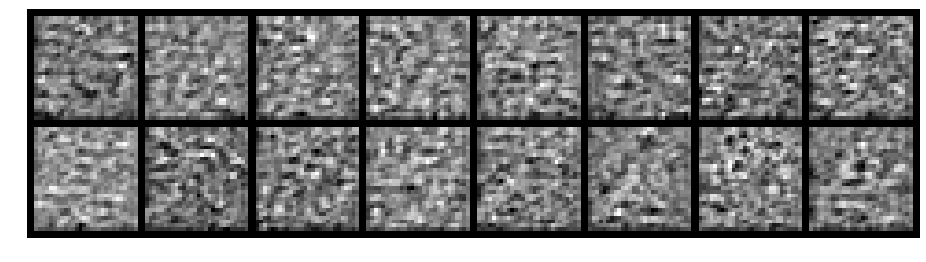

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3526, Generator Loss: 0.6429
D(x): 0.5442, D(G(z)): 0.5247


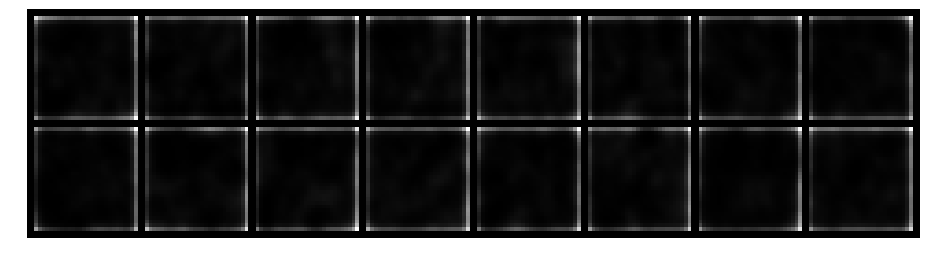

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 0.7250, Generator Loss: 0.6769
D(x): 0.9819, D(G(z)): 0.5058


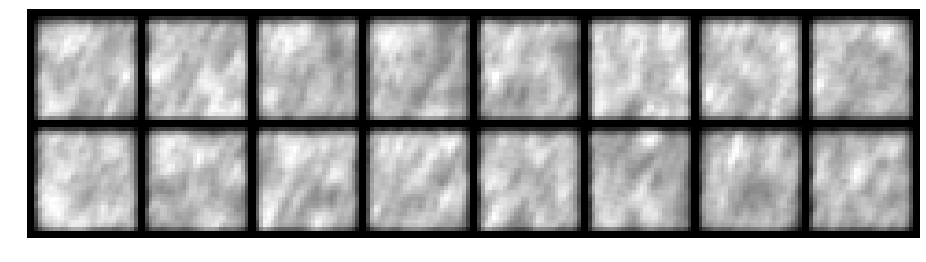

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 4.0278, Generator Loss: 0.0628
D(x): 0.6975, D(G(z)): 0.9695


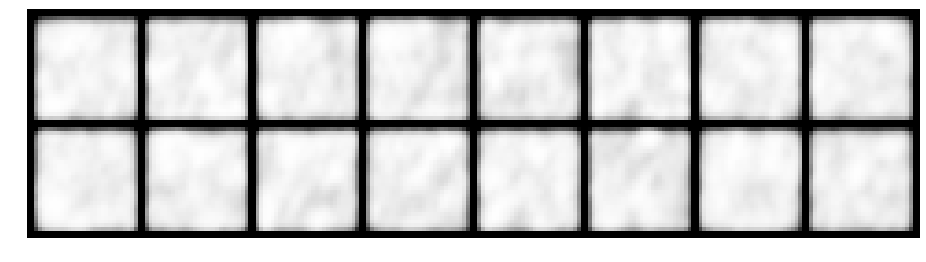

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.5297, Generator Loss: 1.0601
D(x): 0.9990, D(G(z)): 0.3939


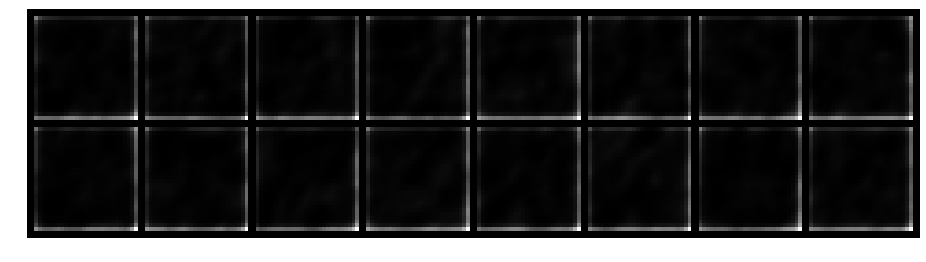

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 1.5123, Generator Loss: 1.0162
D(x): 0.4182, D(G(z)): 0.4132


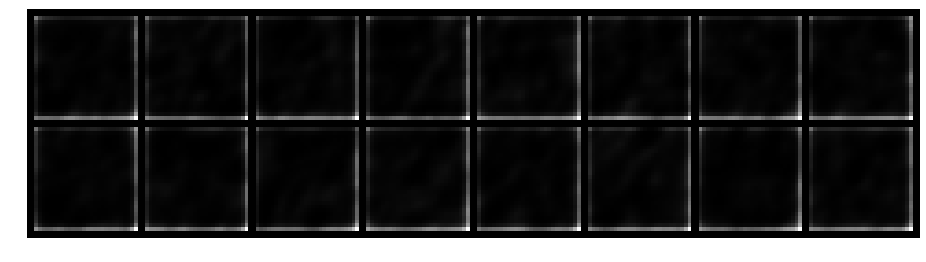

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.8723, Generator Loss: 0.7862
D(x): 0.8021, D(G(z)): 0.4651


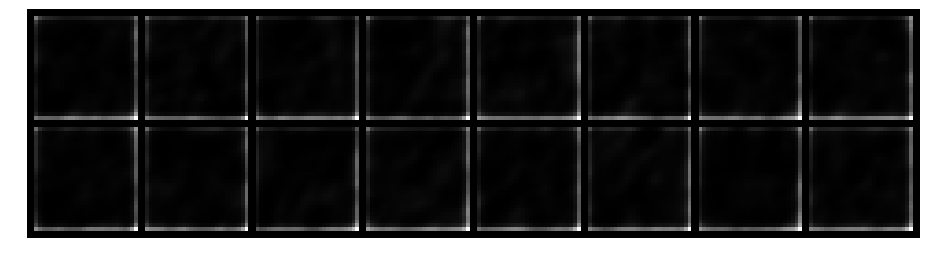

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.5838, Generator Loss: 1.0227
D(x): 0.9406, D(G(z)): 0.3892


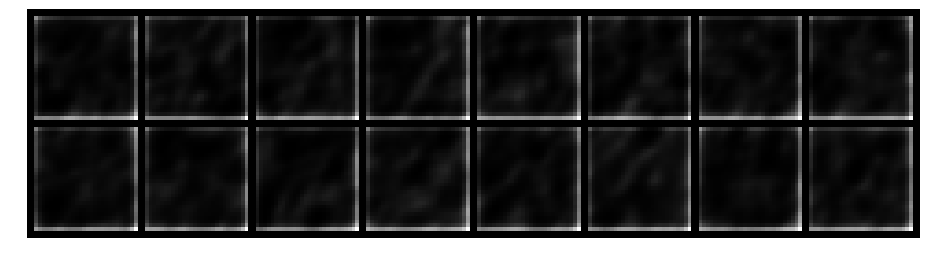

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.4359, Generator Loss: 1.3045
D(x): 0.9732, D(G(z)): 0.2990


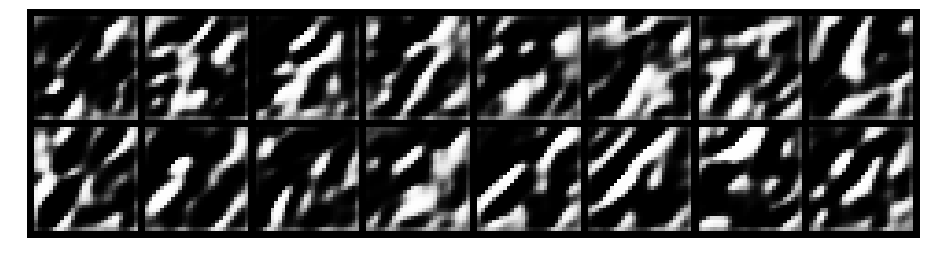

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 1.0962, Generator Loss: 0.6093
D(x): 0.7749, D(G(z)): 0.5234


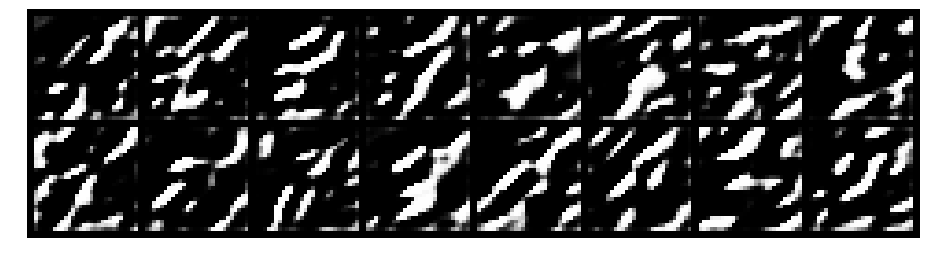

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.1614, Generator Loss: 0.7877
D(x): 0.6618, D(G(z)): 0.4847


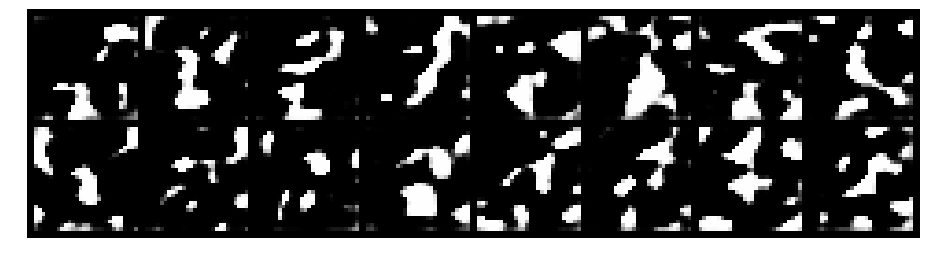

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 1.4005, Generator Loss: 0.7648
D(x): 0.5140, D(G(z)): 0.4797


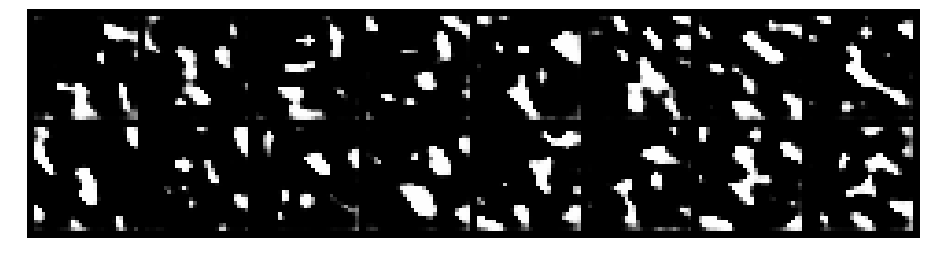

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.4030, Generator Loss: 0.8198
D(x): 0.4533, D(G(z)): 0.4445


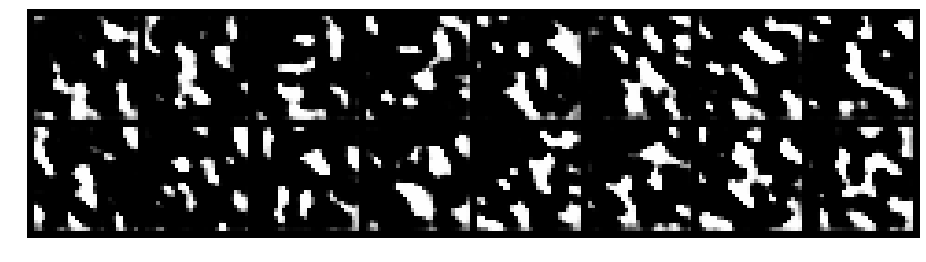

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.2481, Generator Loss: 0.7182
D(x): 0.5886, D(G(z)): 0.4966


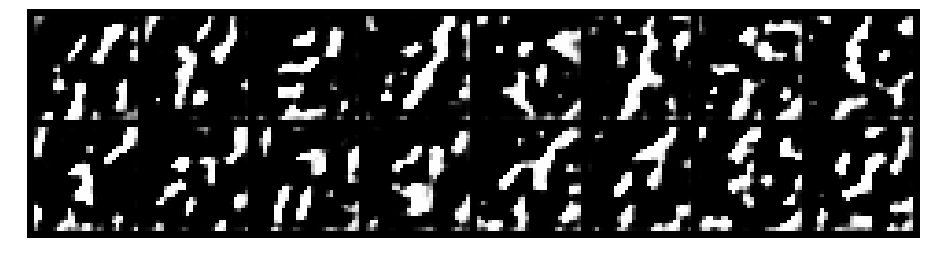

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.2287, Generator Loss: 0.7016
D(x): 0.6346, D(G(z)): 0.5107


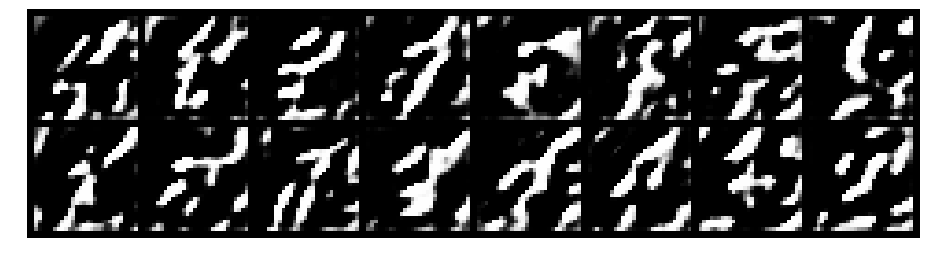

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 1.3994, Generator Loss: 0.7484
D(x): 0.5362, D(G(z)): 0.4759


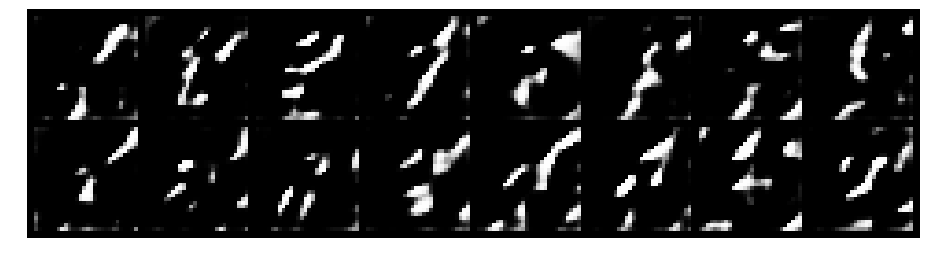

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 1.4078, Generator Loss: 0.7805
D(x): 0.4532, D(G(z)): 0.4530


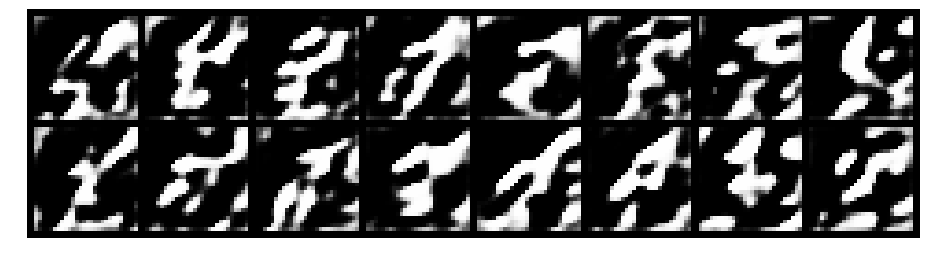

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 1.5004, Generator Loss: 0.8326
D(x): 0.4339, D(G(z)): 0.4624


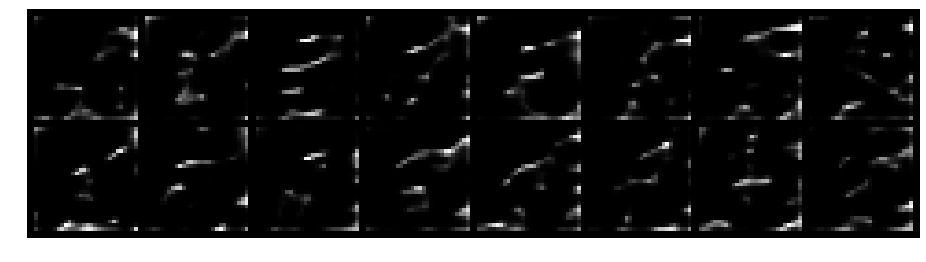

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 1.4454, Generator Loss: 0.7554
D(x): 0.4563, D(G(z)): 0.4720


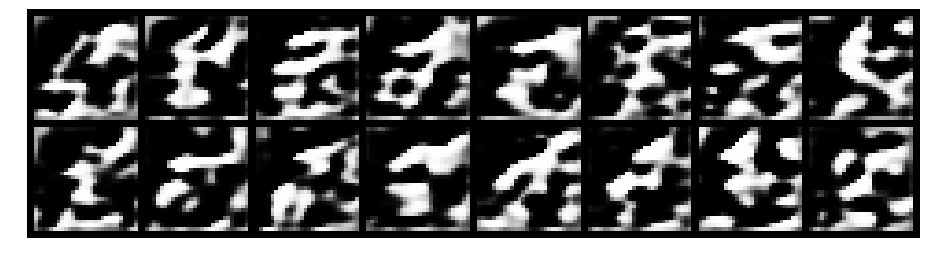

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.5329, Generator Loss: 0.8911
D(x): 0.4210, D(G(z)): 0.4507


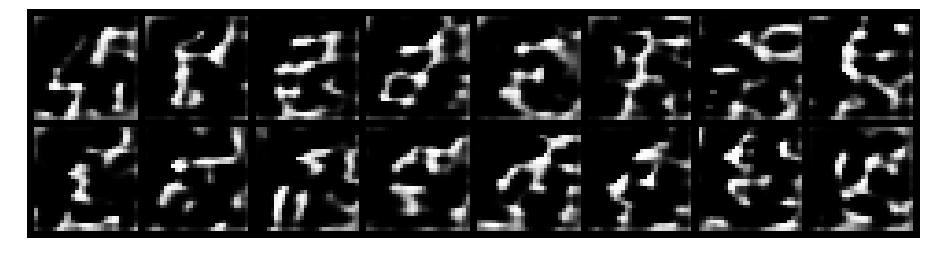

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 1.4217, Generator Loss: 0.7257
D(x): 0.4818, D(G(z)): 0.4862


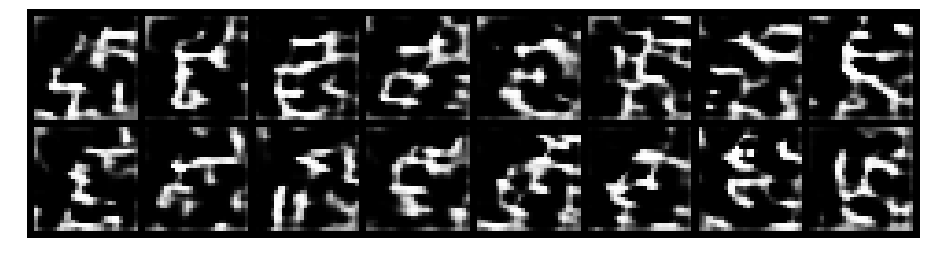

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 1.4314, Generator Loss: 0.7175
D(x): 0.4681, D(G(z)): 0.4850


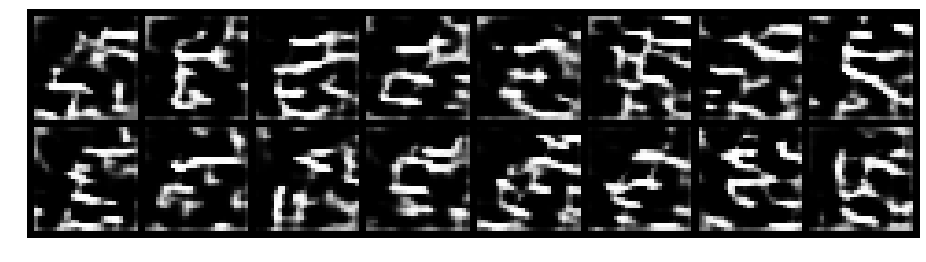

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 1.2793, Generator Loss: 0.6646
D(x): 0.5824, D(G(z)): 0.5140


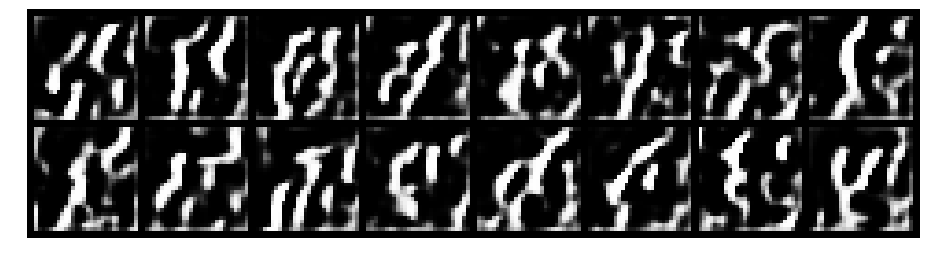

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 1.3395, Generator Loss: 0.6920
D(x): 0.5462, D(G(z)): 0.5076


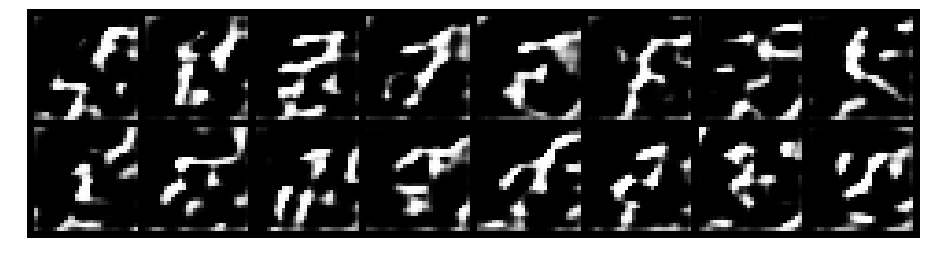

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 1.3216, Generator Loss: 0.7258
D(x): 0.5589, D(G(z)): 0.5076


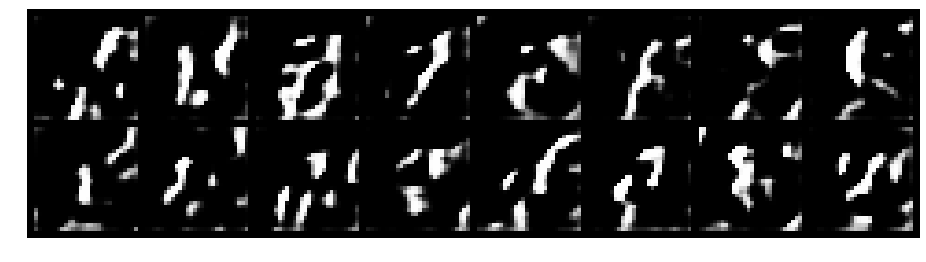

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 1.2334, Generator Loss: 0.6905
D(x): 0.6209, D(G(z)): 0.5051


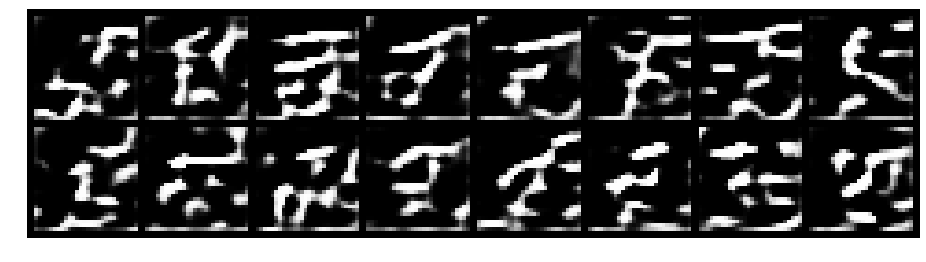

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 1.1745, Generator Loss: 0.7773
D(x): 0.5939, D(G(z)): 0.4708


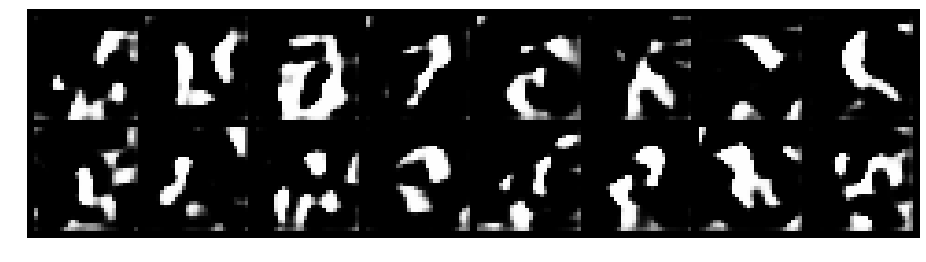

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 1.4022, Generator Loss: 0.7652
D(x): 0.4820, D(G(z)): 0.4649


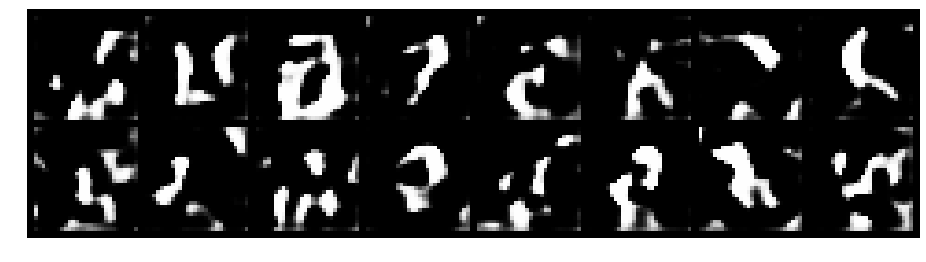

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 1.2273, Generator Loss: 0.7198
D(x): 0.5807, D(G(z)): 0.4757


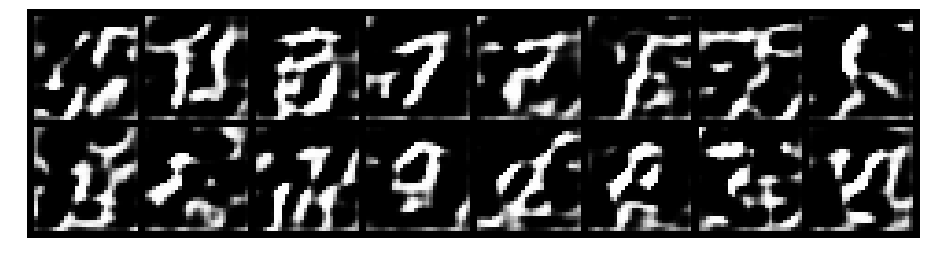

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 1.3113, Generator Loss: 0.7855
D(x): 0.5085, D(G(z)): 0.4527


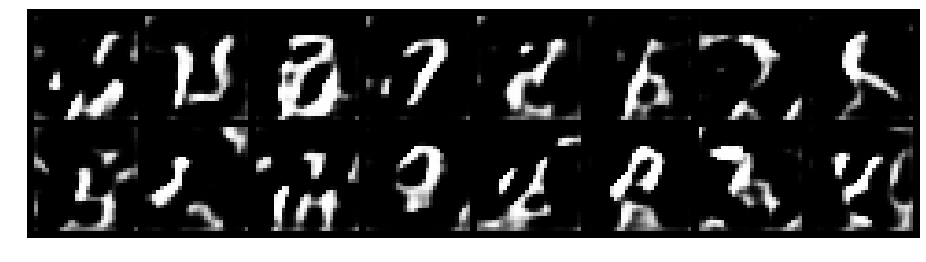

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 1.2865, Generator Loss: 0.7244
D(x): 0.5608, D(G(z)): 0.4868


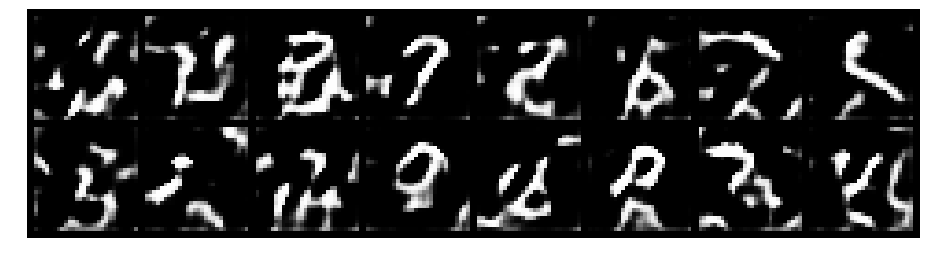

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 1.3093, Generator Loss: 0.7100
D(x): 0.5532, D(G(z)): 0.4947


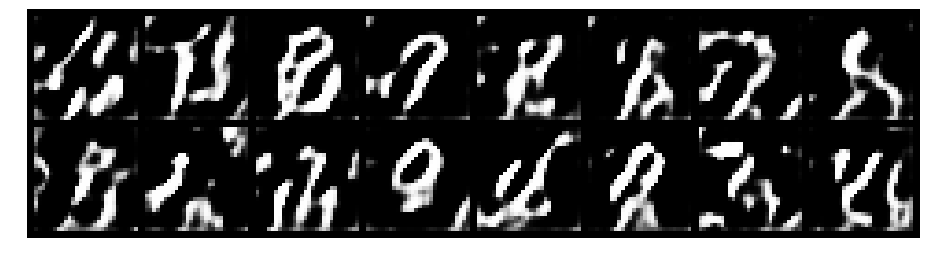

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 1.2968, Generator Loss: 0.6636
D(x): 0.5917, D(G(z)): 0.5260


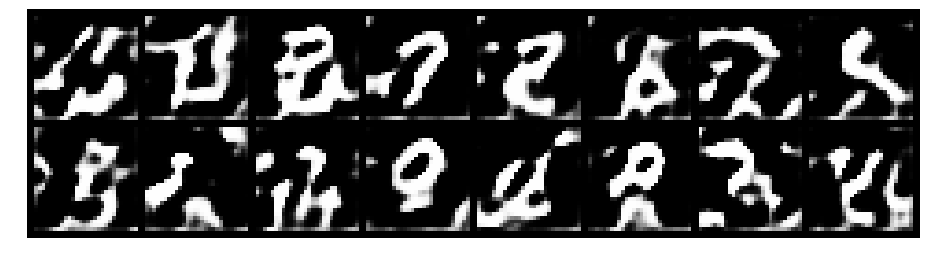

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 1.4483, Generator Loss: 0.8719
D(x): 0.4208, D(G(z)): 0.4204


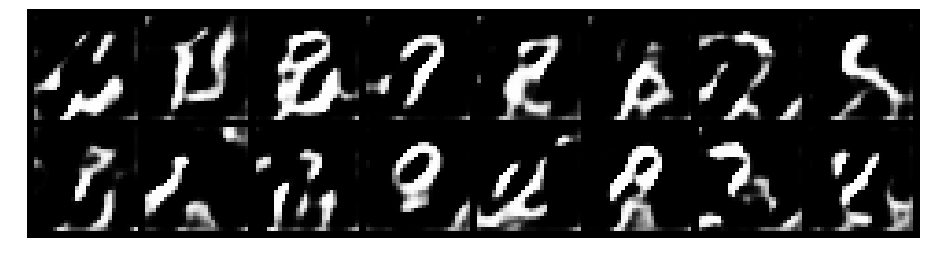

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 1.3093, Generator Loss: 0.8016
D(x): 0.6059, D(G(z)): 0.5101


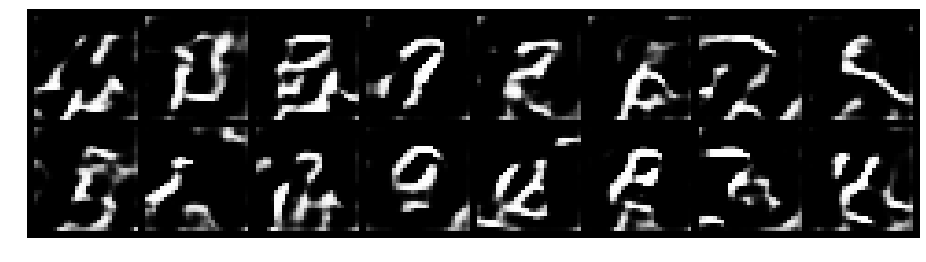

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 1.2428, Generator Loss: 0.8117
D(x): 0.5902, D(G(z)): 0.4767


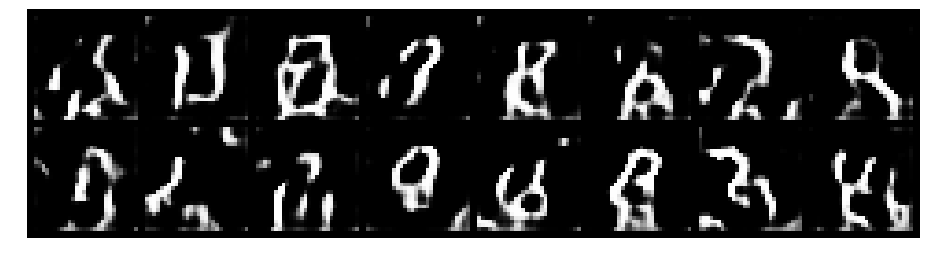

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 1.3483, Generator Loss: 0.7668
D(x): 0.5004, D(G(z)): 0.4644


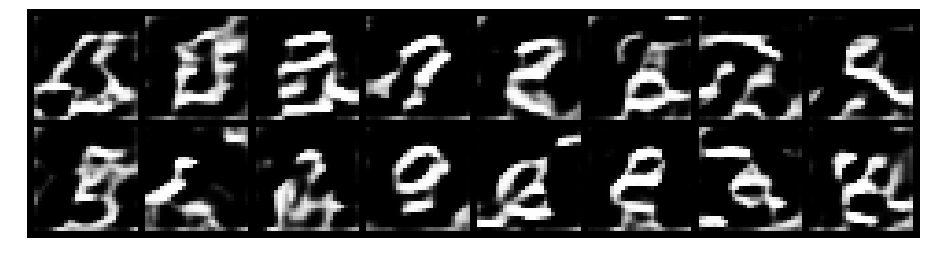

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 1.3385, Generator Loss: 0.8058
D(x): 0.5320, D(G(z)): 0.4741


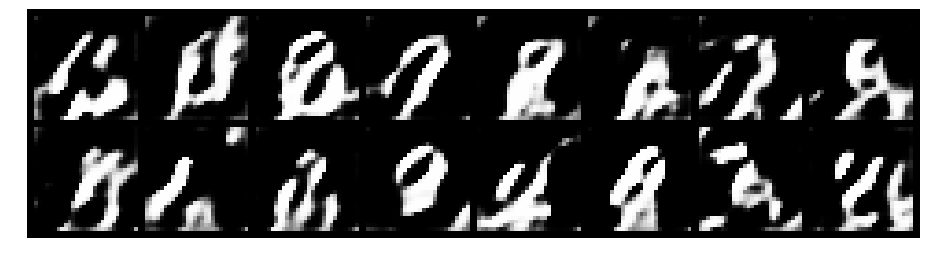

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 1.3946, Generator Loss: 0.7526
D(x): 0.4762, D(G(z)): 0.4629


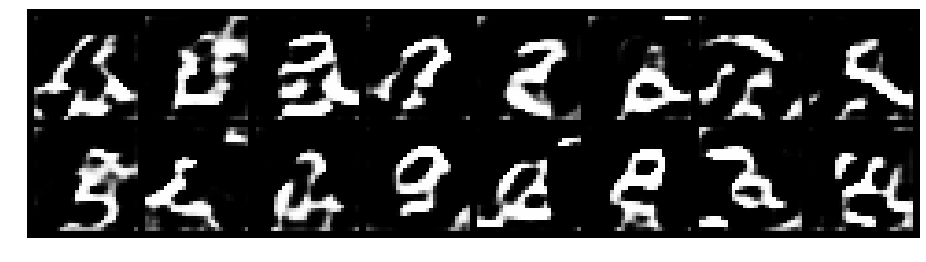

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 1.2183, Generator Loss: 0.7669
D(x): 0.6503, D(G(z)): 0.4948


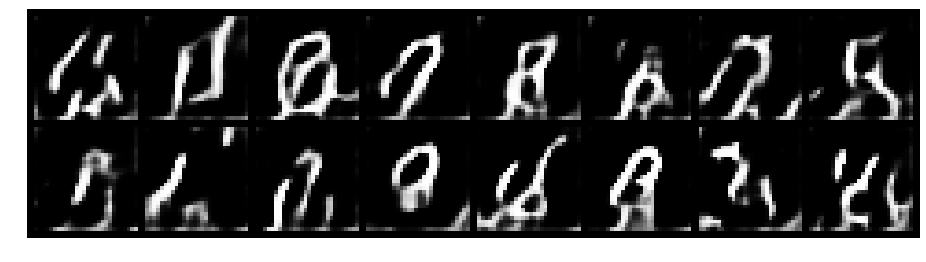

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 1.4186, Generator Loss: 0.8174
D(x): 0.4643, D(G(z)): 0.4584


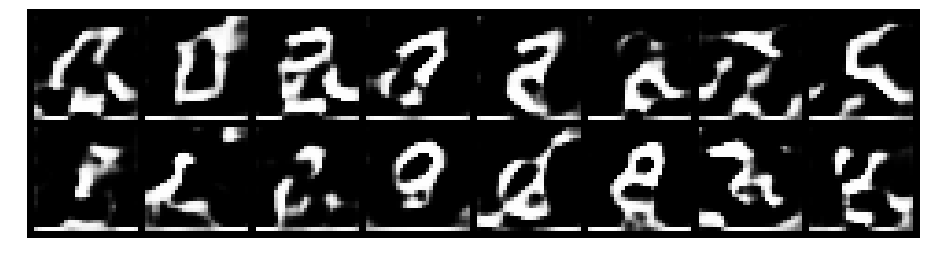

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 1.2885, Generator Loss: 0.7328
D(x): 0.5638, D(G(z)): 0.4802


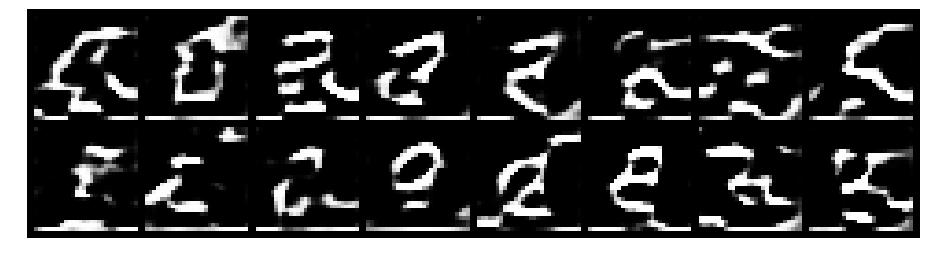

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 1.0111, Generator Loss: 0.8597
D(x): 0.6951, D(G(z)): 0.4300


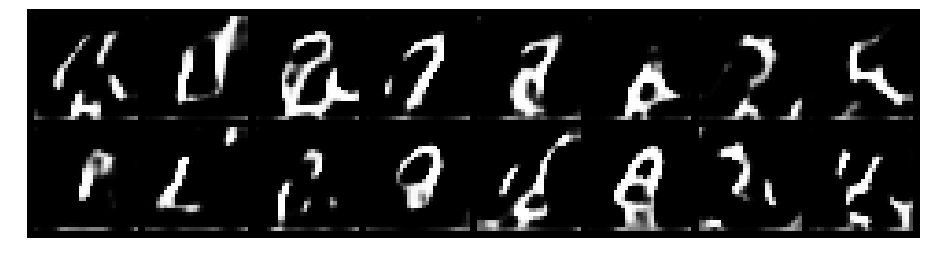

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 1.3687, Generator Loss: 0.7818
D(x): 0.4917, D(G(z)): 0.4687


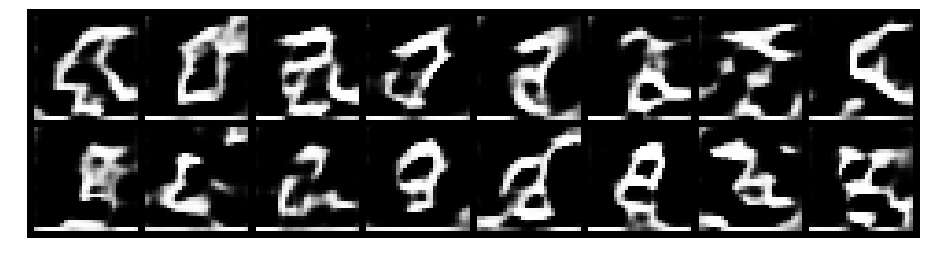

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 1.1787, Generator Loss: 0.7692
D(x): 0.6022, D(G(z)): 0.4560


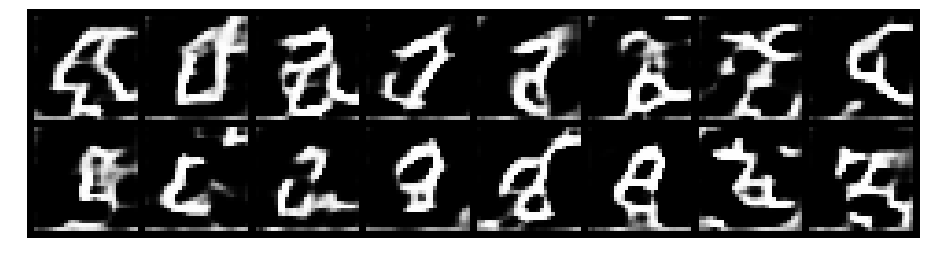

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 1.2172, Generator Loss: 0.7354
D(x): 0.6134, D(G(z)): 0.4822


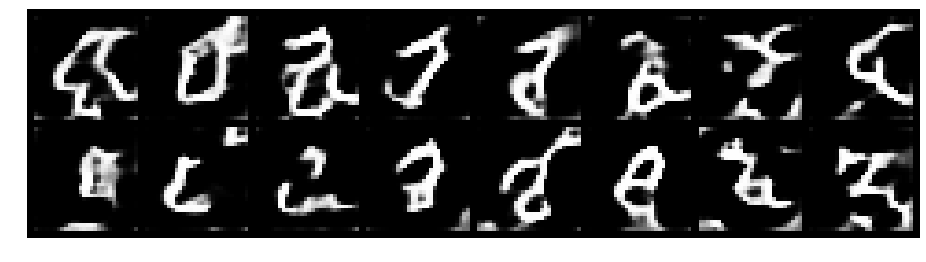

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 1.1747, Generator Loss: 0.6901
D(x): 0.6611, D(G(z)): 0.4977


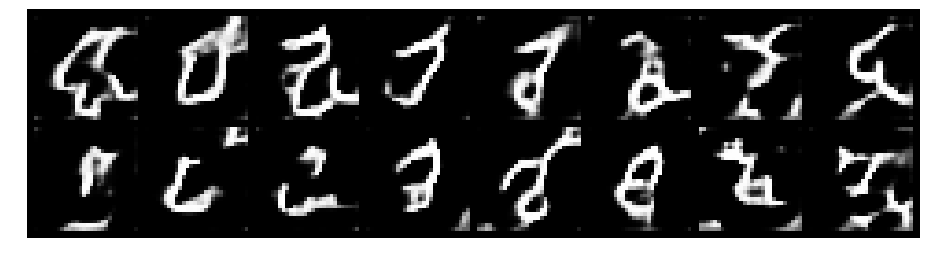

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 1.1599, Generator Loss: 0.7975
D(x): 0.6060, D(G(z)): 0.4406


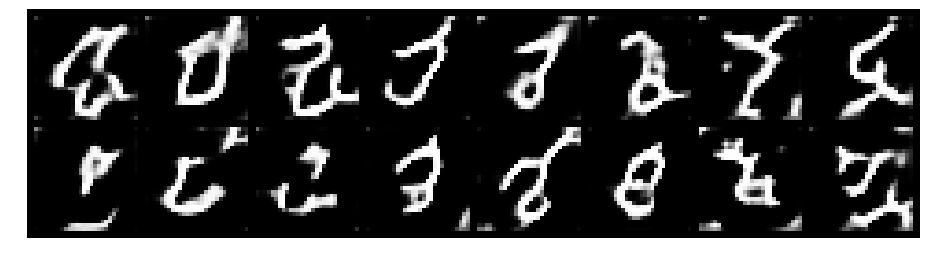

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 1.1538, Generator Loss: 0.8133
D(x): 0.6179, D(G(z)): 0.4514


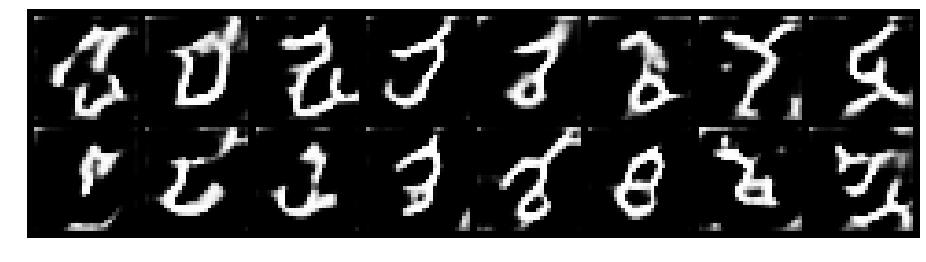

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 1.2908, Generator Loss: 0.9078
D(x): 0.5605, D(G(z)): 0.4712


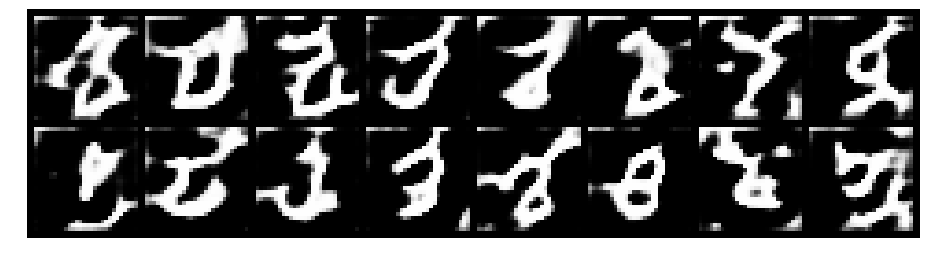

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 1.0238, Generator Loss: 0.8858
D(x): 0.7070, D(G(z)): 0.4501


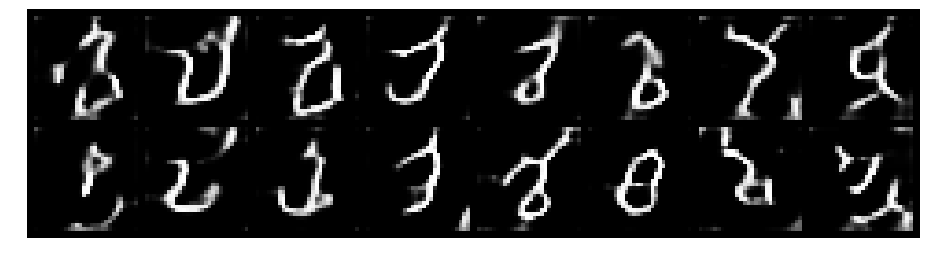

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 1.4789, Generator Loss: 0.7843
D(x): 0.4543, D(G(z)): 0.4635


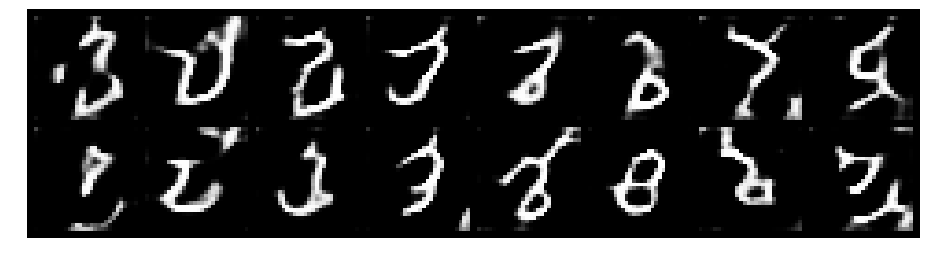

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 1.2124, Generator Loss: 0.7670
D(x): 0.6216, D(G(z)): 0.4836


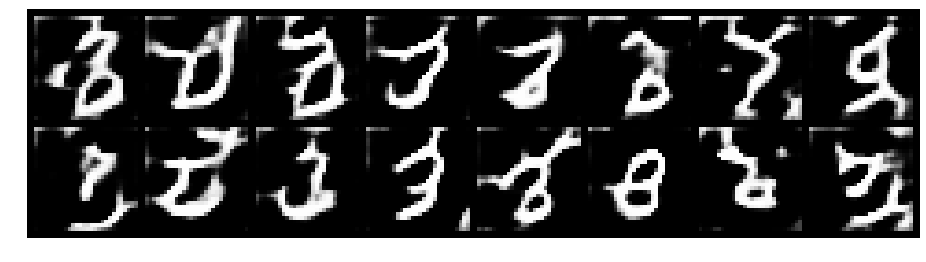

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 1.3037, Generator Loss: 0.7725
D(x): 0.5326, D(G(z)): 0.4612


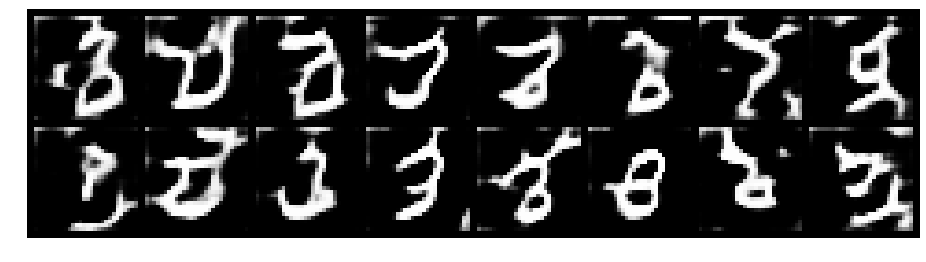

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 1.1711, Generator Loss: 0.7609
D(x): 0.6406, D(G(z)): 0.4849


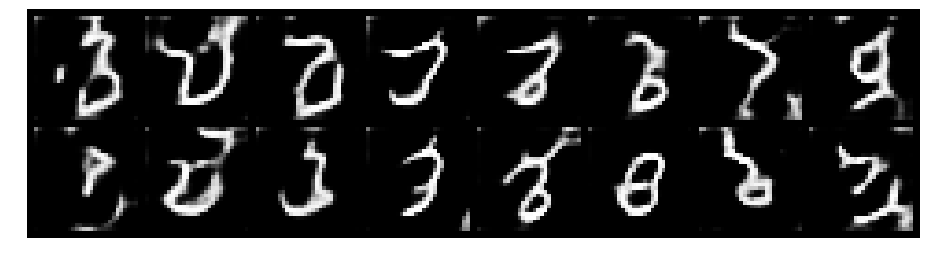

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 1.2942, Generator Loss: 0.8129
D(x): 0.5357, D(G(z)): 0.4617


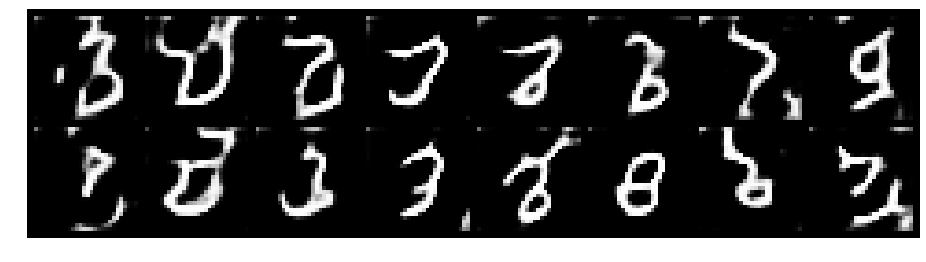

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 1.1682, Generator Loss: 0.7357
D(x): 0.6484, D(G(z)): 0.4882


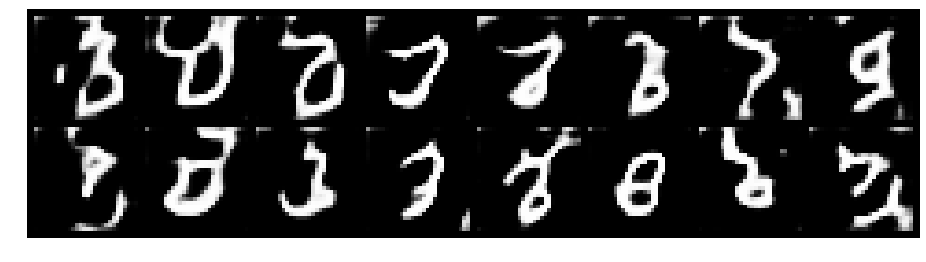

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 1.0414, Generator Loss: 0.7932
D(x): 0.6995, D(G(z)): 0.4641


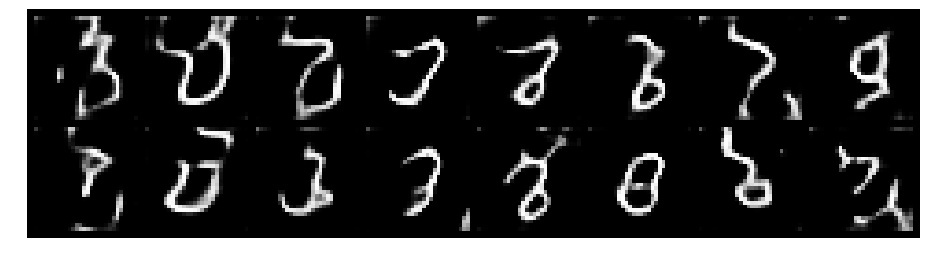

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 1.2860, Generator Loss: 0.8396
D(x): 0.5601, D(G(z)): 0.4671


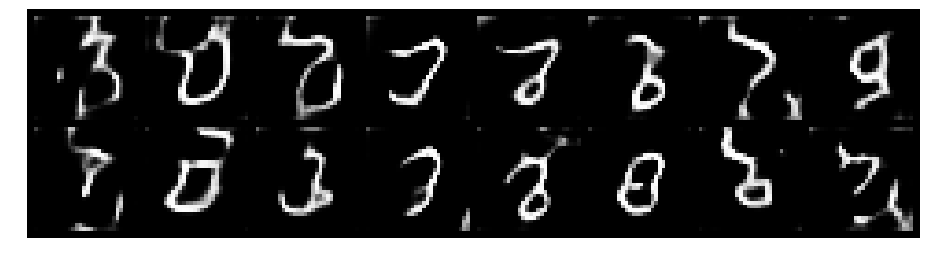

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 1.2344, Generator Loss: 0.7981
D(x): 0.5702, D(G(z)): 0.4545


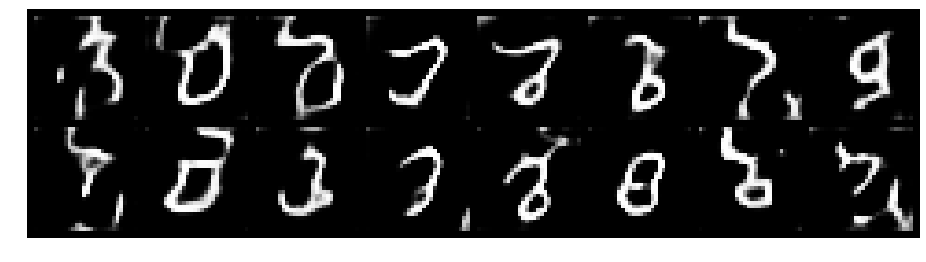

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 1.2850, Generator Loss: 0.8247
D(x): 0.5559, D(G(z)): 0.4582


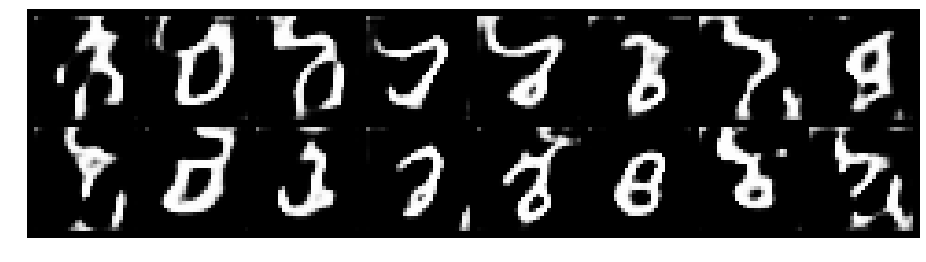

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 1.1316, Generator Loss: 0.7550
D(x): 0.6533, D(G(z)): 0.4783


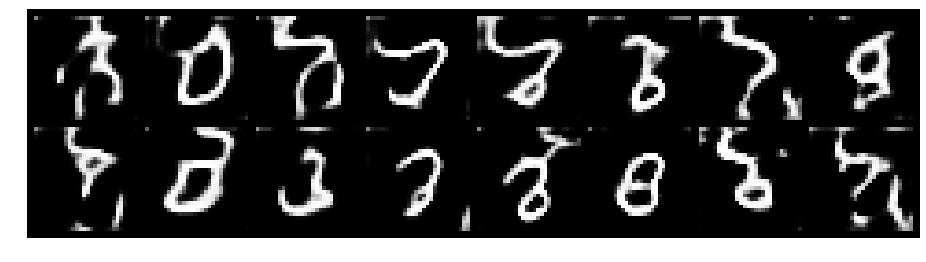

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 1.2612, Generator Loss: 0.8105
D(x): 0.5747, D(G(z)): 0.4577


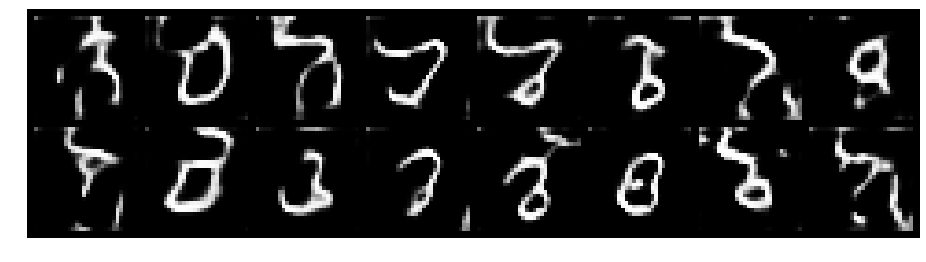

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 1.2143, Generator Loss: 0.8629
D(x): 0.5674, D(G(z)): 0.4274


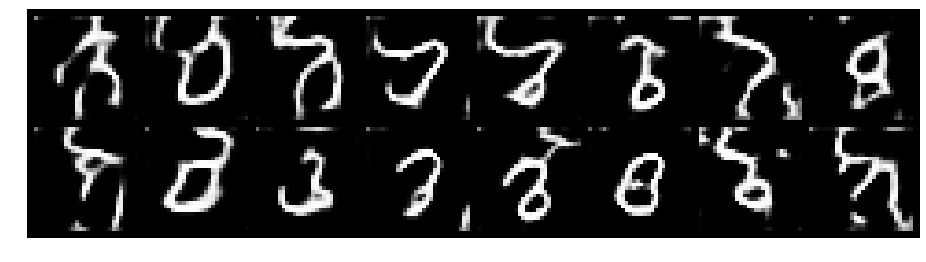

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 1.1226, Generator Loss: 0.8510
D(x): 0.6567, D(G(z)): 0.4492


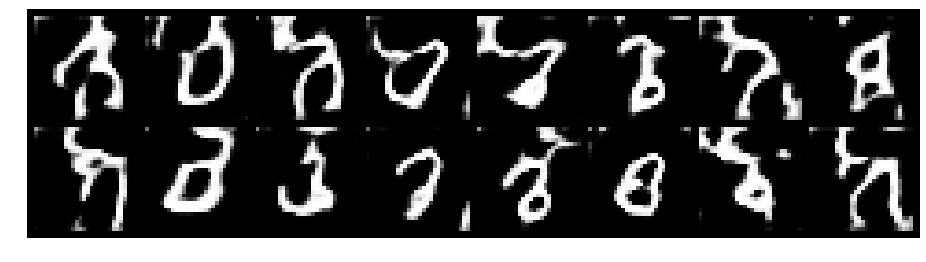

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 1.1081, Generator Loss: 0.8809
D(x): 0.7177, D(G(z)): 0.4727


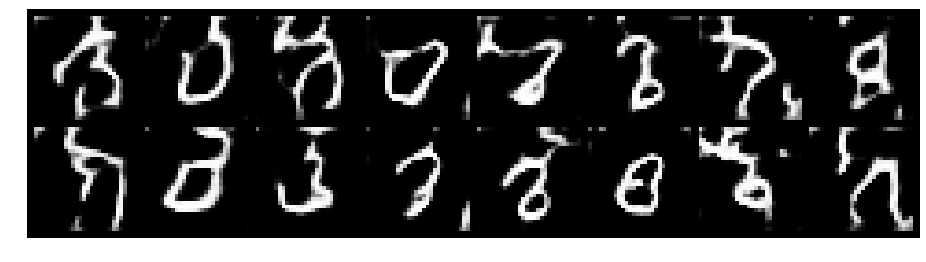

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 1.0997, Generator Loss: 0.9192
D(x): 0.6704, D(G(z)): 0.4347


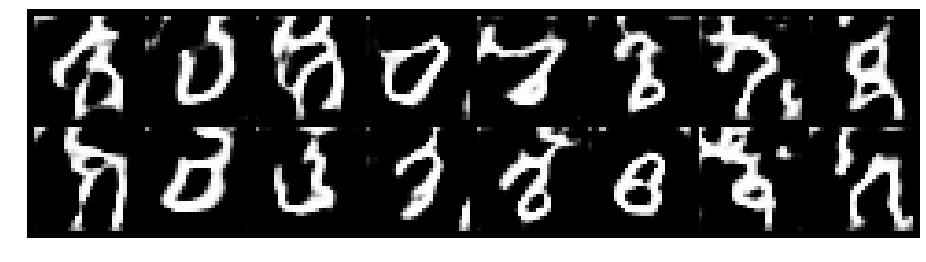

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 1.0669, Generator Loss: 0.8436
D(x): 0.6974, D(G(z)): 0.4643


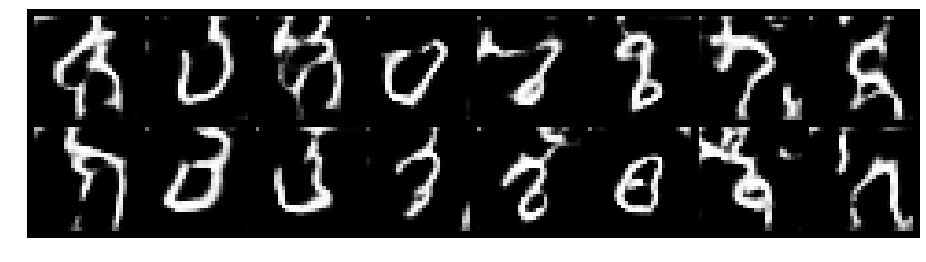

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 1.0977, Generator Loss: 0.8692
D(x): 0.6812, D(G(z)): 0.4521


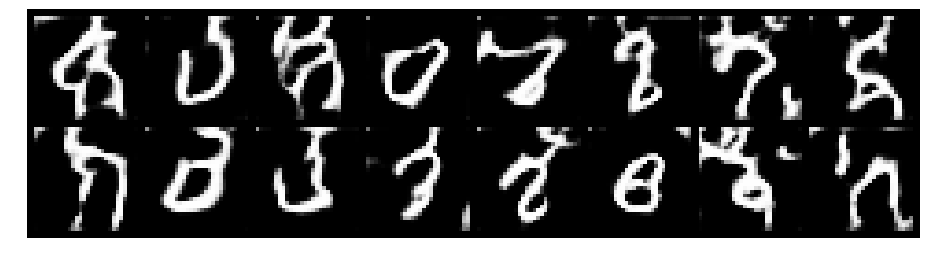

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 1.0673, Generator Loss: 0.9054
D(x): 0.6711, D(G(z)): 0.4305


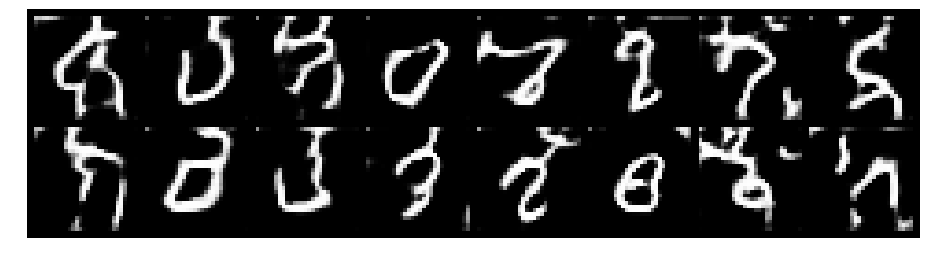

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 1.0121, Generator Loss: 0.8748
D(x): 0.7301, D(G(z)): 0.4299


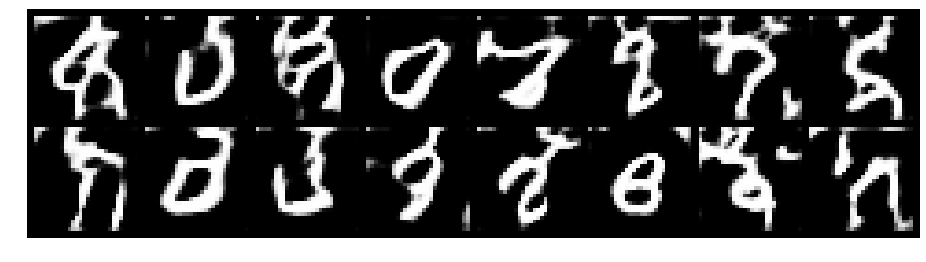

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 1.0596, Generator Loss: 0.9943
D(x): 0.6140, D(G(z)): 0.3719


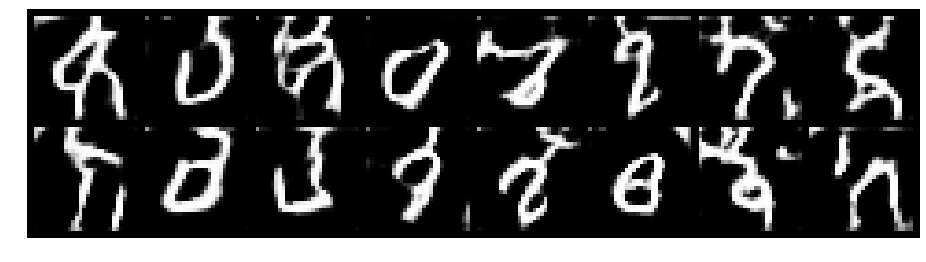

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 1.0875, Generator Loss: 0.9033
D(x): 0.6471, D(G(z)): 0.4049


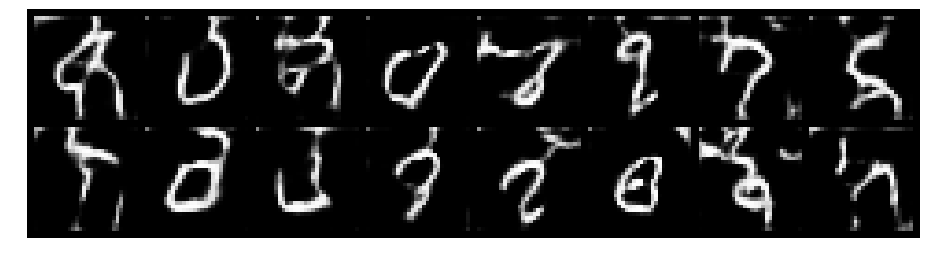

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 1.1712, Generator Loss: 0.9426
D(x): 0.6023, D(G(z)): 0.4137


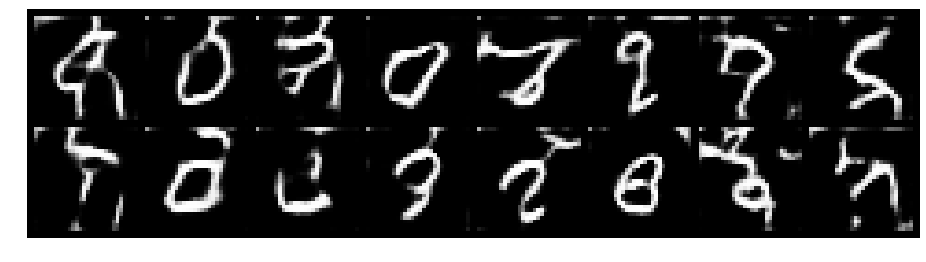

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.9704, Generator Loss: 1.0328
D(x): 0.7022, D(G(z)): 0.3999


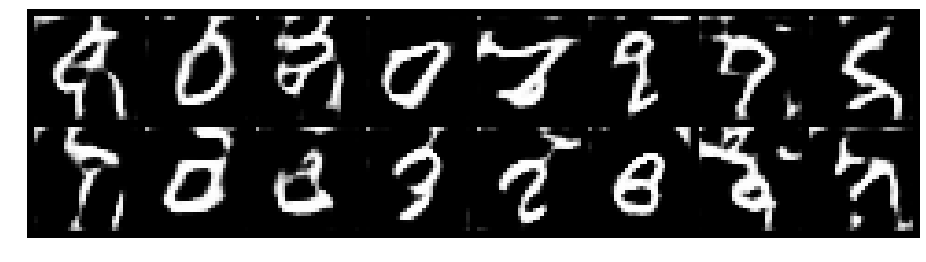

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 1.1070, Generator Loss: 1.0311
D(x): 0.5994, D(G(z)): 0.3910


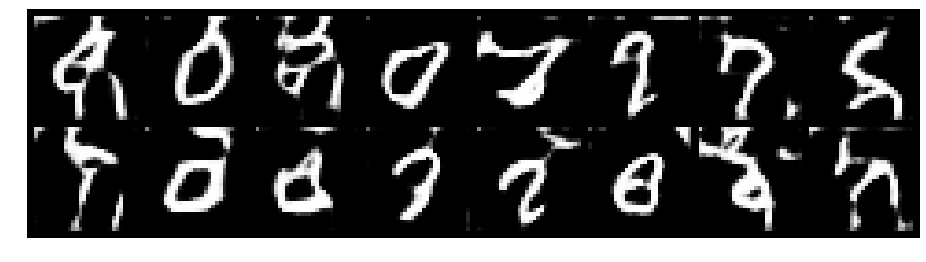

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.9864, Generator Loss: 0.8755
D(x): 0.7010, D(G(z)): 0.4070


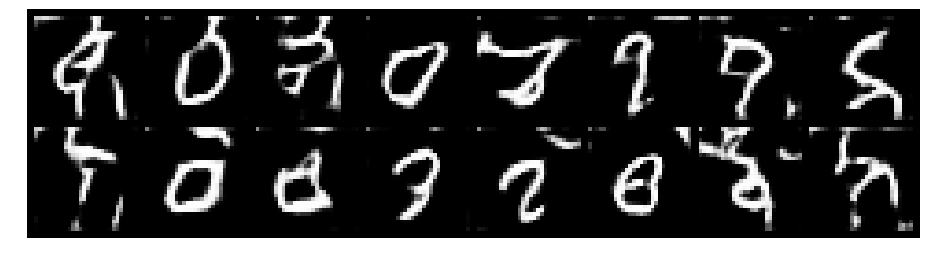

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 1.0269, Generator Loss: 0.9994
D(x): 0.6548, D(G(z)): 0.3920


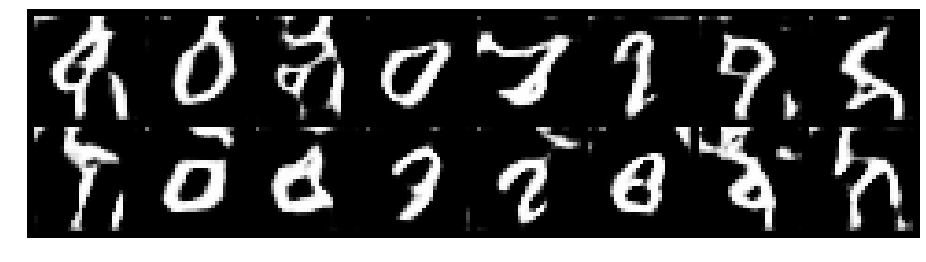

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.8986, Generator Loss: 1.0262
D(x): 0.7508, D(G(z)): 0.3807


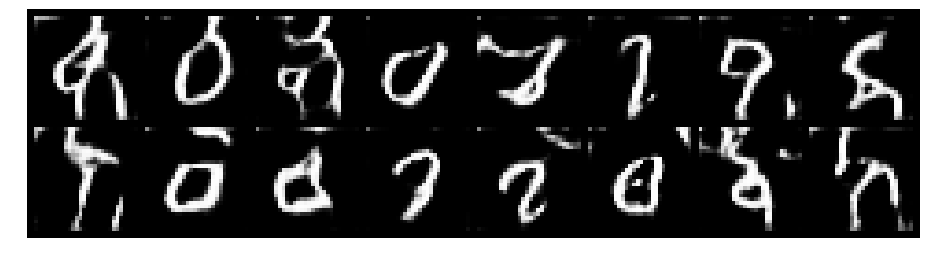

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 1.0439, Generator Loss: 0.9680
D(x): 0.6569, D(G(z)): 0.3916


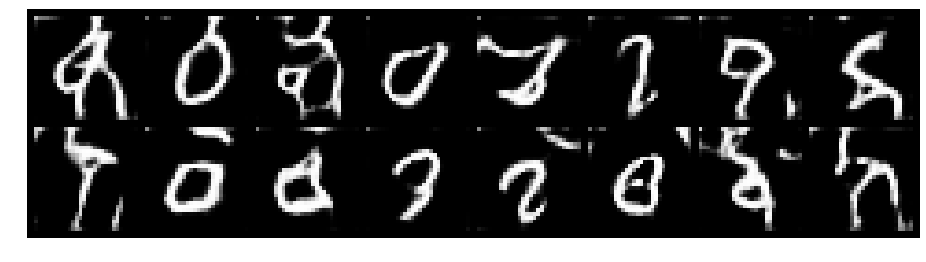

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 1.0605, Generator Loss: 0.8613
D(x): 0.6920, D(G(z)): 0.4450


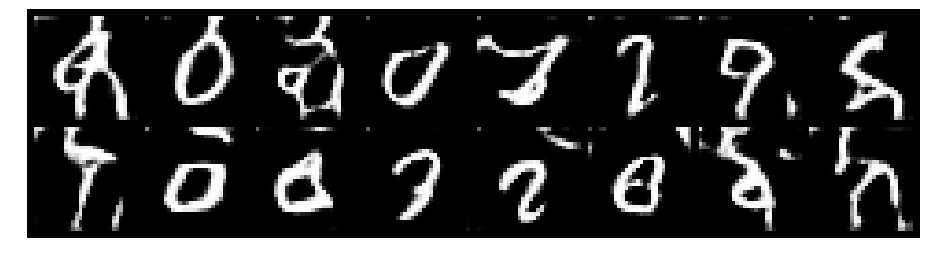

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 1.1810, Generator Loss: 0.9250
D(x): 0.6053, D(G(z)): 0.4181


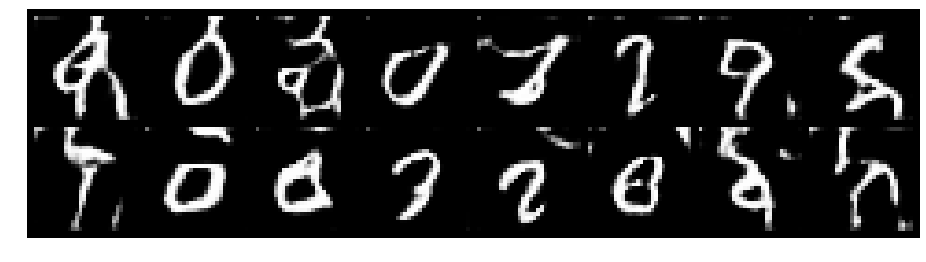

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.9852, Generator Loss: 0.8757
D(x): 0.7014, D(G(z)): 0.4087


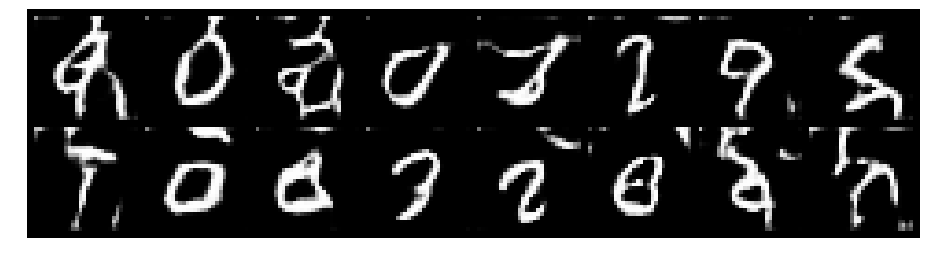

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 1.0683, Generator Loss: 1.0390
D(x): 0.6724, D(G(z)): 0.4126


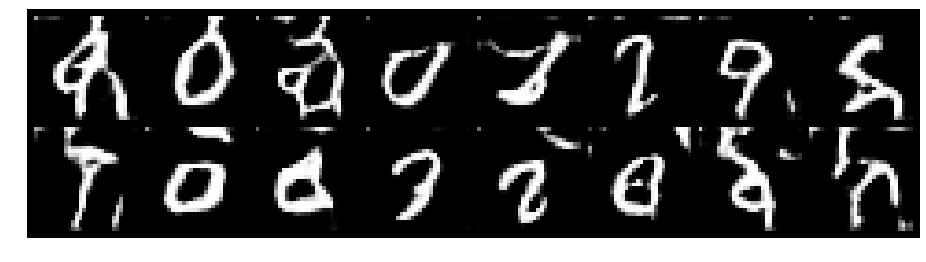

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 1.0260, Generator Loss: 0.9823
D(x): 0.6777, D(G(z)): 0.4077


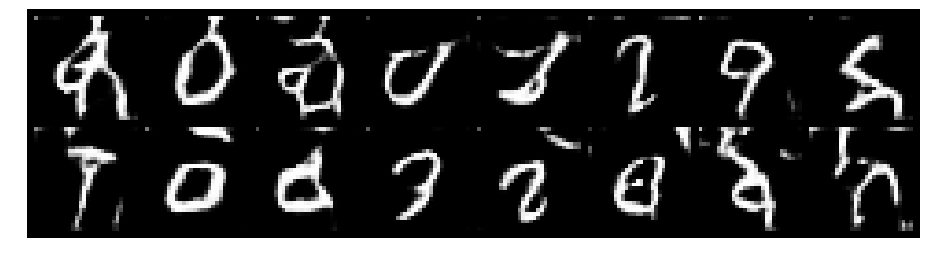

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.9694, Generator Loss: 0.9314
D(x): 0.6573, D(G(z)): 0.3771


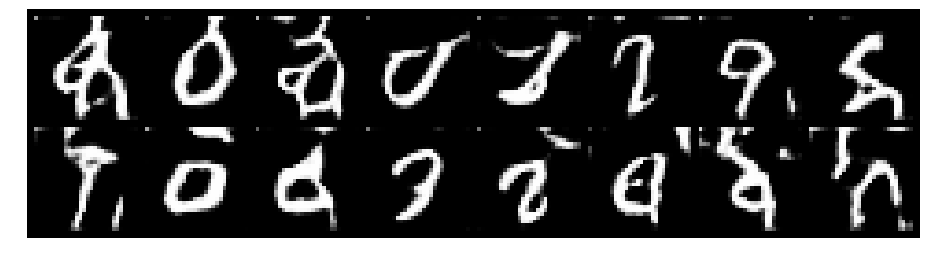

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 1.0997, Generator Loss: 0.9167
D(x): 0.7161, D(G(z)): 0.4519


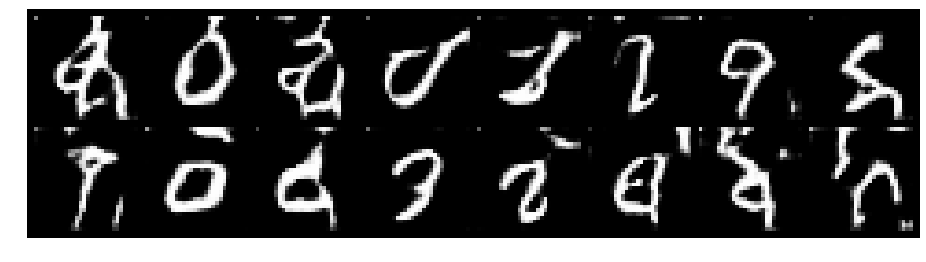

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 1.0719, Generator Loss: 0.8840
D(x): 0.6832, D(G(z)): 0.4217


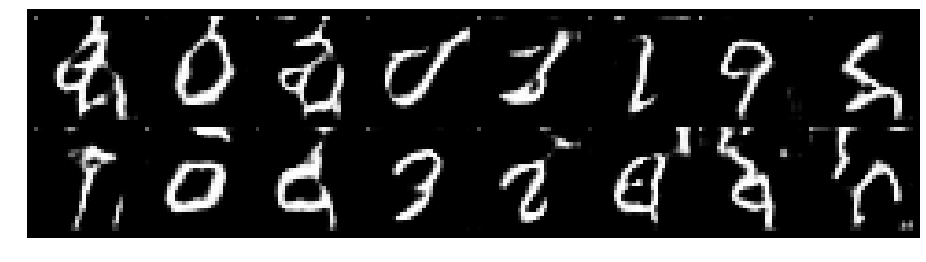

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 1.1194, Generator Loss: 1.0405
D(x): 0.6657, D(G(z)): 0.4236


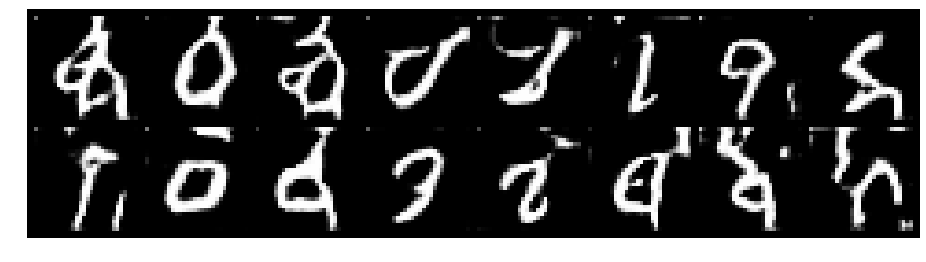

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 1.1743, Generator Loss: 0.9784
D(x): 0.6437, D(G(z)): 0.4392


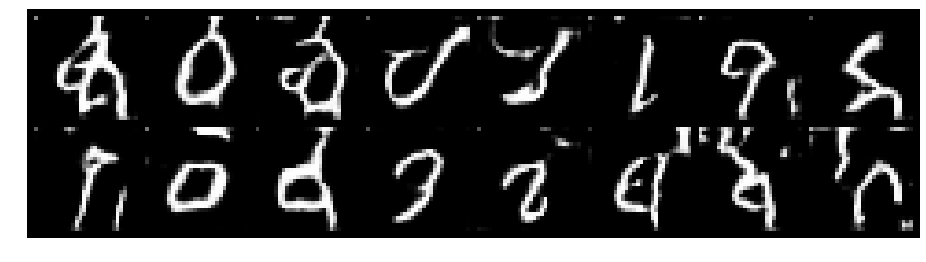

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 1.0187, Generator Loss: 0.9884
D(x): 0.6860, D(G(z)): 0.3856


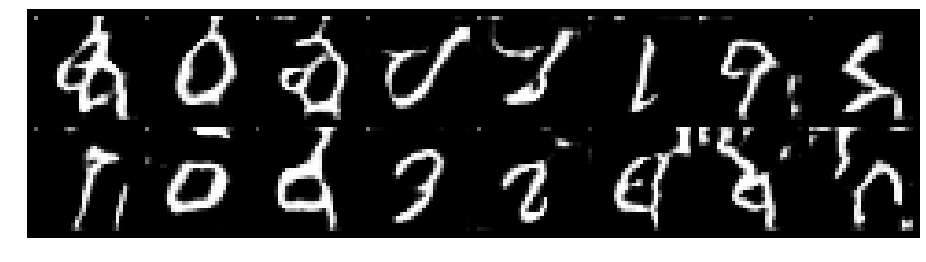

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 1.0975, Generator Loss: 0.9596
D(x): 0.6899, D(G(z)): 0.4275


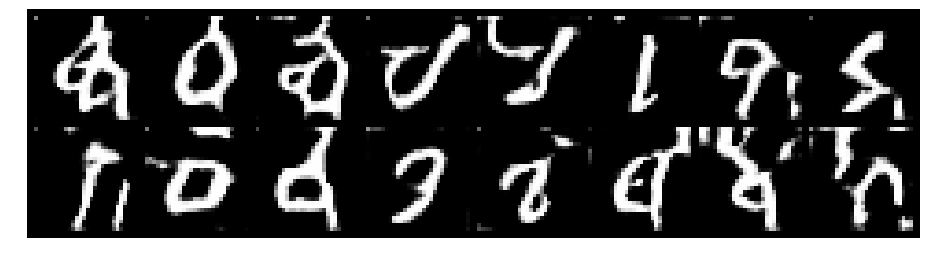

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.9983, Generator Loss: 1.0051
D(x): 0.6842, D(G(z)): 0.3938


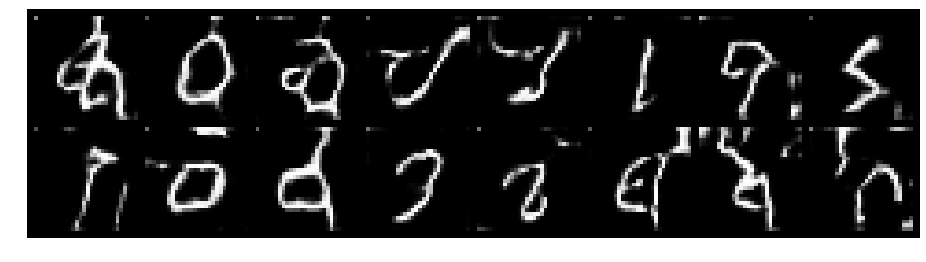

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 1.2020, Generator Loss: 1.1093
D(x): 0.5655, D(G(z)): 0.3786


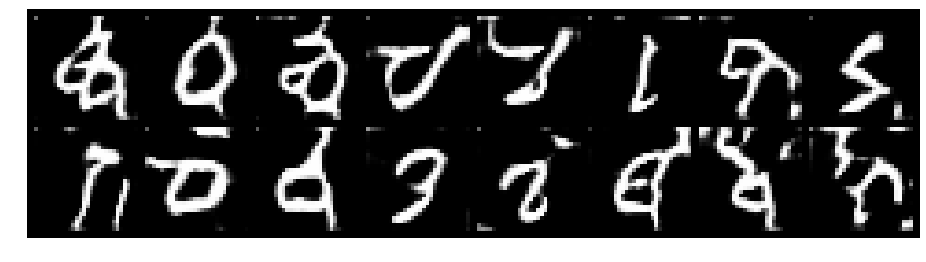

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 1.0239, Generator Loss: 1.0069
D(x): 0.6572, D(G(z)): 0.3969


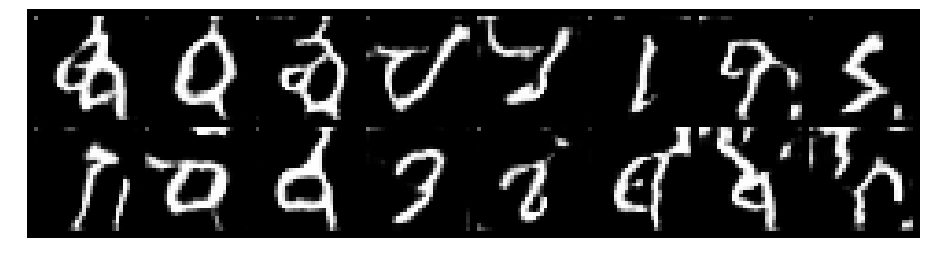

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 1.1211, Generator Loss: 1.0394
D(x): 0.5881, D(G(z)): 0.3622


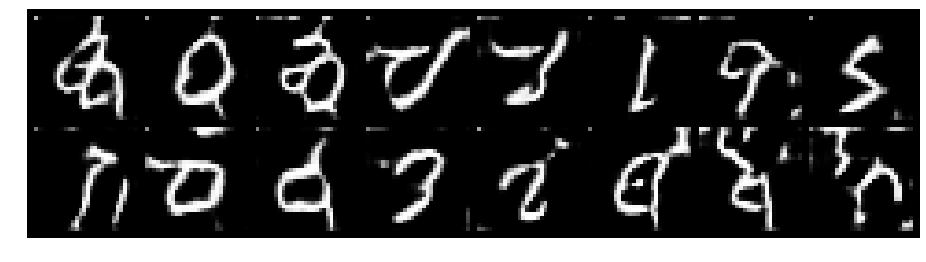

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 1.1270, Generator Loss: 0.9928
D(x): 0.5924, D(G(z)): 0.3663


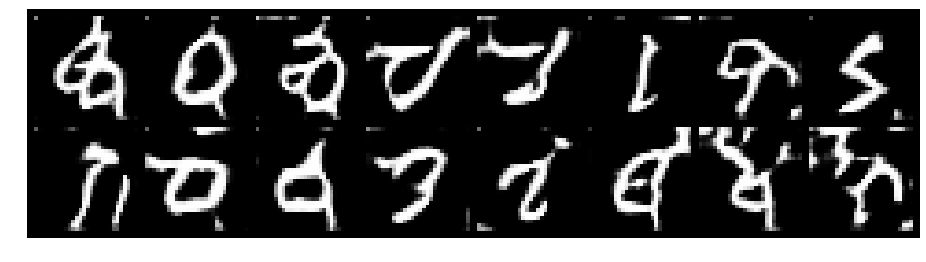

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 1.1622, Generator Loss: 0.8702
D(x): 0.6270, D(G(z)): 0.4287


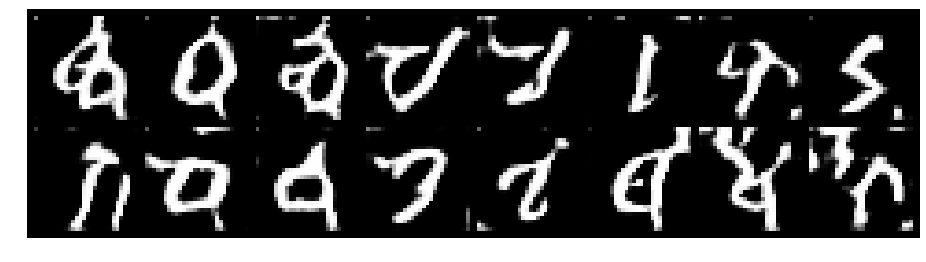

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 1.0618, Generator Loss: 0.9053
D(x): 0.6493, D(G(z)): 0.3954


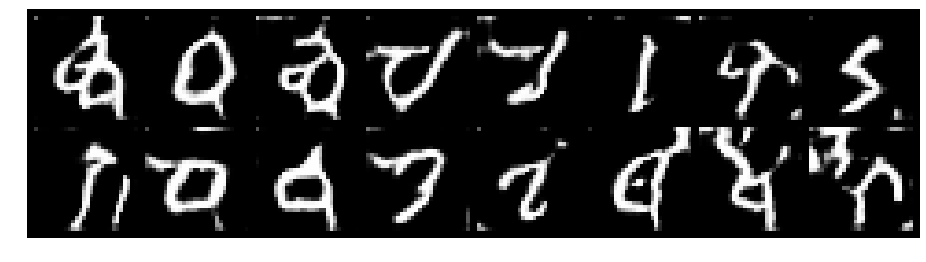

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 1.0637, Generator Loss: 0.9840
D(x): 0.6561, D(G(z)): 0.3998


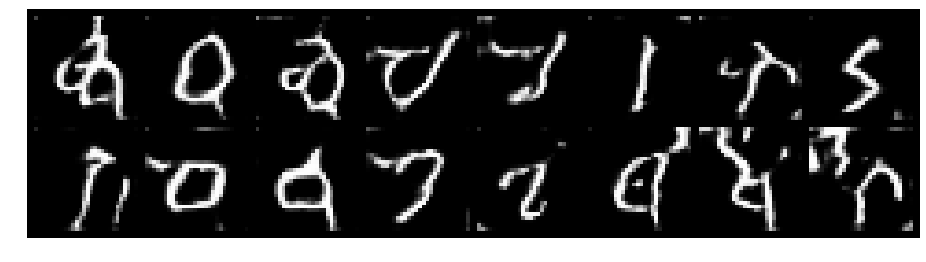

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 1.2722, Generator Loss: 1.0426
D(x): 0.5578, D(G(z)): 0.4184


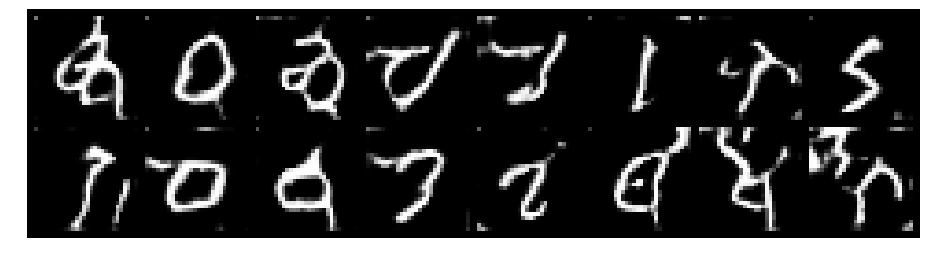

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 1.0728, Generator Loss: 0.9550
D(x): 0.6346, D(G(z)): 0.3948


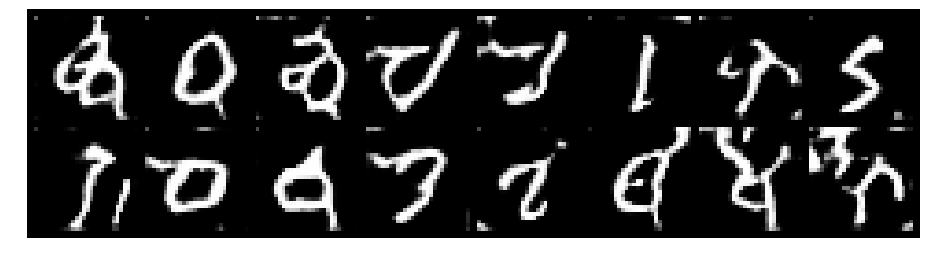

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 1.1213, Generator Loss: 0.9458
D(x): 0.6237, D(G(z)): 0.4041


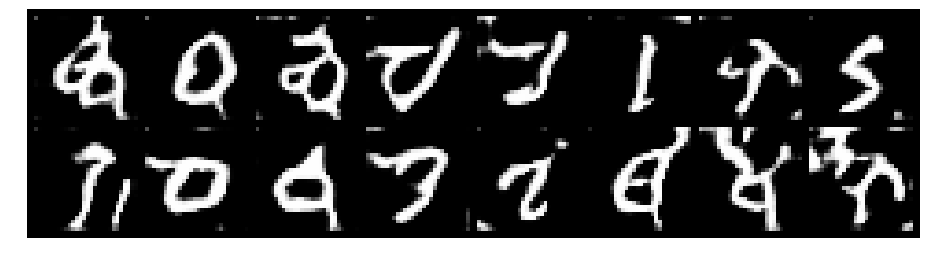

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 1.0014, Generator Loss: 0.9518
D(x): 0.6654, D(G(z)): 0.3789


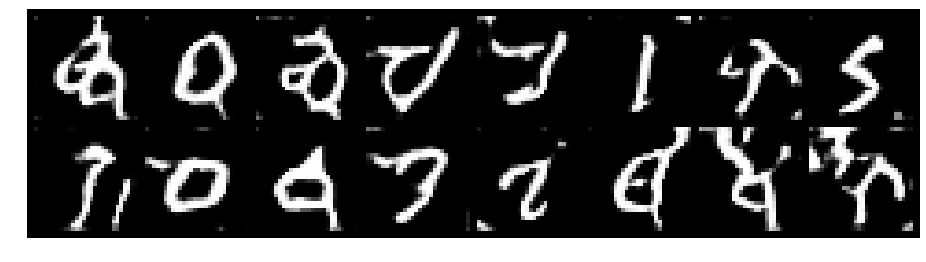

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 1.1461, Generator Loss: 0.8762
D(x): 0.6382, D(G(z)): 0.4324


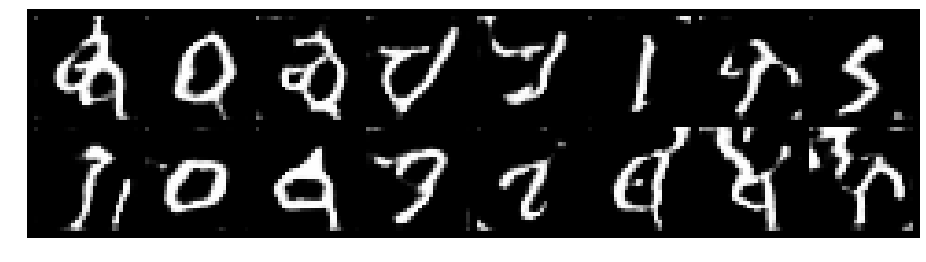

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 1.0415, Generator Loss: 0.9785
D(x): 0.6567, D(G(z)): 0.3842


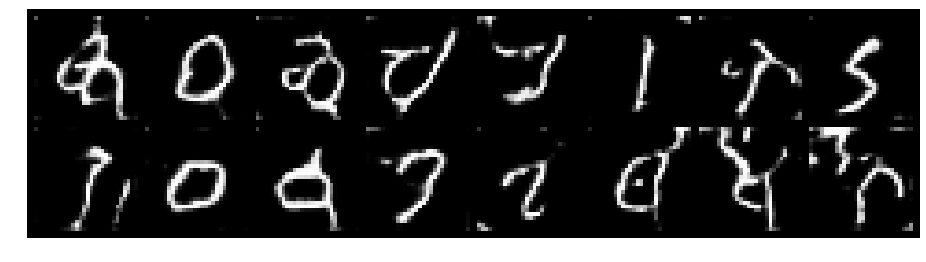

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 1.1236, Generator Loss: 1.0123
D(x): 0.5896, D(G(z)): 0.3832


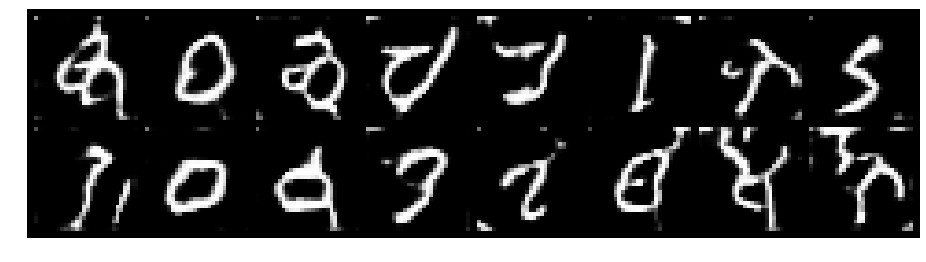

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 1.1082, Generator Loss: 0.9907
D(x): 0.6314, D(G(z)): 0.4047


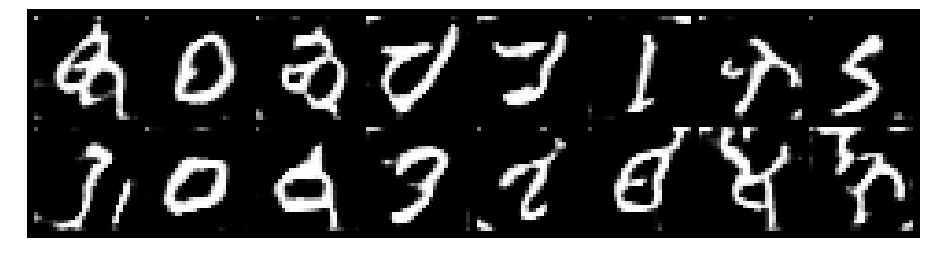

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 1.1100, Generator Loss: 1.0084
D(x): 0.6540, D(G(z)): 0.4144


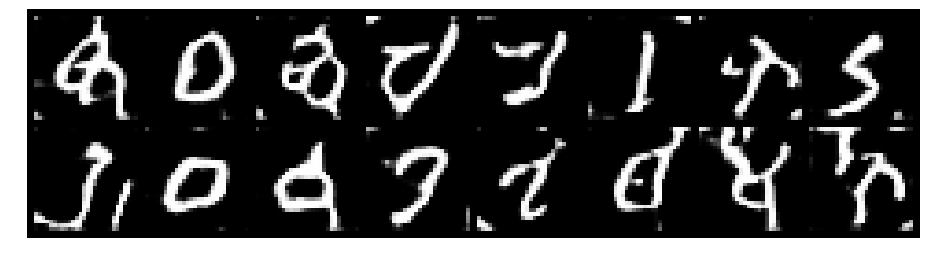

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.9705, Generator Loss: 1.0708
D(x): 0.6732, D(G(z)): 0.3688


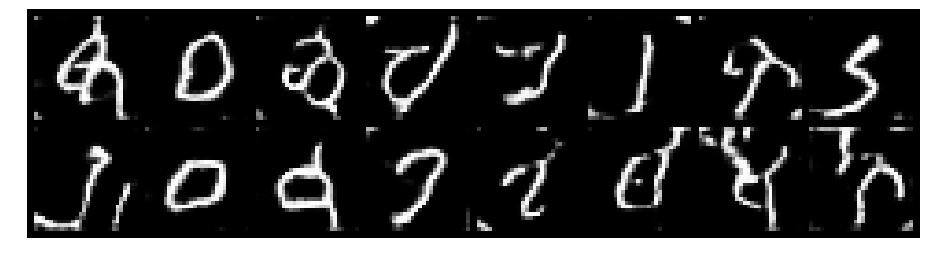

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 1.1402, Generator Loss: 0.9206
D(x): 0.6581, D(G(z)): 0.4240


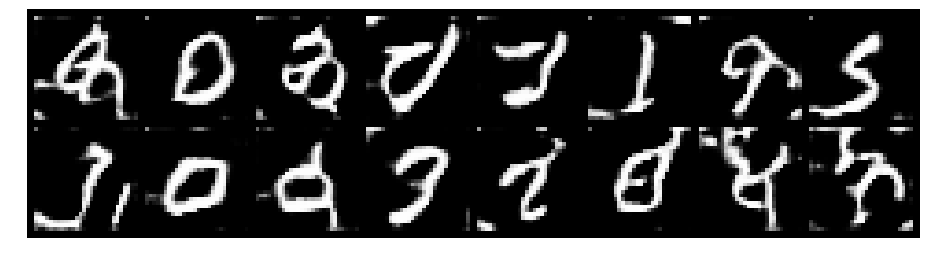

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.9736, Generator Loss: 1.0032
D(x): 0.7027, D(G(z)): 0.3979


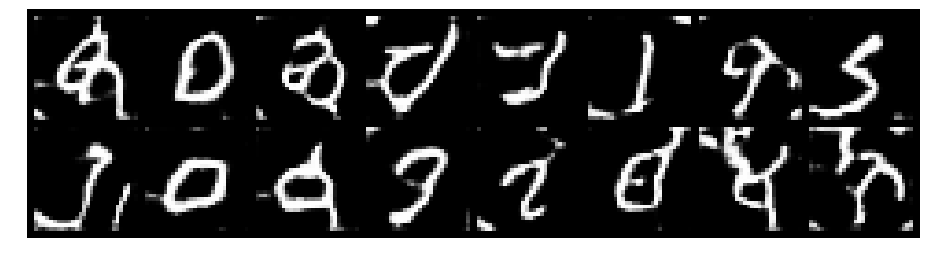

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 1.0263, Generator Loss: 1.0522
D(x): 0.6354, D(G(z)): 0.3675


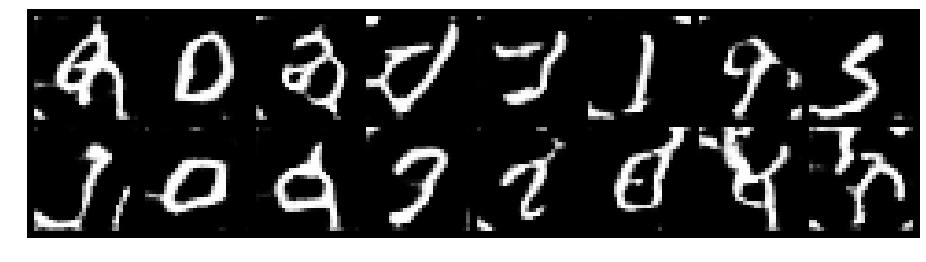

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 1.0760, Generator Loss: 1.1302
D(x): 0.6318, D(G(z)): 0.3966


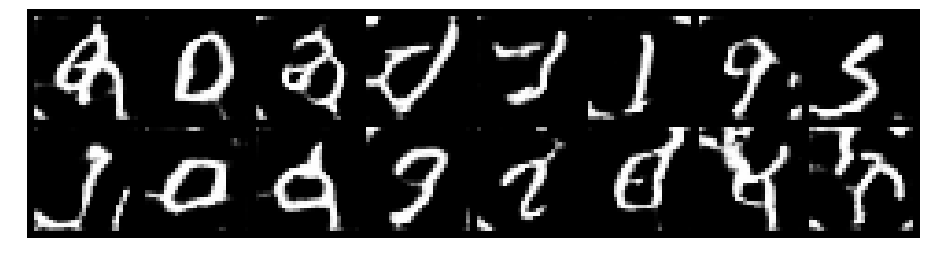

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 1.0129, Generator Loss: 1.0832
D(x): 0.6835, D(G(z)): 0.3933


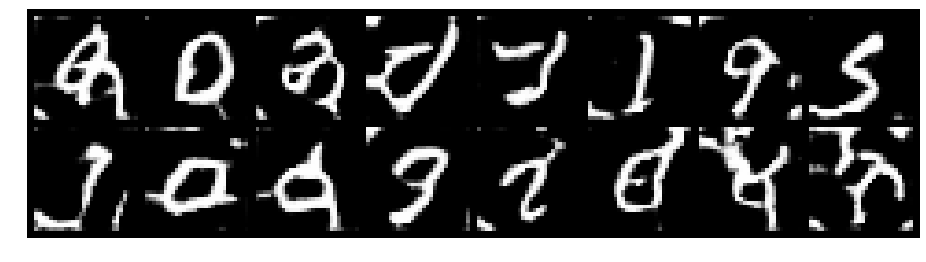

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.9872, Generator Loss: 0.9894
D(x): 0.7192, D(G(z)): 0.4064


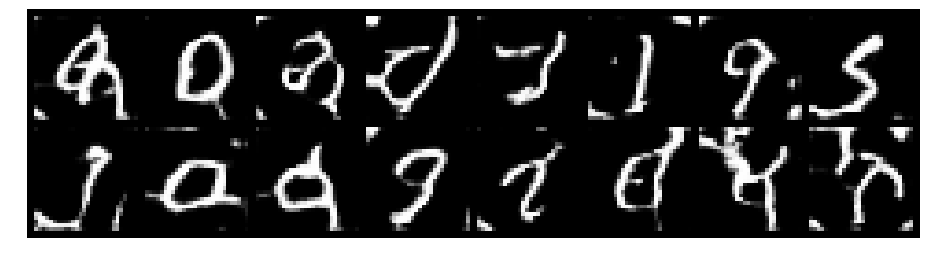

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 1.3229, Generator Loss: 1.1805
D(x): 0.5587, D(G(z)): 0.4206


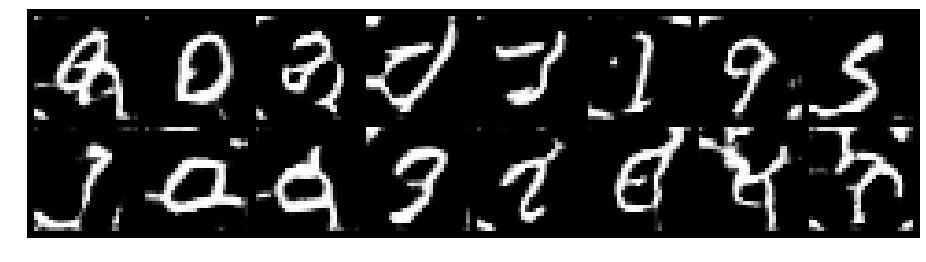

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.9924, Generator Loss: 0.9530
D(x): 0.7146, D(G(z)): 0.4086


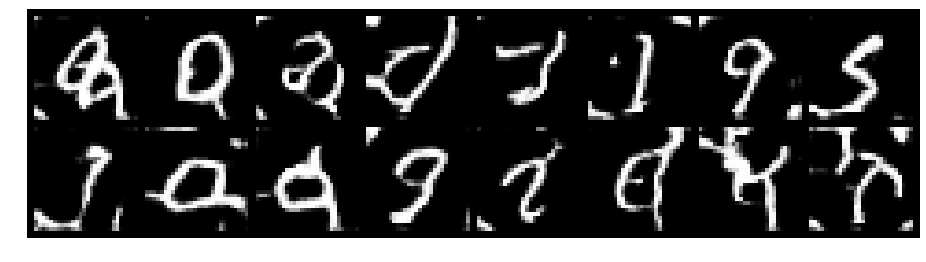

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.9981, Generator Loss: 0.9005
D(x): 0.7347, D(G(z)): 0.4270


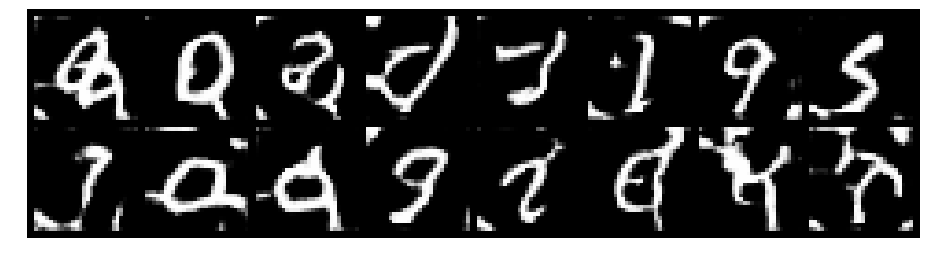

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 1.0552, Generator Loss: 1.0209
D(x): 0.6434, D(G(z)): 0.3821


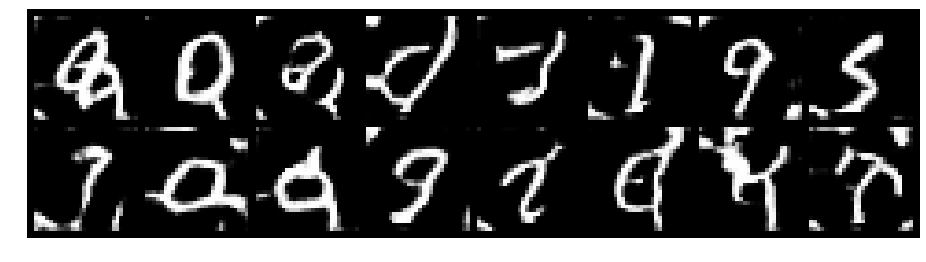

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.0236, Generator Loss: 1.0827
D(x): 0.6484, D(G(z)): 0.3583


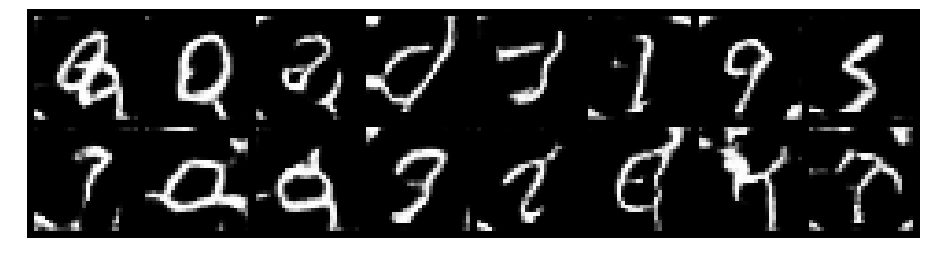

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 1.0657, Generator Loss: 0.9612
D(x): 0.6780, D(G(z)): 0.4052


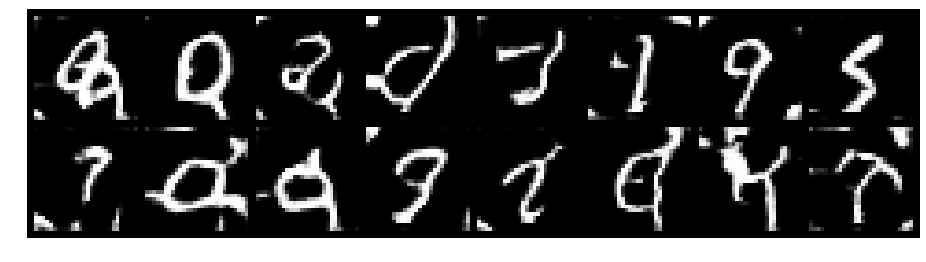

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 1.1134, Generator Loss: 1.0194
D(x): 0.6349, D(G(z)): 0.4011


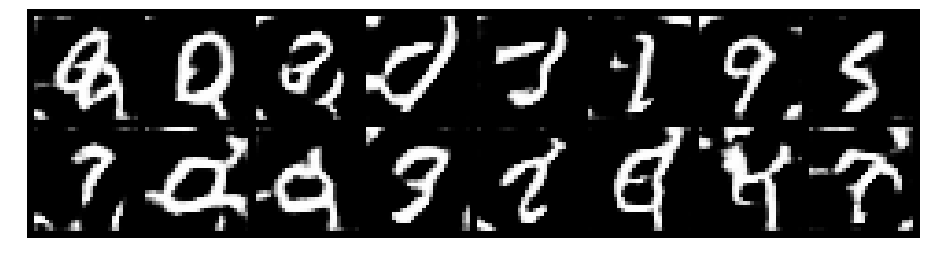

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 1.1247, Generator Loss: 1.0543
D(x): 0.6366, D(G(z)): 0.3929


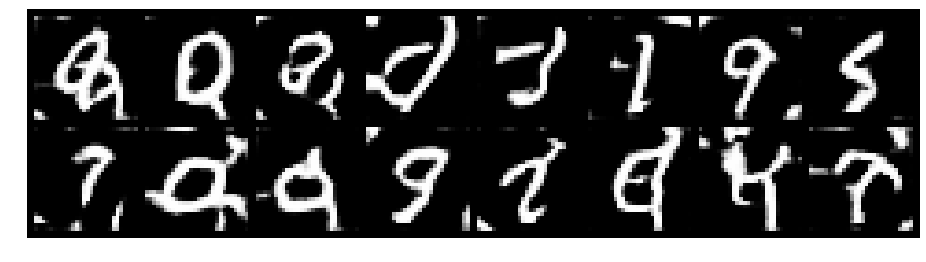

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.9186, Generator Loss: 1.0748
D(x): 0.6803, D(G(z)): 0.3442


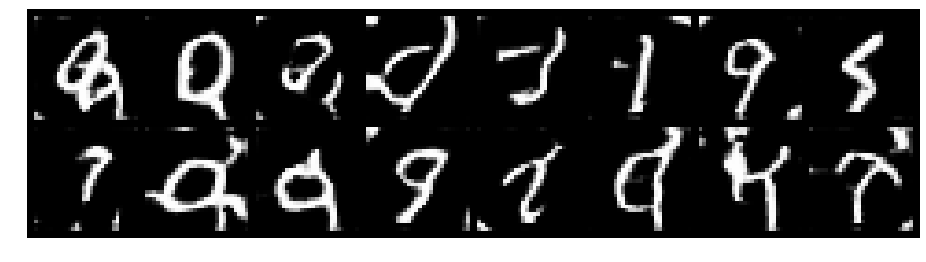

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 1.0706, Generator Loss: 1.0260
D(x): 0.6883, D(G(z)): 0.4100


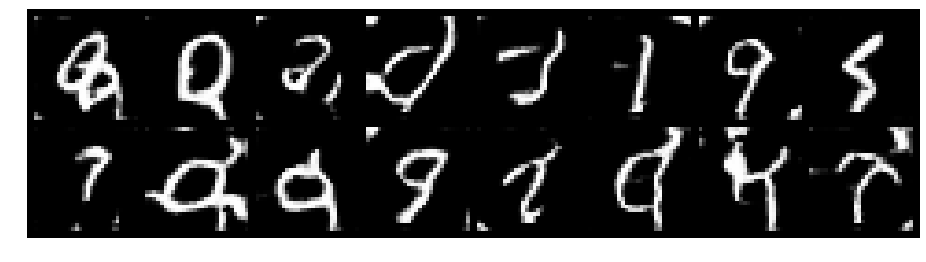

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 1.0989, Generator Loss: 1.0265
D(x): 0.6612, D(G(z)): 0.4152


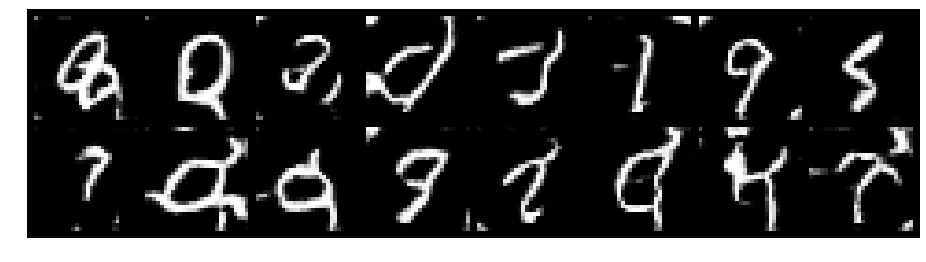

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.9704, Generator Loss: 1.1050
D(x): 0.7000, D(G(z)): 0.3653


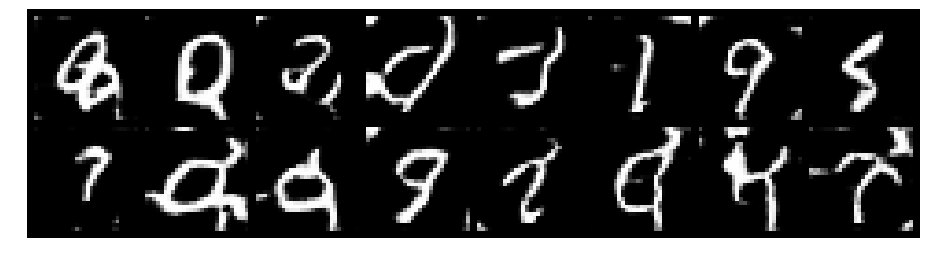

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 1.0824, Generator Loss: 1.0279
D(x): 0.6481, D(G(z)): 0.3979


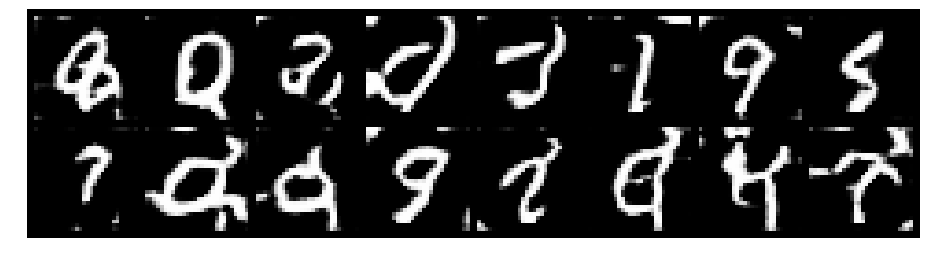

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 1.0759, Generator Loss: 1.0127
D(x): 0.6692, D(G(z)): 0.4084


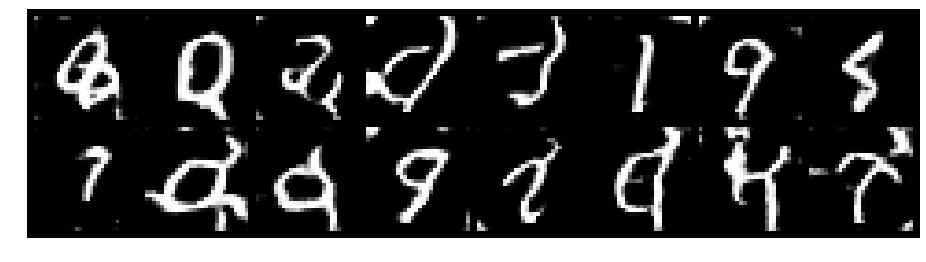

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 1.0950, Generator Loss: 1.0905
D(x): 0.6489, D(G(z)): 0.3916


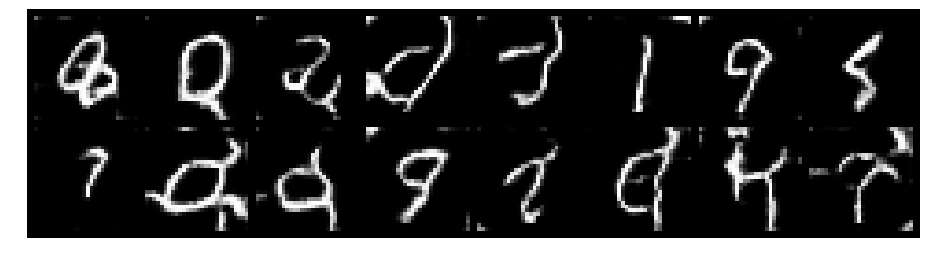

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 1.0531, Generator Loss: 0.9946
D(x): 0.6659, D(G(z)): 0.3905


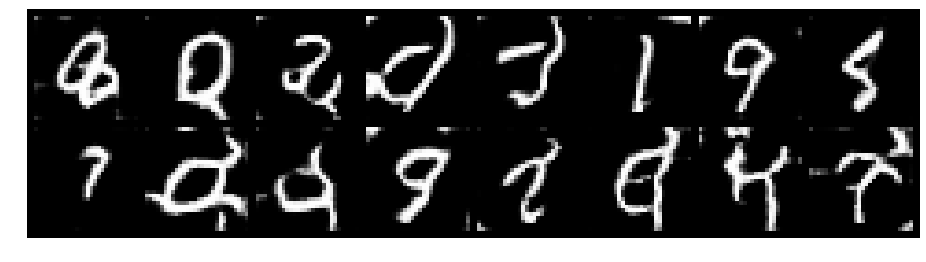

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 1.1547, Generator Loss: 1.0581
D(x): 0.6457, D(G(z)): 0.4152


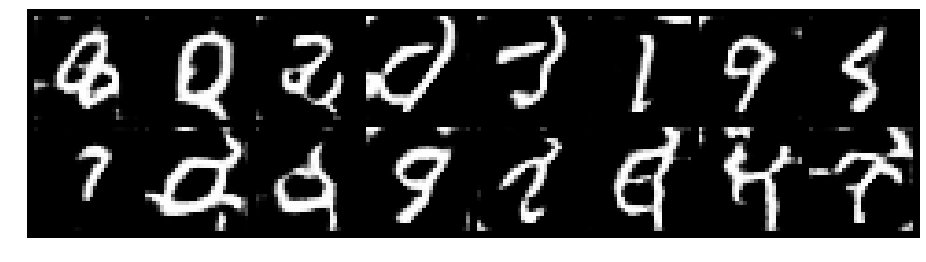

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 1.0752, Generator Loss: 1.1717
D(x): 0.6219, D(G(z)): 0.3669


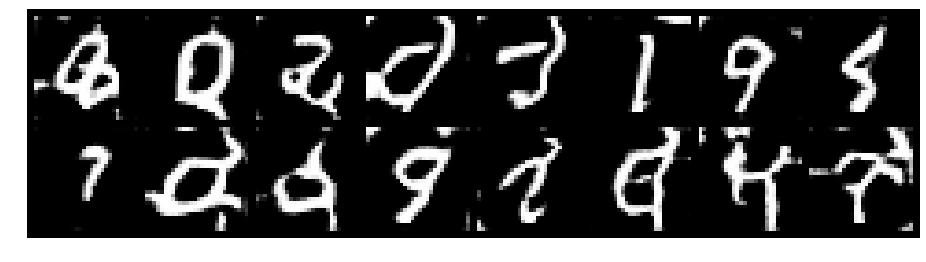

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.9509, Generator Loss: 1.0356
D(x): 0.6381, D(G(z)): 0.3261


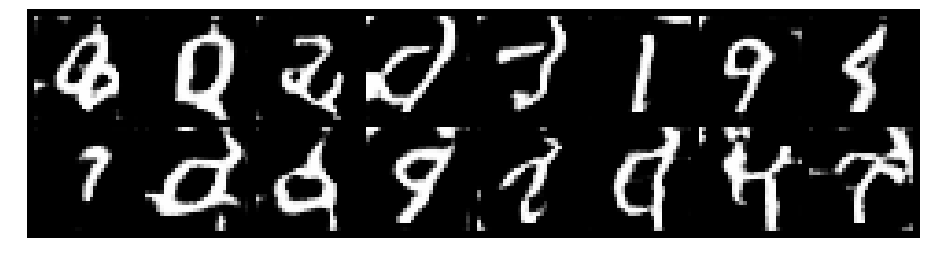

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 1.0364, Generator Loss: 1.0824
D(x): 0.6544, D(G(z)): 0.3744


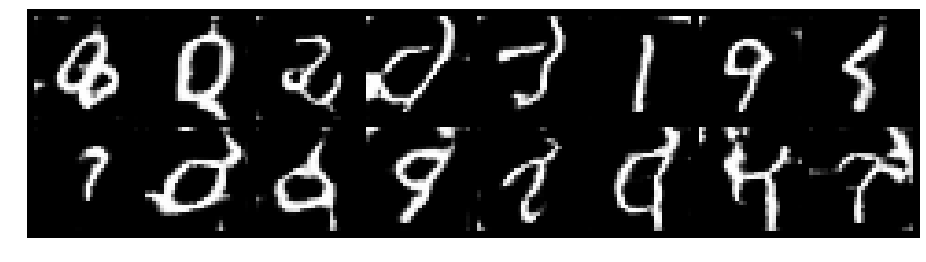

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 1.0144, Generator Loss: 1.1045
D(x): 0.6799, D(G(z)): 0.3859


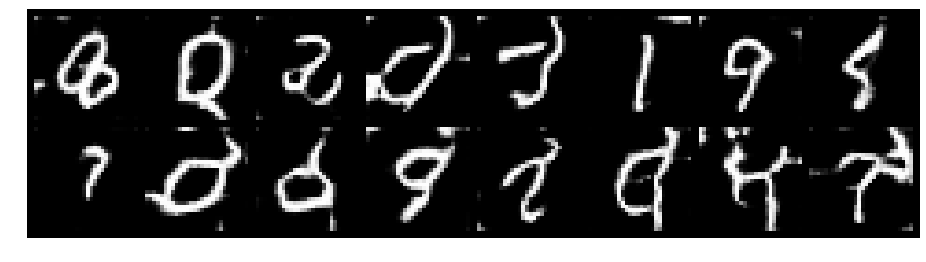

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 1.1124, Generator Loss: 1.1229
D(x): 0.6311, D(G(z)): 0.3839


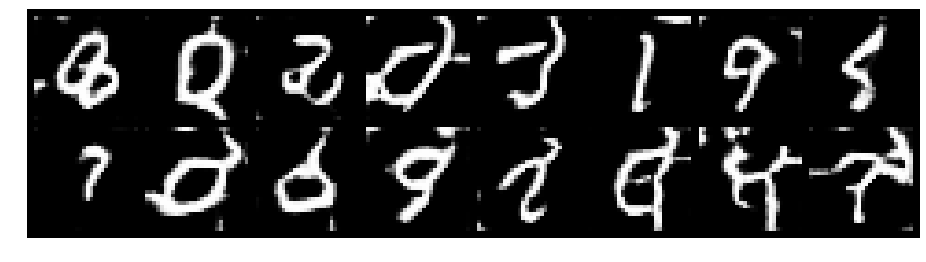

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.0502, Generator Loss: 0.9477
D(x): 0.6947, D(G(z)): 0.4201


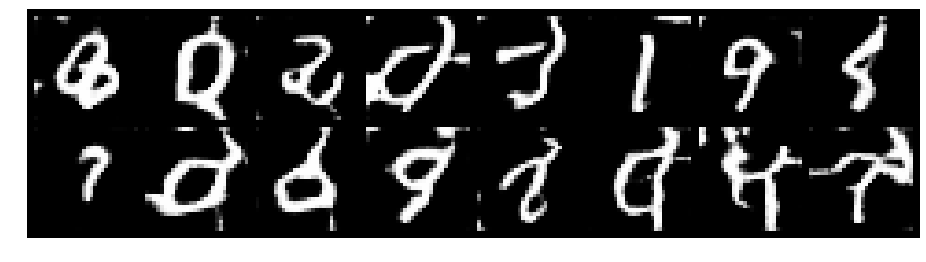

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.9860, Generator Loss: 1.0066
D(x): 0.7369, D(G(z)): 0.4176


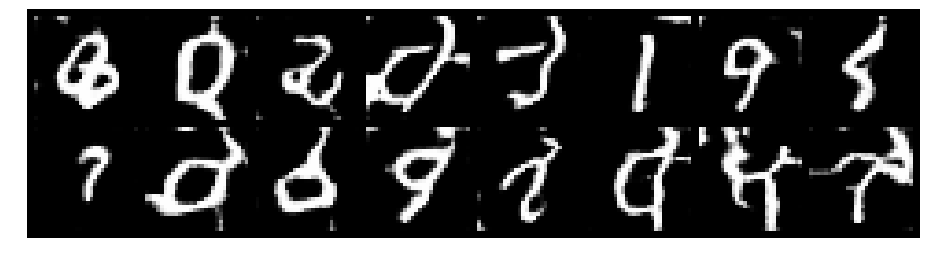

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 1.0410, Generator Loss: 1.0829
D(x): 0.6466, D(G(z)): 0.3492


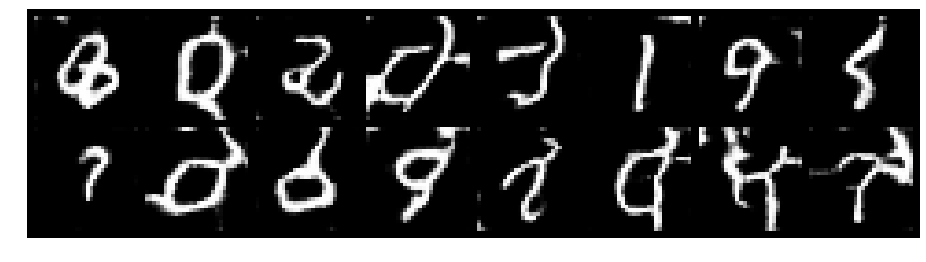

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 1.1590, Generator Loss: 1.0630
D(x): 0.6423, D(G(z)): 0.4202


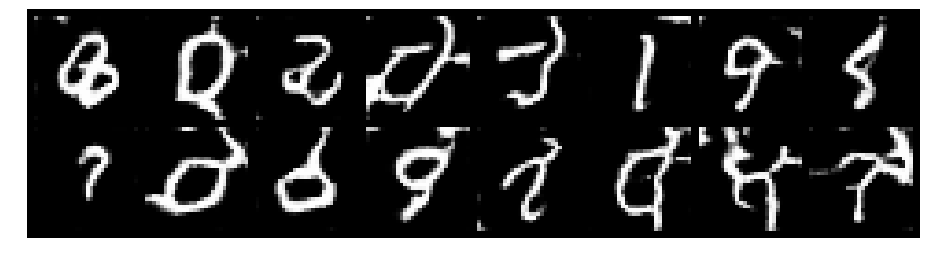

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 1.0529, Generator Loss: 1.0871
D(x): 0.6393, D(G(z)): 0.3706


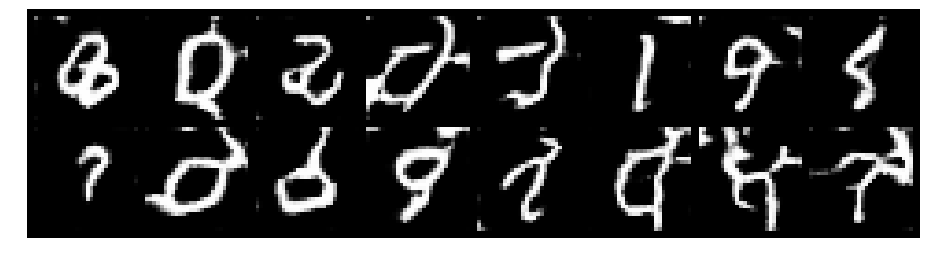

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.9868, Generator Loss: 1.0464
D(x): 0.6671, D(G(z)): 0.3644


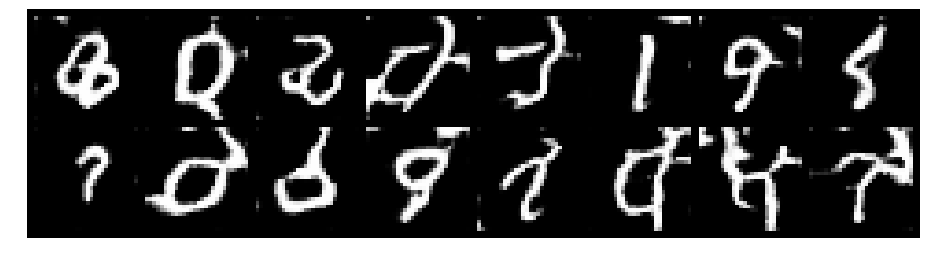

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 1.1087, Generator Loss: 1.2418
D(x): 0.5759, D(G(z)): 0.3241


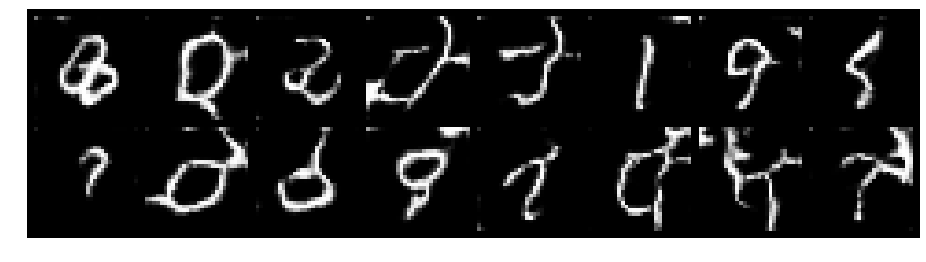

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.9897, Generator Loss: 1.1548
D(x): 0.6697, D(G(z)): 0.3782


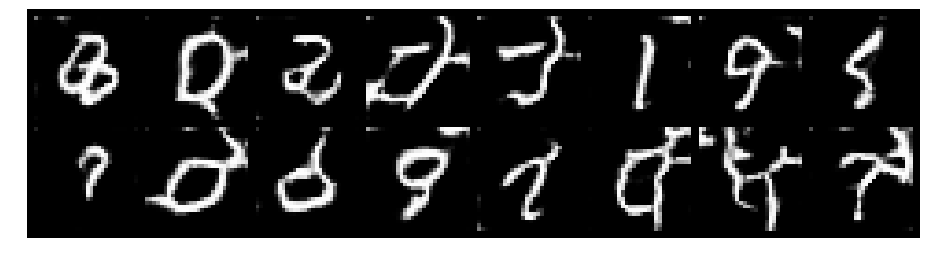

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 1.1212, Generator Loss: 1.0983
D(x): 0.6048, D(G(z)): 0.3612


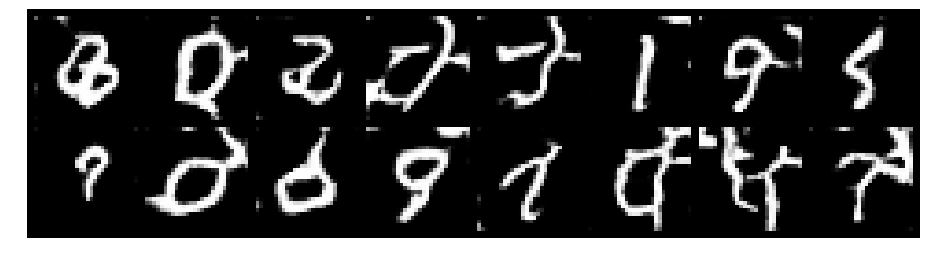

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.0936, Generator Loss: 1.1130
D(x): 0.6499, D(G(z)): 0.3891


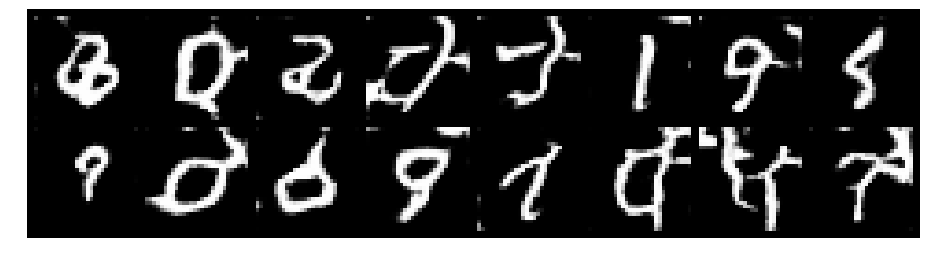

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.0925, Generator Loss: 1.1179
D(x): 0.6598, D(G(z)): 0.4085


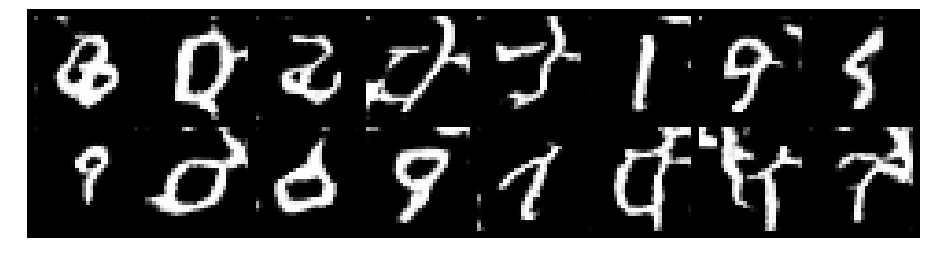

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 1.0495, Generator Loss: 1.0186
D(x): 0.6535, D(G(z)): 0.3799


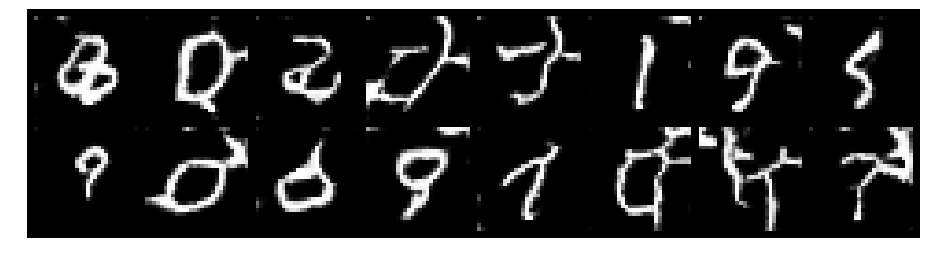

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.0592, Generator Loss: 1.1222
D(x): 0.6404, D(G(z)): 0.3742


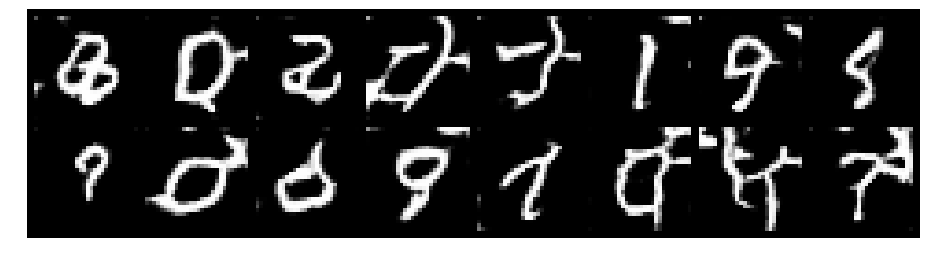

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9949, Generator Loss: 1.0000
D(x): 0.6812, D(G(z)): 0.3692


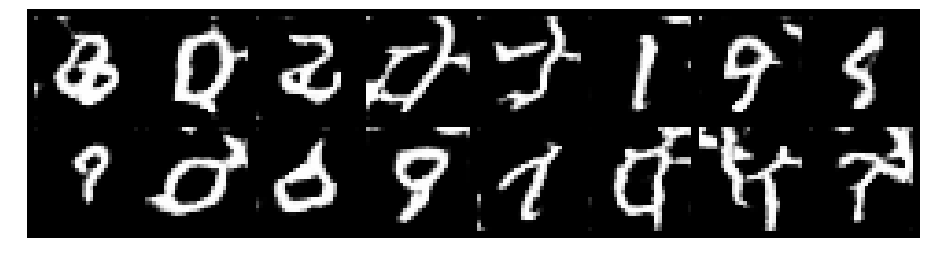

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.0192, Generator Loss: 1.0866
D(x): 0.6442, D(G(z)): 0.3626


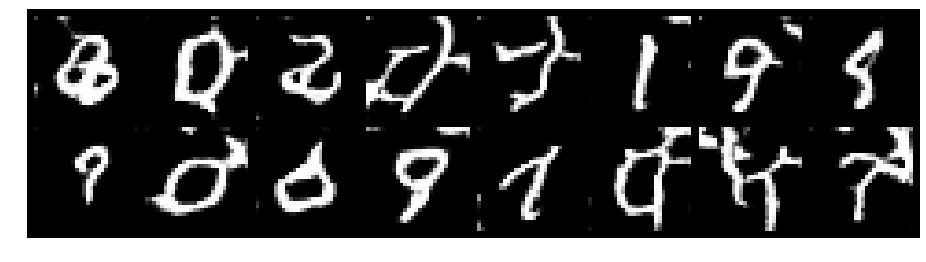

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 1.0837, Generator Loss: 1.1760
D(x): 0.6464, D(G(z)): 0.3899


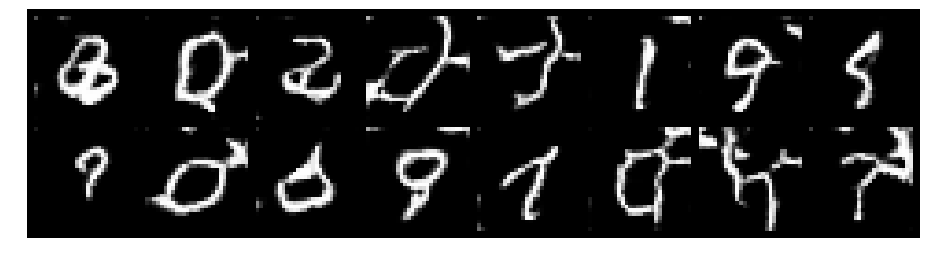

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.1499, Generator Loss: 1.0040
D(x): 0.6310, D(G(z)): 0.4181


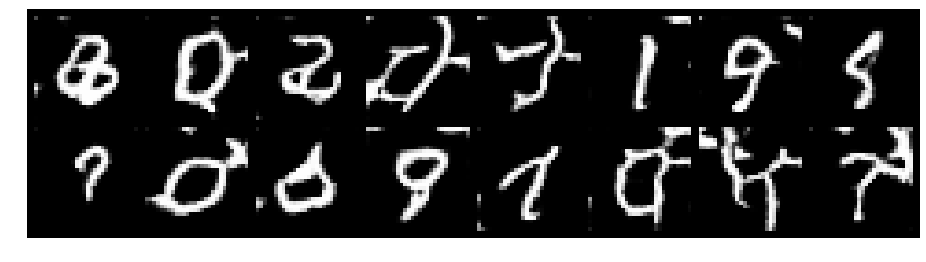

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 1.1314, Generator Loss: 1.0408
D(x): 0.6161, D(G(z)): 0.3889


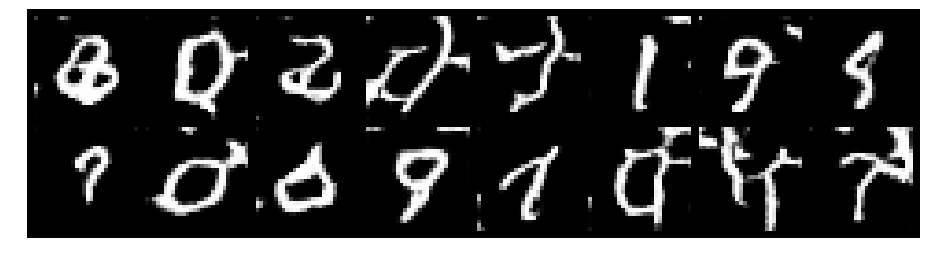

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 1.0816, Generator Loss: 1.0249
D(x): 0.6165, D(G(z)): 0.3614


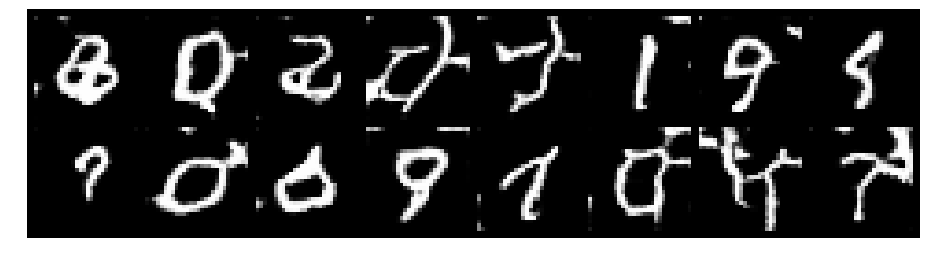

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.0751, Generator Loss: 1.0343
D(x): 0.6648, D(G(z)): 0.4046


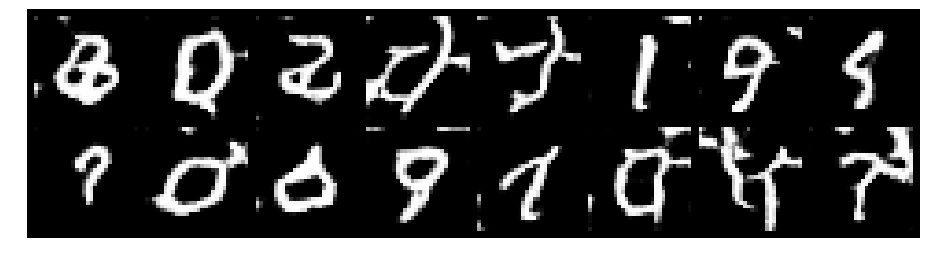

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 1.1209, Generator Loss: 0.8791
D(x): 0.6675, D(G(z)): 0.4227


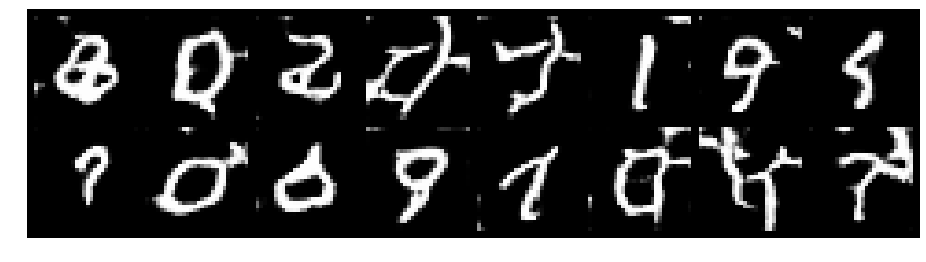

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.9190, Generator Loss: 1.1421
D(x): 0.6704, D(G(z)): 0.3230


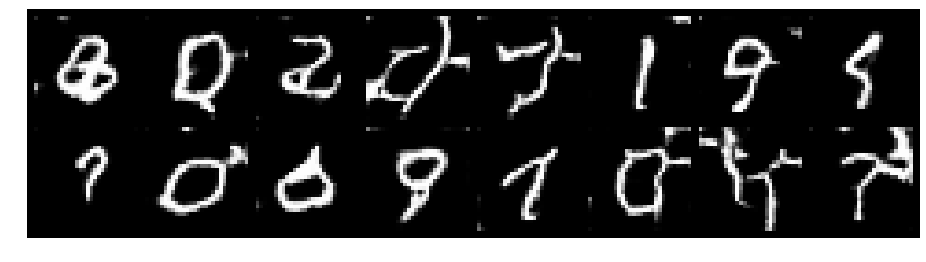

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.0176, Generator Loss: 1.0668
D(x): 0.6535, D(G(z)): 0.3716


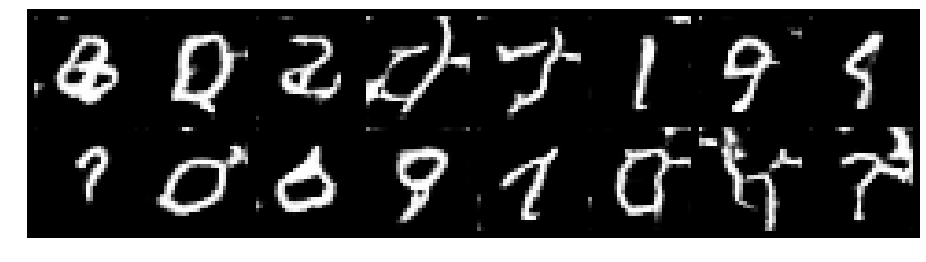

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 1.0999, Generator Loss: 1.1240
D(x): 0.6283, D(G(z)): 0.3763


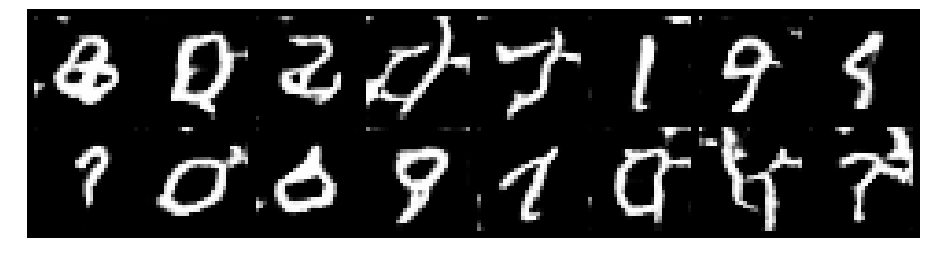

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.1334, Generator Loss: 1.1825
D(x): 0.6145, D(G(z)): 0.3808


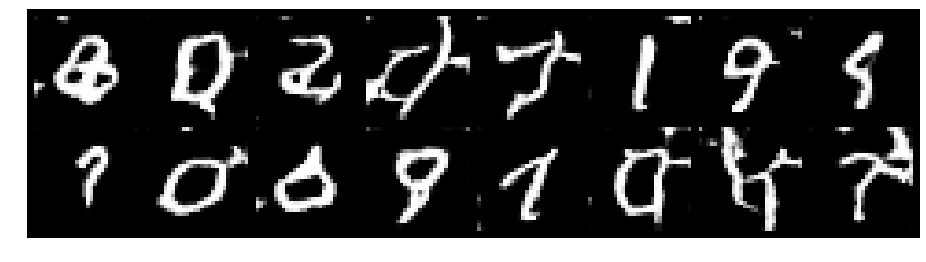

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 1.0180, Generator Loss: 1.1301
D(x): 0.6315, D(G(z)): 0.3587


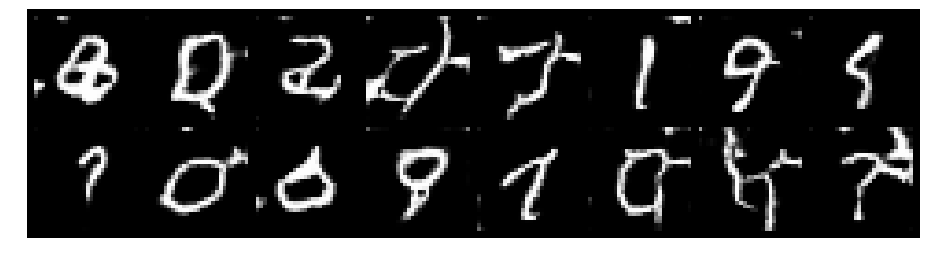

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.0309, Generator Loss: 1.0407
D(x): 0.6339, D(G(z)): 0.3597


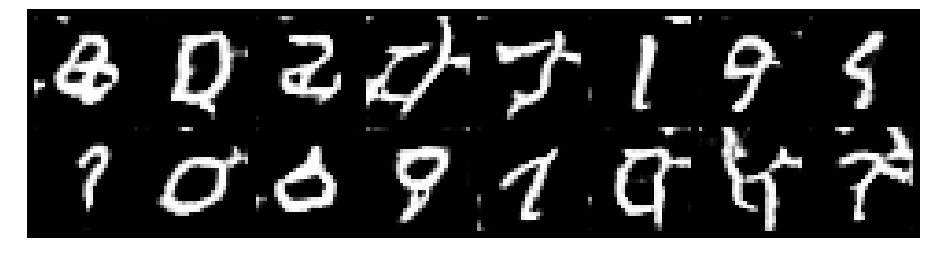

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 1.0727, Generator Loss: 1.0915
D(x): 0.6321, D(G(z)): 0.3770


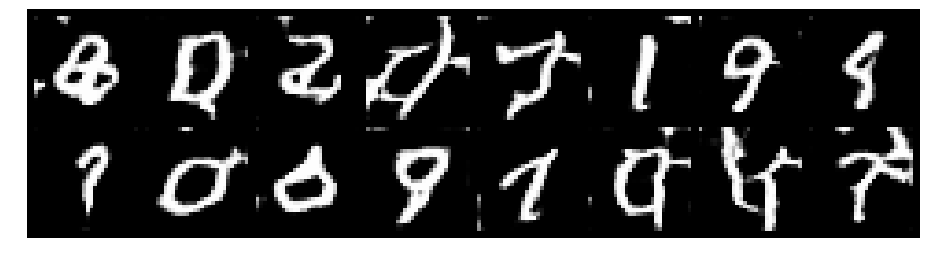

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 1.0870, Generator Loss: 1.0752
D(x): 0.6402, D(G(z)): 0.3823


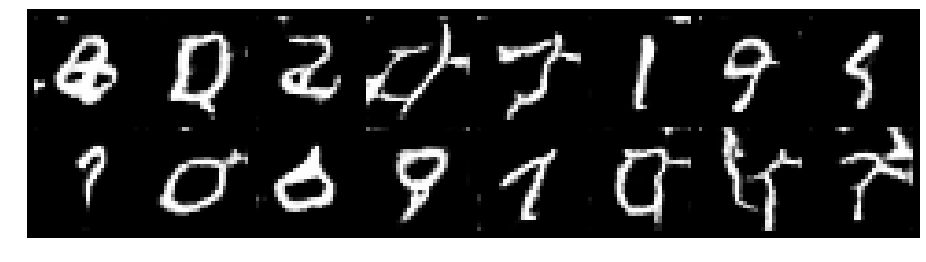

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0561, Generator Loss: 1.0552
D(x): 0.6635, D(G(z)): 0.3797


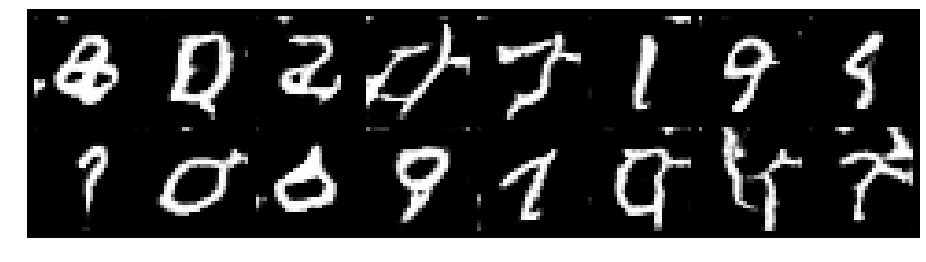

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.0977, Generator Loss: 1.1323
D(x): 0.5733, D(G(z)): 0.3290


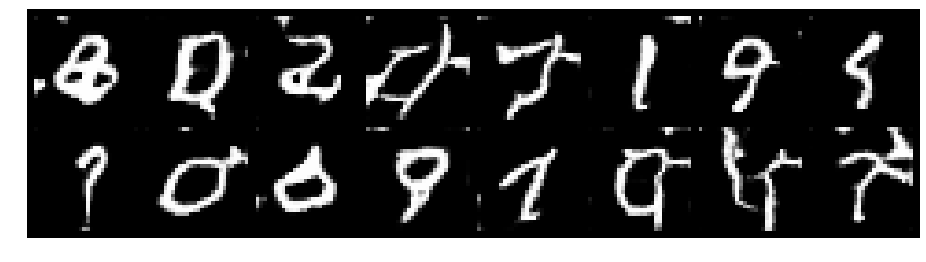

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.0038, Generator Loss: 1.1931
D(x): 0.7036, D(G(z)): 0.3917


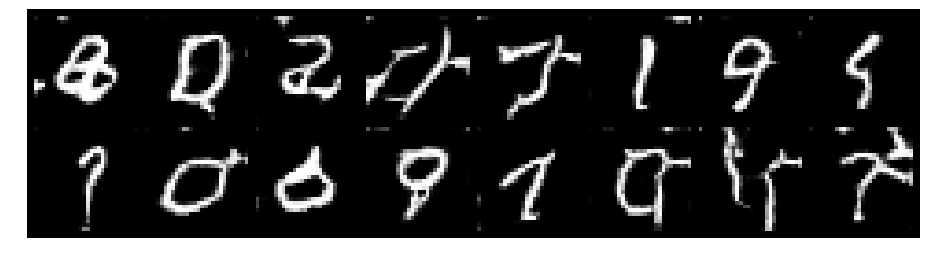

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 1.0413, Generator Loss: 1.1495
D(x): 0.6465, D(G(z)): 0.3558


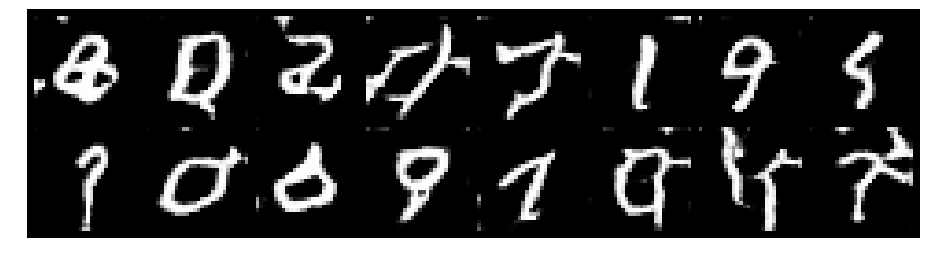

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 1.0190, Generator Loss: 1.1216
D(x): 0.6417, D(G(z)): 0.3552


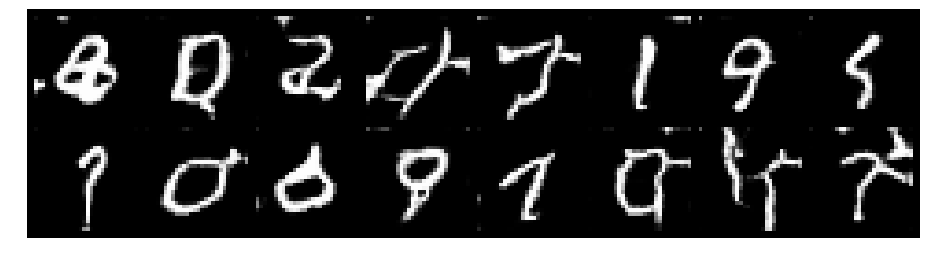

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.0383, Generator Loss: 1.0924
D(x): 0.6190, D(G(z)): 0.3411


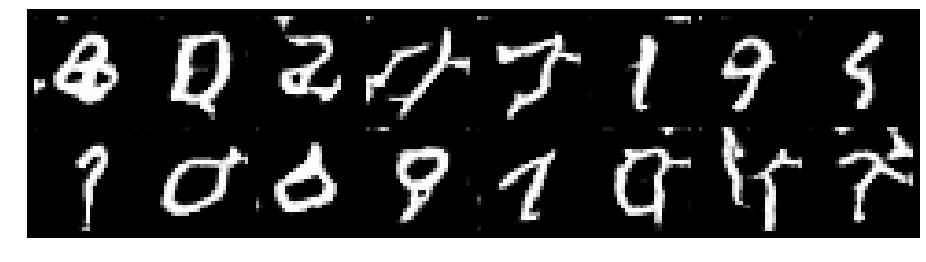

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.1291, Generator Loss: 1.0524
D(x): 0.6433, D(G(z)): 0.4008


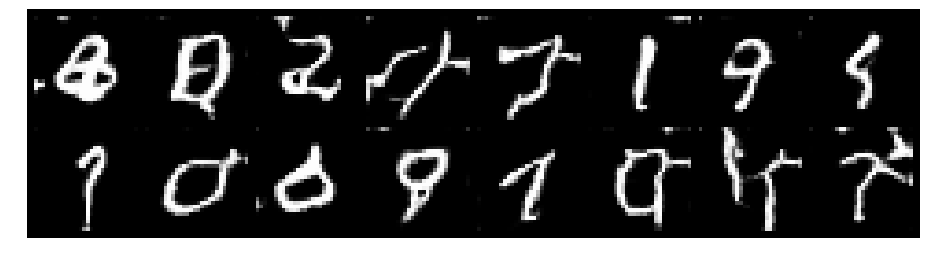

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 1.0288, Generator Loss: 1.1934
D(x): 0.6729, D(G(z)): 0.3669


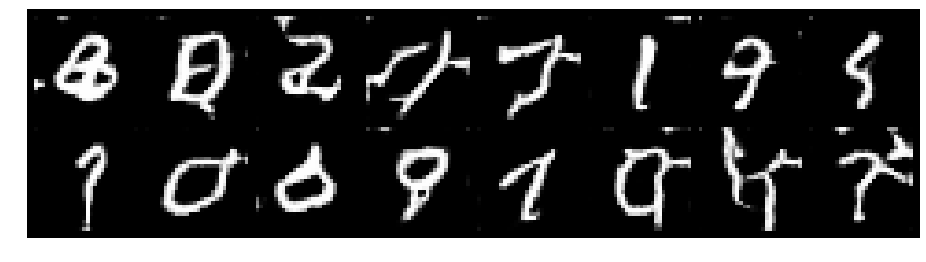

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.0581, Generator Loss: 1.0324
D(x): 0.6538, D(G(z)): 0.3840


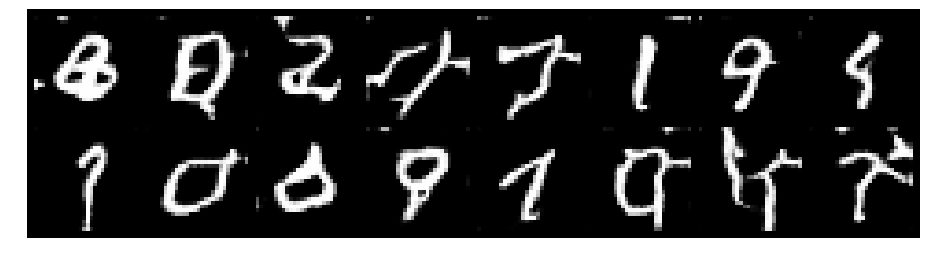

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0379, Generator Loss: 1.0647
D(x): 0.6155, D(G(z)): 0.3417


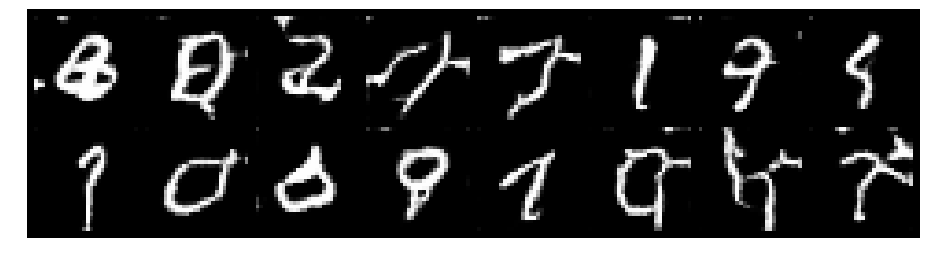

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 1.1326, Generator Loss: 1.0304
D(x): 0.6471, D(G(z)): 0.4007


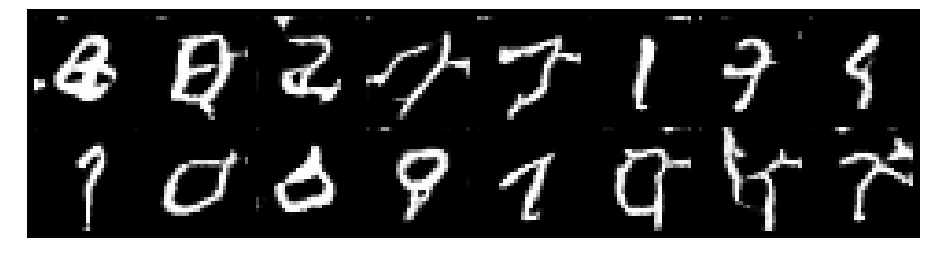

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.1384, Generator Loss: 1.1578
D(x): 0.6070, D(G(z)): 0.3747


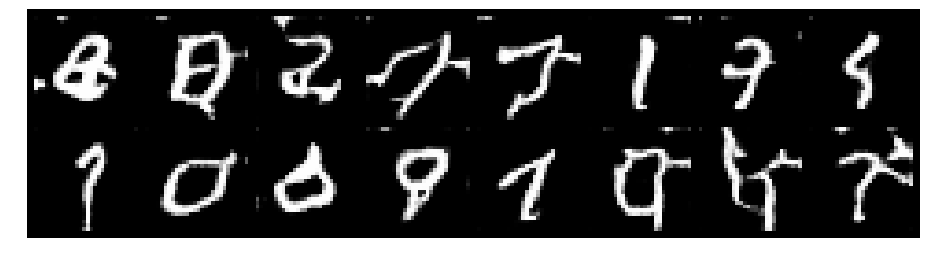

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.1657, Generator Loss: 1.0603
D(x): 0.5852, D(G(z)): 0.3664


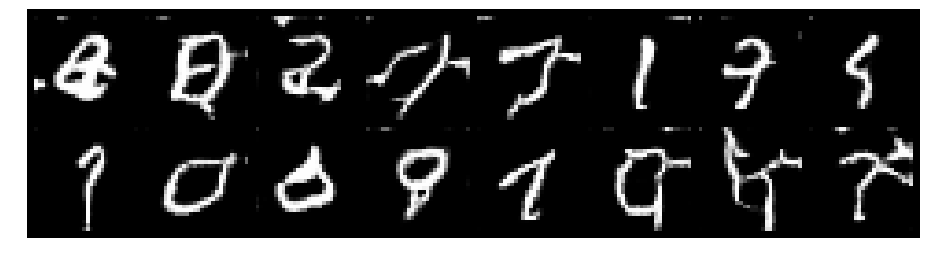

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.0714, Generator Loss: 1.0703
D(x): 0.6262, D(G(z)): 0.3691


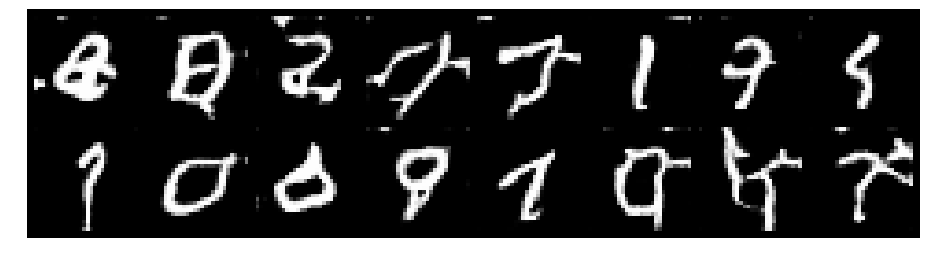

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0331, Generator Loss: 1.0316
D(x): 0.6552, D(G(z)): 0.3789


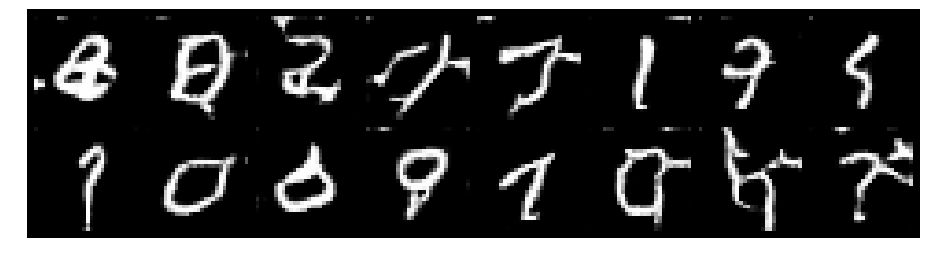

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.1242, Generator Loss: 1.0487
D(x): 0.6340, D(G(z)): 0.3859


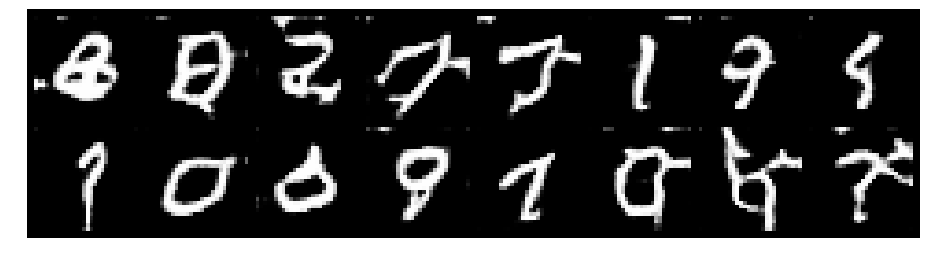

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.1245, Generator Loss: 1.0242
D(x): 0.6193, D(G(z)): 0.3843


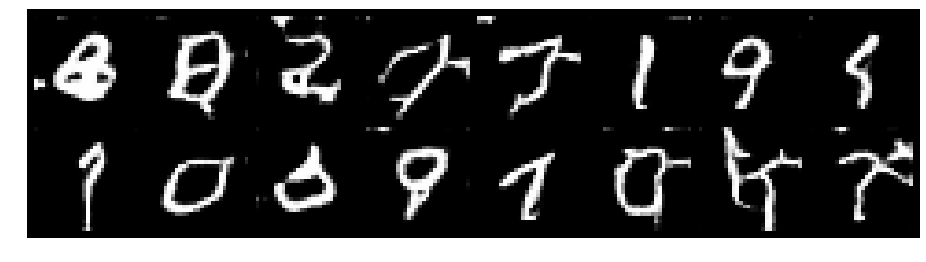

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.0306, Generator Loss: 1.0750
D(x): 0.6504, D(G(z)): 0.3619


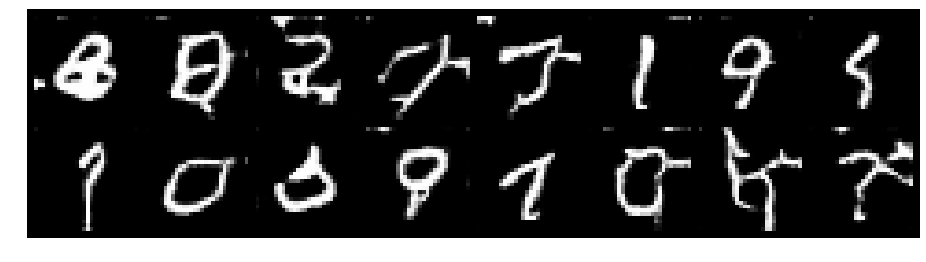

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.9469, Generator Loss: 1.0533
D(x): 0.7003, D(G(z)): 0.3772


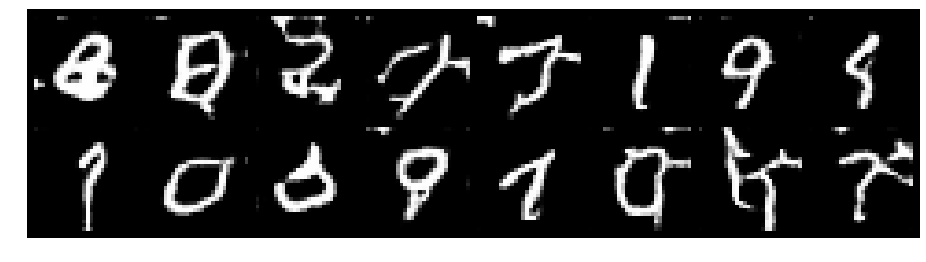

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 1.0018, Generator Loss: 1.1130
D(x): 0.6518, D(G(z)): 0.3576


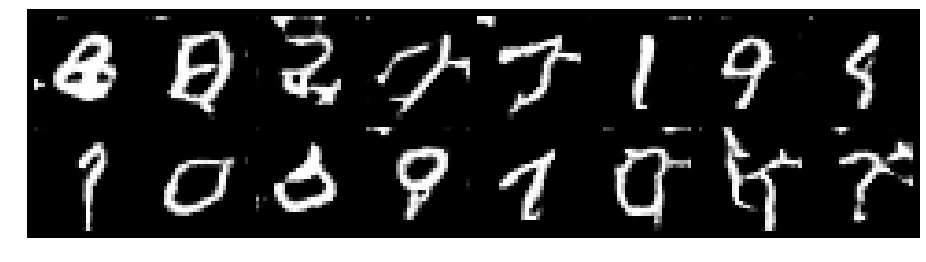

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.0083, Generator Loss: 1.0253
D(x): 0.6453, D(G(z)): 0.3613


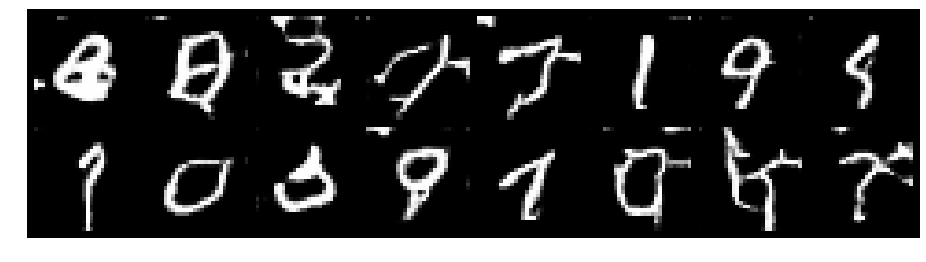

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0910, Generator Loss: 1.0792
D(x): 0.6208, D(G(z)): 0.3712


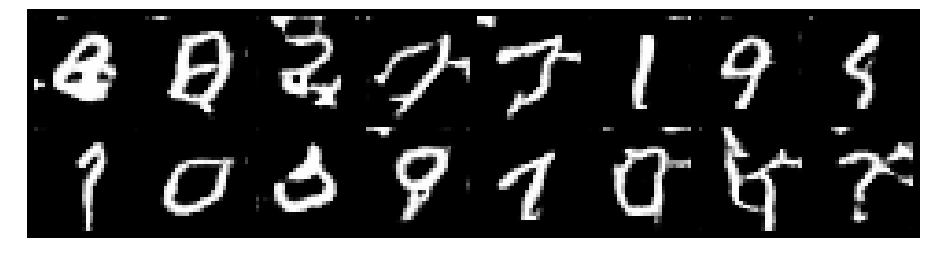

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.1891, Generator Loss: 1.0577
D(x): 0.6275, D(G(z)): 0.4195


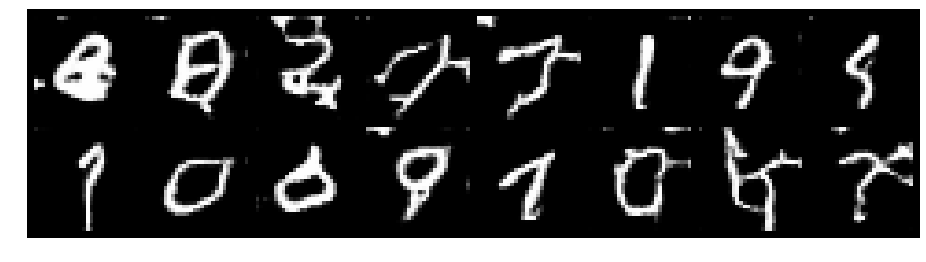

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.0661, Generator Loss: 1.1608
D(x): 0.6433, D(G(z)): 0.3658


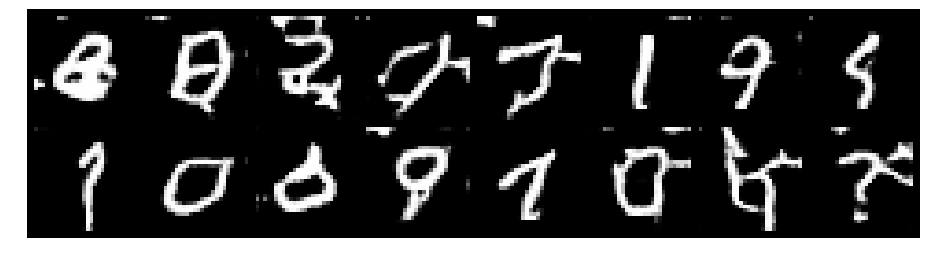

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 1.1021, Generator Loss: 1.0465
D(x): 0.6481, D(G(z)): 0.4076


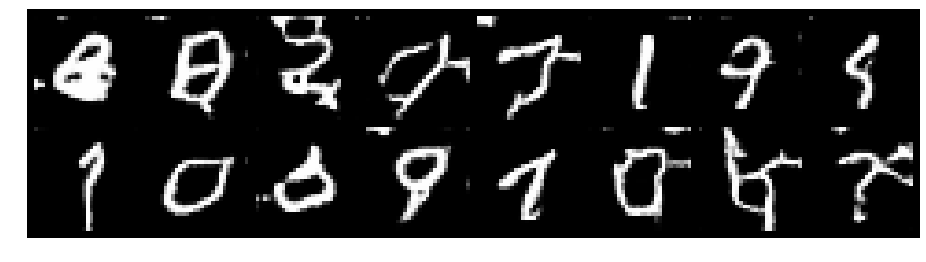

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.1060, Generator Loss: 0.9716
D(x): 0.6192, D(G(z)): 0.3748


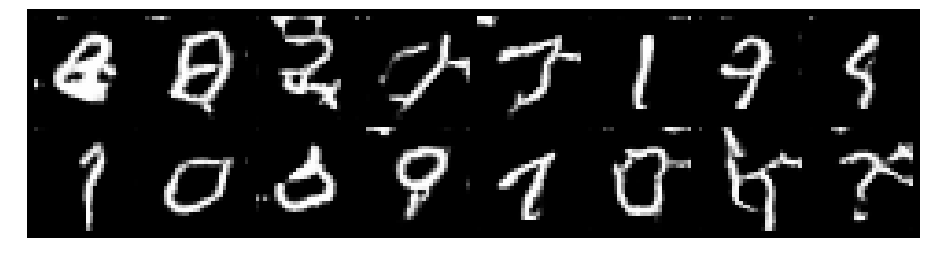

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 1.0525, Generator Loss: 1.0405
D(x): 0.6847, D(G(z)): 0.4069


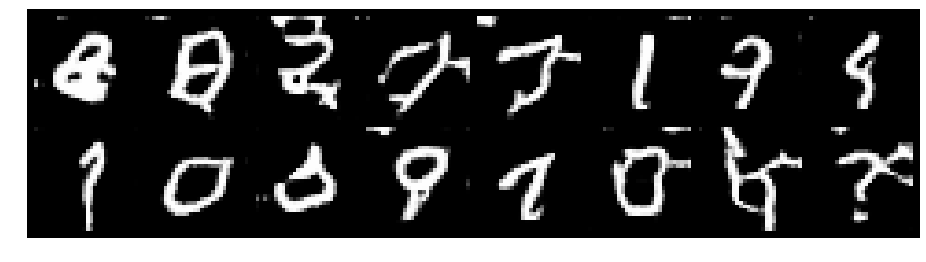

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 1.1580, Generator Loss: 1.0958
D(x): 0.5834, D(G(z)): 0.3619


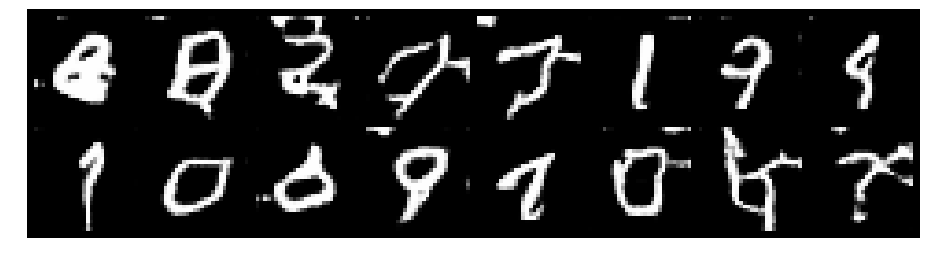

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9450, Generator Loss: 1.1394
D(x): 0.6272, D(G(z)): 0.3165


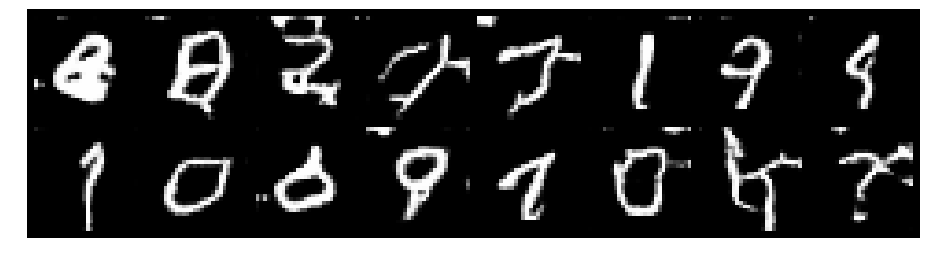

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9725, Generator Loss: 1.2067
D(x): 0.6395, D(G(z)): 0.3277


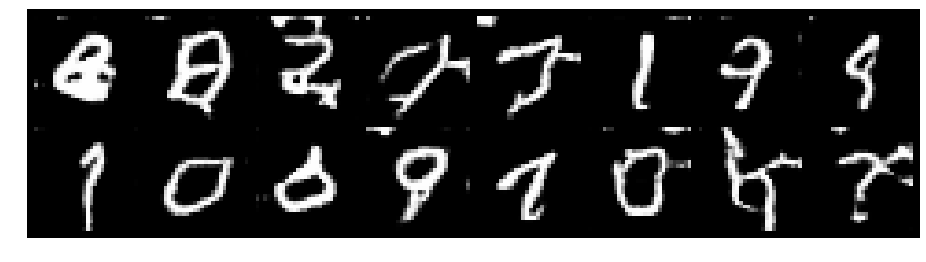

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.0617, Generator Loss: 0.9119
D(x): 0.6790, D(G(z)): 0.3967


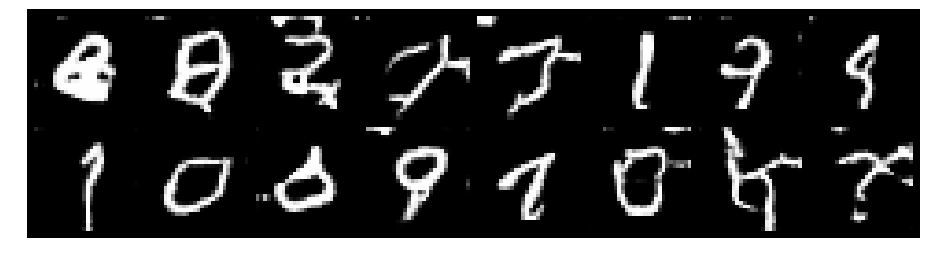

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 1.0950, Generator Loss: 1.0697
D(x): 0.6380, D(G(z)): 0.3902


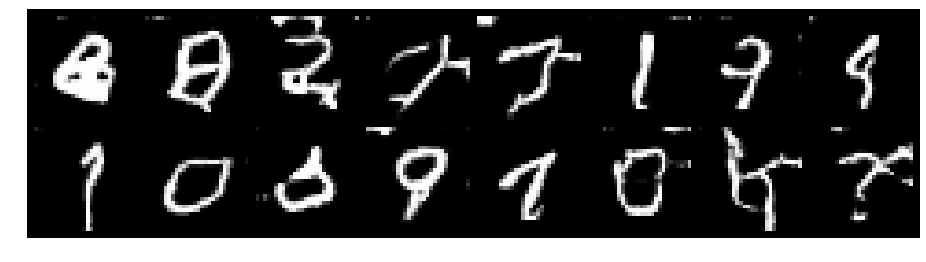

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0618, Generator Loss: 1.1467
D(x): 0.6249, D(G(z)): 0.3428


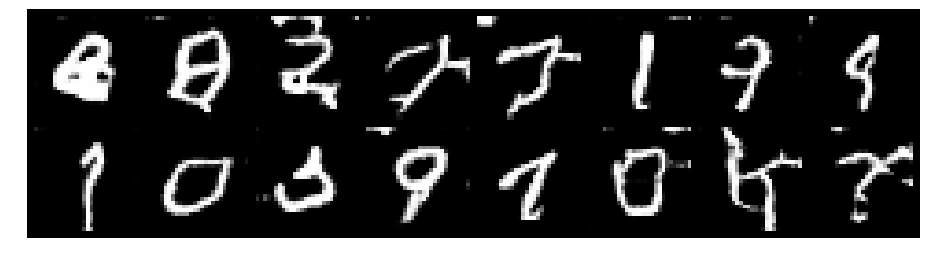

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.1668, Generator Loss: 1.0688
D(x): 0.6745, D(G(z)): 0.4455


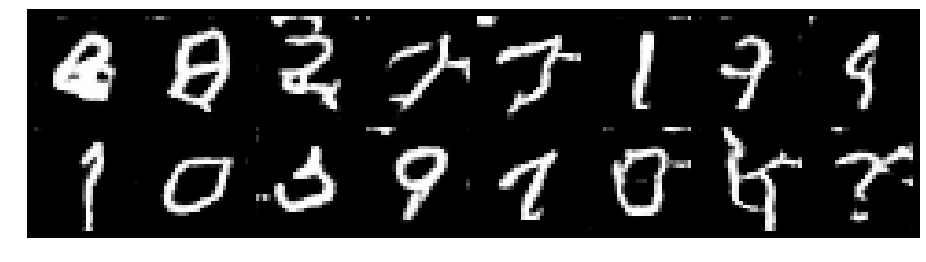

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.0439, Generator Loss: 1.0457
D(x): 0.6469, D(G(z)): 0.3664


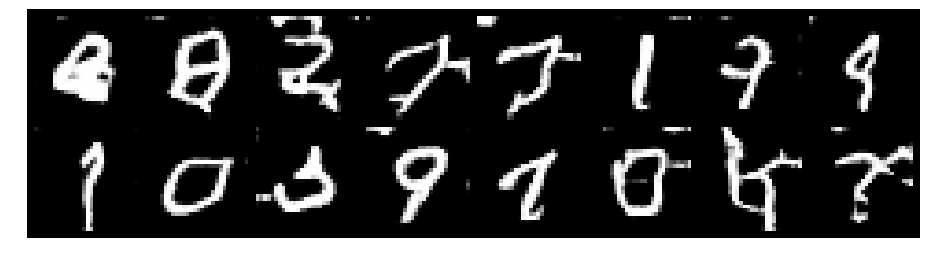

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.0689, Generator Loss: 1.0855
D(x): 0.6522, D(G(z)): 0.3806


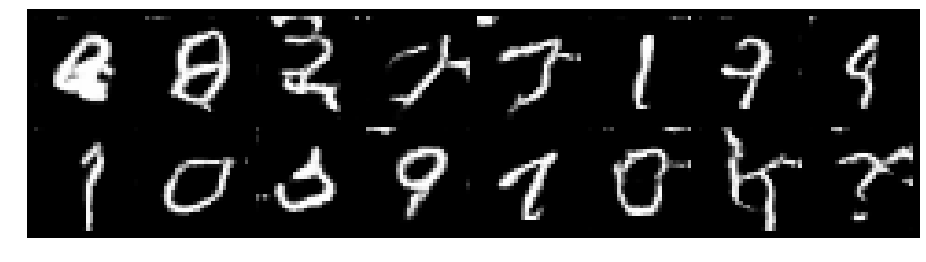

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.2527, Generator Loss: 1.1454
D(x): 0.6089, D(G(z)): 0.4154


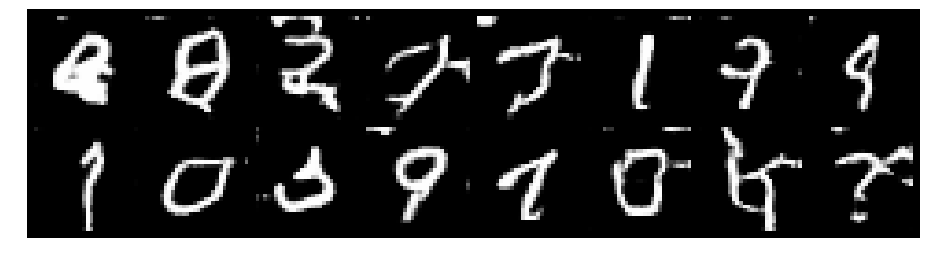

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.1039, Generator Loss: 1.1084
D(x): 0.6373, D(G(z)): 0.3810


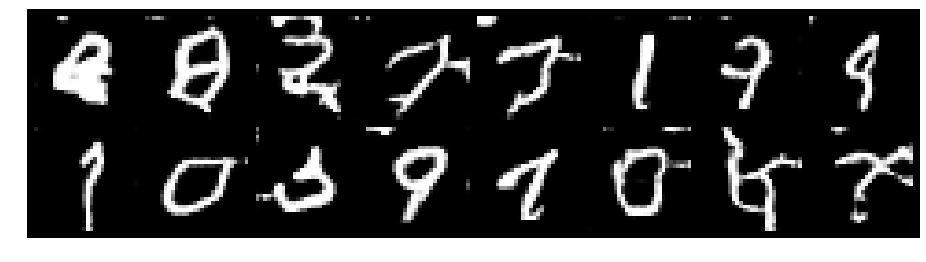

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.1423, Generator Loss: 1.0306
D(x): 0.6534, D(G(z)): 0.4275


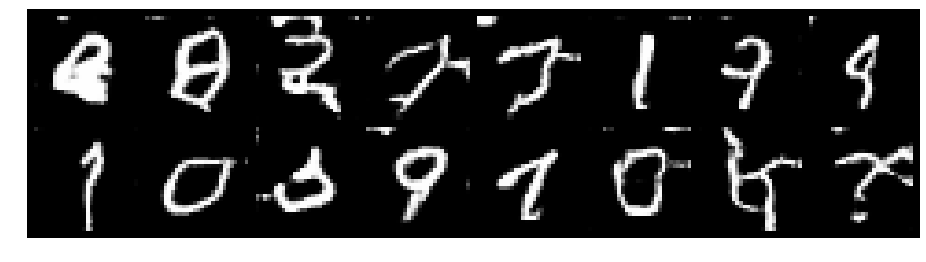

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.0046, Generator Loss: 1.1459
D(x): 0.6462, D(G(z)): 0.3528


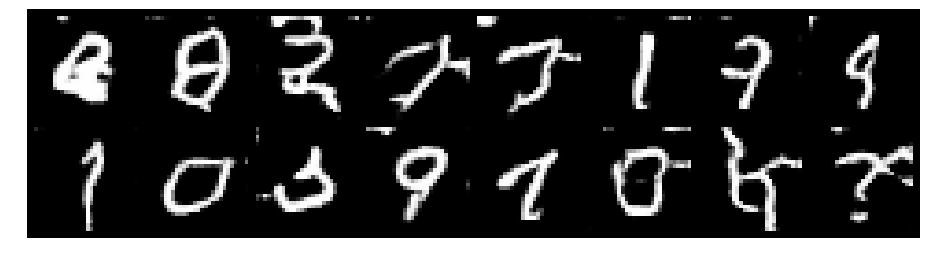

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.0922, Generator Loss: 1.1425
D(x): 0.5999, D(G(z)): 0.3488


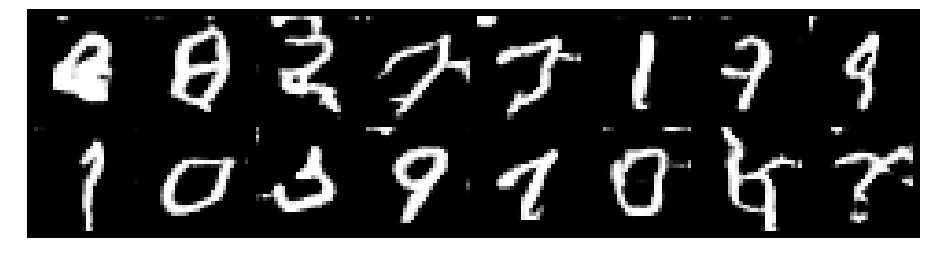

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 0.9587, Generator Loss: 1.1245
D(x): 0.6631, D(G(z)): 0.3487


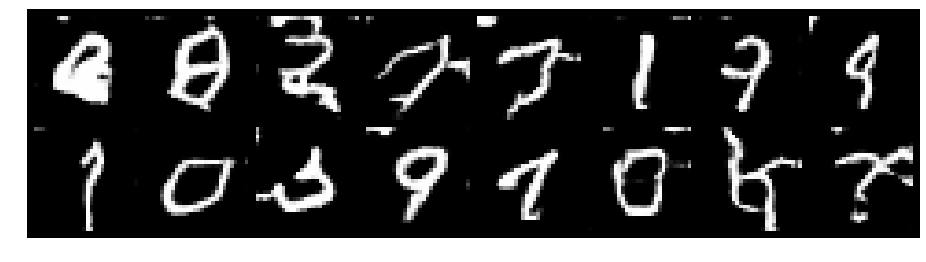

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9836, Generator Loss: 1.1103
D(x): 0.6613, D(G(z)): 0.3507


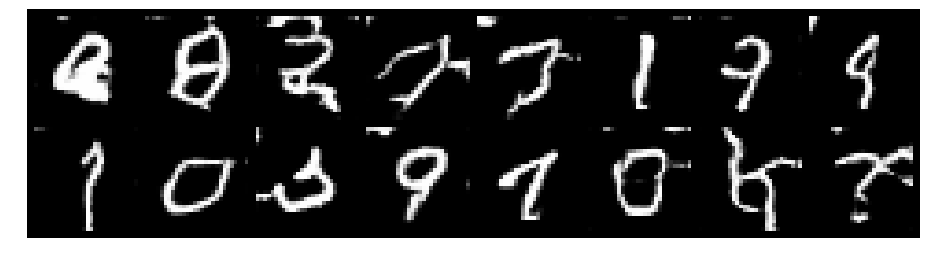

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.0910, Generator Loss: 1.2267
D(x): 0.6181, D(G(z)): 0.3657


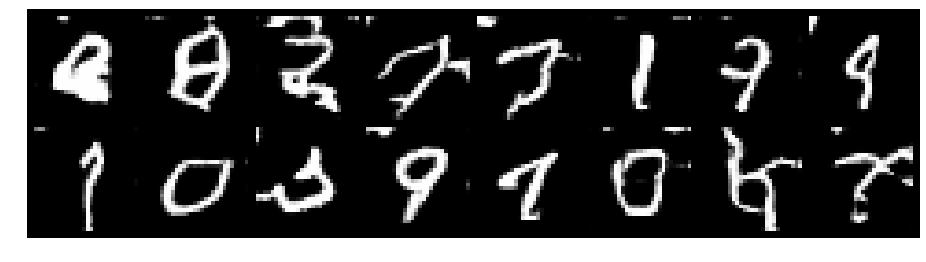

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.0318, Generator Loss: 1.0679
D(x): 0.6727, D(G(z)): 0.3986


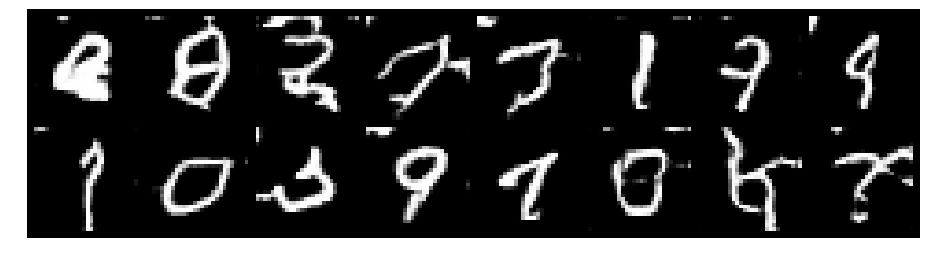

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.1322, Generator Loss: 1.0834
D(x): 0.6184, D(G(z)): 0.3880


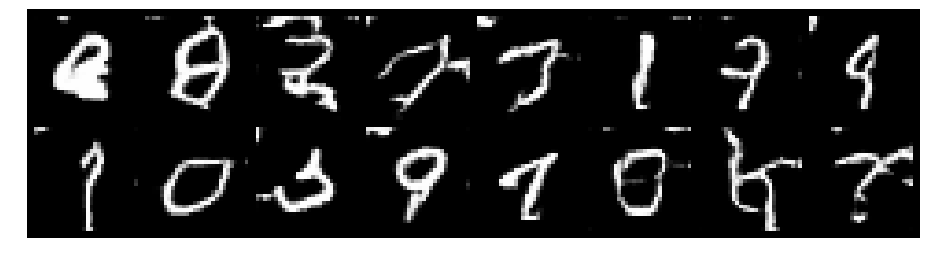

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0649, Generator Loss: 1.2181
D(x): 0.5873, D(G(z)): 0.3220


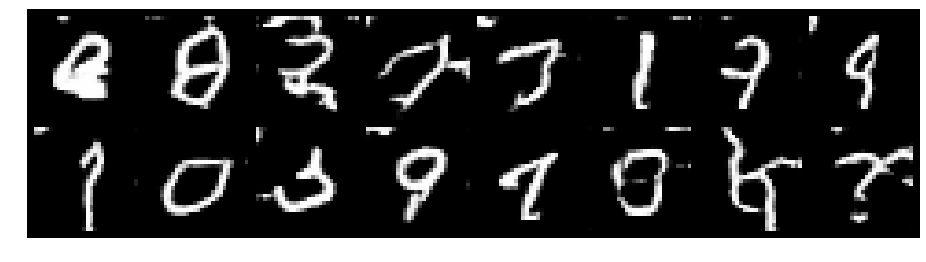

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.1069, Generator Loss: 1.0579
D(x): 0.6204, D(G(z)): 0.3724


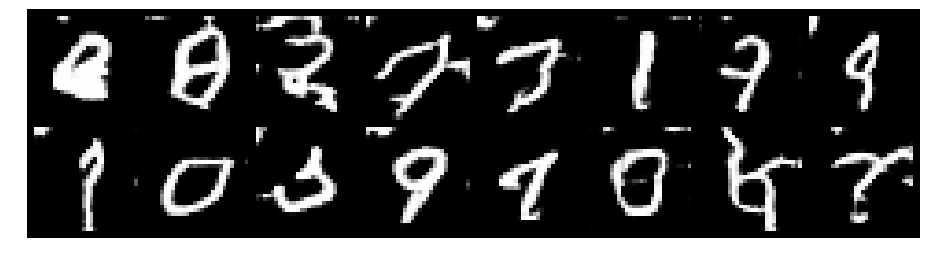

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 0.9798, Generator Loss: 1.1916
D(x): 0.6509, D(G(z)): 0.3358


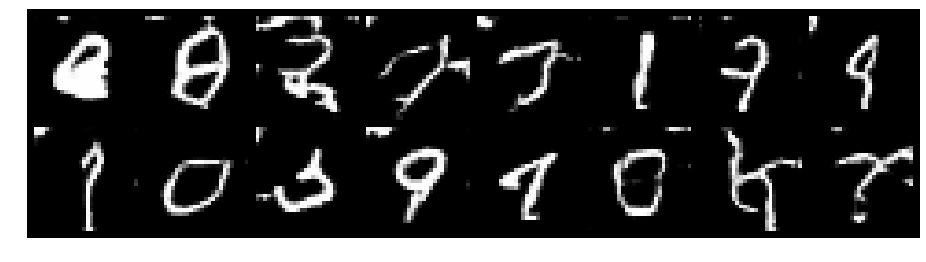

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.0986, Generator Loss: 1.0917
D(x): 0.5883, D(G(z)): 0.3449


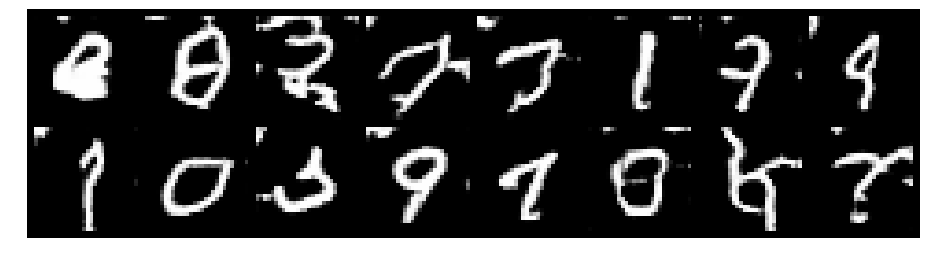

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.0249, Generator Loss: 1.1936
D(x): 0.6216, D(G(z)): 0.3308


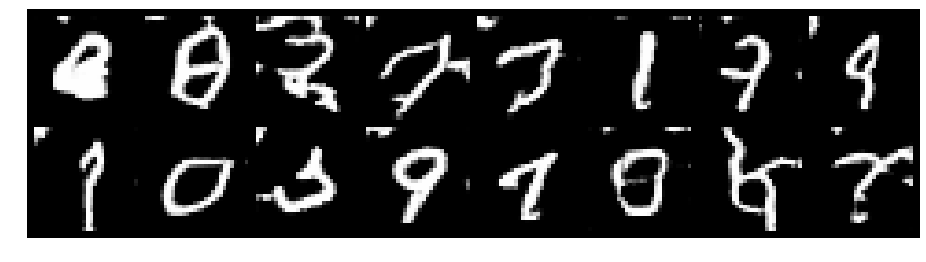

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.1108, Generator Loss: 1.0287
D(x): 0.6584, D(G(z)): 0.4161


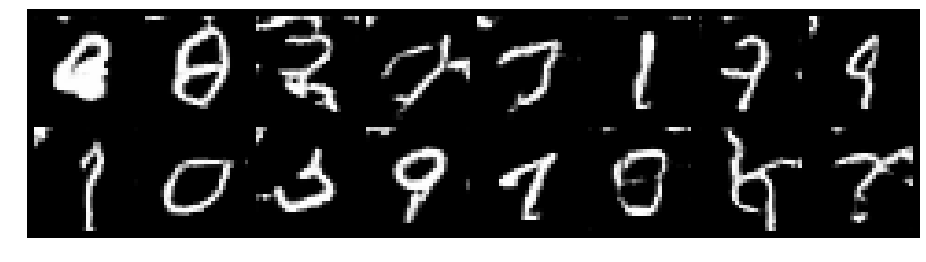

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0340, Generator Loss: 1.0357
D(x): 0.6302, D(G(z)): 0.3607


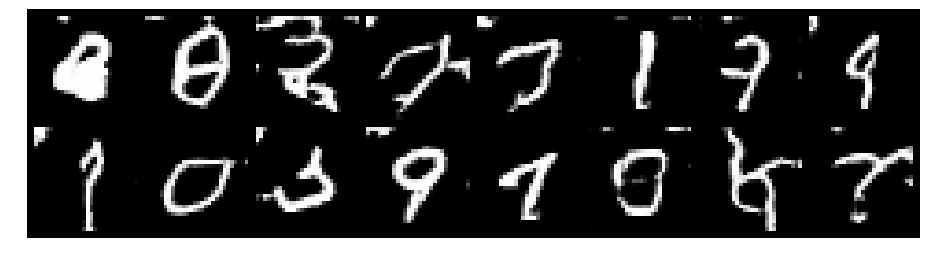

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0823, Generator Loss: 1.1312
D(x): 0.5969, D(G(z)): 0.3511


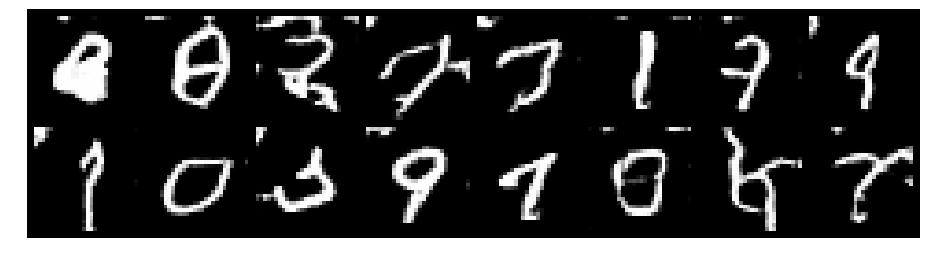

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.0009, Generator Loss: 0.9332
D(x): 0.7213, D(G(z)): 0.4115


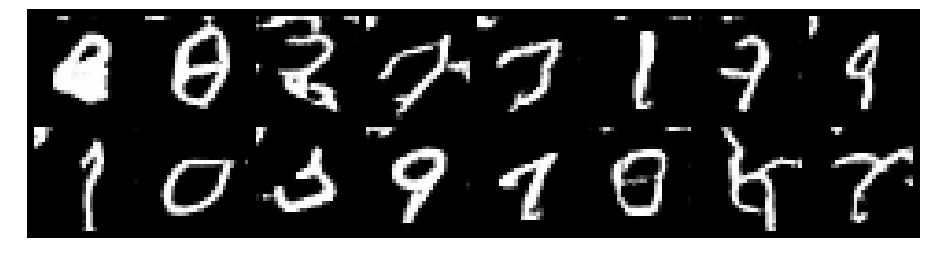

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.1238, Generator Loss: 1.1145
D(x): 0.6251, D(G(z)): 0.3820


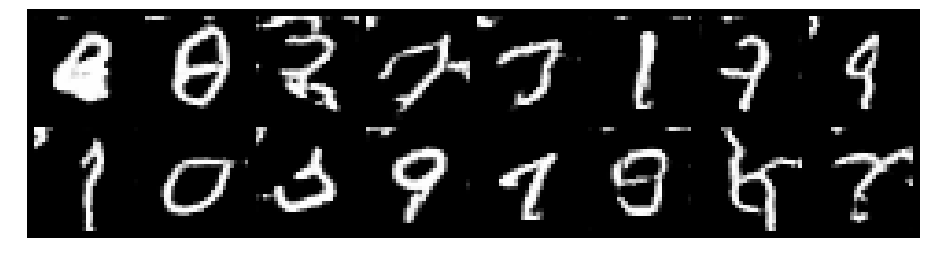

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 0.9788, Generator Loss: 0.9869
D(x): 0.7107, D(G(z)): 0.4025


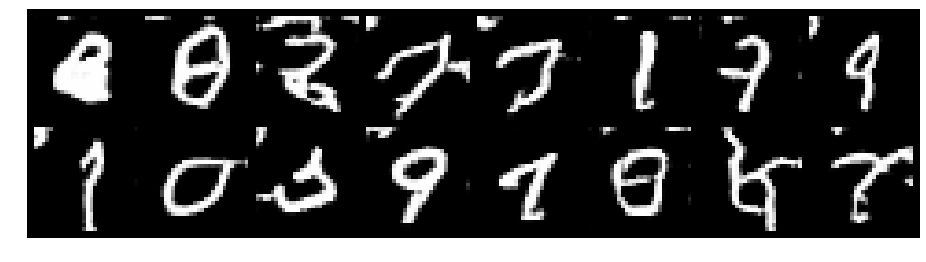

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.0940, Generator Loss: 1.0792
D(x): 0.6657, D(G(z)): 0.4084


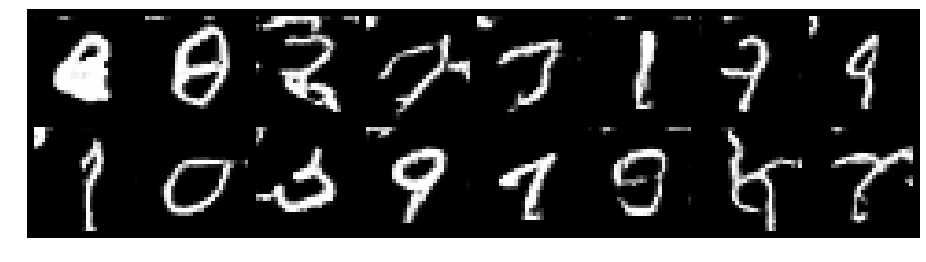

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.0281, Generator Loss: 0.8947
D(x): 0.6503, D(G(z)): 0.3695


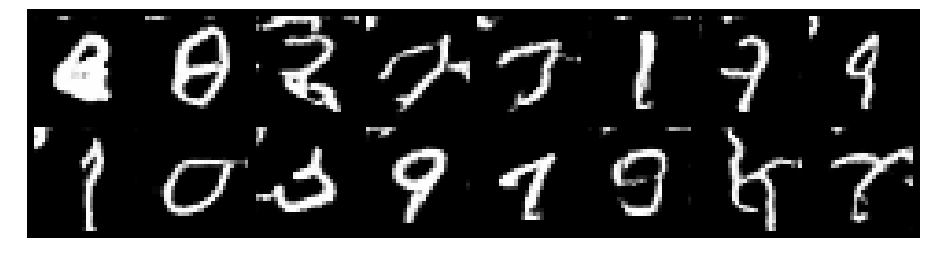

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.1150, Generator Loss: 1.2847
D(x): 0.6083, D(G(z)): 0.3800


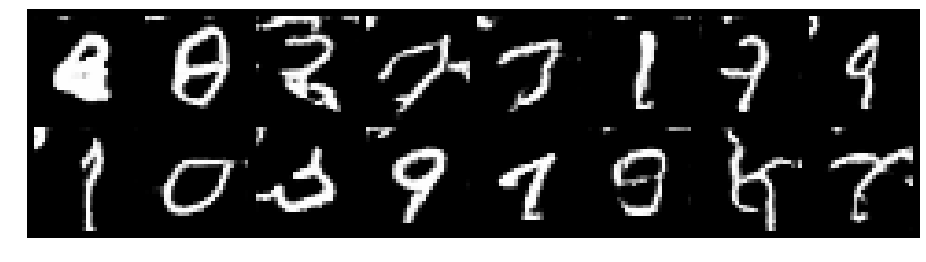

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.1668, Generator Loss: 1.1185
D(x): 0.6259, D(G(z)): 0.3956


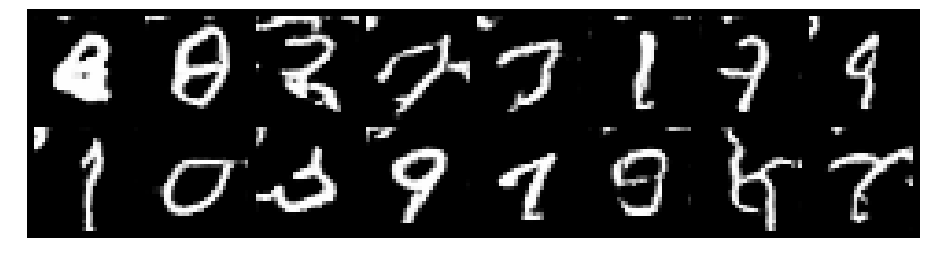

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.0818, Generator Loss: 1.1298
D(x): 0.6548, D(G(z)): 0.4015


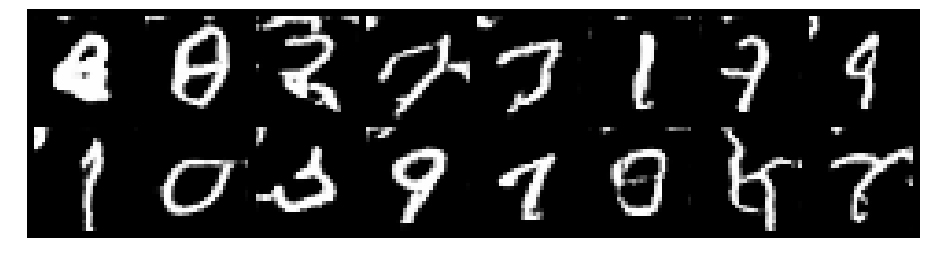

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.1881, Generator Loss: 1.1742
D(x): 0.5917, D(G(z)): 0.3805


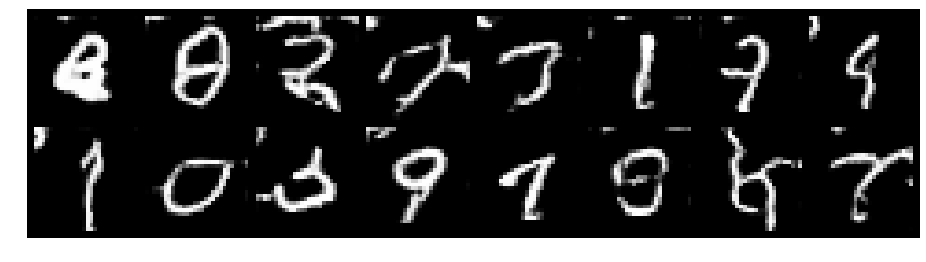

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0563, Generator Loss: 1.1168
D(x): 0.6343, D(G(z)): 0.3662


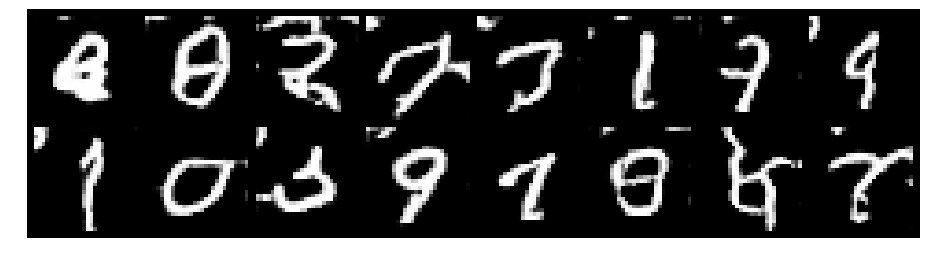

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.1163, Generator Loss: 1.1237
D(x): 0.6494, D(G(z)): 0.3937


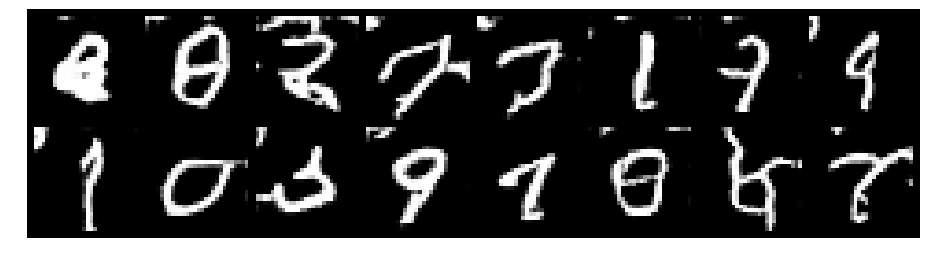

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.0761, Generator Loss: 1.0267
D(x): 0.6438, D(G(z)): 0.3812


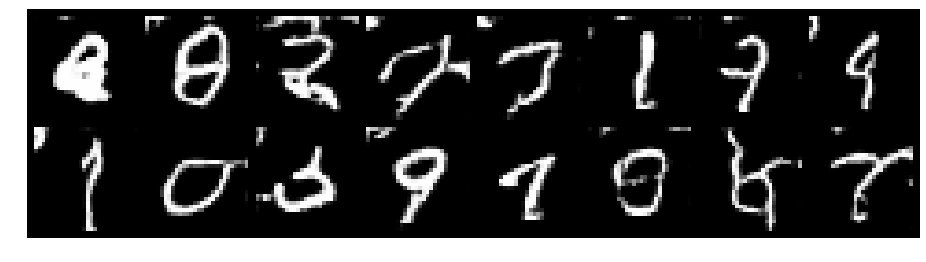

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.0590, Generator Loss: 1.1912
D(x): 0.6149, D(G(z)): 0.3535


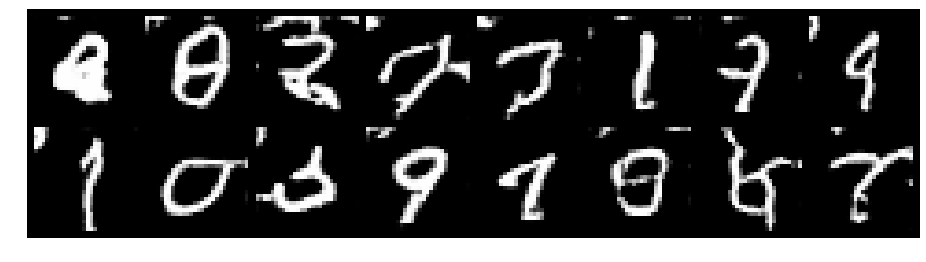

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.0794, Generator Loss: 1.0916
D(x): 0.6324, D(G(z)): 0.3794


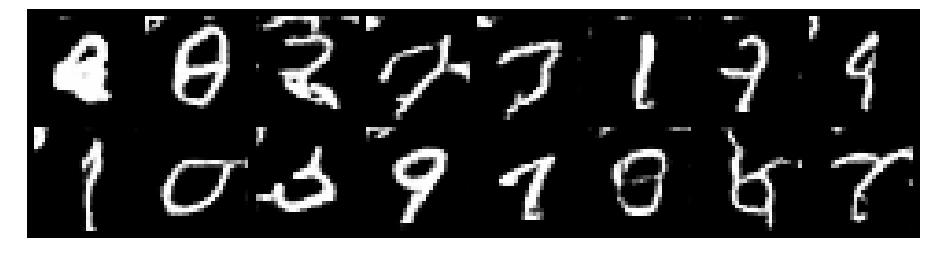

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.1087, Generator Loss: 1.1131
D(x): 0.6223, D(G(z)): 0.3903


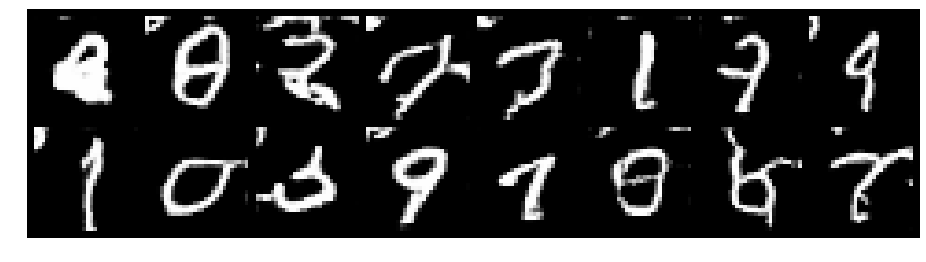

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0970, Generator Loss: 1.1256
D(x): 0.6616, D(G(z)): 0.4052


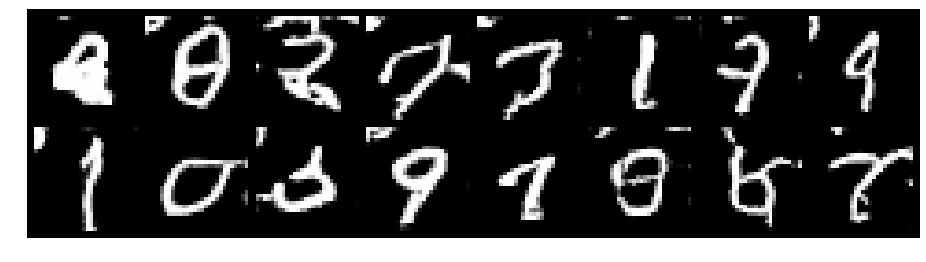

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.0374, Generator Loss: 1.0292
D(x): 0.6809, D(G(z)): 0.4036


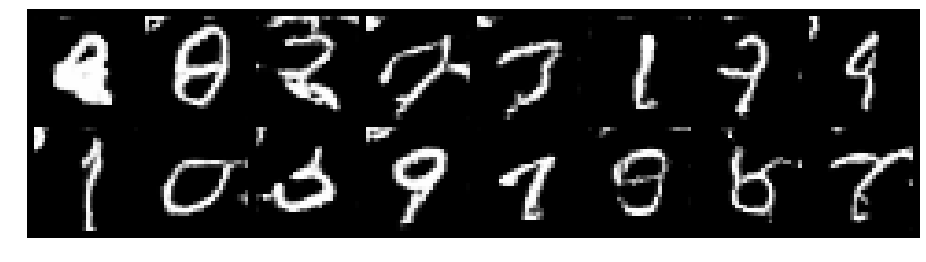

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.0767, Generator Loss: 0.9968
D(x): 0.6510, D(G(z)): 0.3990


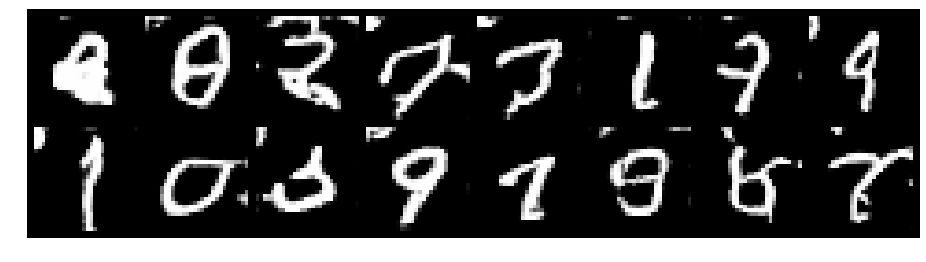

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.0599, Generator Loss: 1.0016
D(x): 0.6650, D(G(z)): 0.3913


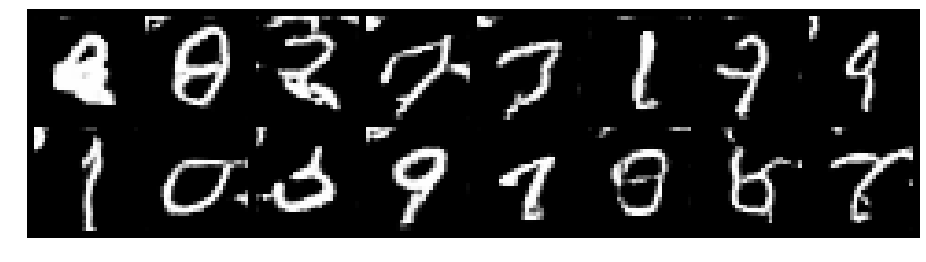

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1462, Generator Loss: 1.1096
D(x): 0.5845, D(G(z)): 0.3679


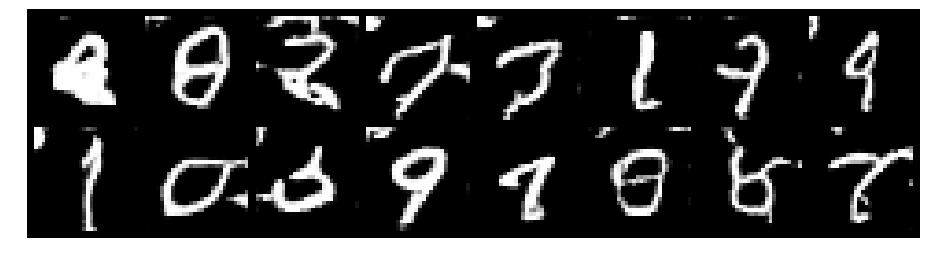

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.1725, Generator Loss: 1.0086
D(x): 0.6446, D(G(z)): 0.4257


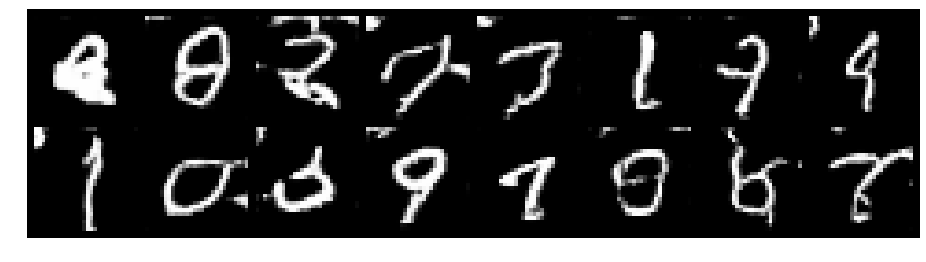

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1821, Generator Loss: 1.1155
D(x): 0.6032, D(G(z)): 0.3997


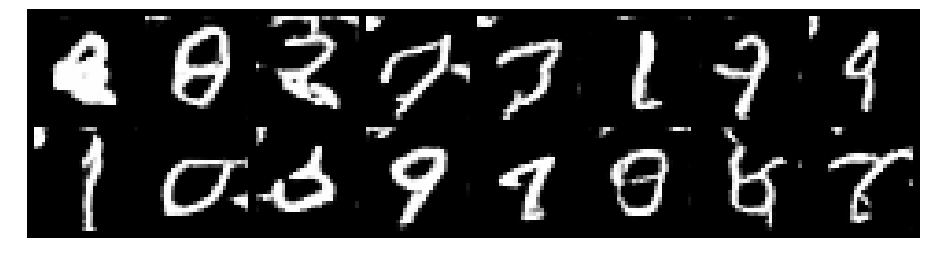

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.0904, Generator Loss: 1.0363
D(x): 0.6335, D(G(z)): 0.3982


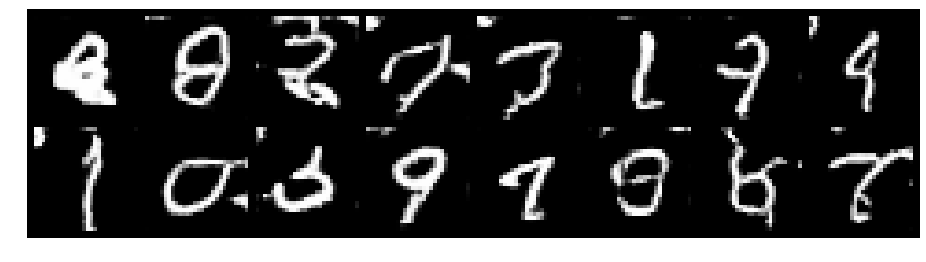

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.1014, Generator Loss: 1.0933
D(x): 0.6214, D(G(z)): 0.3644


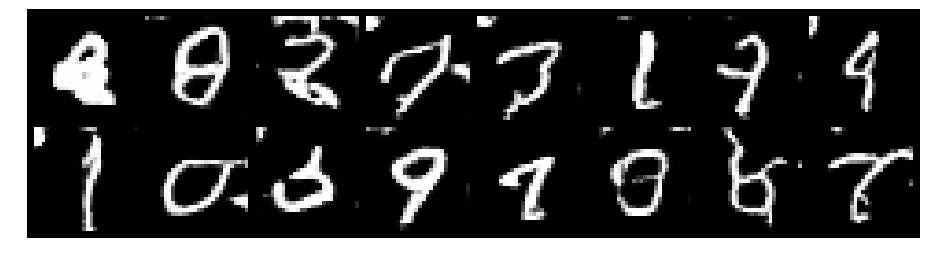

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.1911, Generator Loss: 1.0882
D(x): 0.6051, D(G(z)): 0.4110


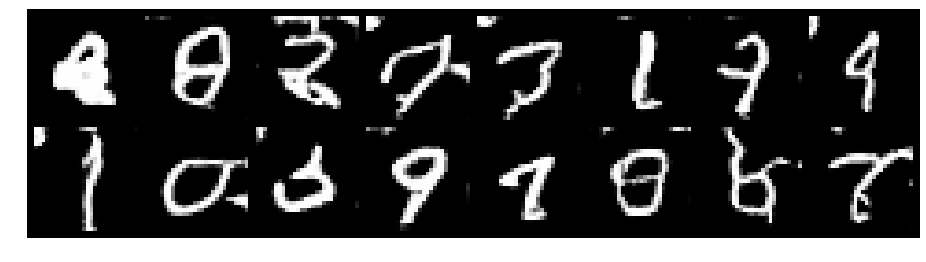

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.1444, Generator Loss: 1.1303
D(x): 0.6343, D(G(z)): 0.4021


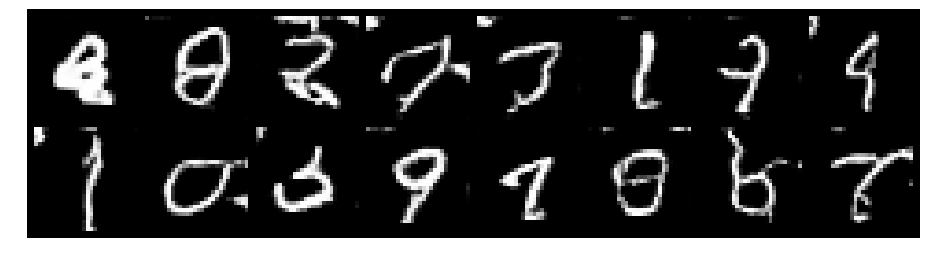

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.0667, Generator Loss: 1.1801
D(x): 0.6302, D(G(z)): 0.3615


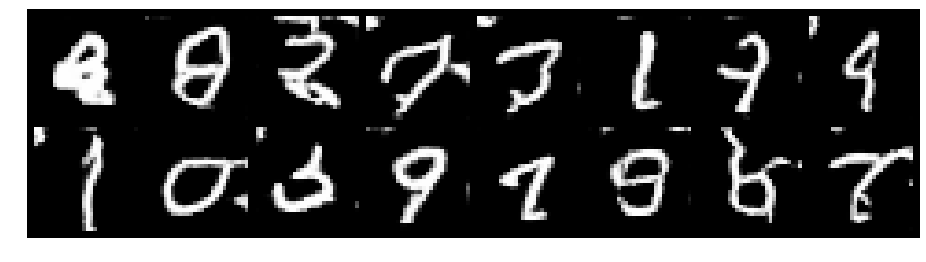

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.1943, Generator Loss: 1.0525
D(x): 0.6171, D(G(z)): 0.4054


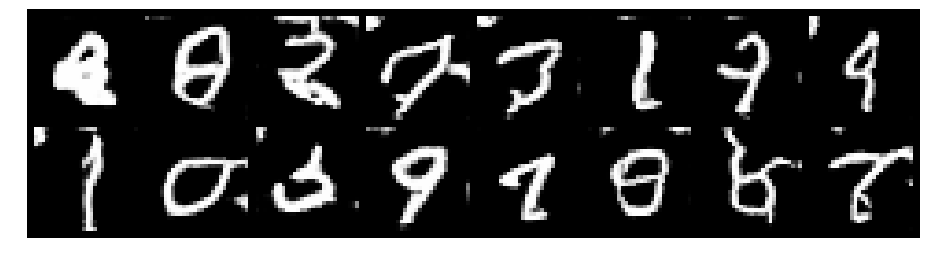

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 0.9801, Generator Loss: 1.1164
D(x): 0.6805, D(G(z)): 0.3654


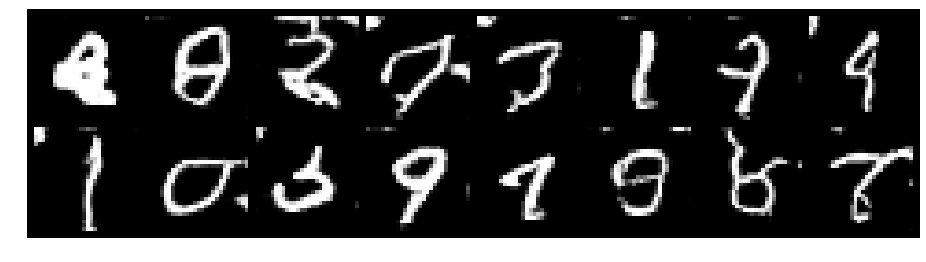

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.1201, Generator Loss: 1.1547
D(x): 0.5798, D(G(z)): 0.3530


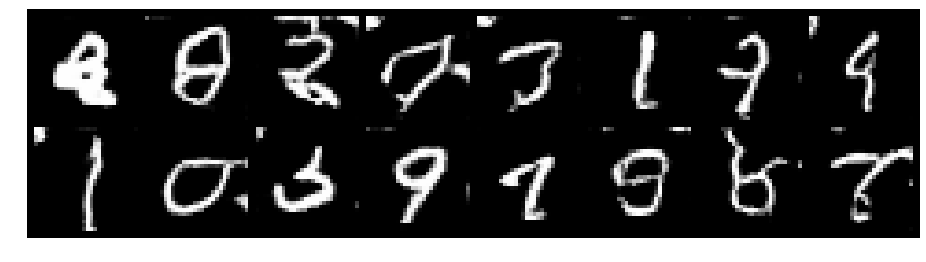

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.0758, Generator Loss: 1.1088
D(x): 0.6196, D(G(z)): 0.3601


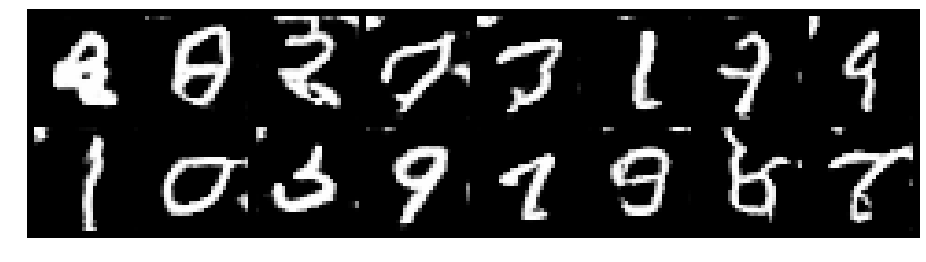

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.0384, Generator Loss: 1.0726
D(x): 0.6203, D(G(z)): 0.3534


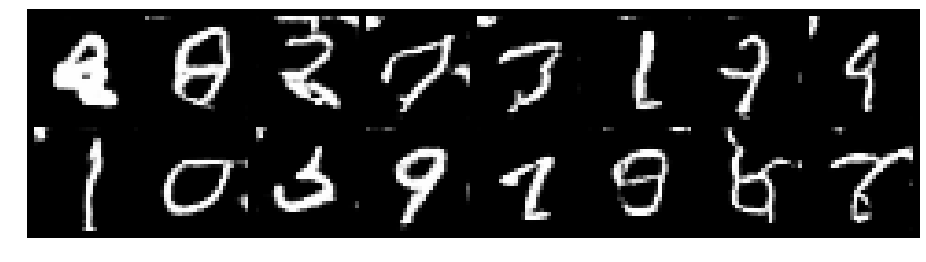

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.0266, Generator Loss: 1.0530
D(x): 0.6568, D(G(z)): 0.3771


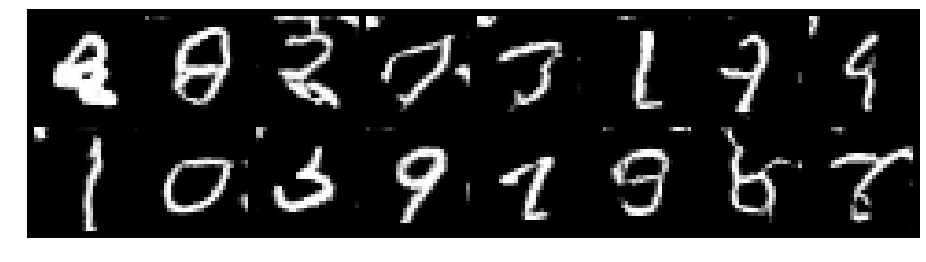

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.0674, Generator Loss: 1.0849
D(x): 0.5967, D(G(z)): 0.3340


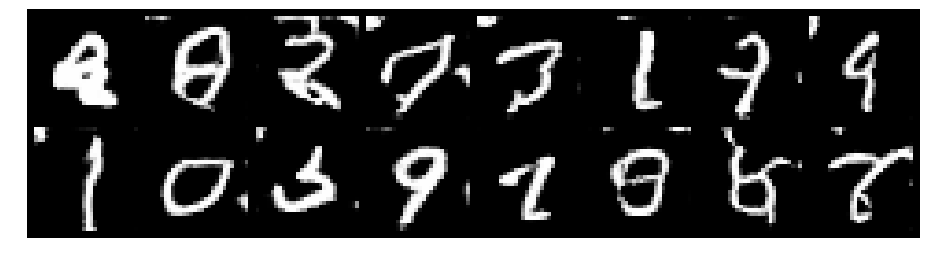

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.2074, Generator Loss: 1.0515
D(x): 0.6073, D(G(z)): 0.4115


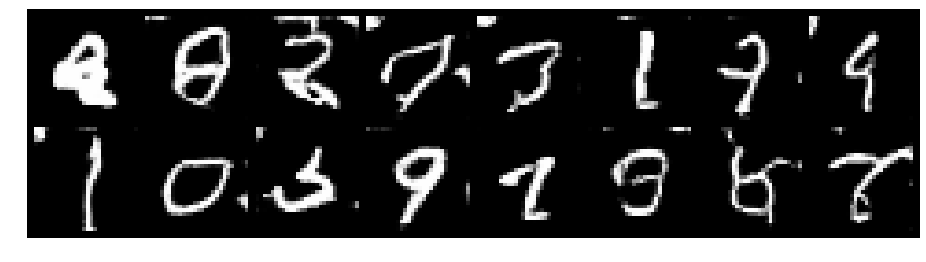

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1132, Generator Loss: 1.0038
D(x): 0.6318, D(G(z)): 0.3971


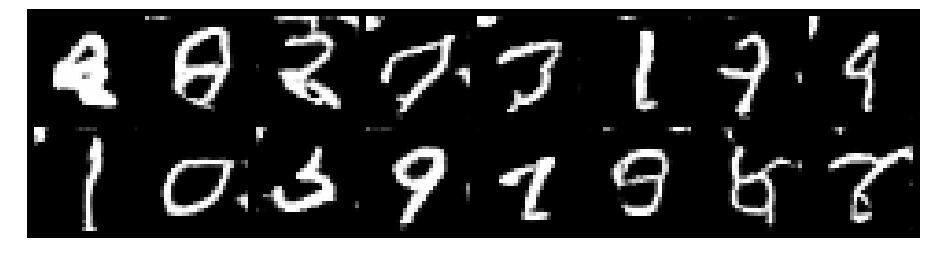

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.1018, Generator Loss: 1.1093
D(x): 0.6466, D(G(z)): 0.3918


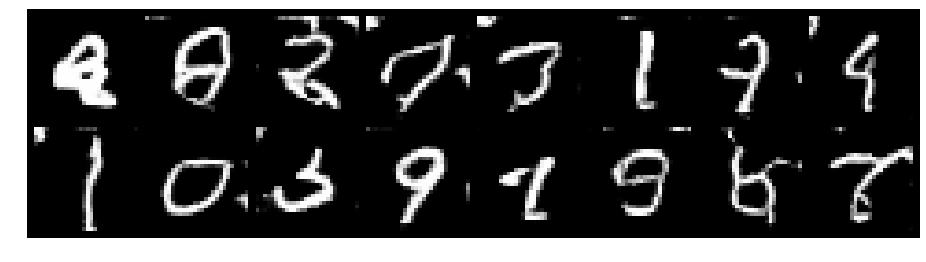

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.0734, Generator Loss: 1.0583
D(x): 0.6332, D(G(z)): 0.3757


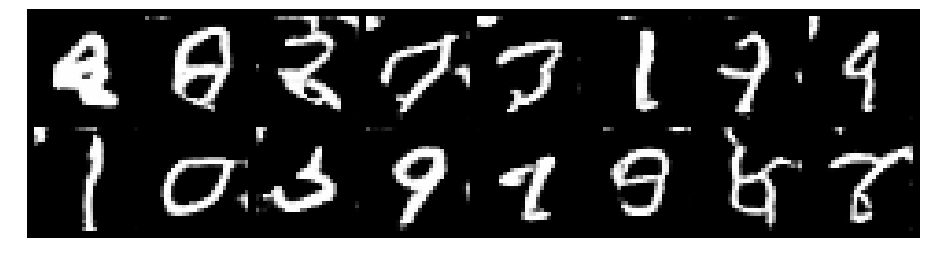

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1495, Generator Loss: 1.1884
D(x): 0.6279, D(G(z)): 0.3819


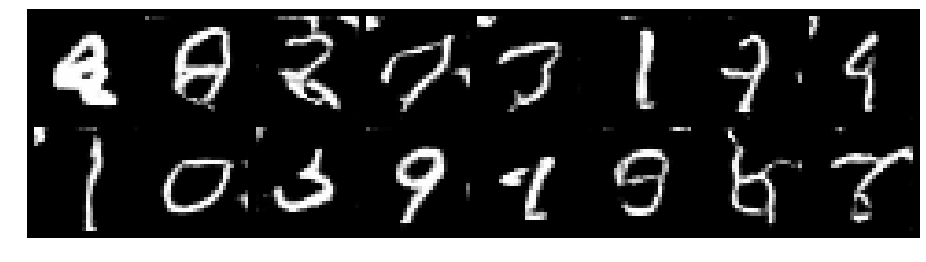

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1665, Generator Loss: 1.0218
D(x): 0.6766, D(G(z)): 0.4438


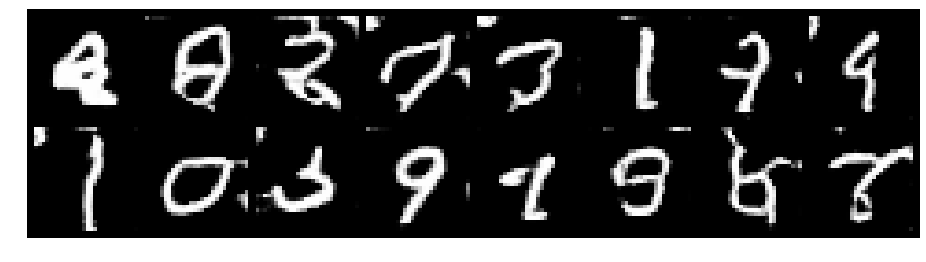

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.3257, Generator Loss: 1.0446
D(x): 0.5745, D(G(z)): 0.4313


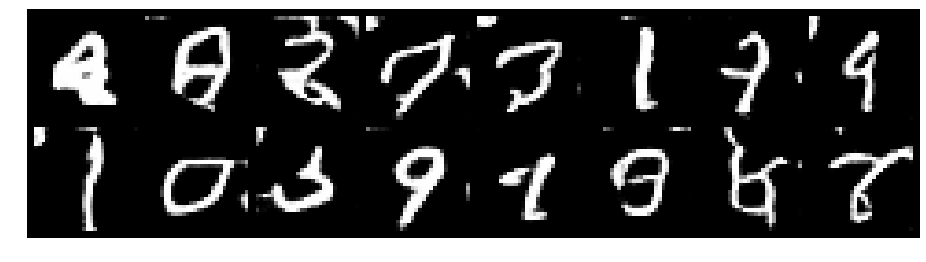

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.0131, Generator Loss: 1.0572
D(x): 0.6929, D(G(z)): 0.3949


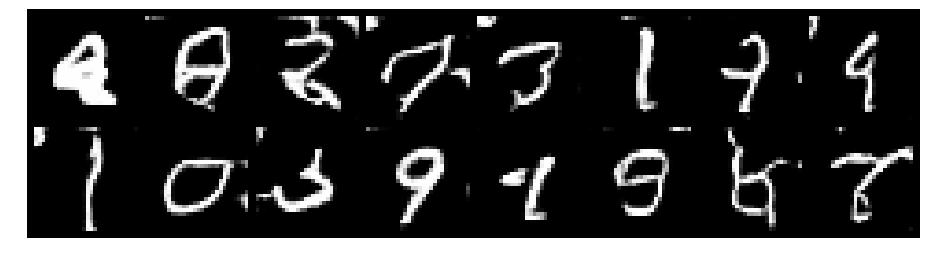

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.1417, Generator Loss: 1.1212
D(x): 0.5871, D(G(z)): 0.3627


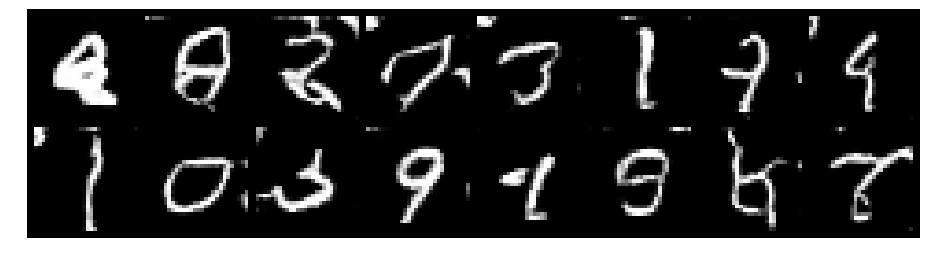

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.1418, Generator Loss: 1.0772
D(x): 0.5975, D(G(z)): 0.3782


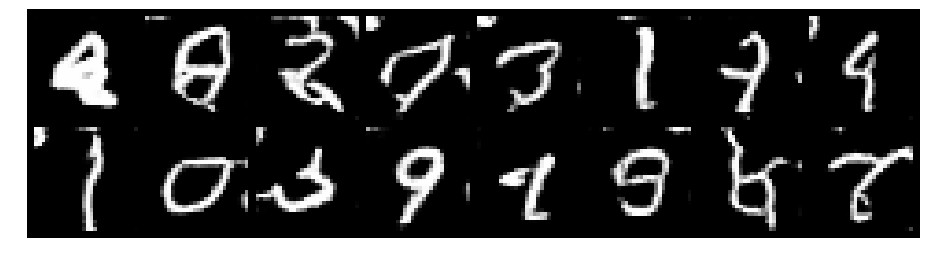

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0793, Generator Loss: 1.1394
D(x): 0.6320, D(G(z)): 0.3850


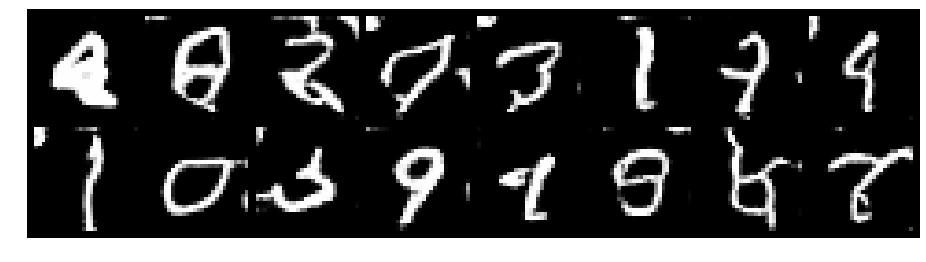

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.0303, Generator Loss: 1.1214
D(x): 0.6651, D(G(z)): 0.3845


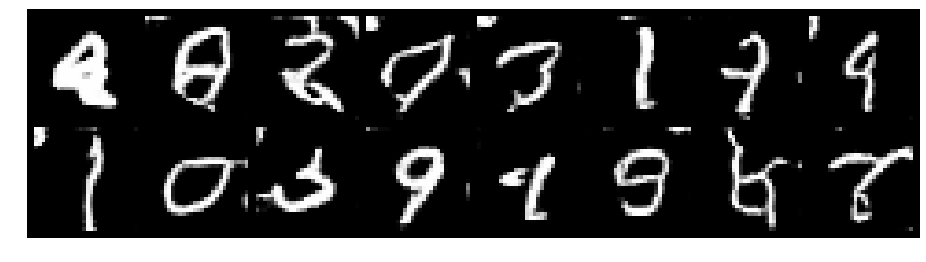

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.1774, Generator Loss: 1.1635
D(x): 0.5366, D(G(z)): 0.3227


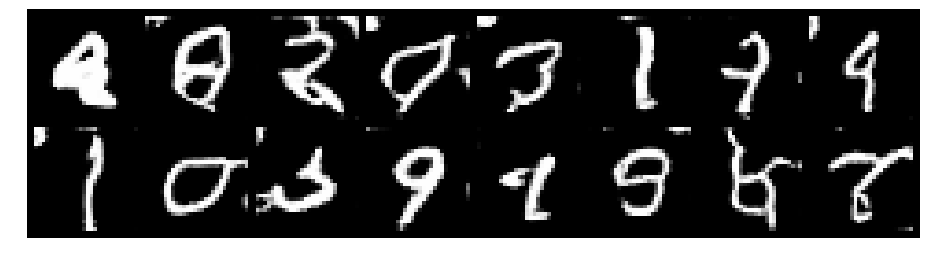

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.1675, Generator Loss: 1.0679
D(x): 0.5955, D(G(z)): 0.3922


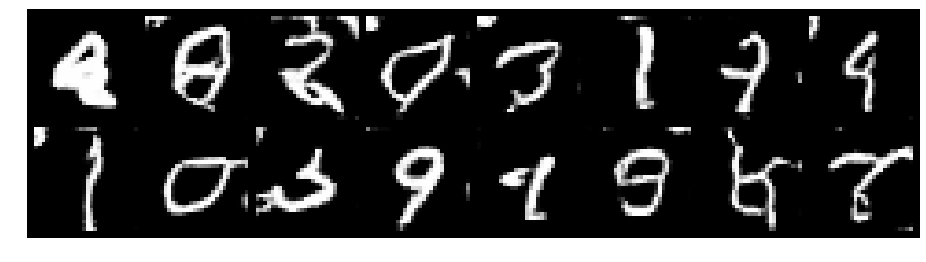

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.0795, Generator Loss: 1.0093
D(x): 0.6102, D(G(z)): 0.3560


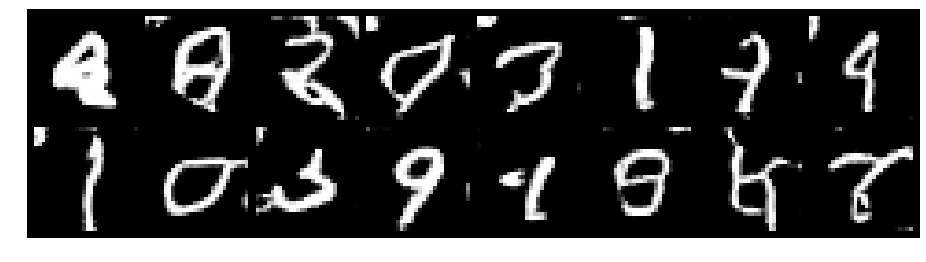

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.0700, Generator Loss: 1.0800
D(x): 0.6213, D(G(z)): 0.3771


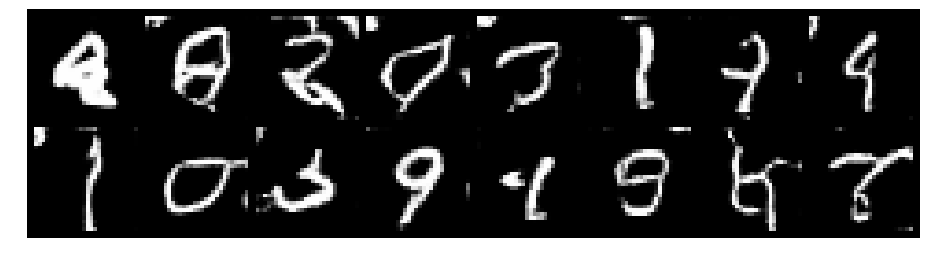

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.2098, Generator Loss: 1.1752
D(x): 0.6011, D(G(z)): 0.3975


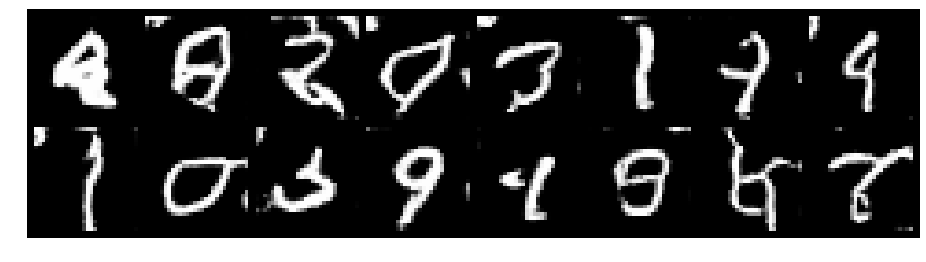

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 0.9985, Generator Loss: 1.1591
D(x): 0.6368, D(G(z)): 0.3599


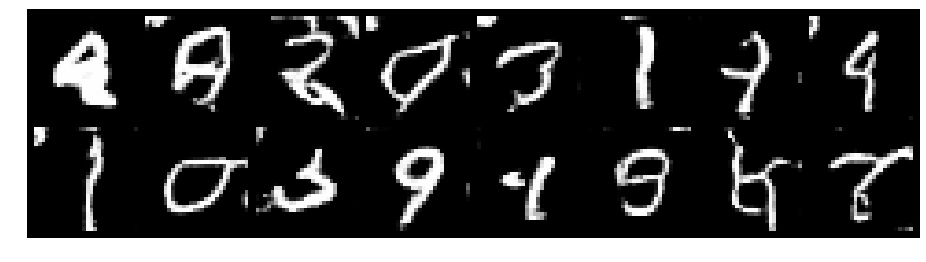

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.0625, Generator Loss: 1.0278
D(x): 0.6669, D(G(z)): 0.4078


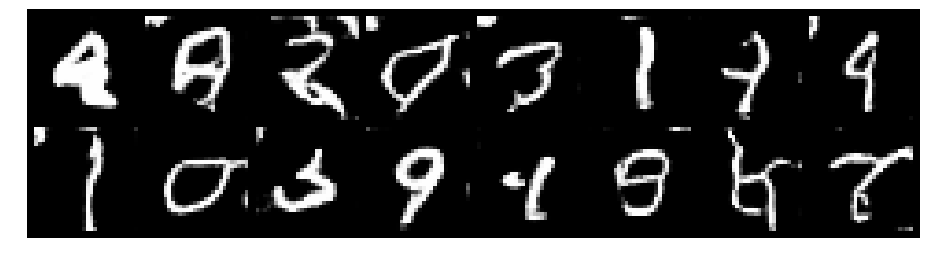

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.0851, Generator Loss: 1.1858
D(x): 0.6042, D(G(z)): 0.3447


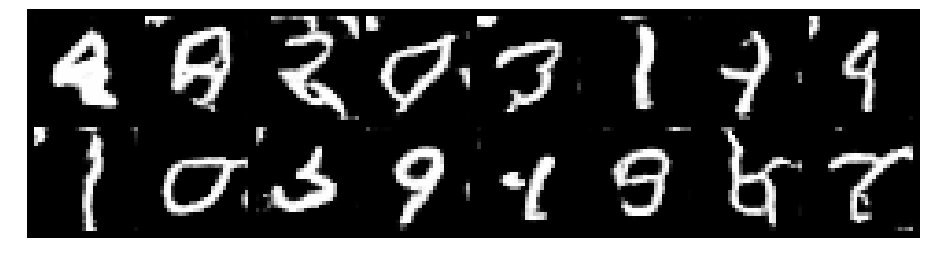

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.0720, Generator Loss: 1.0376
D(x): 0.6512, D(G(z)): 0.3924


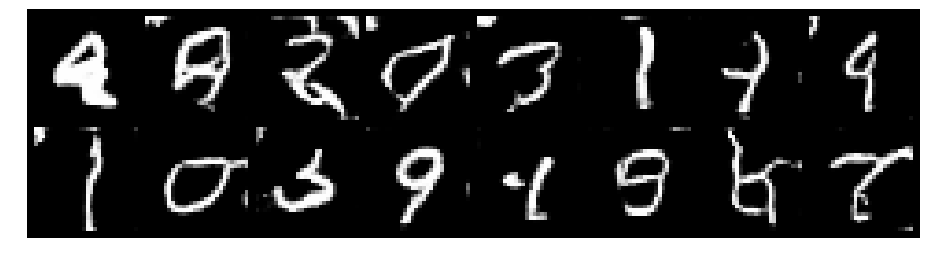

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.1055, Generator Loss: 1.1859
D(x): 0.5800, D(G(z)): 0.3347


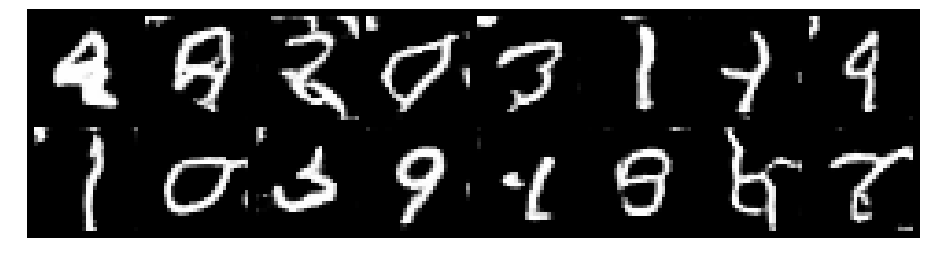

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.0899, Generator Loss: 1.0733
D(x): 0.6321, D(G(z)): 0.3853


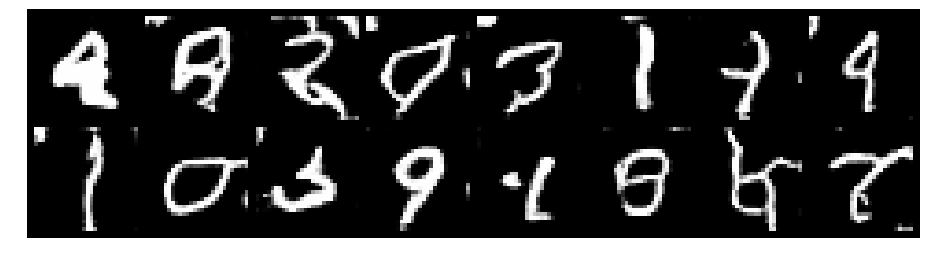

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.1482, Generator Loss: 1.0389
D(x): 0.5902, D(G(z)): 0.3834


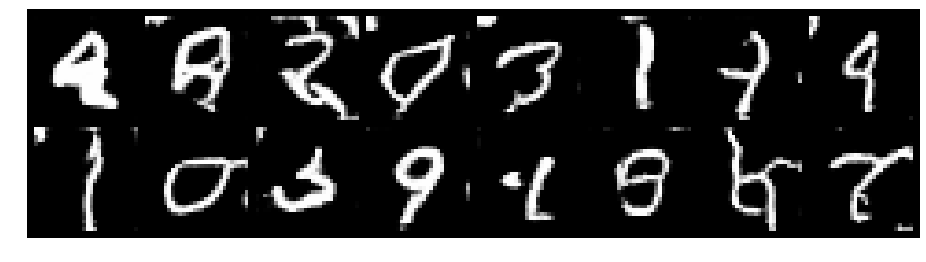

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.0607, Generator Loss: 1.0201
D(x): 0.6347, D(G(z)): 0.3700


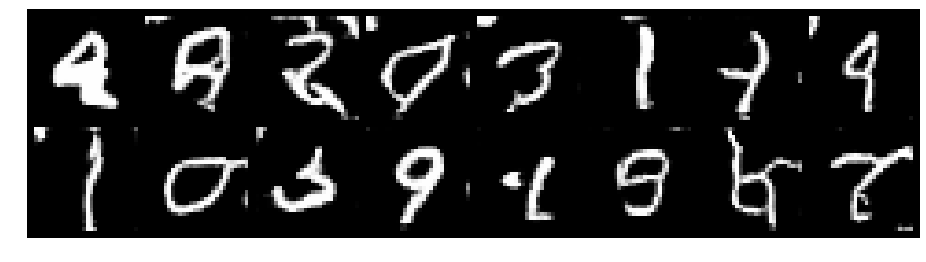

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.0945, Generator Loss: 1.0013
D(x): 0.5969, D(G(z)): 0.3640


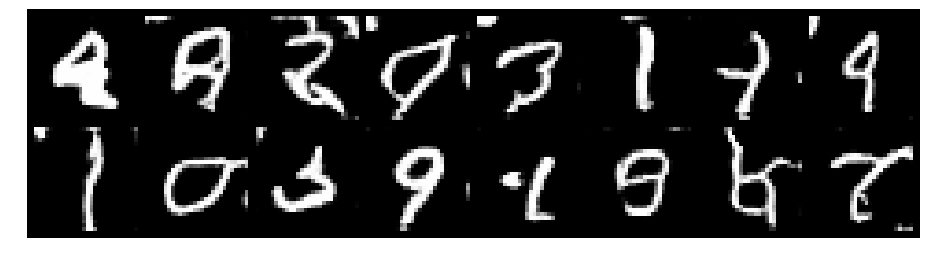

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.1344, Generator Loss: 1.1428
D(x): 0.6218, D(G(z)): 0.3937


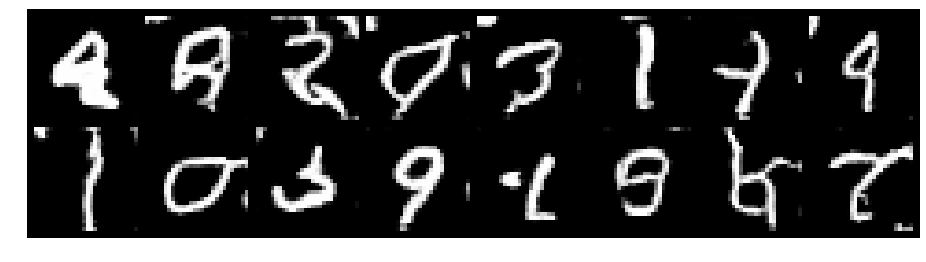

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.2098, Generator Loss: 1.0937
D(x): 0.6283, D(G(z)): 0.4354


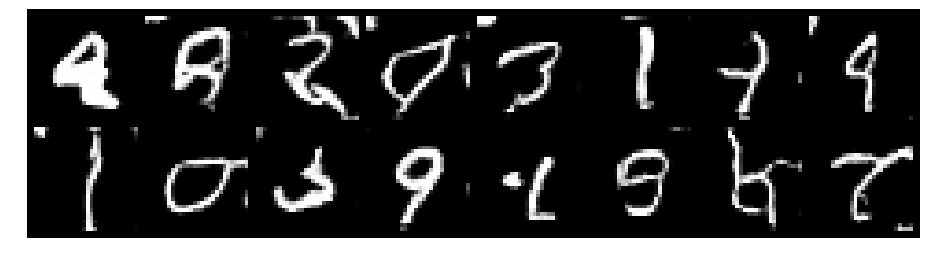

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.0932, Generator Loss: 1.2467
D(x): 0.6274, D(G(z)): 0.3870


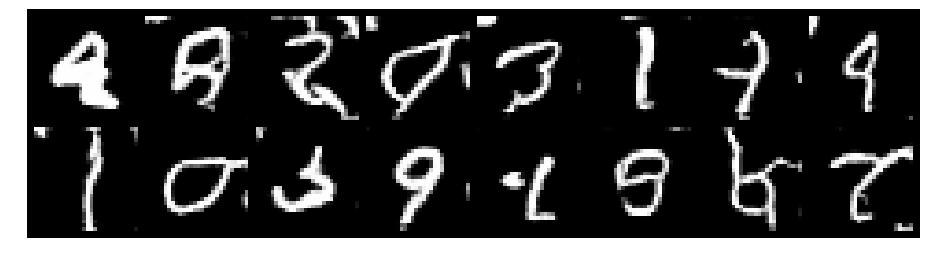

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1506, Generator Loss: 1.1925
D(x): 0.5875, D(G(z)): 0.3555


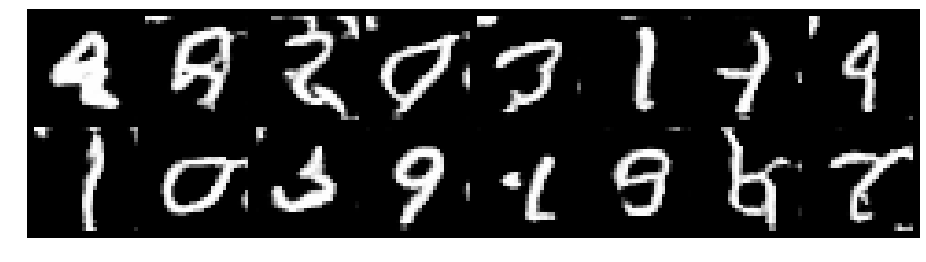

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.1782, Generator Loss: 1.1233
D(x): 0.5997, D(G(z)): 0.3958


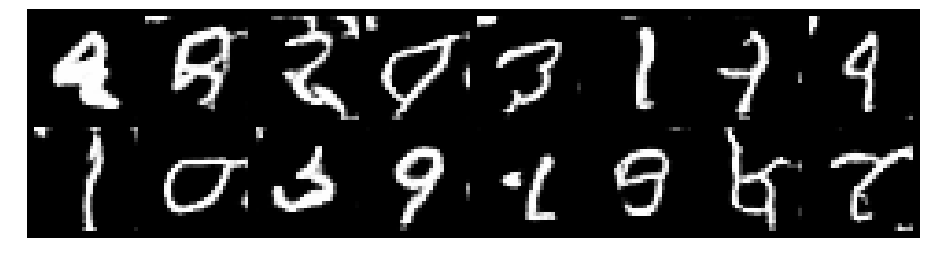

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.1585, Generator Loss: 1.0799
D(x): 0.6137, D(G(z)): 0.3902


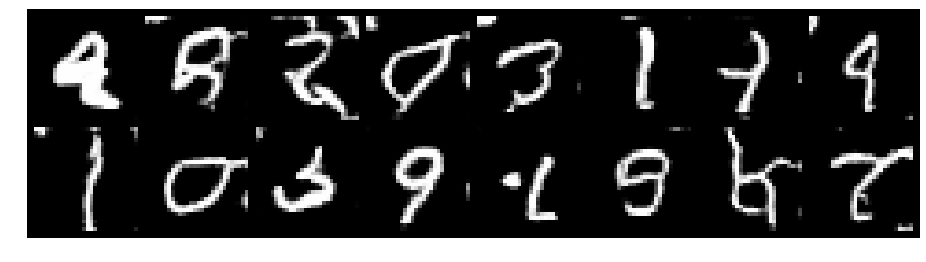

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.0368, Generator Loss: 1.1765
D(x): 0.6046, D(G(z)): 0.3309


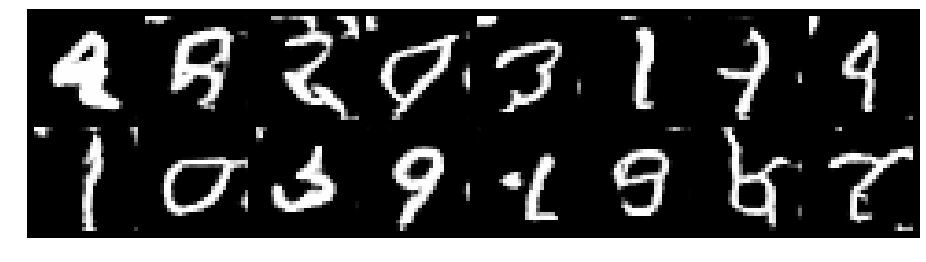

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.1244, Generator Loss: 1.0748
D(x): 0.6297, D(G(z)): 0.3940


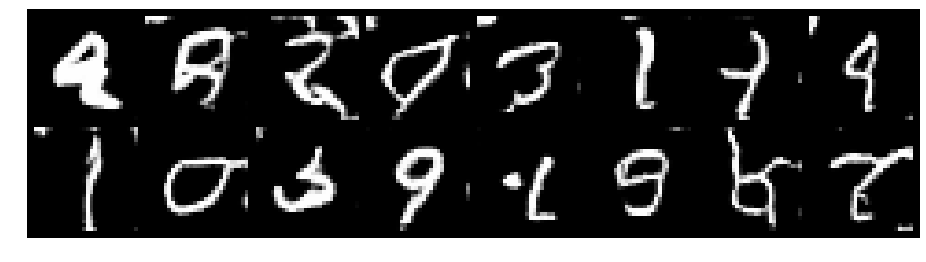

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.0708, Generator Loss: 1.0281
D(x): 0.6329, D(G(z)): 0.3707


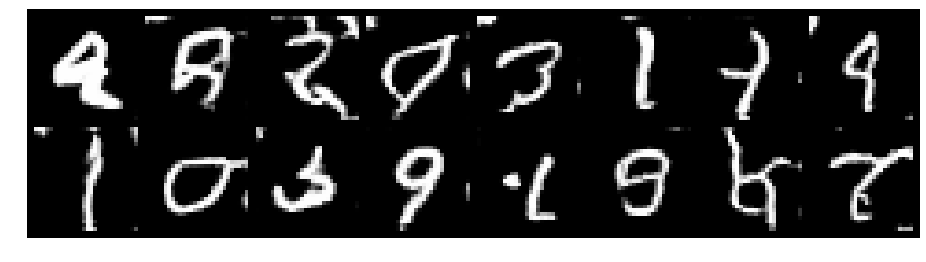

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.0378, Generator Loss: 1.0277
D(x): 0.6416, D(G(z)): 0.3623


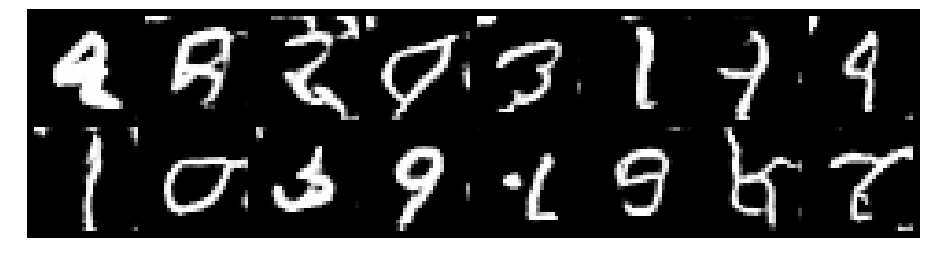

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.0779, Generator Loss: 1.0589
D(x): 0.6615, D(G(z)): 0.4068


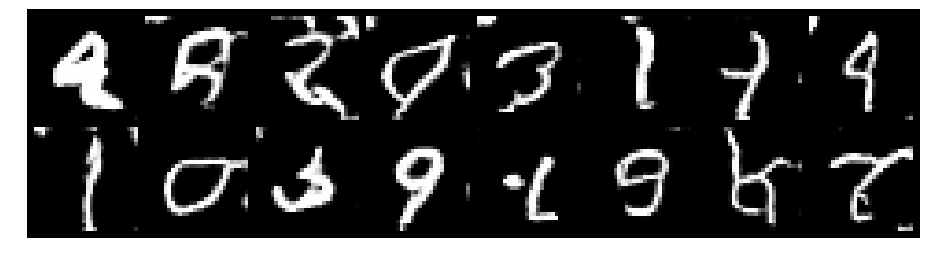

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.0252, Generator Loss: 1.1011
D(x): 0.6590, D(G(z)): 0.3783


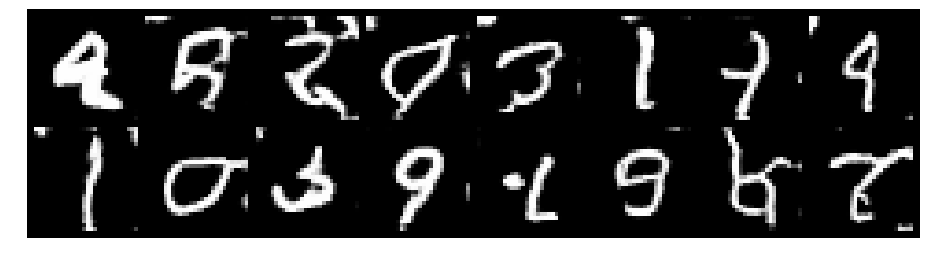

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.1128, Generator Loss: 1.1228
D(x): 0.5770, D(G(z)): 0.3354


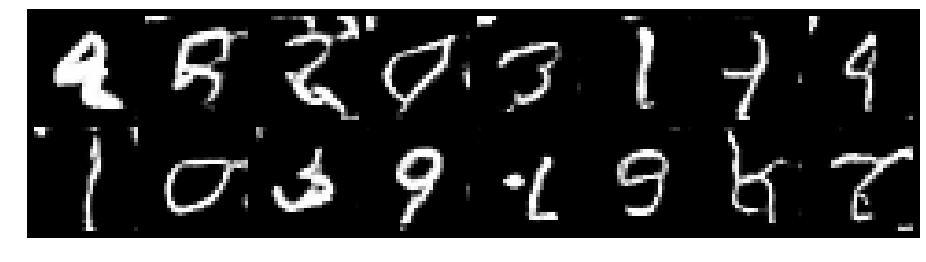

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.1655, Generator Loss: 1.0442
D(x): 0.6313, D(G(z)): 0.4161


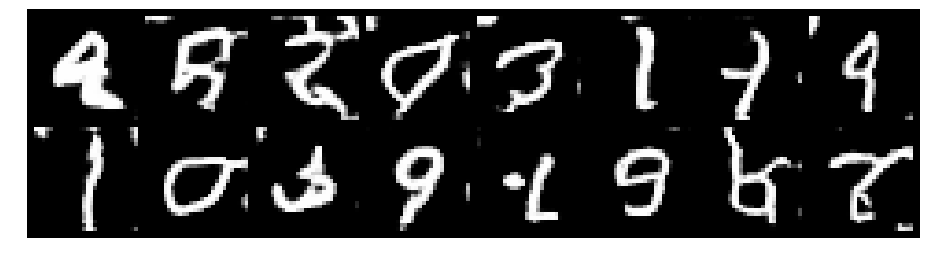

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1904, Generator Loss: 1.0246
D(x): 0.5686, D(G(z)): 0.3755


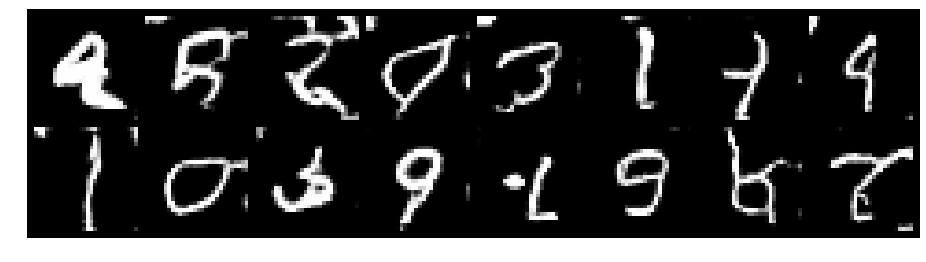

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.0939, Generator Loss: 1.0485
D(x): 0.6298, D(G(z)): 0.3841


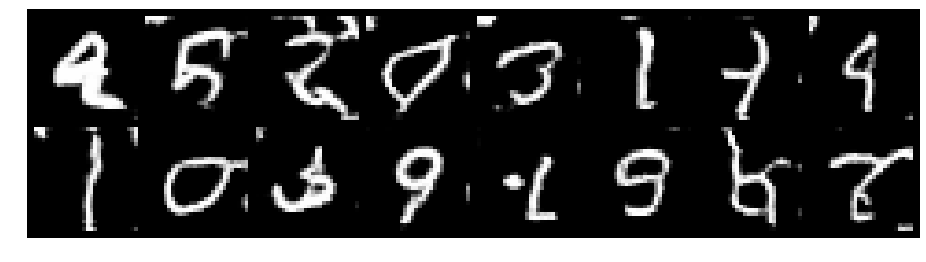

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.0897, Generator Loss: 0.9880
D(x): 0.6515, D(G(z)): 0.4029


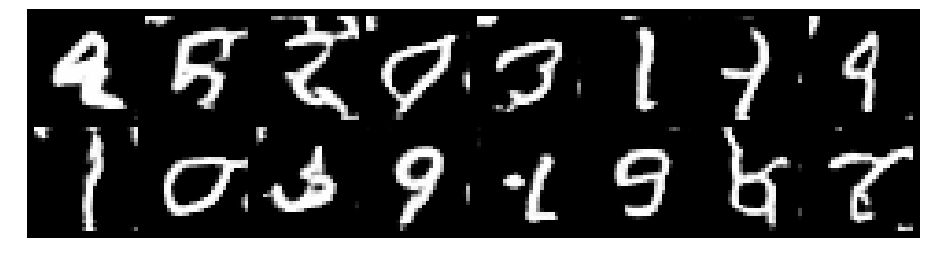

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.2236, Generator Loss: 1.1223
D(x): 0.5537, D(G(z)): 0.3766


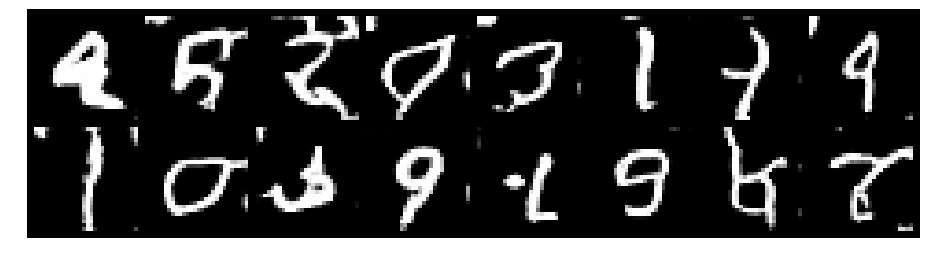

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.0566, Generator Loss: 1.0210
D(x): 0.6378, D(G(z)): 0.3682


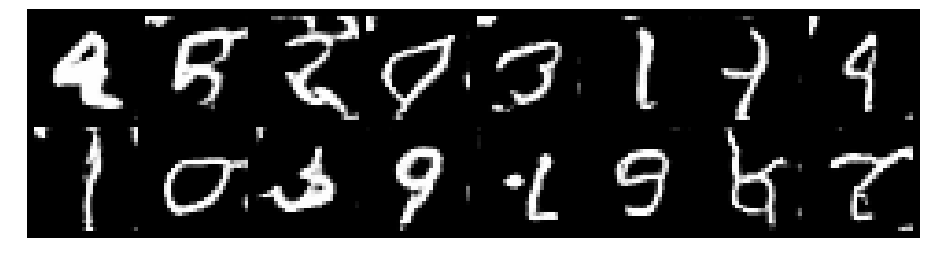

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1022, Generator Loss: 1.1266
D(x): 0.5935, D(G(z)): 0.3467


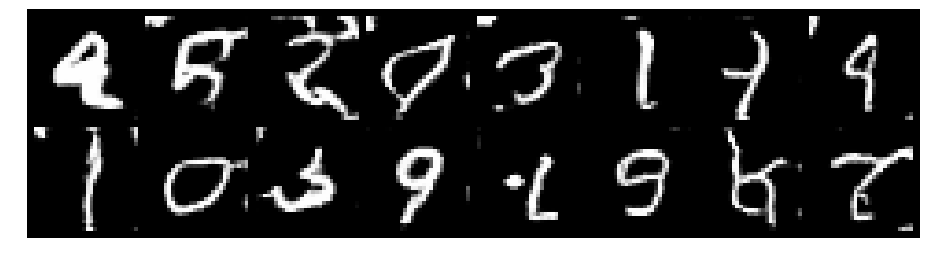

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.1490, Generator Loss: 1.1308
D(x): 0.5806, D(G(z)): 0.3678


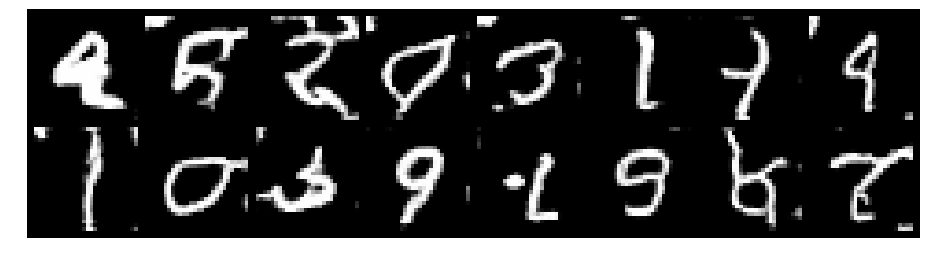

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.1682, Generator Loss: 1.1242
D(x): 0.6180, D(G(z)): 0.4088


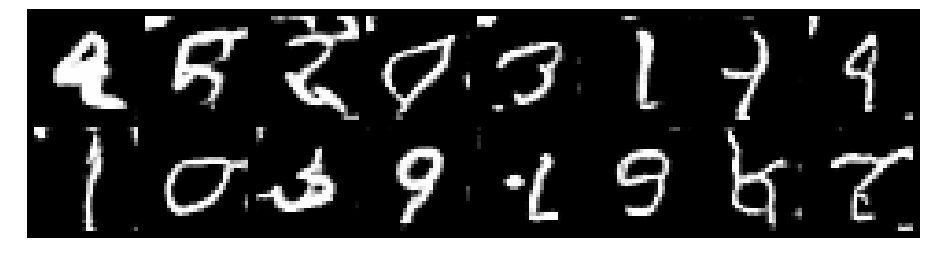

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.1482, Generator Loss: 1.1397
D(x): 0.5827, D(G(z)): 0.3658


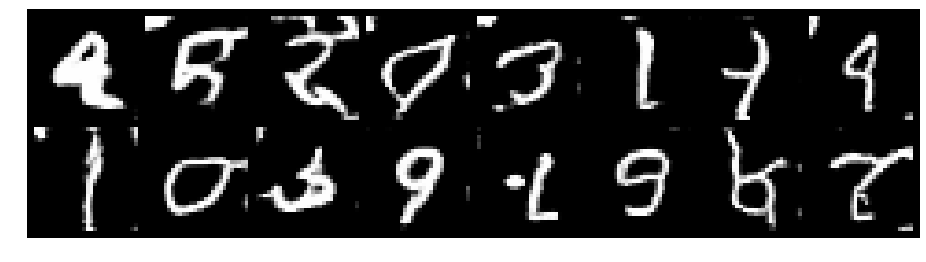

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.0311, Generator Loss: 1.0297
D(x): 0.6233, D(G(z)): 0.3360


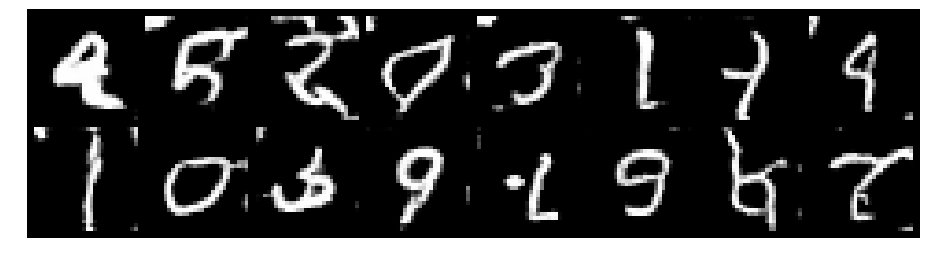

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.0528, Generator Loss: 1.1763
D(x): 0.6225, D(G(z)): 0.3560


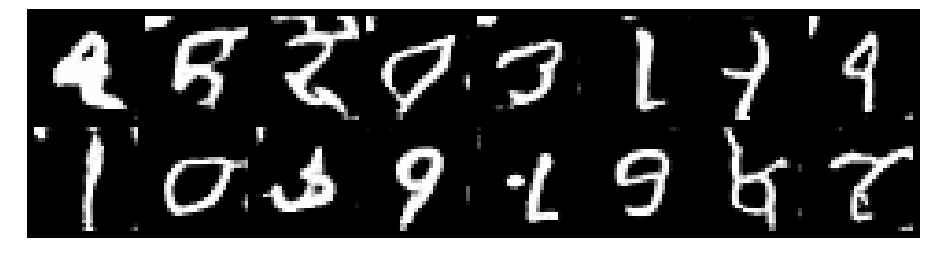

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 0.9869, Generator Loss: 1.0120
D(x): 0.6395, D(G(z)): 0.3457


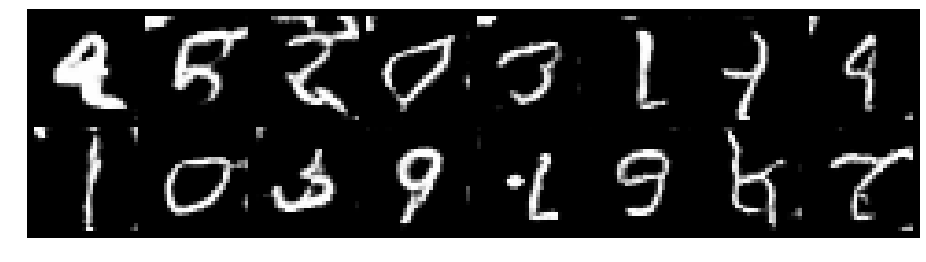

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.1402, Generator Loss: 1.1264
D(x): 0.6002, D(G(z)): 0.3785


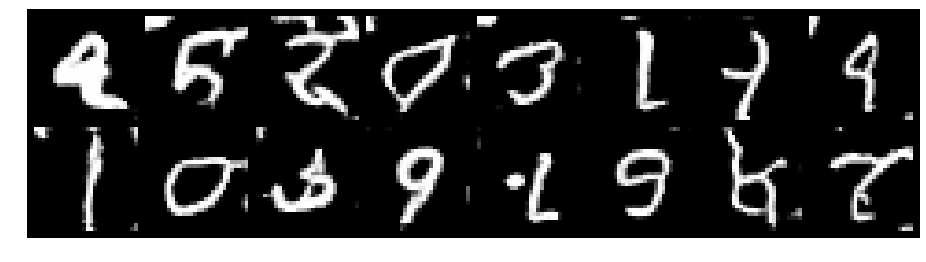

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2075, Generator Loss: 1.1236
D(x): 0.5812, D(G(z)): 0.3912


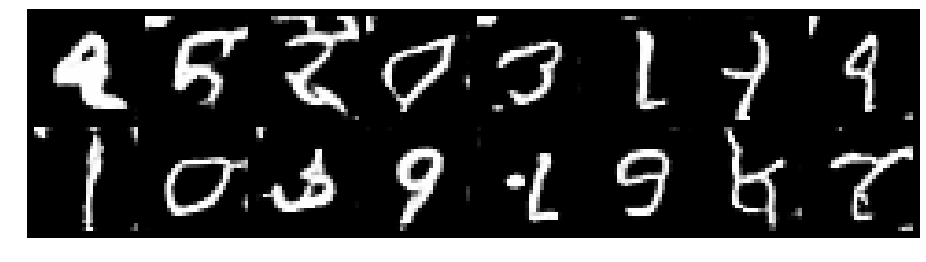

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.2410, Generator Loss: 0.9504
D(x): 0.6194, D(G(z)): 0.4396


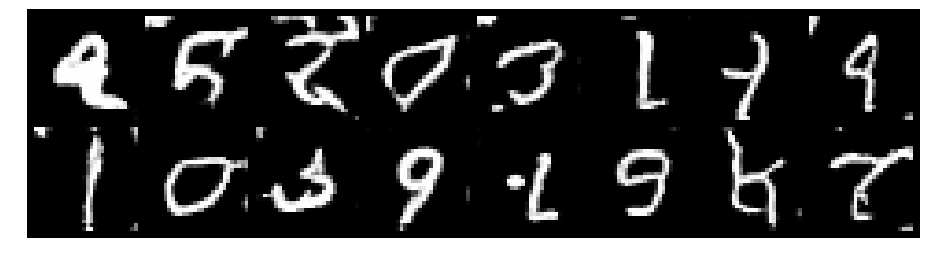

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1952, Generator Loss: 1.0142
D(x): 0.5880, D(G(z)): 0.3937


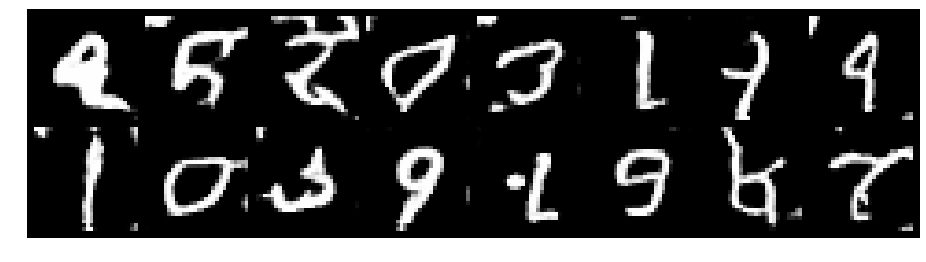

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.1647, Generator Loss: 1.0543
D(x): 0.6204, D(G(z)): 0.4049


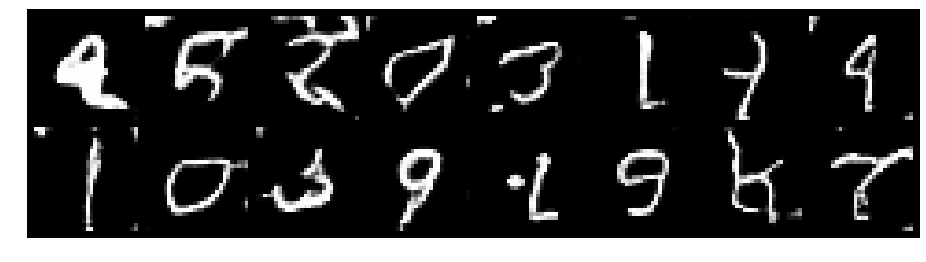

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.0571, Generator Loss: 1.0320
D(x): 0.5836, D(G(z)): 0.3152


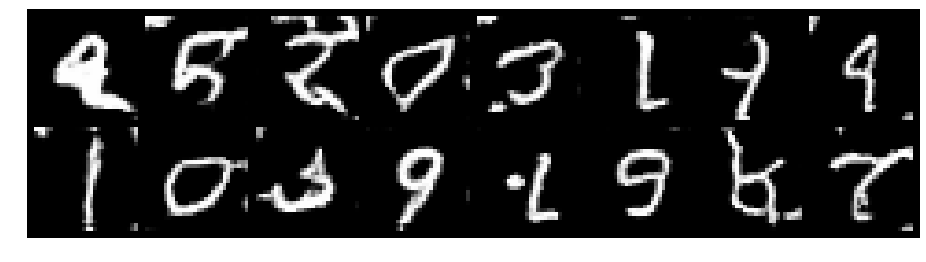

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.0231, Generator Loss: 1.2203
D(x): 0.6056, D(G(z)): 0.3325


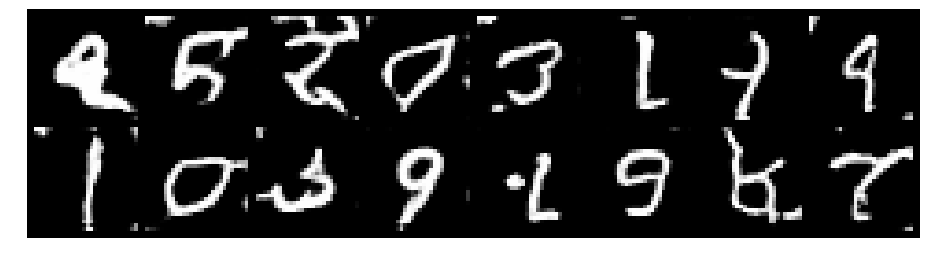

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1123, Generator Loss: 1.1139
D(x): 0.6116, D(G(z)): 0.3907


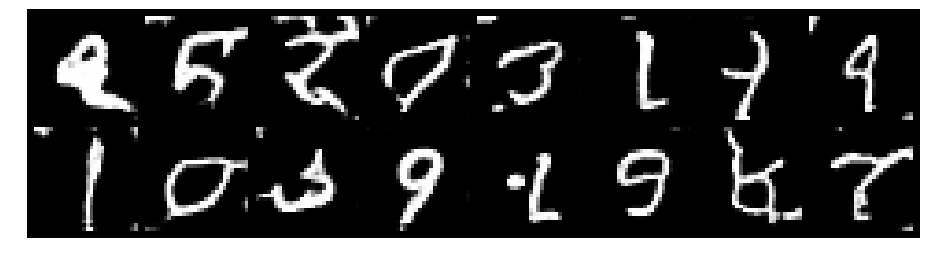

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.1186, Generator Loss: 1.1133
D(x): 0.6420, D(G(z)): 0.4053


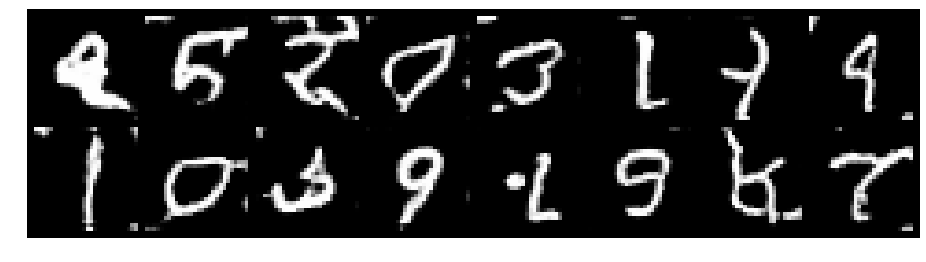

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1643, Generator Loss: 1.2109
D(x): 0.5580, D(G(z)): 0.3505


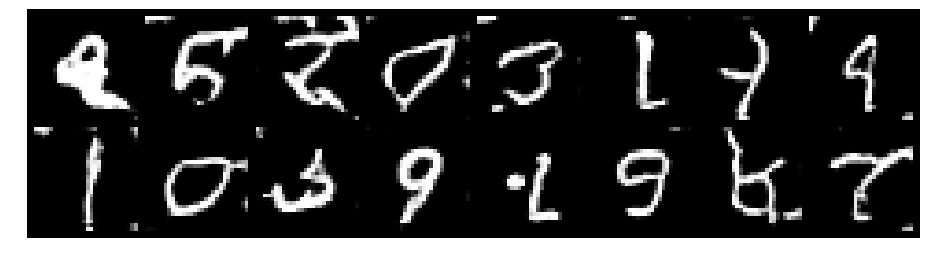

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.1816, Generator Loss: 1.0965
D(x): 0.6028, D(G(z)): 0.3955


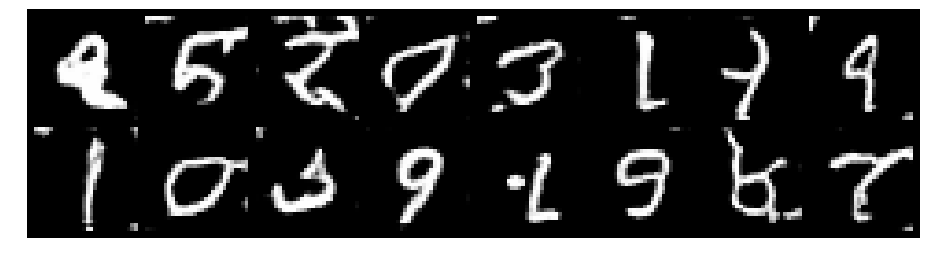

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 0.9600, Generator Loss: 0.9884
D(x): 0.6753, D(G(z)): 0.3570


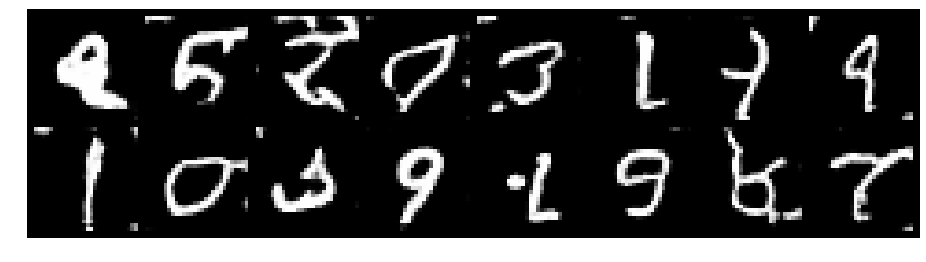

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.0872, Generator Loss: 1.1552
D(x): 0.6210, D(G(z)): 0.3727


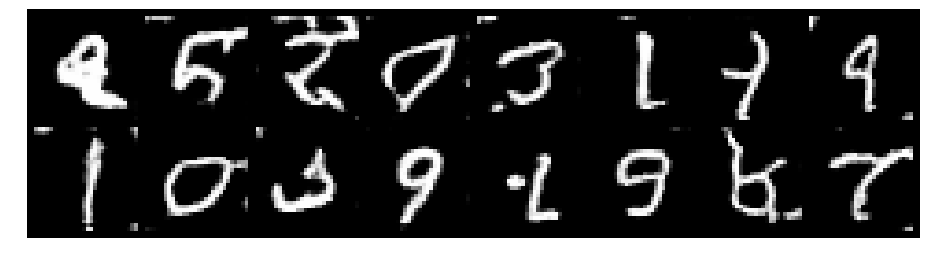

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.1211, Generator Loss: 1.0799
D(x): 0.6328, D(G(z)): 0.3938


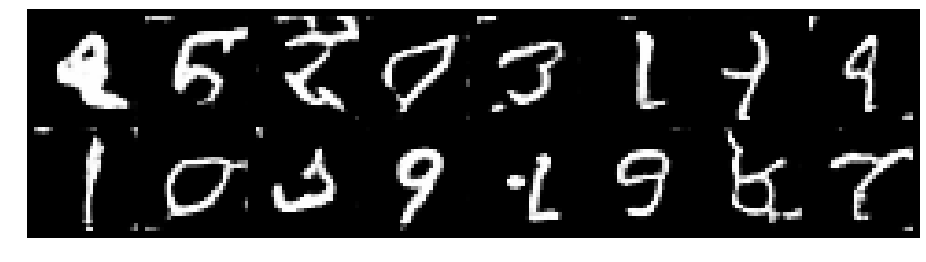

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.0163, Generator Loss: 1.1585
D(x): 0.6503, D(G(z)): 0.3637


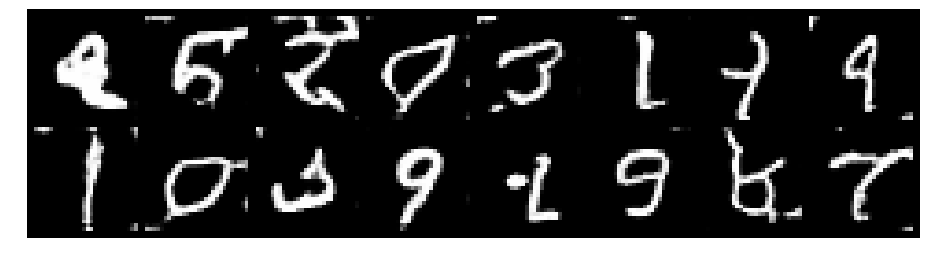

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.0429, Generator Loss: 1.1681
D(x): 0.6554, D(G(z)): 0.3916


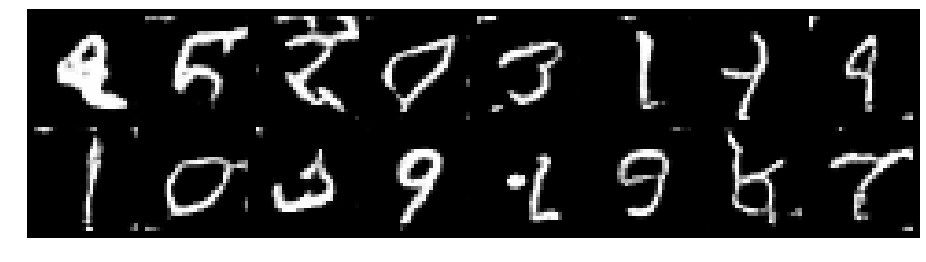

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.1287, Generator Loss: 1.1555
D(x): 0.5784, D(G(z)): 0.3500


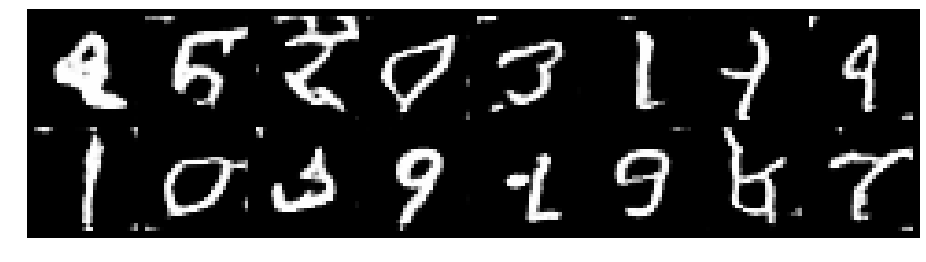

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1167, Generator Loss: 1.0742
D(x): 0.6196, D(G(z)): 0.3837


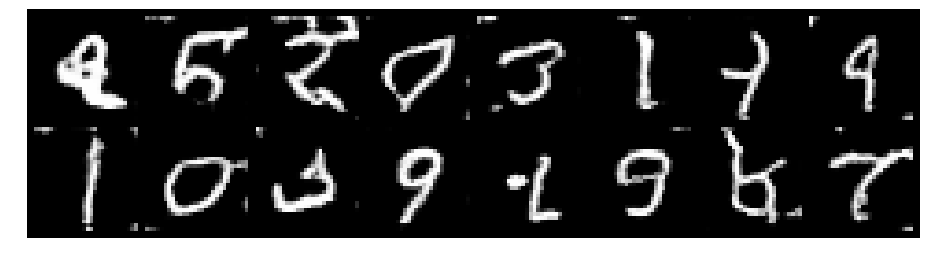

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.1996, Generator Loss: 1.1535
D(x): 0.6044, D(G(z)): 0.4005


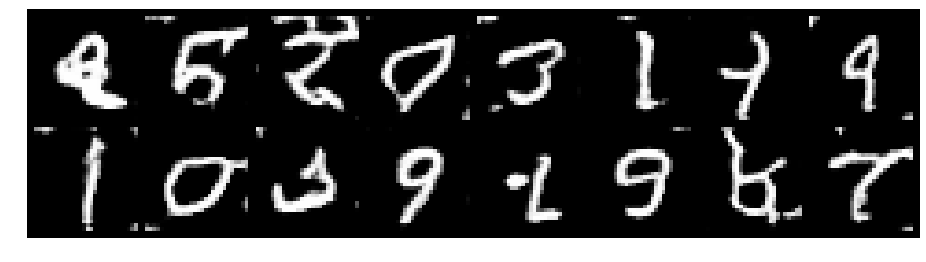

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.1674, Generator Loss: 1.1162
D(x): 0.5821, D(G(z)): 0.3751


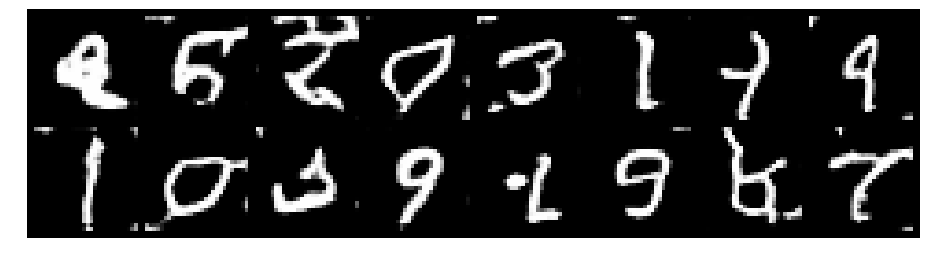

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.2457, Generator Loss: 0.9690
D(x): 0.5939, D(G(z)): 0.4067


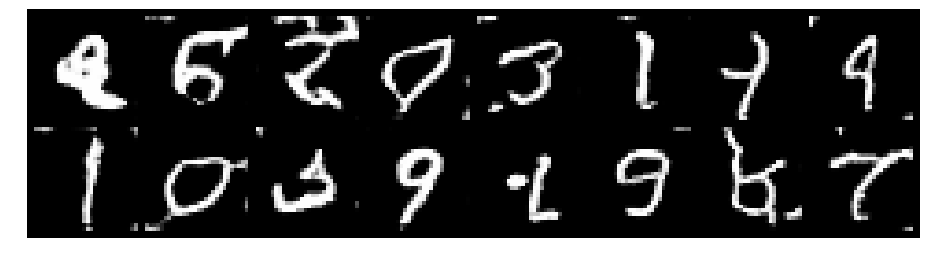

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.1455, Generator Loss: 1.0629
D(x): 0.5730, D(G(z)): 0.3632


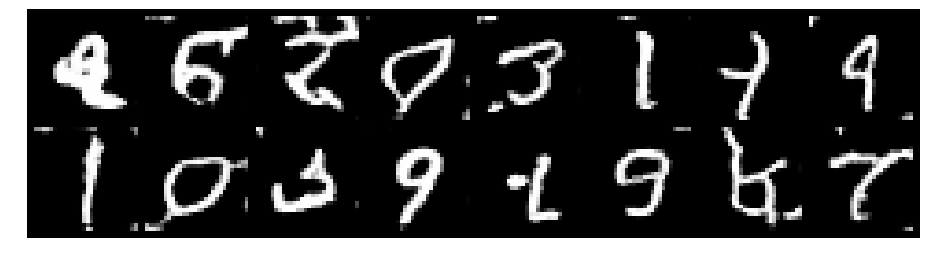

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1777, Generator Loss: 1.0474
D(x): 0.5883, D(G(z)): 0.3916


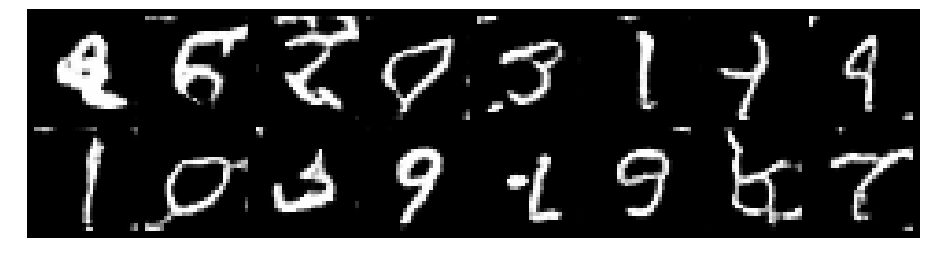

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.1484, Generator Loss: 1.1584
D(x): 0.6050, D(G(z)): 0.3814


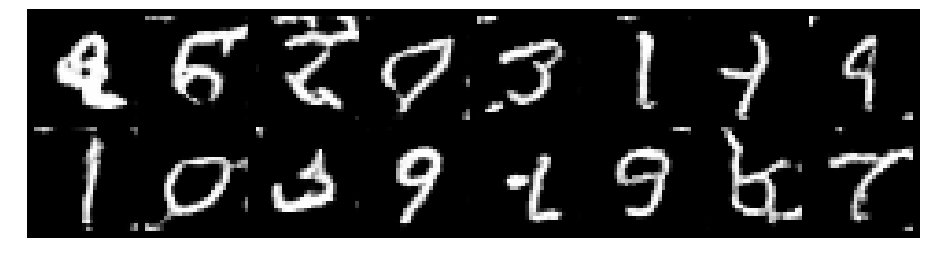

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.0849, Generator Loss: 1.0114
D(x): 0.6432, D(G(z)): 0.3784


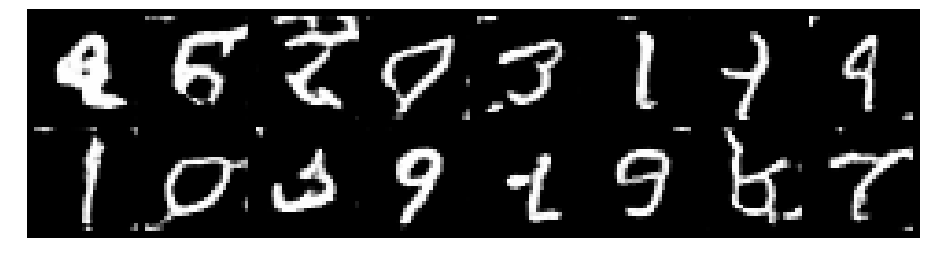

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.0663, Generator Loss: 1.0761
D(x): 0.6802, D(G(z)): 0.4183


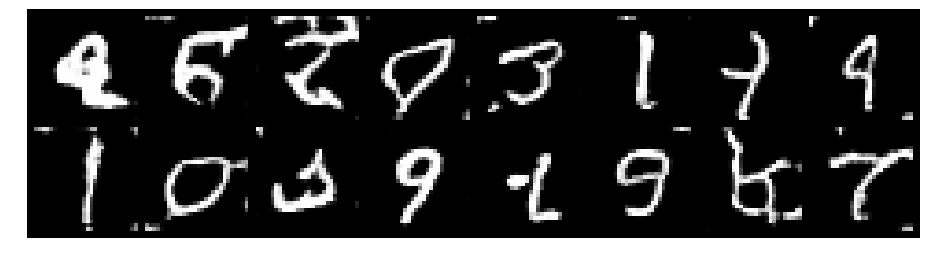

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.1178, Generator Loss: 1.1653
D(x): 0.6008, D(G(z)): 0.3656


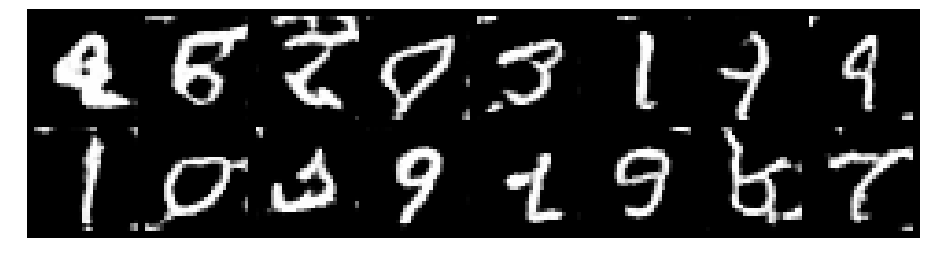

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.1483, Generator Loss: 0.9393
D(x): 0.6062, D(G(z)): 0.4012


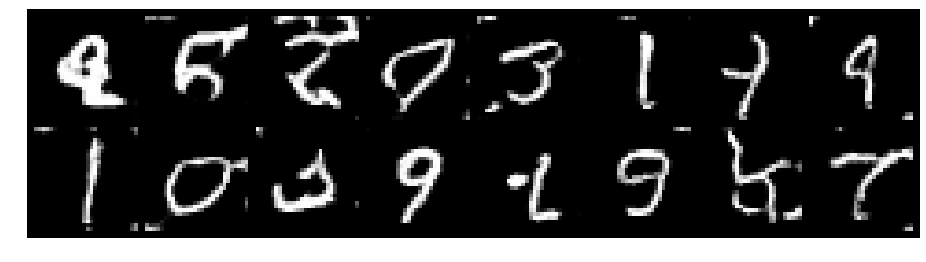

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.1424, Generator Loss: 1.0922
D(x): 0.5575, D(G(z)): 0.3420


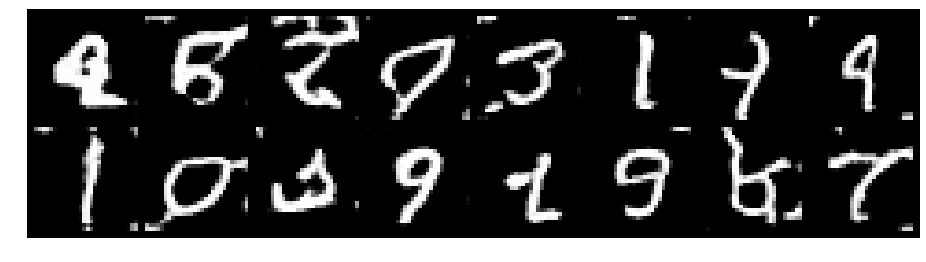

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.0840, Generator Loss: 1.0842
D(x): 0.6203, D(G(z)): 0.3782


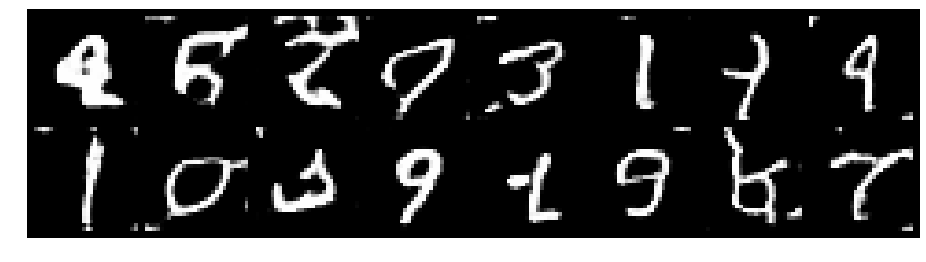

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.0749, Generator Loss: 1.1228
D(x): 0.6674, D(G(z)): 0.4153


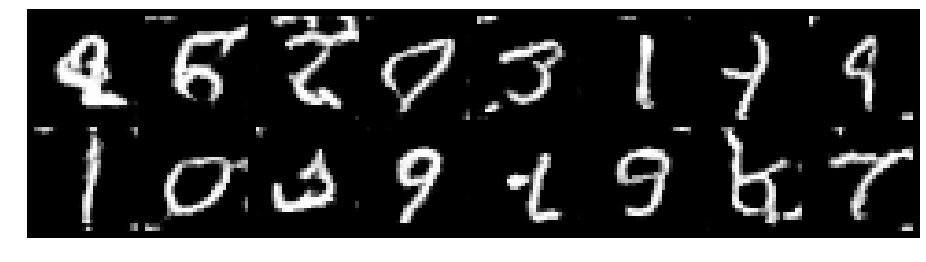

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.1578, Generator Loss: 1.0958
D(x): 0.5871, D(G(z)): 0.3652


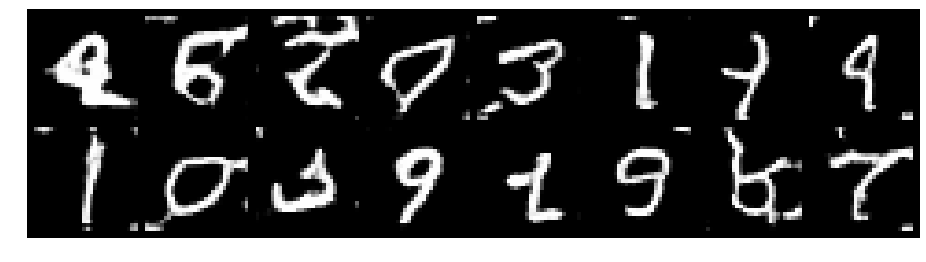

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.0967, Generator Loss: 0.9774
D(x): 0.6332, D(G(z)): 0.3881


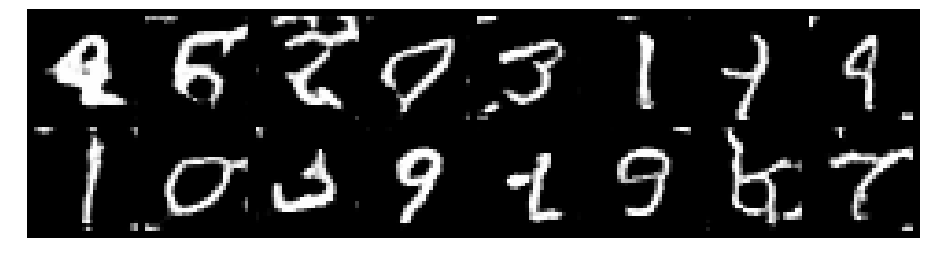

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1774, Generator Loss: 1.1026
D(x): 0.6158, D(G(z)): 0.3985


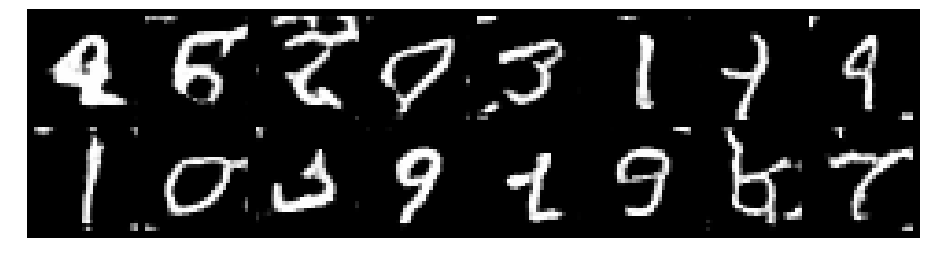

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.0978, Generator Loss: 1.2123
D(x): 0.5901, D(G(z)): 0.3353


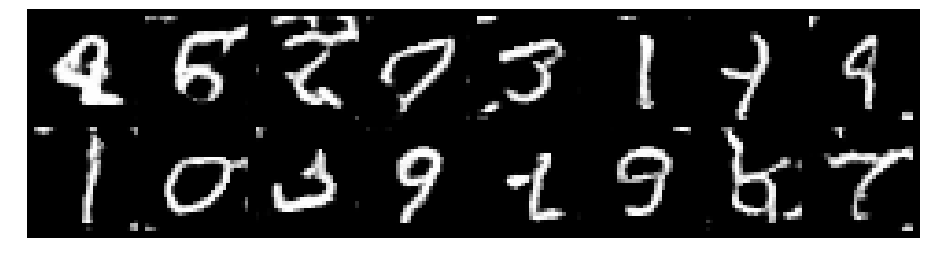

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.0228, Generator Loss: 1.1684
D(x): 0.6365, D(G(z)): 0.3520


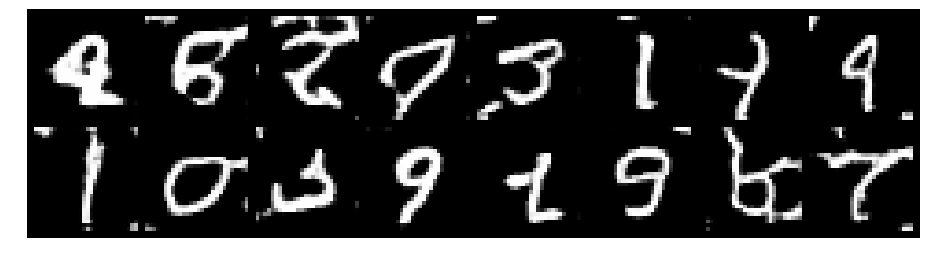

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.0192, Generator Loss: 1.1817
D(x): 0.6543, D(G(z)): 0.3730


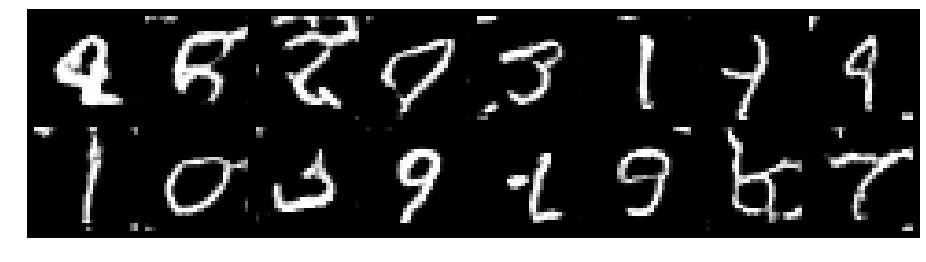

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.2047, Generator Loss: 1.1958
D(x): 0.5509, D(G(z)): 0.3568


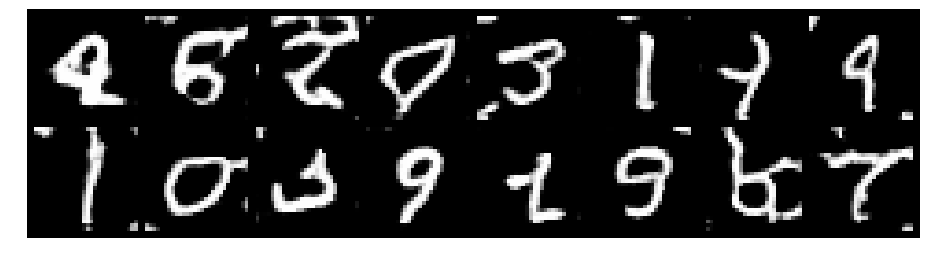

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1173, Generator Loss: 1.0720
D(x): 0.6310, D(G(z)): 0.4017


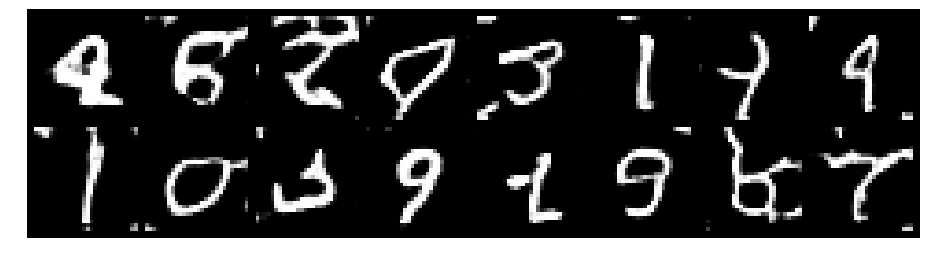

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.0388, Generator Loss: 0.9931
D(x): 0.6764, D(G(z)): 0.3890


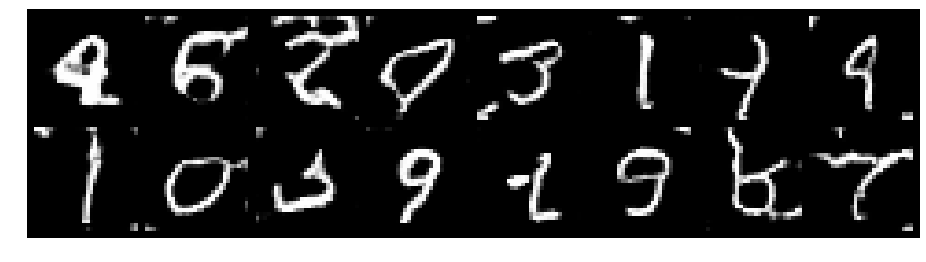

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2493, Generator Loss: 1.1186
D(x): 0.5523, D(G(z)): 0.3889


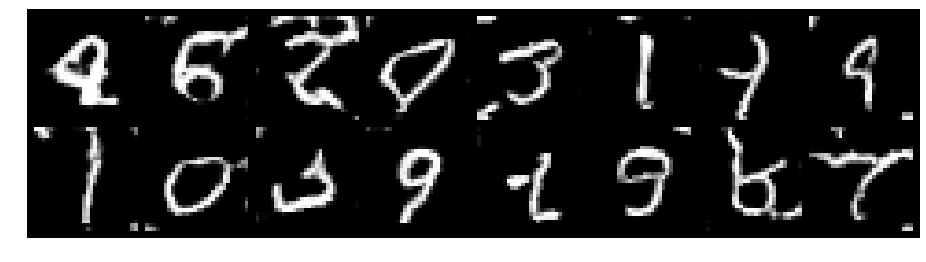

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.1201, Generator Loss: 1.0876
D(x): 0.5770, D(G(z)): 0.3484


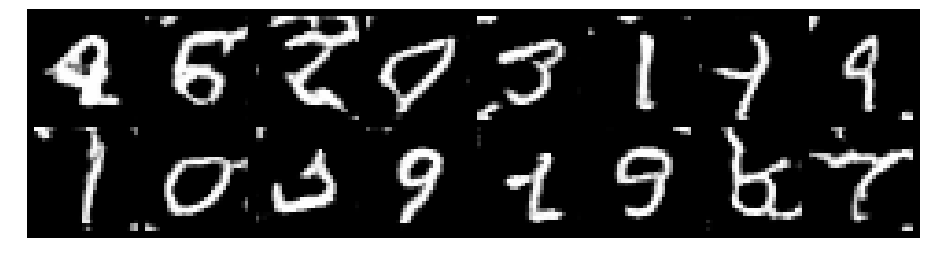

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0154, Generator Loss: 1.1474
D(x): 0.6754, D(G(z)): 0.3948


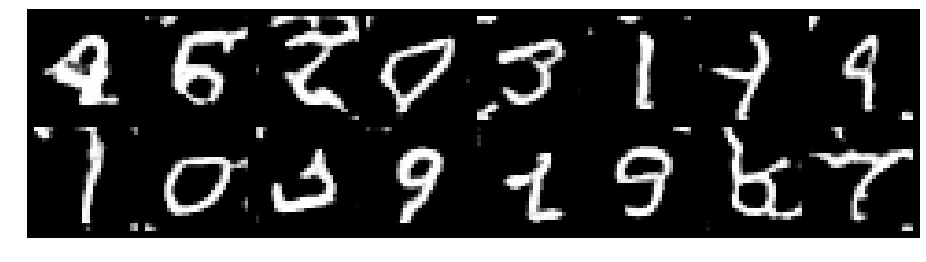

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.1297, Generator Loss: 1.1529
D(x): 0.6640, D(G(z)): 0.4228


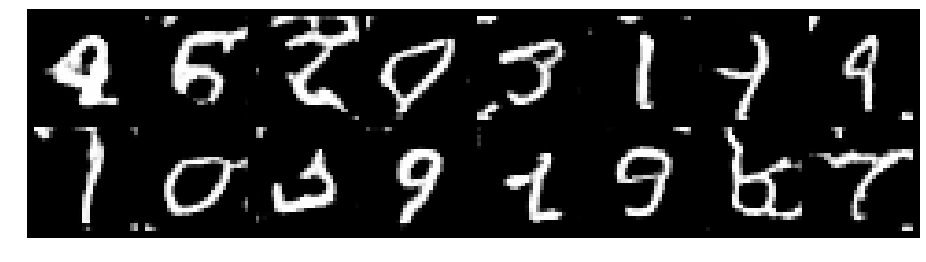

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.1233, Generator Loss: 1.1727
D(x): 0.6037, D(G(z)): 0.3743


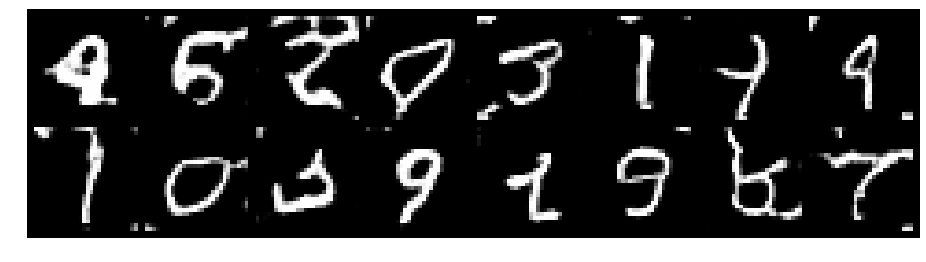

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.1245, Generator Loss: 1.1433
D(x): 0.5954, D(G(z)): 0.3601


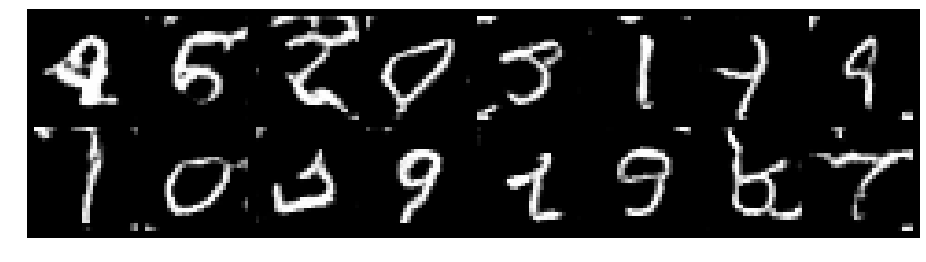

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.1293, Generator Loss: 1.0378
D(x): 0.6478, D(G(z)): 0.4206


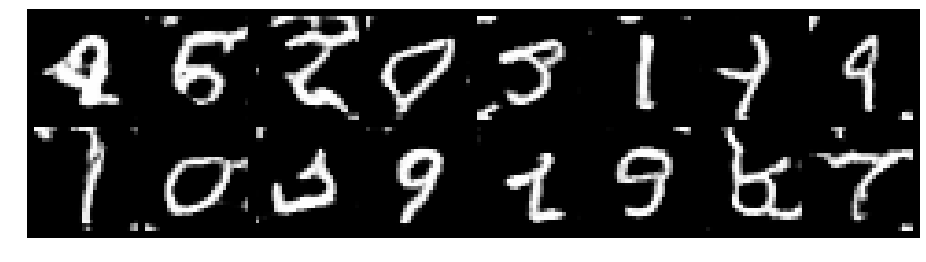

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.0993, Generator Loss: 1.0679
D(x): 0.6269, D(G(z)): 0.3892


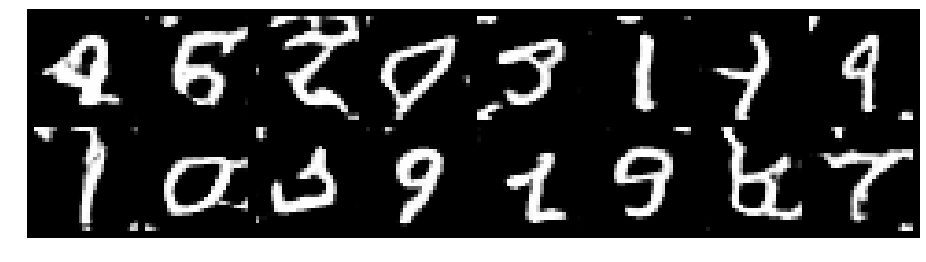

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 0.9572, Generator Loss: 1.2017
D(x): 0.6486, D(G(z)): 0.3254


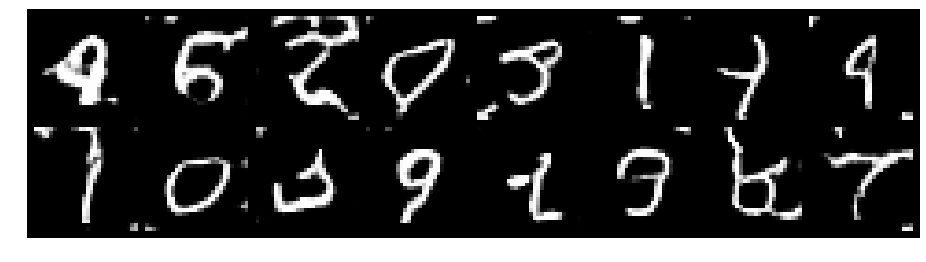

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.0489, Generator Loss: 1.0266
D(x): 0.6457, D(G(z)): 0.3724


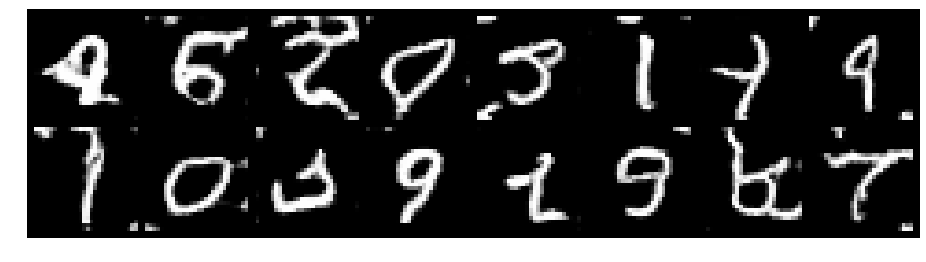

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.1616, Generator Loss: 0.9327
D(x): 0.6255, D(G(z)): 0.4067


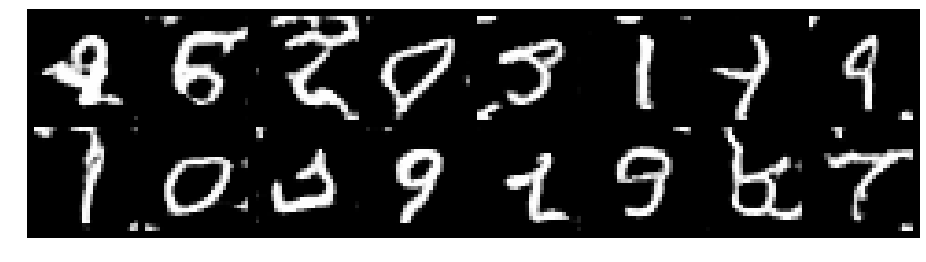

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.1828, Generator Loss: 1.0109
D(x): 0.6155, D(G(z)): 0.4108


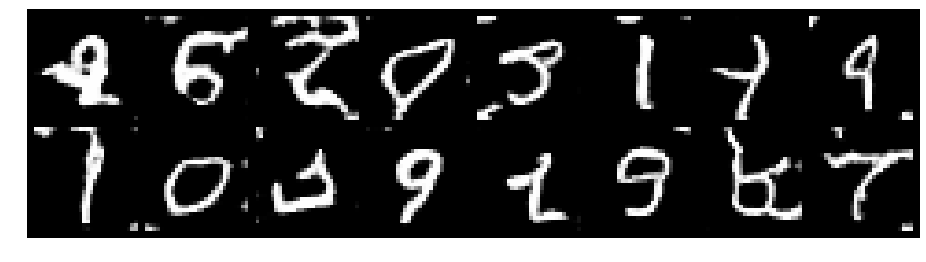

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.1136, Generator Loss: 0.9494
D(x): 0.6125, D(G(z)): 0.3784


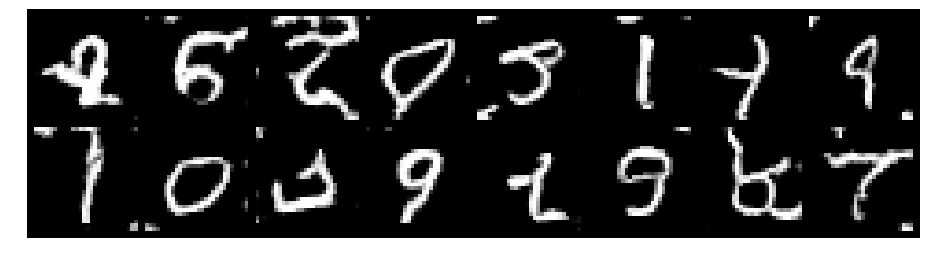

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.1106, Generator Loss: 1.0951
D(x): 0.5949, D(G(z)): 0.3749


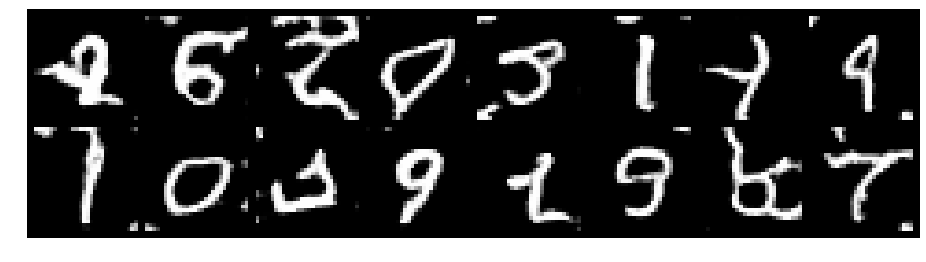

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.1246, Generator Loss: 0.9978
D(x): 0.6368, D(G(z)): 0.4119


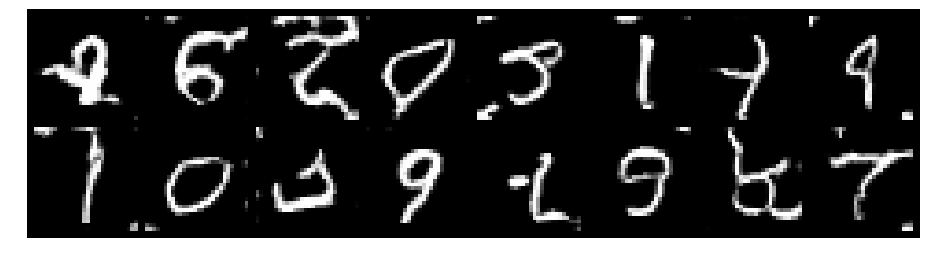

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.1578, Generator Loss: 1.0294
D(x): 0.5755, D(G(z)): 0.3621


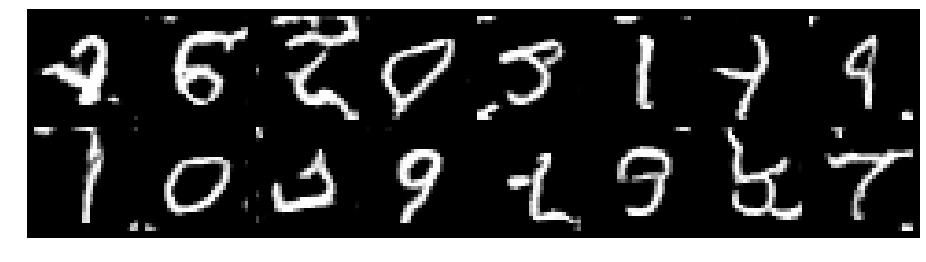

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.1582, Generator Loss: 1.0433
D(x): 0.6135, D(G(z)): 0.3989


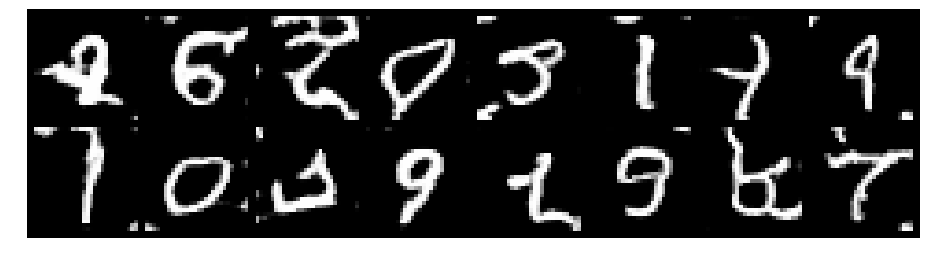

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1905, Generator Loss: 0.9978
D(x): 0.6146, D(G(z)): 0.4177


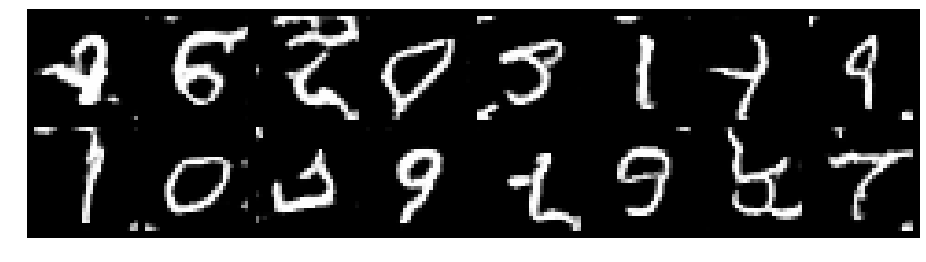

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.1398, Generator Loss: 1.0549
D(x): 0.6304, D(G(z)): 0.4023


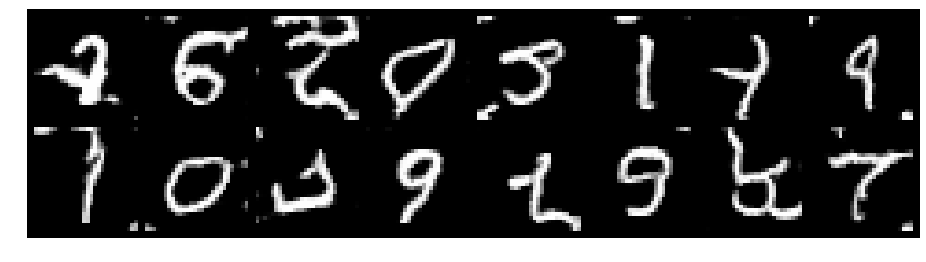

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.1175, Generator Loss: 1.2524
D(x): 0.6194, D(G(z)): 0.3775


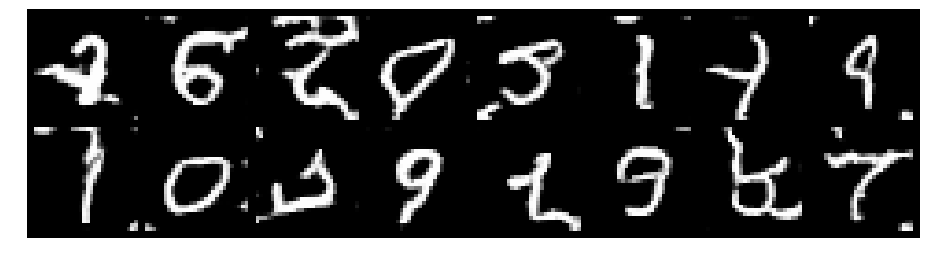

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.1978, Generator Loss: 1.0145
D(x): 0.6251, D(G(z)): 0.4290


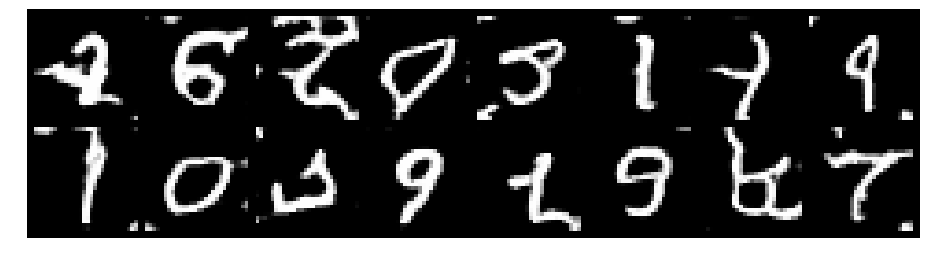

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.1672, Generator Loss: 1.1200
D(x): 0.6681, D(G(z)): 0.4344


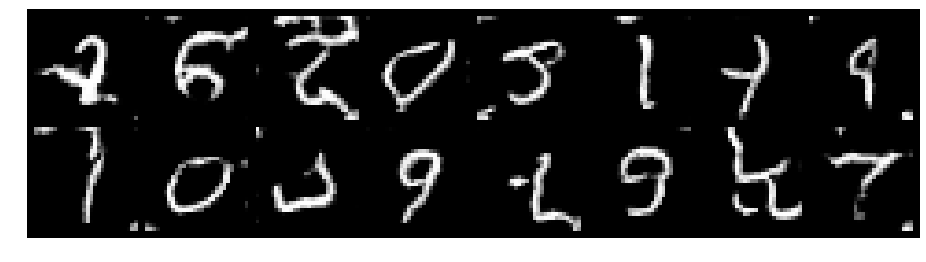

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.2605, Generator Loss: 1.1728
D(x): 0.5438, D(G(z)): 0.3833


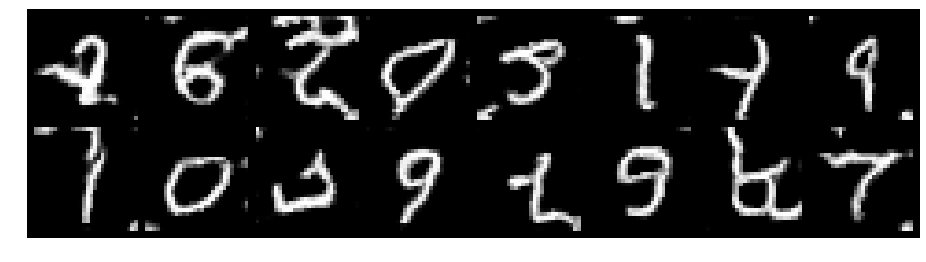

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2738, Generator Loss: 0.9372
D(x): 0.6075, D(G(z)): 0.4321


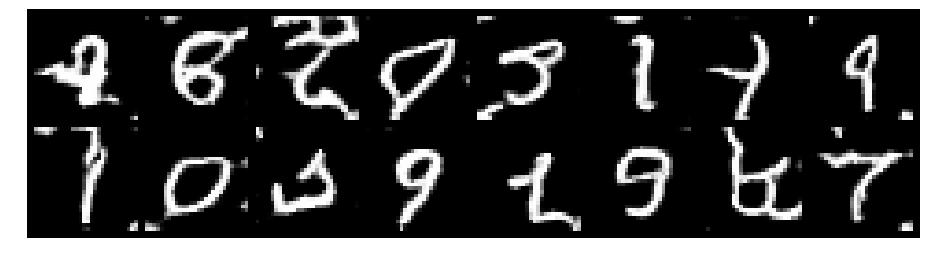

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.1014, Generator Loss: 1.1004
D(x): 0.6345, D(G(z)): 0.3842


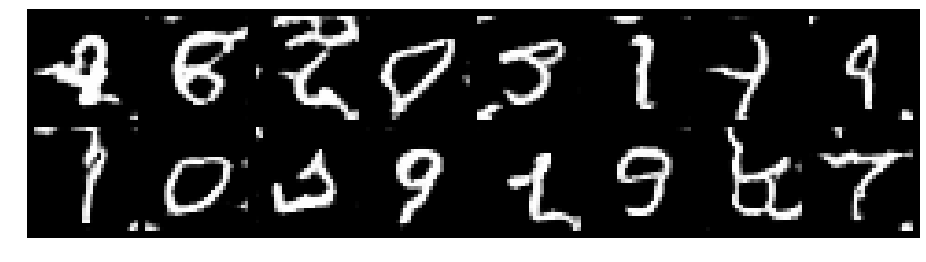

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1217, Generator Loss: 0.9969
D(x): 0.6370, D(G(z)): 0.4157


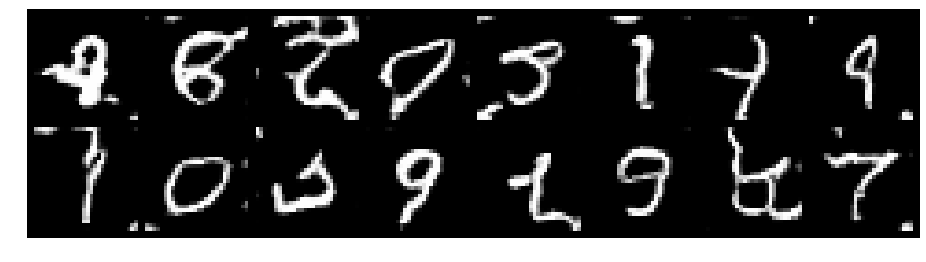

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.0947, Generator Loss: 1.0104
D(x): 0.6192, D(G(z)): 0.3840


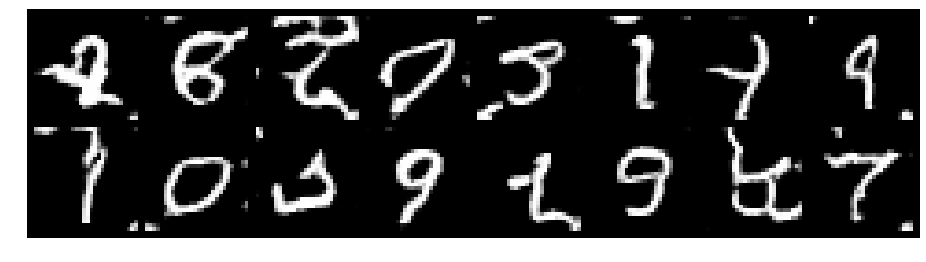

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.2338, Generator Loss: 1.0892
D(x): 0.6121, D(G(z)): 0.4338


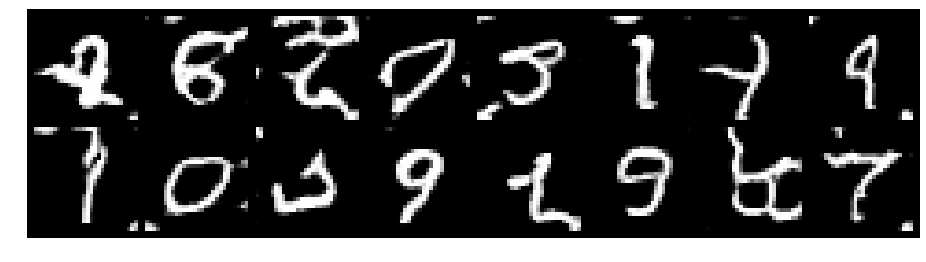

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.0918, Generator Loss: 1.0922
D(x): 0.6491, D(G(z)): 0.3978


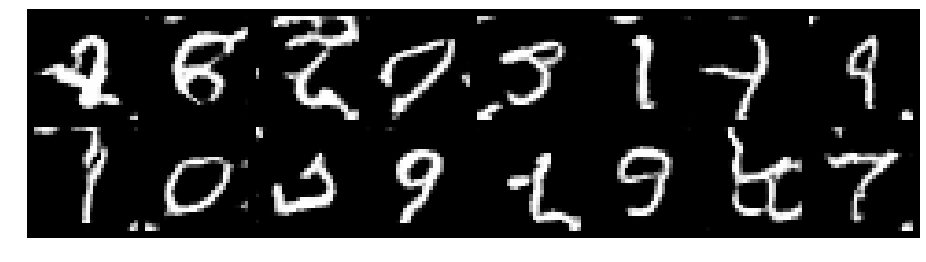

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.0694, Generator Loss: 1.0410
D(x): 0.6093, D(G(z)): 0.3642


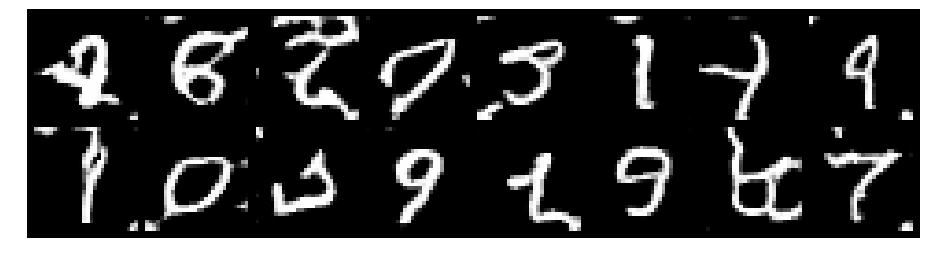

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.1785, Generator Loss: 1.0785
D(x): 0.5938, D(G(z)): 0.3874


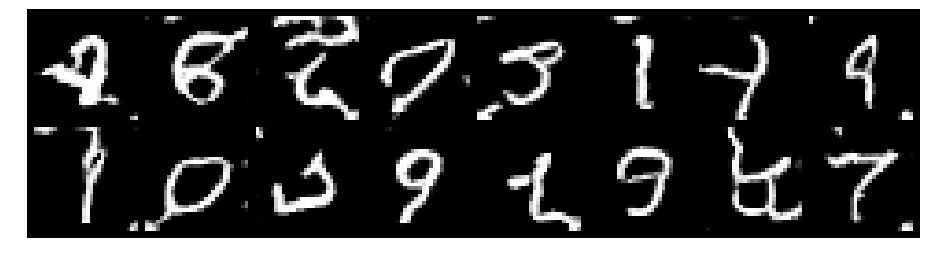

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.0442, Generator Loss: 1.1528
D(x): 0.6427, D(G(z)): 0.3826


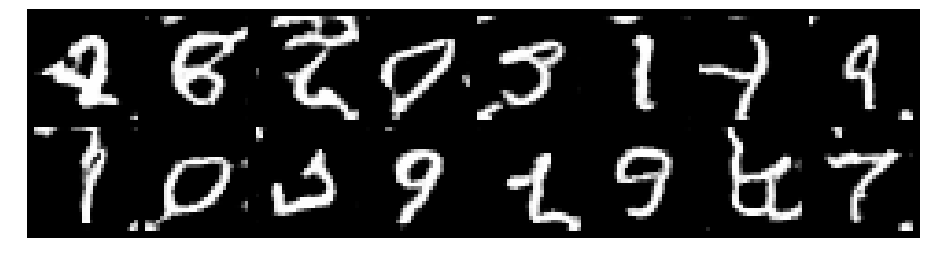

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.1569, Generator Loss: 1.0217
D(x): 0.5935, D(G(z)): 0.3883


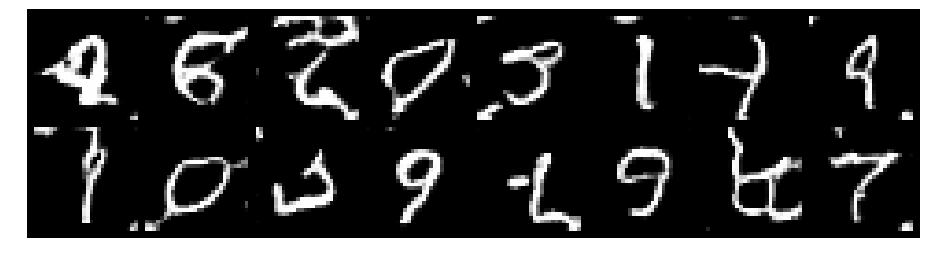

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.1648, Generator Loss: 0.9932
D(x): 0.5980, D(G(z)): 0.4011


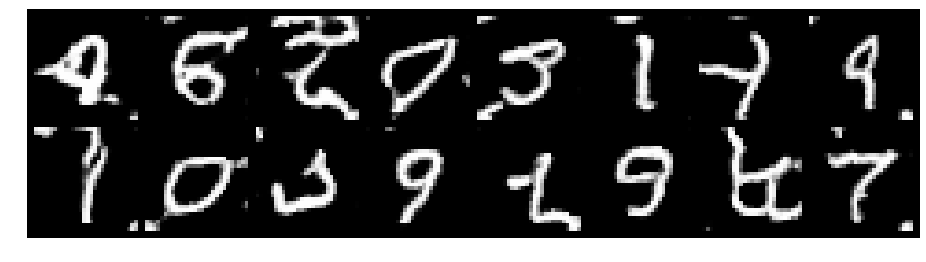

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.2488, Generator Loss: 0.9176
D(x): 0.6166, D(G(z)): 0.4428


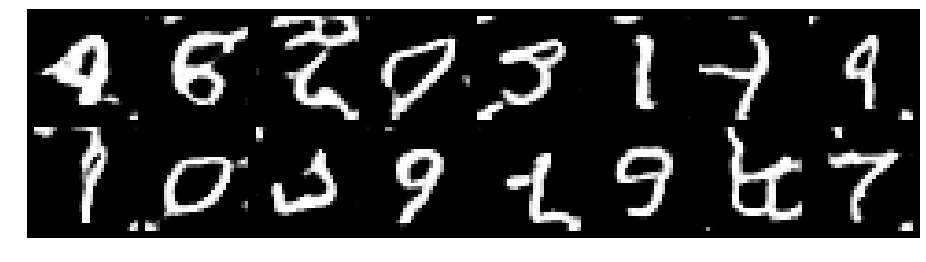

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1747, Generator Loss: 1.0399
D(x): 0.5974, D(G(z)): 0.3888


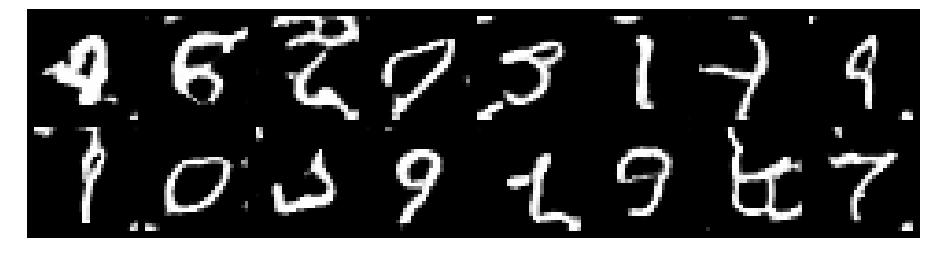

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.0190, Generator Loss: 1.0309
D(x): 0.6209, D(G(z)): 0.3462


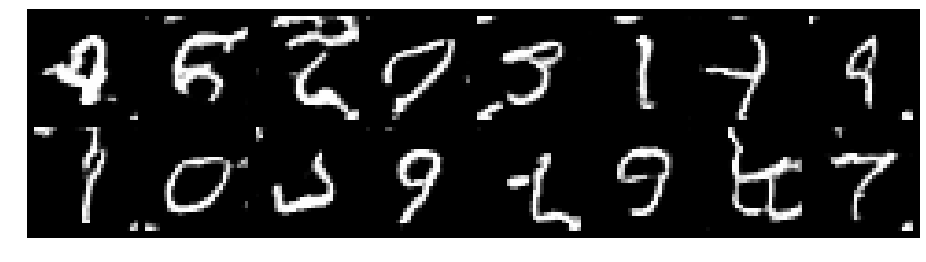

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.1629, Generator Loss: 1.0565
D(x): 0.6129, D(G(z)): 0.3993


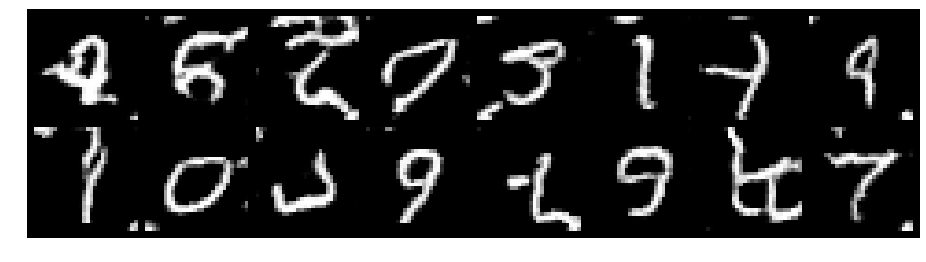

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.1852, Generator Loss: 1.0203
D(x): 0.5920, D(G(z)): 0.3878


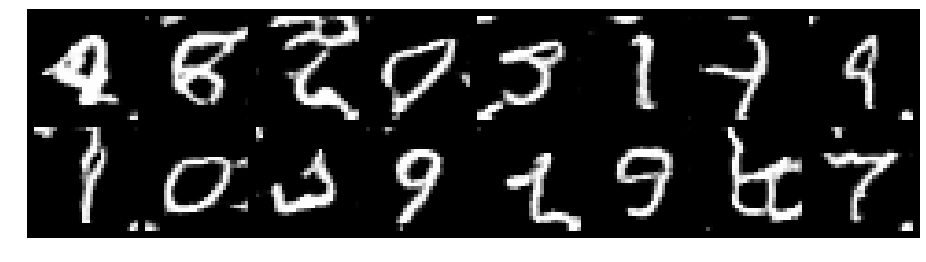

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.0986, Generator Loss: 1.0592
D(x): 0.6466, D(G(z)): 0.3963


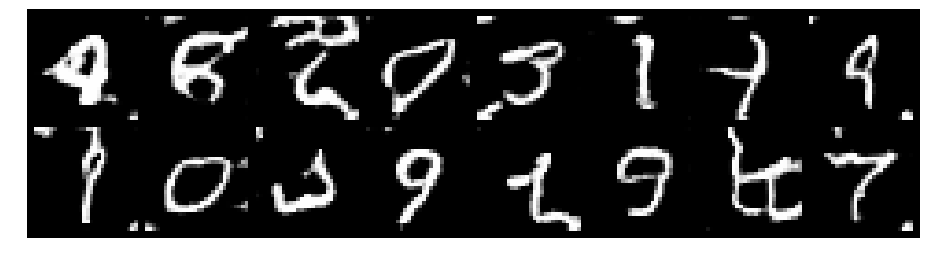

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.1486, Generator Loss: 1.0143
D(x): 0.5942, D(G(z)): 0.3919


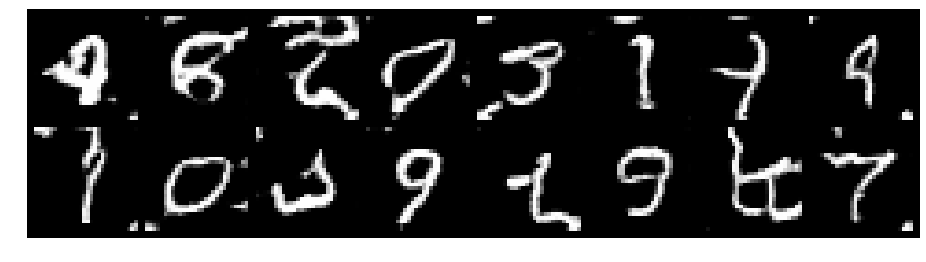

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.2287, Generator Loss: 1.1376
D(x): 0.5739, D(G(z)): 0.4179


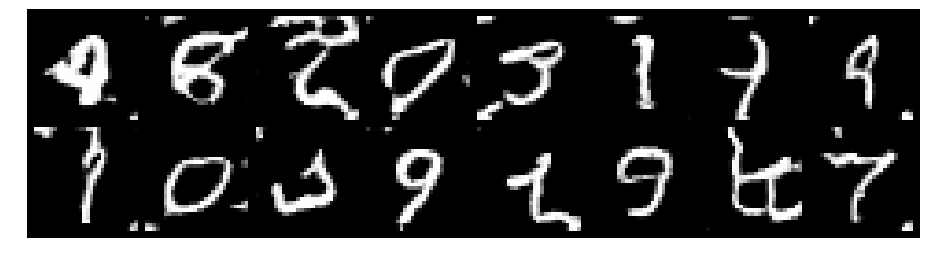

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.1506, Generator Loss: 0.9861
D(x): 0.6730, D(G(z)): 0.4582


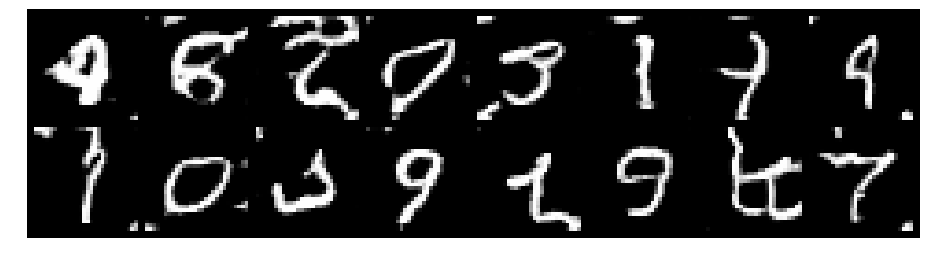

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.1665, Generator Loss: 1.0454
D(x): 0.6401, D(G(z)): 0.4146


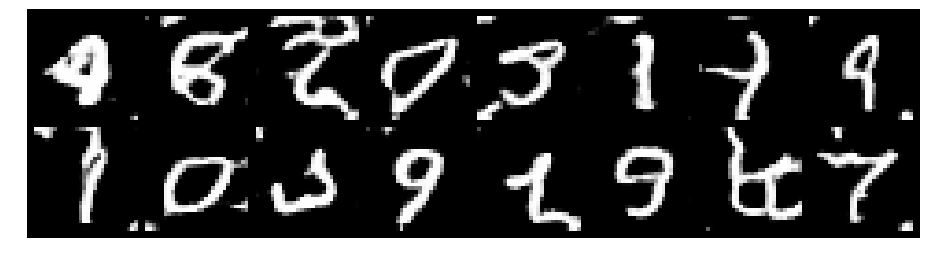

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.0958, Generator Loss: 1.1027
D(x): 0.5963, D(G(z)): 0.3590


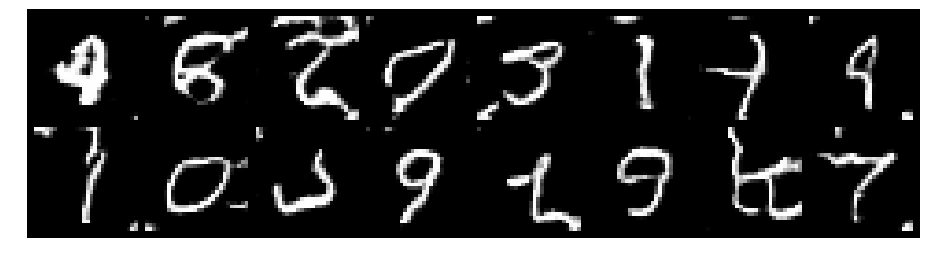

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.1532, Generator Loss: 1.2802
D(x): 0.5515, D(G(z)): 0.3376


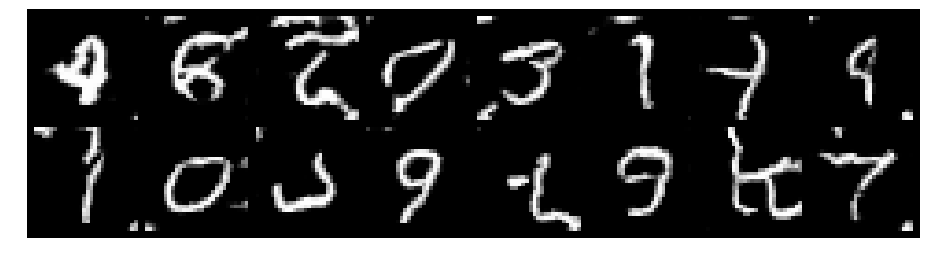

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.1834, Generator Loss: 1.1463
D(x): 0.5710, D(G(z)): 0.3664


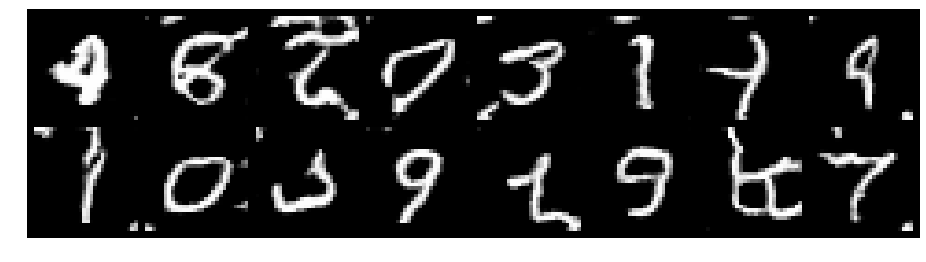

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.0616, Generator Loss: 1.1191
D(x): 0.6501, D(G(z)): 0.3828


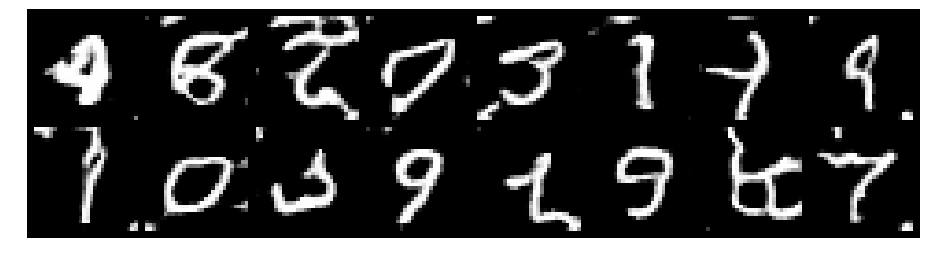

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.1183, Generator Loss: 1.1664
D(x): 0.6504, D(G(z)): 0.3982


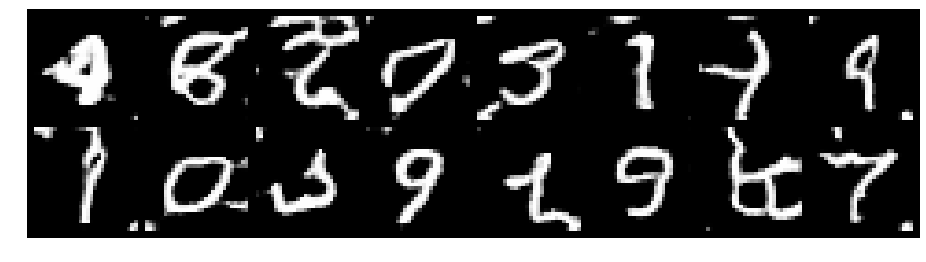

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.0966, Generator Loss: 1.0937
D(x): 0.6414, D(G(z)): 0.3985


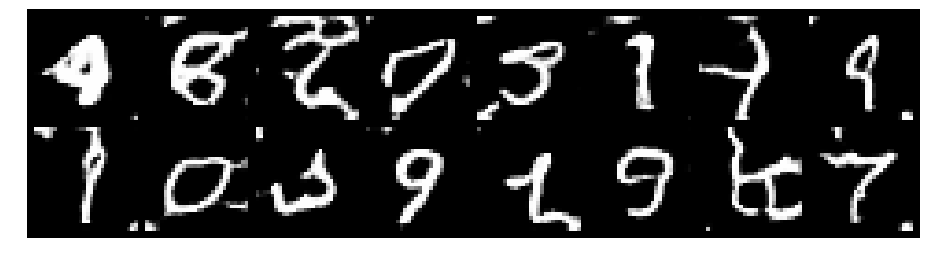

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.1430, Generator Loss: 1.0299
D(x): 0.6050, D(G(z)): 0.3915


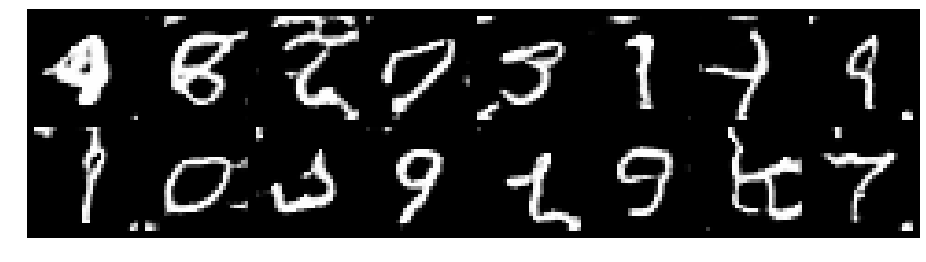

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.1918, Generator Loss: 1.1326
D(x): 0.6008, D(G(z)): 0.3944


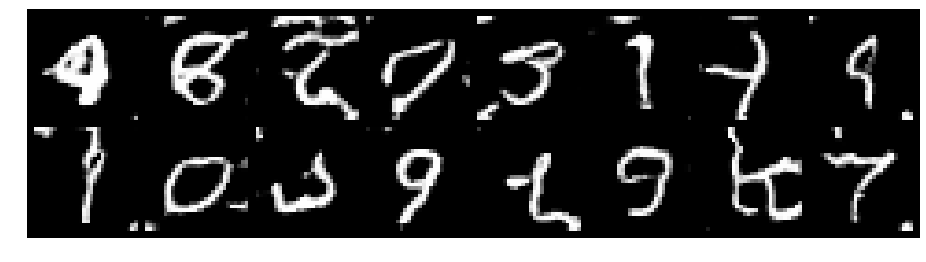

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.1477, Generator Loss: 1.0126
D(x): 0.6153, D(G(z)): 0.4021


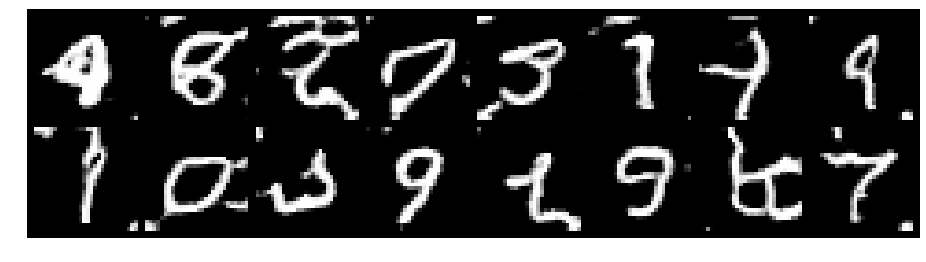

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.1564, Generator Loss: 1.0541
D(x): 0.5986, D(G(z)): 0.3886


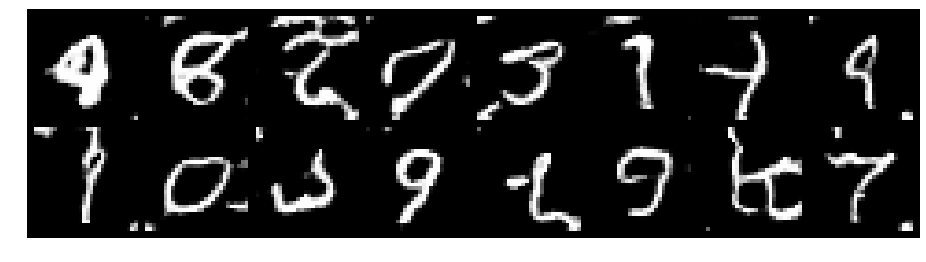

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.1333, Generator Loss: 1.0868
D(x): 0.5690, D(G(z)): 0.3531


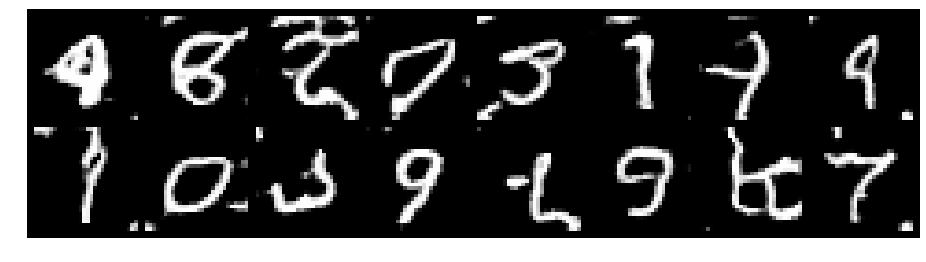

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.0808, Generator Loss: 1.0309
D(x): 0.6267, D(G(z)): 0.3805


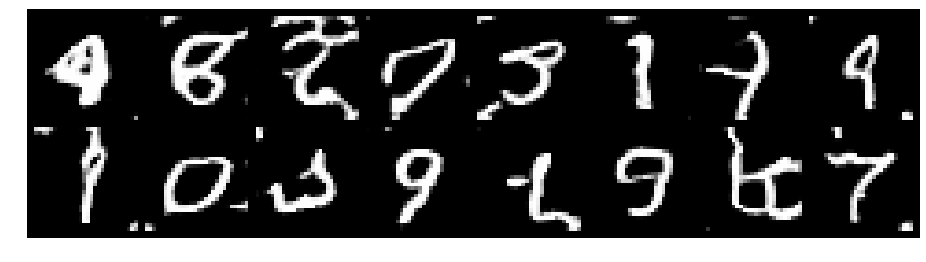

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.0055, Generator Loss: 1.2351
D(x): 0.6608, D(G(z)): 0.3606


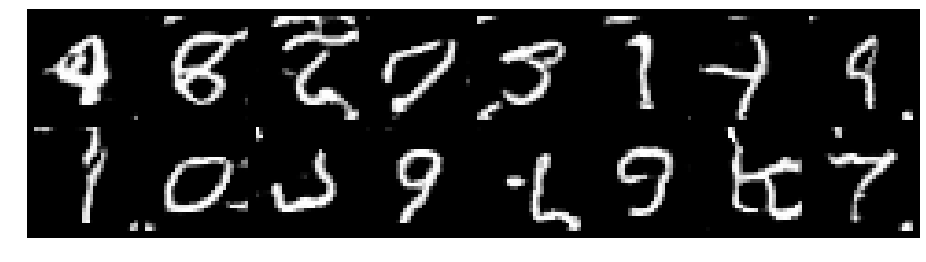

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.0050, Generator Loss: 0.9377
D(x): 0.6547, D(G(z)): 0.3696


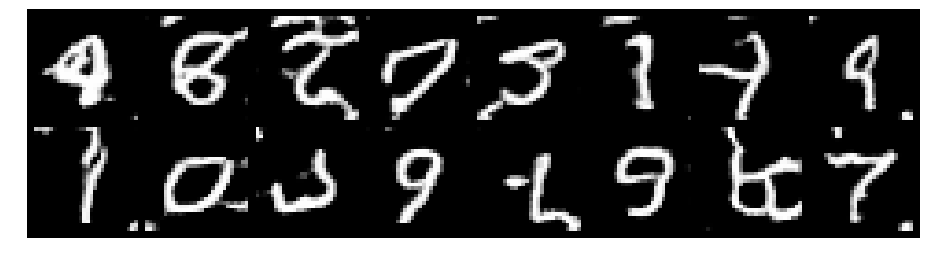

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.0717, Generator Loss: 1.0078
D(x): 0.6614, D(G(z)): 0.4062


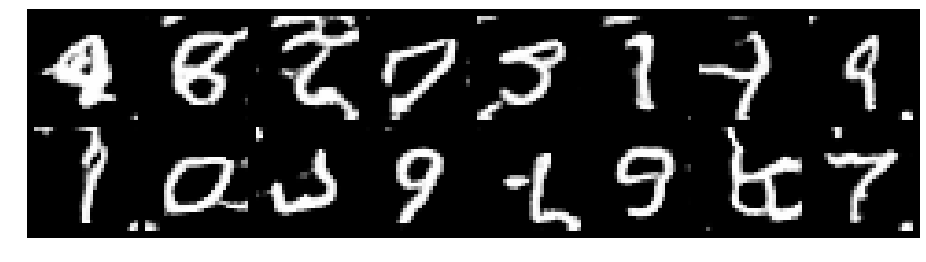

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.1932, Generator Loss: 1.0135
D(x): 0.6102, D(G(z)): 0.4115


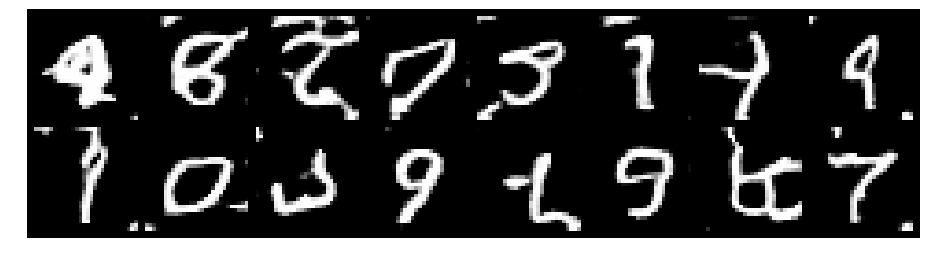

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.0598, Generator Loss: 1.0144
D(x): 0.6152, D(G(z)): 0.3553


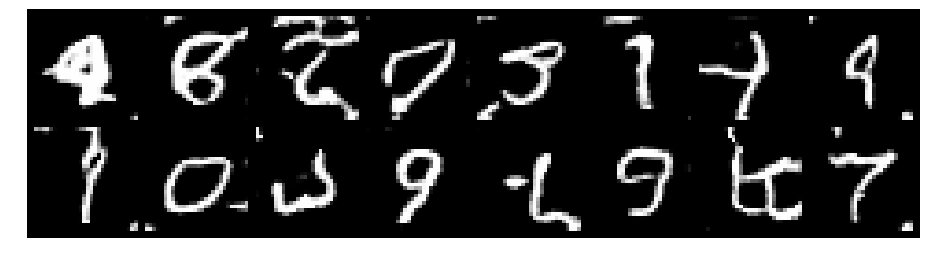

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.1554, Generator Loss: 1.1748
D(x): 0.5831, D(G(z)): 0.3681


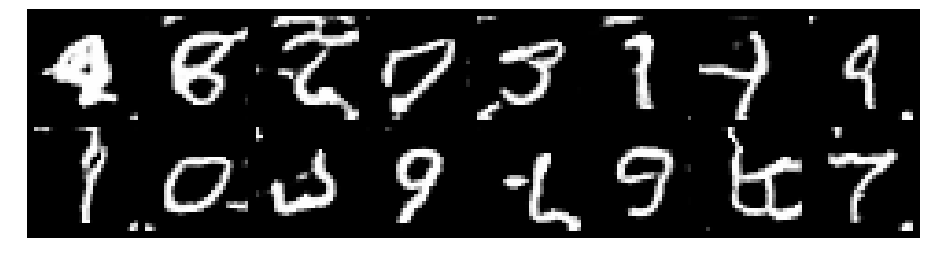

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.1772, Generator Loss: 1.0437
D(x): 0.6012, D(G(z)): 0.3980


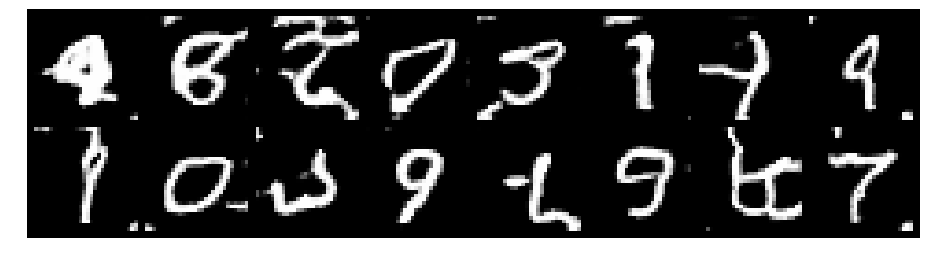

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.0742, Generator Loss: 0.9973
D(x): 0.6317, D(G(z)): 0.3818


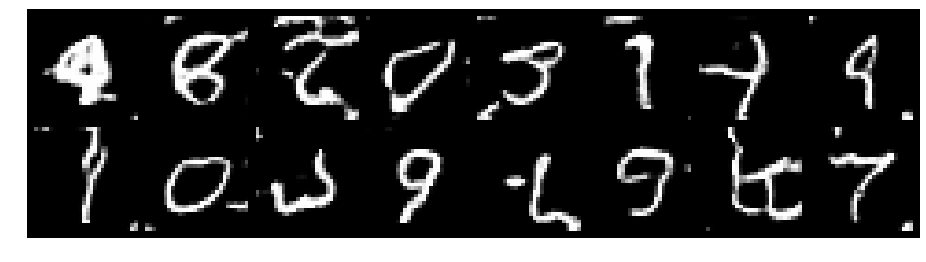

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.2352, Generator Loss: 1.0068
D(x): 0.6215, D(G(z)): 0.4387


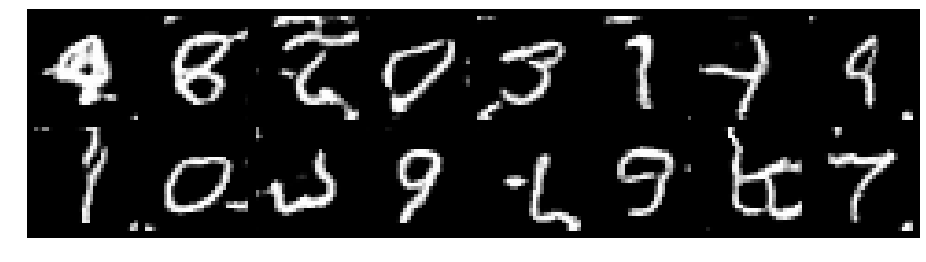

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.1082, Generator Loss: 1.1542
D(x): 0.6040, D(G(z)): 0.3779


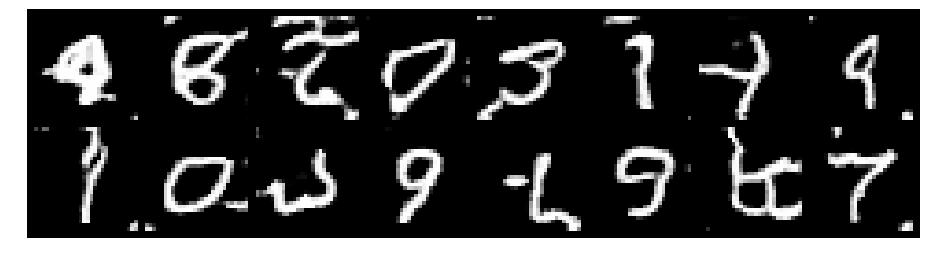

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.1084, Generator Loss: 0.9848
D(x): 0.6465, D(G(z)): 0.4048


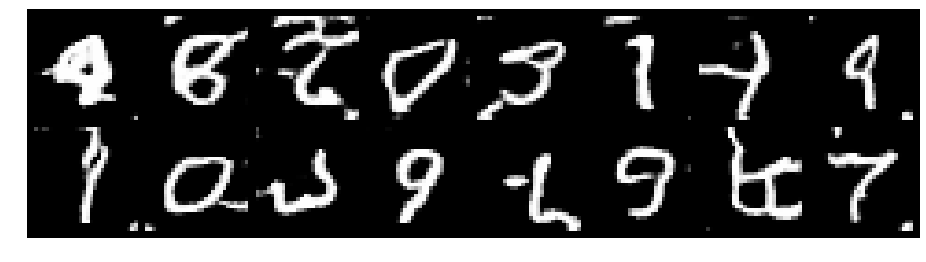

Epoch: [68/200], Batch Num: [500/600]
Discriminator Loss: 1.1974, Generator Loss: 0.9544
D(x): 0.6179, D(G(z)): 0.4095


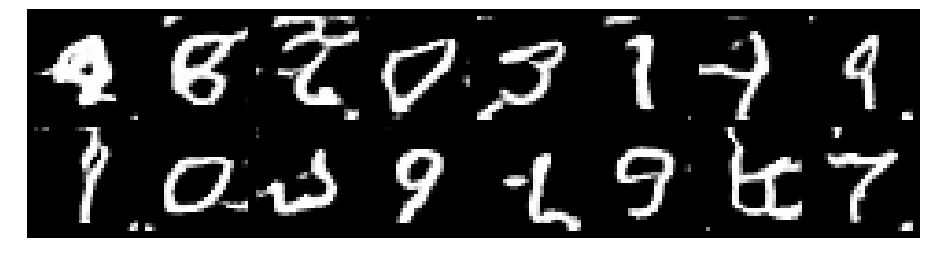

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.1600, Generator Loss: 1.1491
D(x): 0.5941, D(G(z)): 0.3869


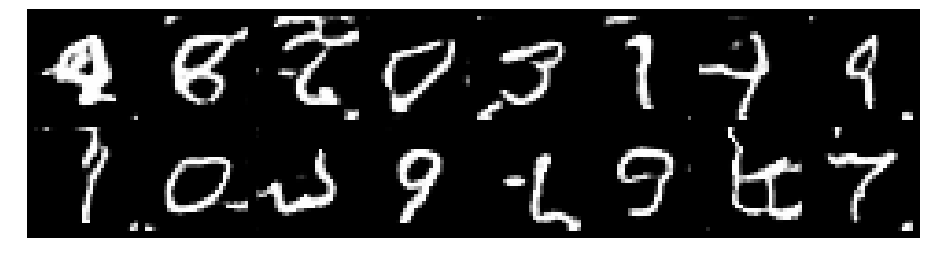

Epoch: [69/200], Batch Num: [100/600]
Discriminator Loss: 1.1895, Generator Loss: 1.1477
D(x): 0.5834, D(G(z)): 0.3829


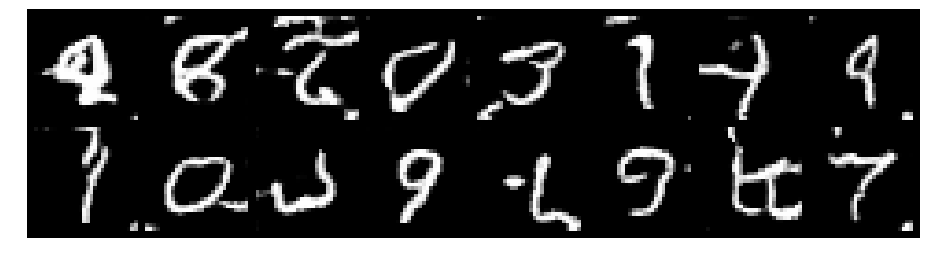

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.0936, Generator Loss: 1.0935
D(x): 0.6211, D(G(z)): 0.3802


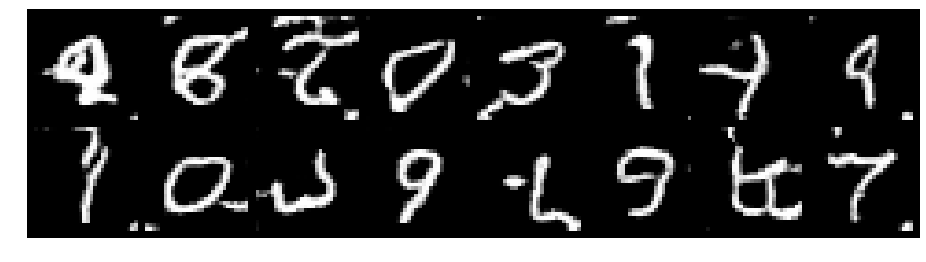

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.3161, Generator Loss: 1.0141
D(x): 0.6068, D(G(z)): 0.4553


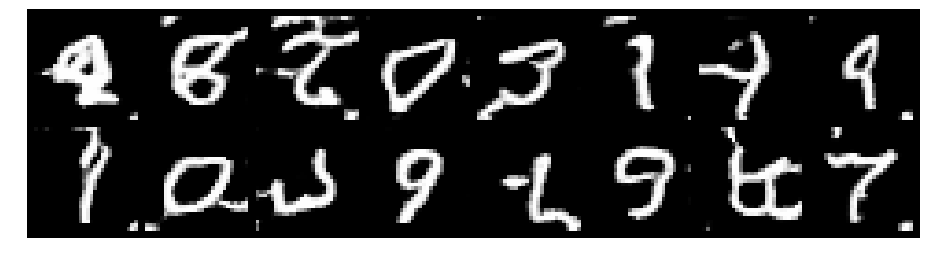

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.1116, Generator Loss: 0.9486
D(x): 0.6066, D(G(z)): 0.3791


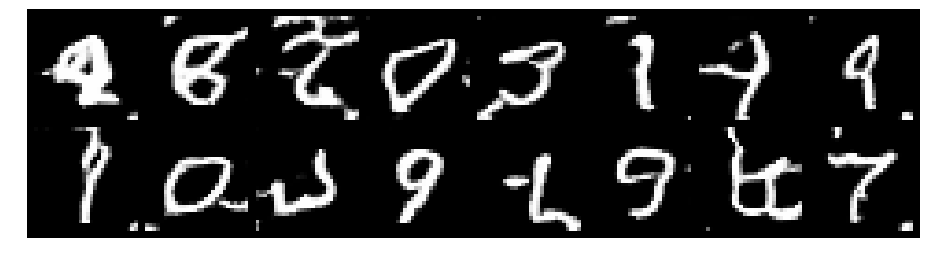

Epoch: [69/200], Batch Num: [500/600]
Discriminator Loss: 1.1365, Generator Loss: 1.0472
D(x): 0.6387, D(G(z)): 0.4069


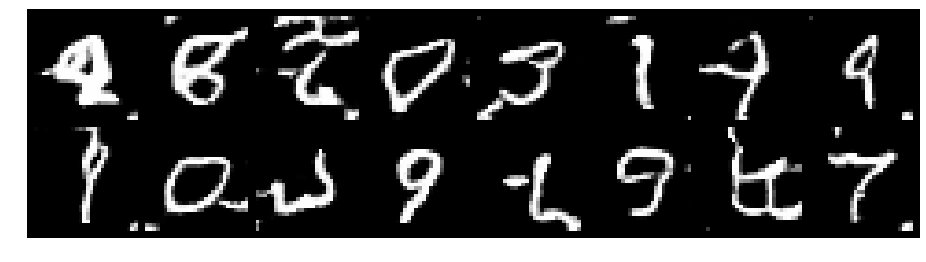

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.1154, Generator Loss: 1.1496
D(x): 0.5953, D(G(z)): 0.3698


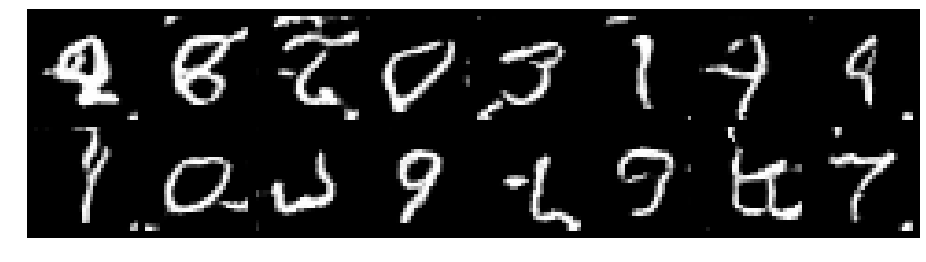

Epoch: [70/200], Batch Num: [100/600]
Discriminator Loss: 1.1375, Generator Loss: 0.9928
D(x): 0.6325, D(G(z)): 0.4147


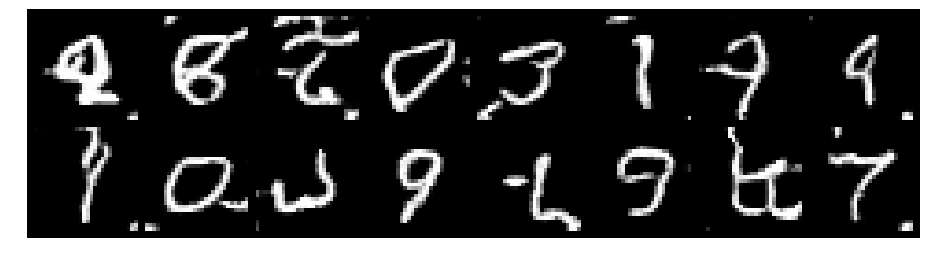

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.1341, Generator Loss: 1.1662
D(x): 0.5705, D(G(z)): 0.3578


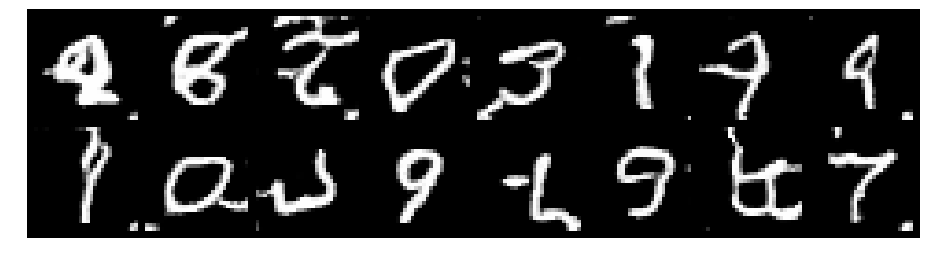

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.1435, Generator Loss: 0.9635
D(x): 0.6246, D(G(z)): 0.4270


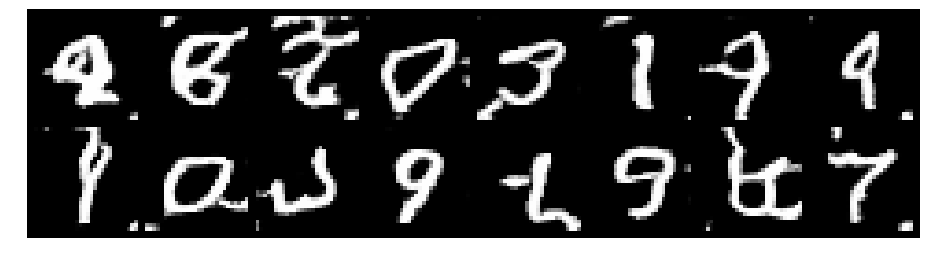

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 0.9816, Generator Loss: 1.0613
D(x): 0.6763, D(G(z)): 0.3784


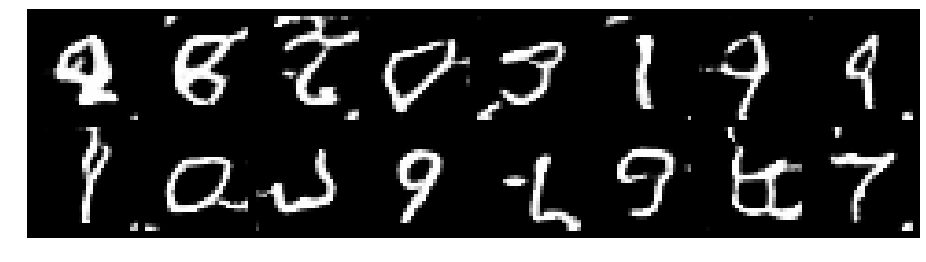

Epoch: [70/200], Batch Num: [500/600]
Discriminator Loss: 1.0313, Generator Loss: 1.0435
D(x): 0.6253, D(G(z)): 0.3514


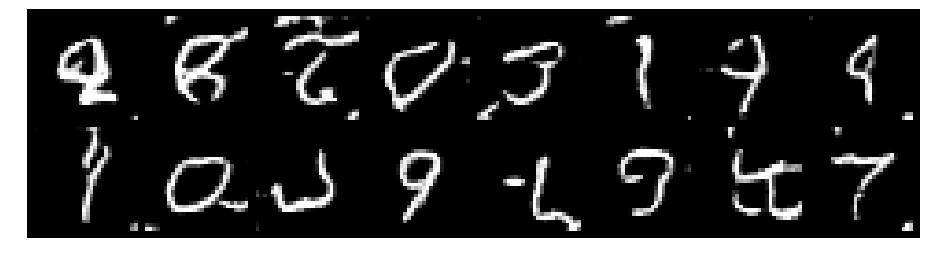

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.1813, Generator Loss: 0.9706
D(x): 0.5957, D(G(z)): 0.3914


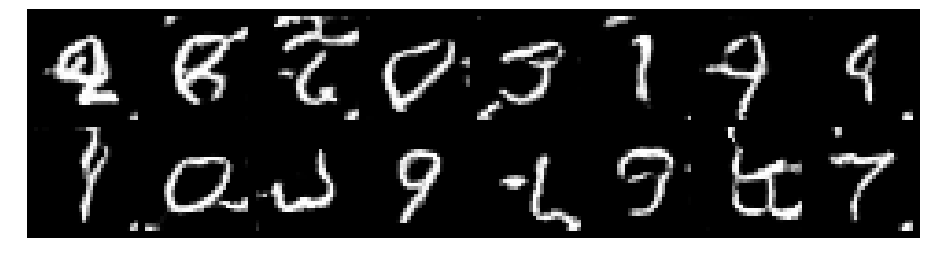

Epoch: [71/200], Batch Num: [100/600]
Discriminator Loss: 1.2298, Generator Loss: 0.9722
D(x): 0.5989, D(G(z)): 0.4199


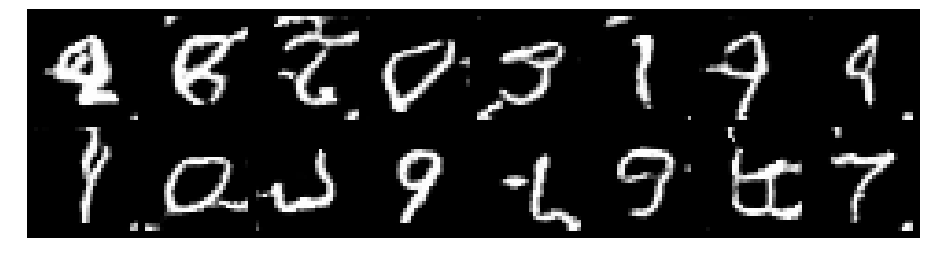

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.1537, Generator Loss: 1.0575
D(x): 0.5909, D(G(z)): 0.3722


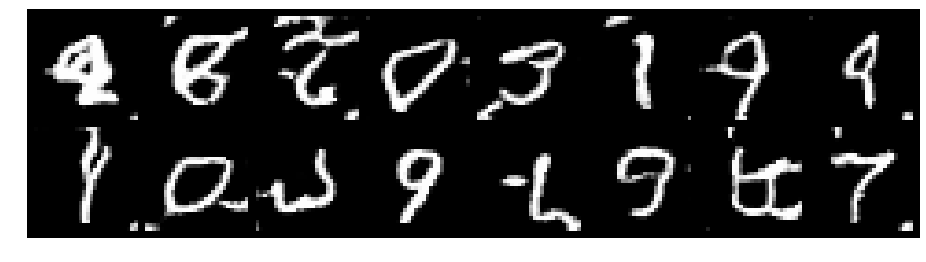

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.2097, Generator Loss: 1.0523
D(x): 0.5676, D(G(z)): 0.3921


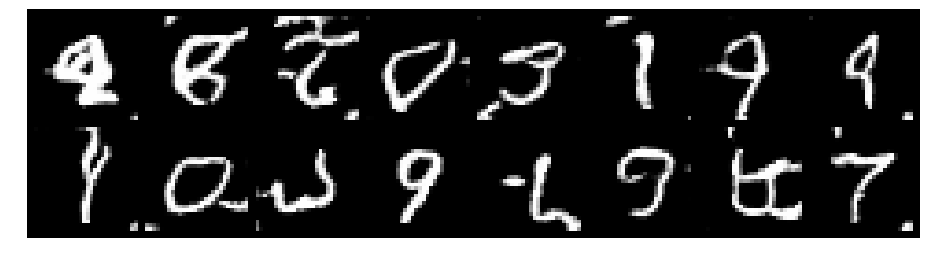

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.0529, Generator Loss: 0.9516
D(x): 0.6147, D(G(z)): 0.3506


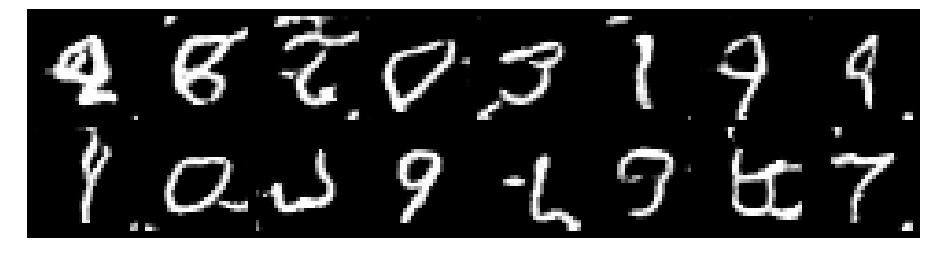

Epoch: [71/200], Batch Num: [500/600]
Discriminator Loss: 1.1417, Generator Loss: 1.0107
D(x): 0.6207, D(G(z)): 0.4140


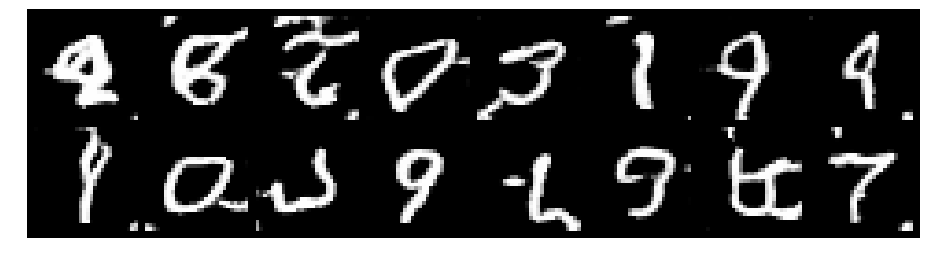

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.1960, Generator Loss: 1.0248
D(x): 0.6040, D(G(z)): 0.4154


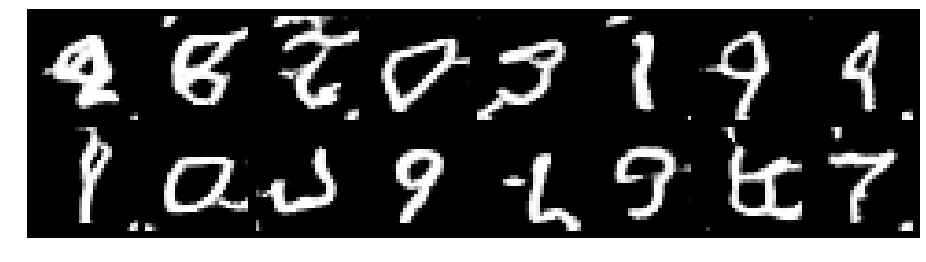

Epoch: [72/200], Batch Num: [100/600]
Discriminator Loss: 0.9837, Generator Loss: 1.2348
D(x): 0.6453, D(G(z)): 0.3475


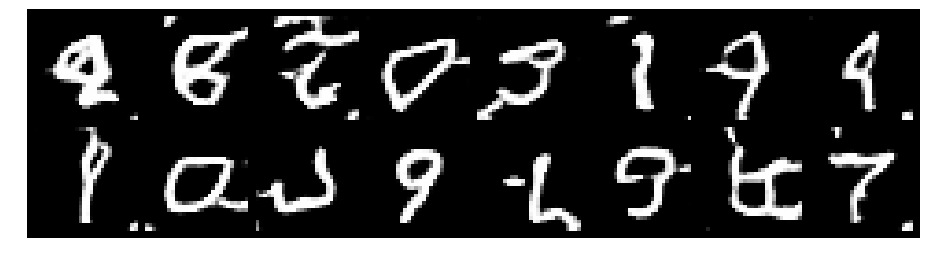

Epoch: [72/200], Batch Num: [200/600]
Discriminator Loss: 1.0087, Generator Loss: 1.0844
D(x): 0.6999, D(G(z)): 0.3807


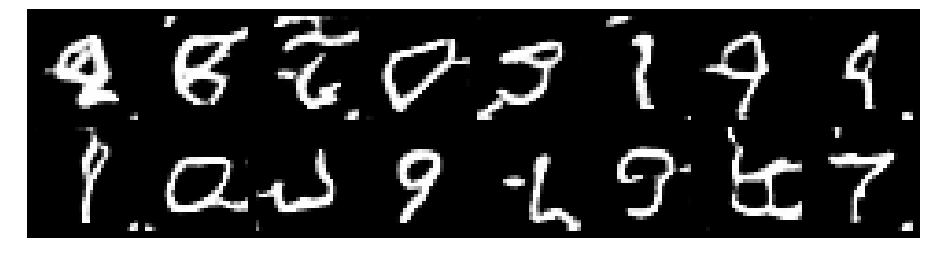

Epoch: [72/200], Batch Num: [300/600]
Discriminator Loss: 1.1830, Generator Loss: 1.1533
D(x): 0.5928, D(G(z)): 0.3916


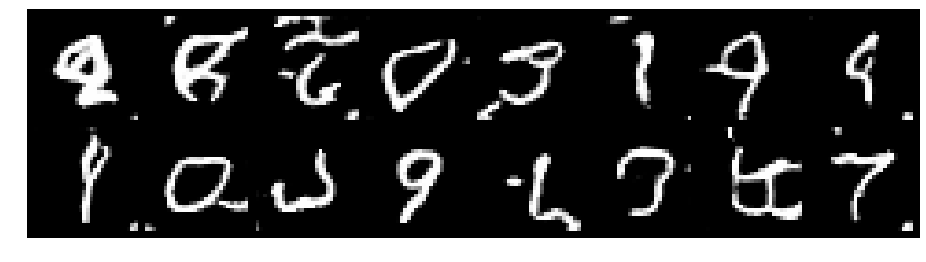

Epoch: [72/200], Batch Num: [400/600]
Discriminator Loss: 1.0910, Generator Loss: 1.0583
D(x): 0.6334, D(G(z)): 0.3929


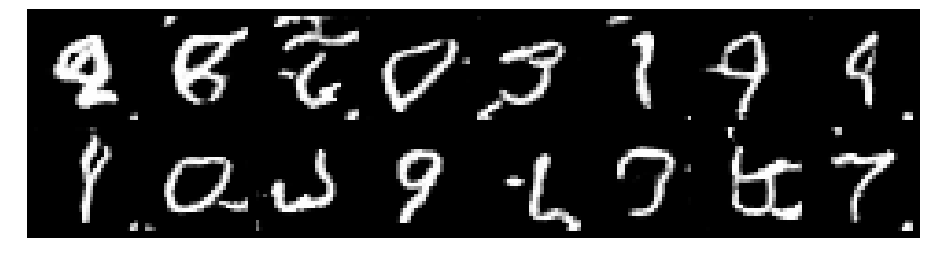

Epoch: [72/200], Batch Num: [500/600]
Discriminator Loss: 1.1257, Generator Loss: 1.0295
D(x): 0.6238, D(G(z)): 0.4066


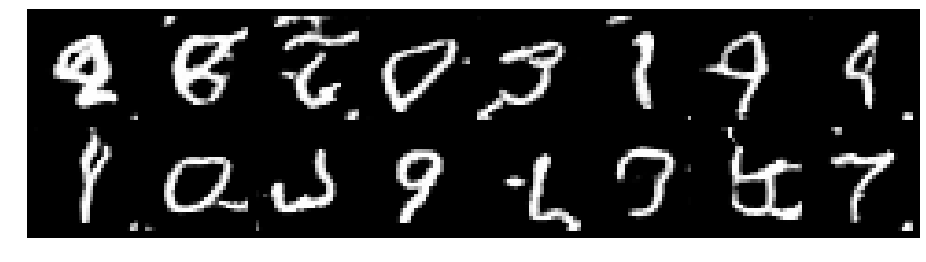

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.0715, Generator Loss: 1.0420
D(x): 0.6396, D(G(z)): 0.3839


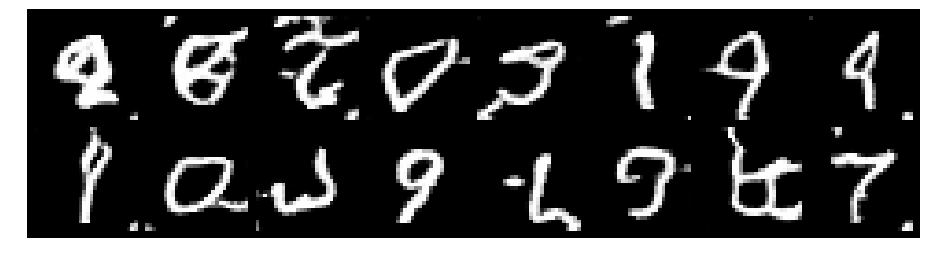

Epoch: [73/200], Batch Num: [100/600]
Discriminator Loss: 1.1984, Generator Loss: 1.0435
D(x): 0.5995, D(G(z)): 0.4240


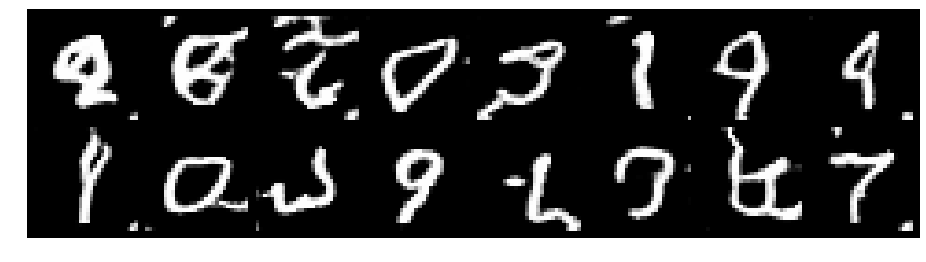

Epoch: [73/200], Batch Num: [200/600]
Discriminator Loss: 1.1112, Generator Loss: 1.0806
D(x): 0.5990, D(G(z)): 0.3816


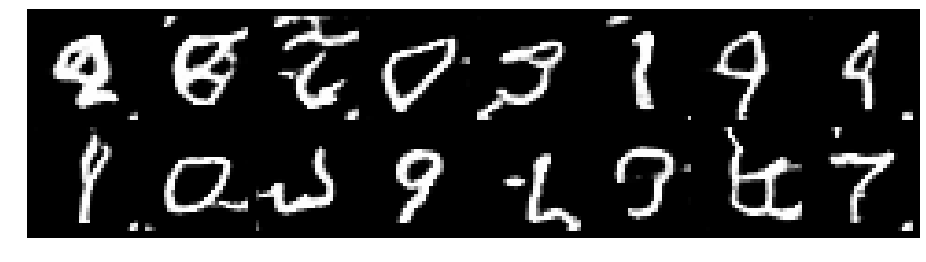

Epoch: [73/200], Batch Num: [300/600]
Discriminator Loss: 1.1902, Generator Loss: 1.1973
D(x): 0.5819, D(G(z)): 0.3916


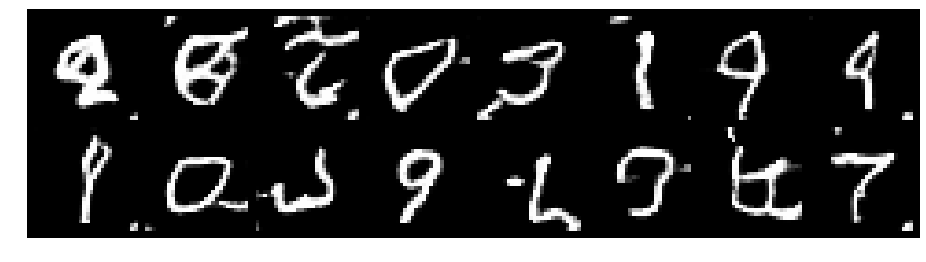

Epoch: [73/200], Batch Num: [400/600]
Discriminator Loss: 1.0697, Generator Loss: 1.1539
D(x): 0.6140, D(G(z)): 0.3486


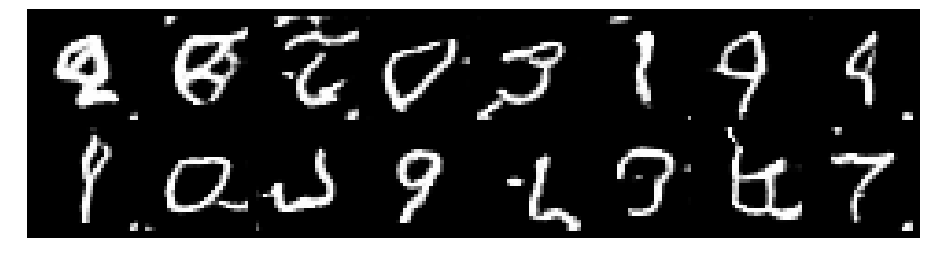

Epoch: [73/200], Batch Num: [500/600]
Discriminator Loss: 1.2167, Generator Loss: 1.0010
D(x): 0.6100, D(G(z)): 0.4360


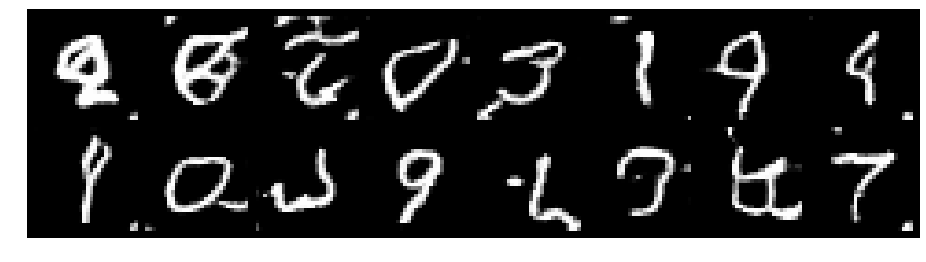

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.0924, Generator Loss: 1.1844
D(x): 0.6153, D(G(z)): 0.3726


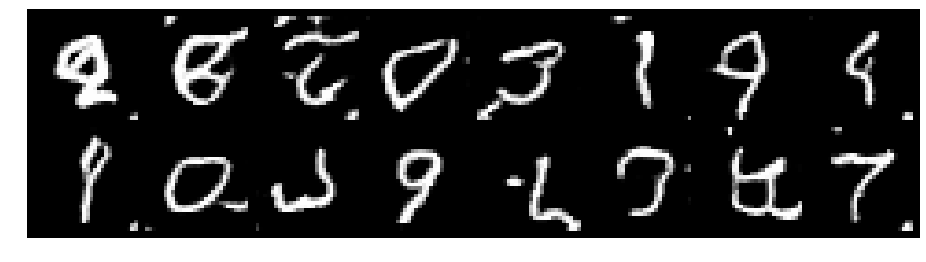

Epoch: [74/200], Batch Num: [100/600]
Discriminator Loss: 1.0981, Generator Loss: 1.1492
D(x): 0.6425, D(G(z)): 0.4172


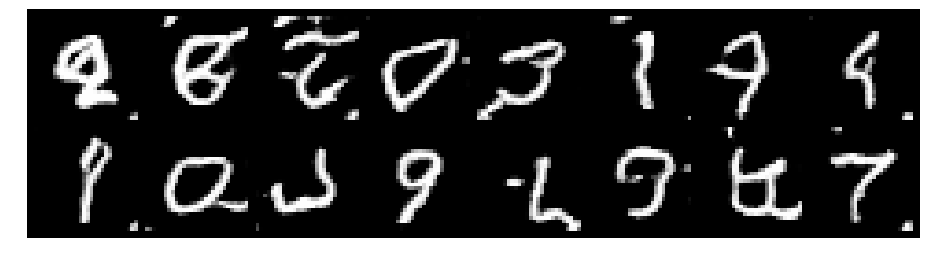

Epoch: [74/200], Batch Num: [200/600]
Discriminator Loss: 1.1462, Generator Loss: 1.0732
D(x): 0.6237, D(G(z)): 0.4084


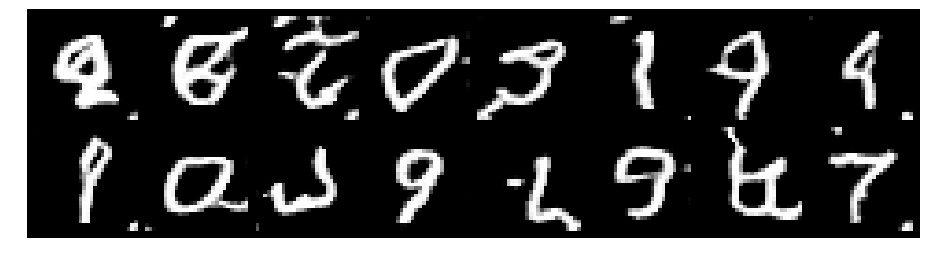

Epoch: [74/200], Batch Num: [300/600]
Discriminator Loss: 1.3411, Generator Loss: 0.9009
D(x): 0.5870, D(G(z)): 0.4591


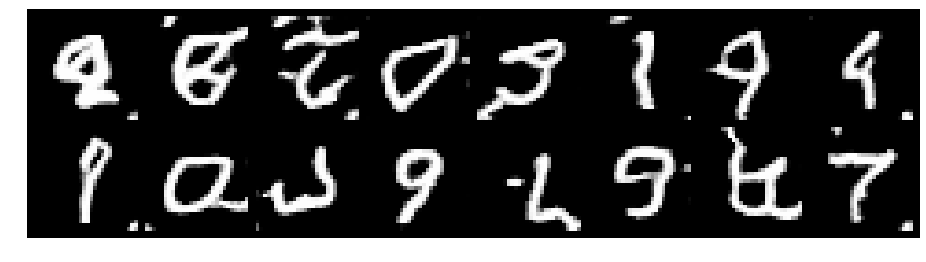

Epoch: [74/200], Batch Num: [400/600]
Discriminator Loss: 1.2195, Generator Loss: 1.1397
D(x): 0.5870, D(G(z)): 0.4099


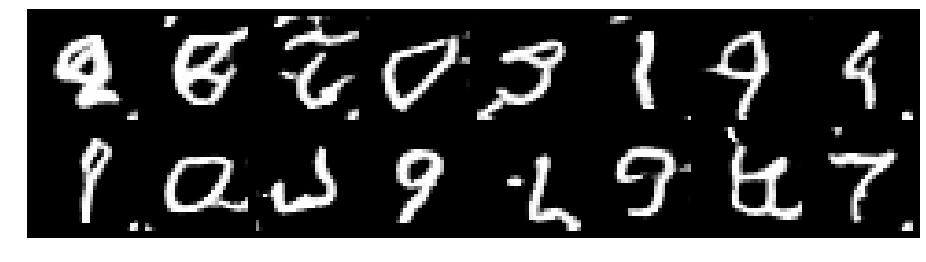

Epoch: [74/200], Batch Num: [500/600]
Discriminator Loss: 1.1943, Generator Loss: 1.0529
D(x): 0.6106, D(G(z)): 0.4081


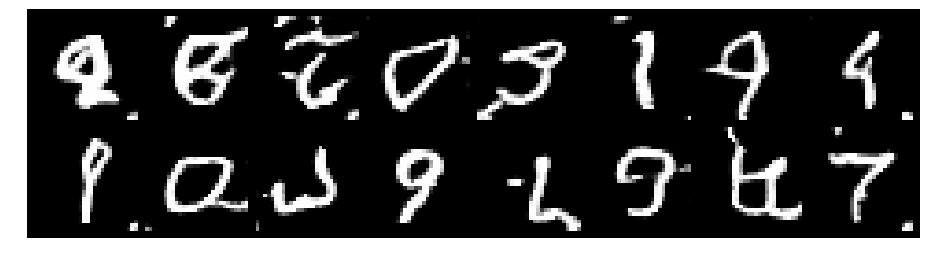

Epoch: [75/200], Batch Num: [0/600]
Discriminator Loss: 1.1384, Generator Loss: 1.0954
D(x): 0.5767, D(G(z)): 0.3696


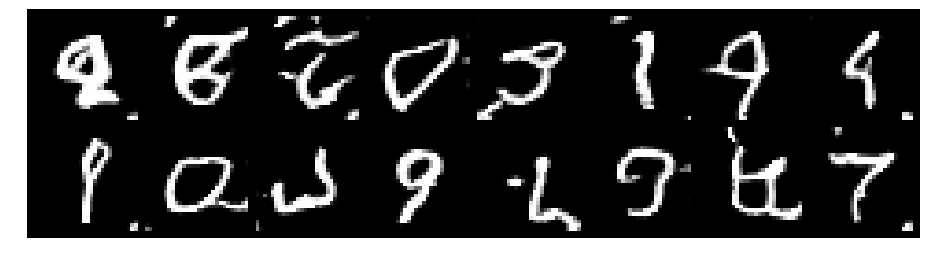

Epoch: [75/200], Batch Num: [100/600]
Discriminator Loss: 1.0370, Generator Loss: 0.9872
D(x): 0.6548, D(G(z)): 0.3875


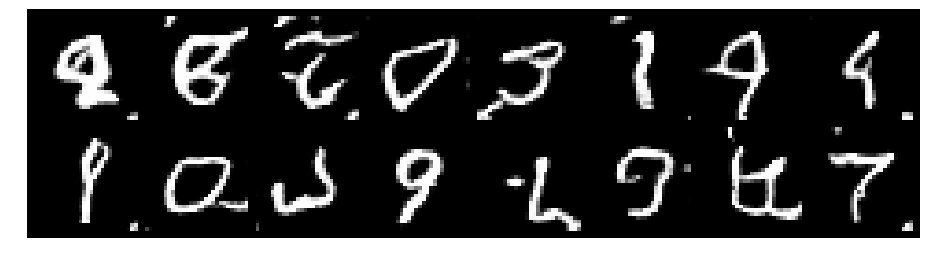

Epoch: [75/200], Batch Num: [200/600]
Discriminator Loss: 1.0733, Generator Loss: 1.0714
D(x): 0.5940, D(G(z)): 0.3377


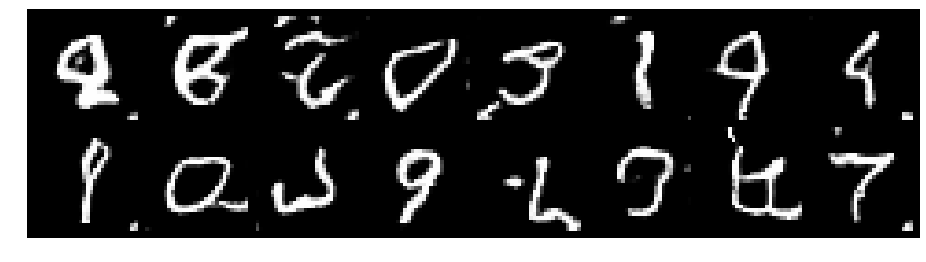

Epoch: [75/200], Batch Num: [300/600]
Discriminator Loss: 1.1864, Generator Loss: 1.0978
D(x): 0.5555, D(G(z)): 0.3563


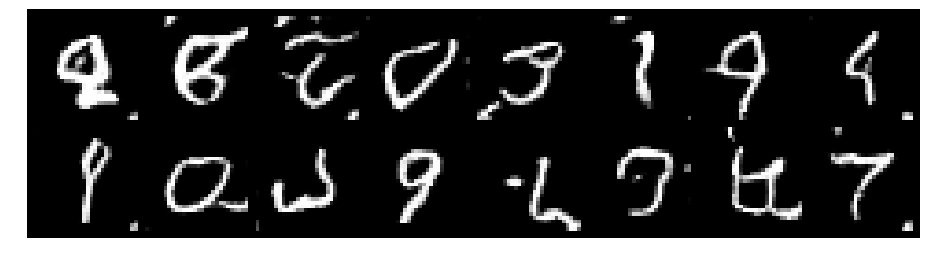

Epoch: [75/200], Batch Num: [400/600]
Discriminator Loss: 1.1831, Generator Loss: 1.0928
D(x): 0.6027, D(G(z)): 0.4086


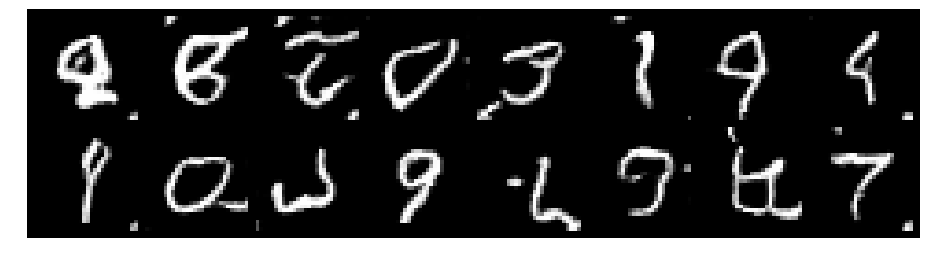

Epoch: [75/200], Batch Num: [500/600]
Discriminator Loss: 1.2394, Generator Loss: 1.0970
D(x): 0.5808, D(G(z)): 0.4106


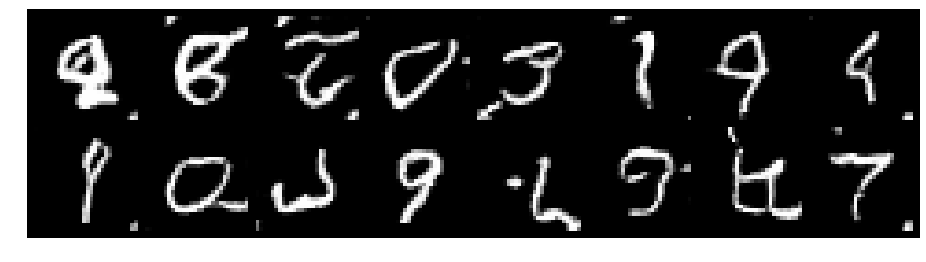

Epoch: [76/200], Batch Num: [0/600]
Discriminator Loss: 1.2377, Generator Loss: 1.0856
D(x): 0.5816, D(G(z)): 0.4113


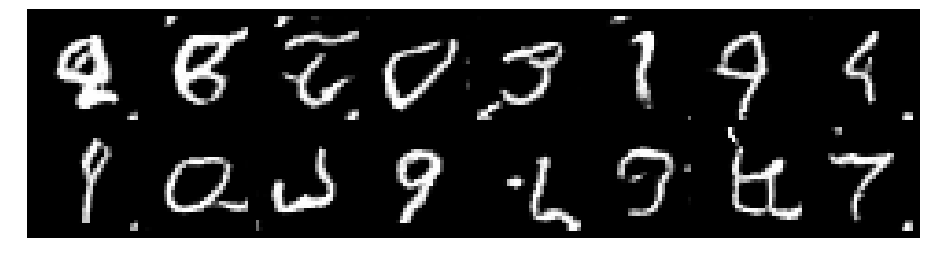

Epoch: [76/200], Batch Num: [100/600]
Discriminator Loss: 1.1645, Generator Loss: 0.9665
D(x): 0.6100, D(G(z)): 0.4027


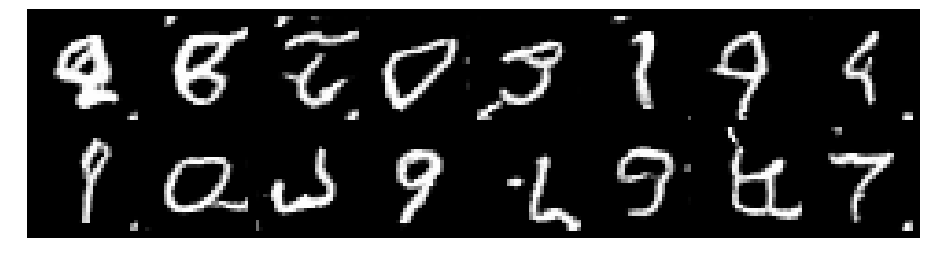

Epoch: [76/200], Batch Num: [200/600]
Discriminator Loss: 1.1606, Generator Loss: 1.0130
D(x): 0.6037, D(G(z)): 0.3971


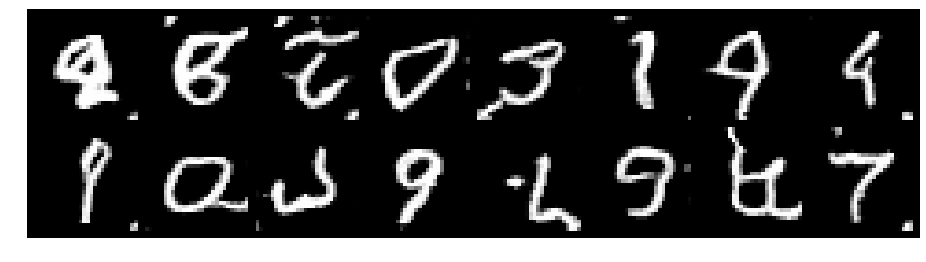

Epoch: [76/200], Batch Num: [300/600]
Discriminator Loss: 1.1623, Generator Loss: 0.9920
D(x): 0.6065, D(G(z)): 0.4113


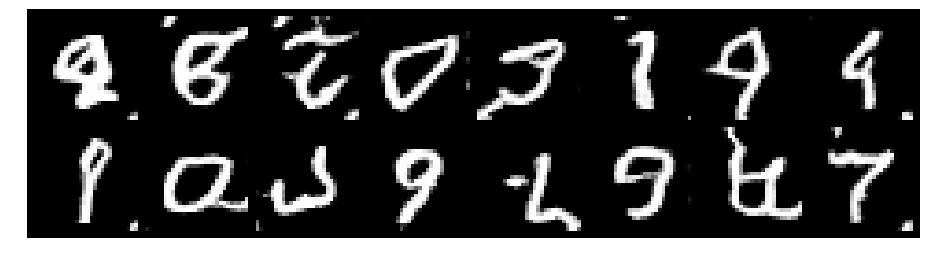

Epoch: [76/200], Batch Num: [400/600]
Discriminator Loss: 1.0547, Generator Loss: 1.0957
D(x): 0.6565, D(G(z)): 0.4015


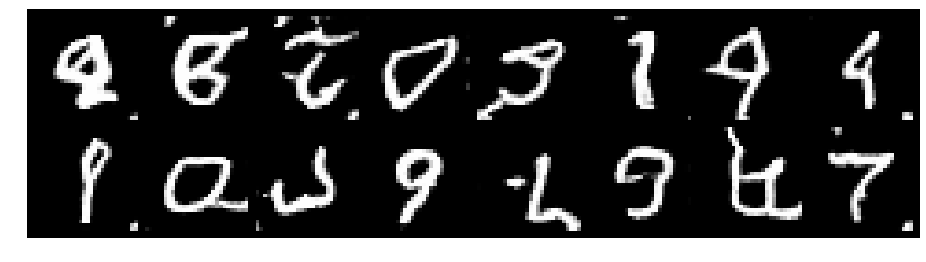

Epoch: [76/200], Batch Num: [500/600]
Discriminator Loss: 1.0695, Generator Loss: 1.0685
D(x): 0.6244, D(G(z)): 0.3815


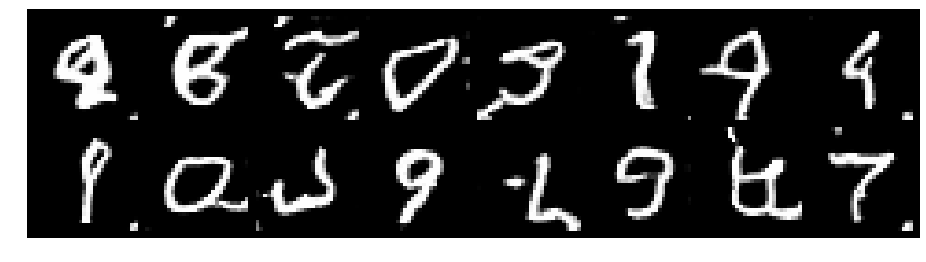

Epoch: [77/200], Batch Num: [0/600]
Discriminator Loss: 1.1354, Generator Loss: 1.0080
D(x): 0.5840, D(G(z)): 0.3733


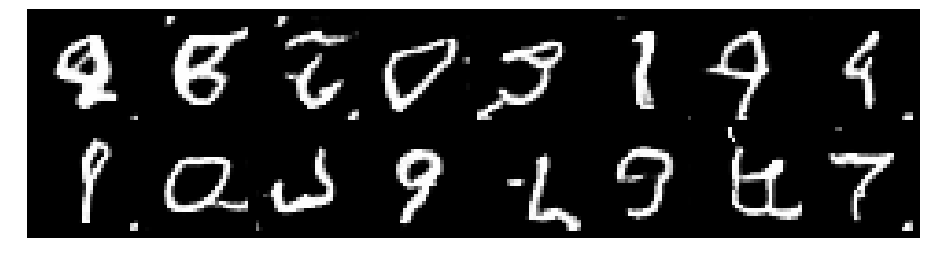

Epoch: [77/200], Batch Num: [100/600]
Discriminator Loss: 1.2336, Generator Loss: 0.9566
D(x): 0.5921, D(G(z)): 0.4172


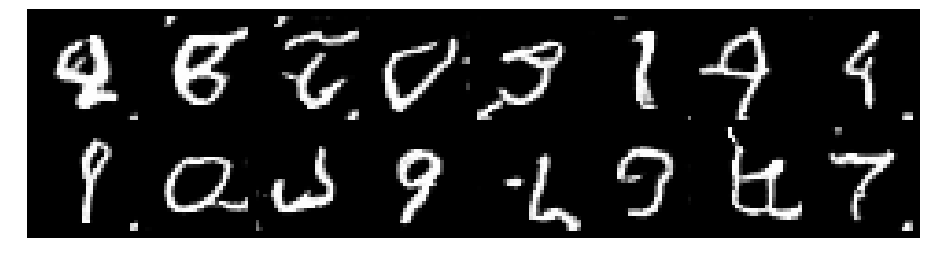

Epoch: [77/200], Batch Num: [200/600]
Discriminator Loss: 1.2057, Generator Loss: 1.0335
D(x): 0.5883, D(G(z)): 0.3907


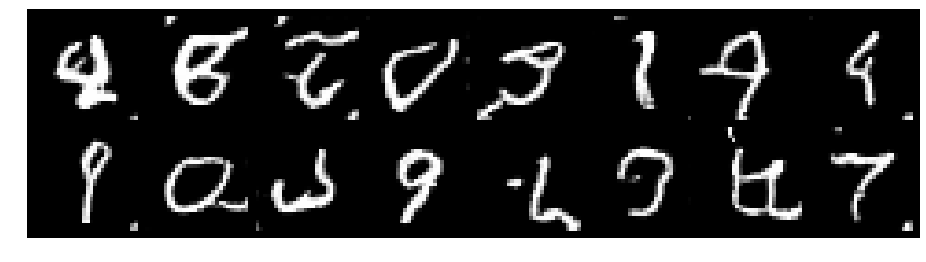

Epoch: [77/200], Batch Num: [300/600]
Discriminator Loss: 1.1524, Generator Loss: 1.1047
D(x): 0.5824, D(G(z)): 0.3630


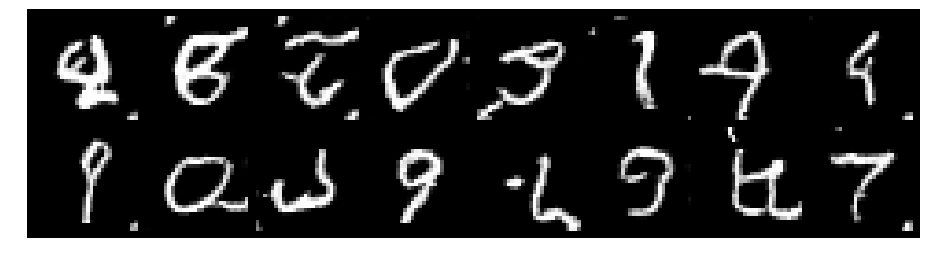

Epoch: [77/200], Batch Num: [400/600]
Discriminator Loss: 1.0955, Generator Loss: 1.1128
D(x): 0.6057, D(G(z)): 0.3655


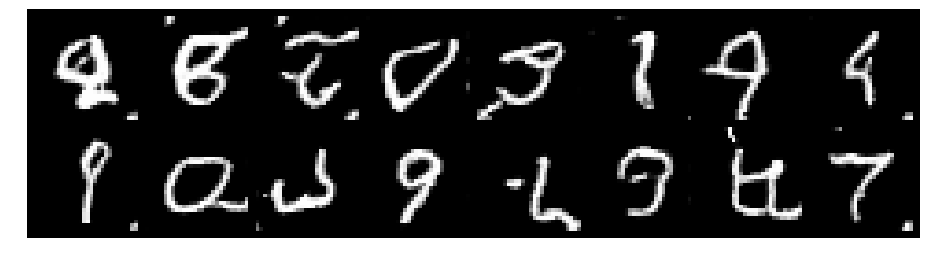

Epoch: [77/200], Batch Num: [500/600]
Discriminator Loss: 1.0853, Generator Loss: 1.0162
D(x): 0.6302, D(G(z)): 0.3824


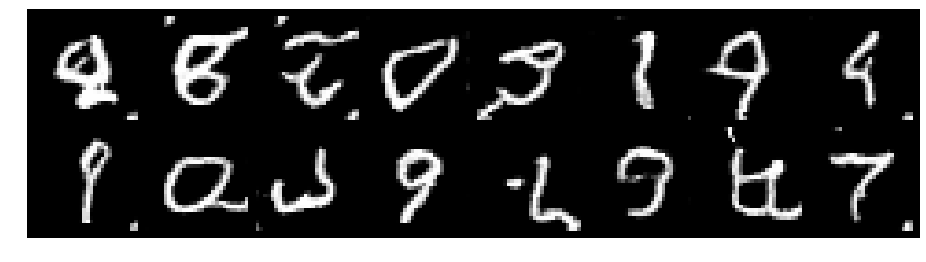

Epoch: [78/200], Batch Num: [0/600]
Discriminator Loss: 1.1497, Generator Loss: 1.1310
D(x): 0.5815, D(G(z)): 0.3658


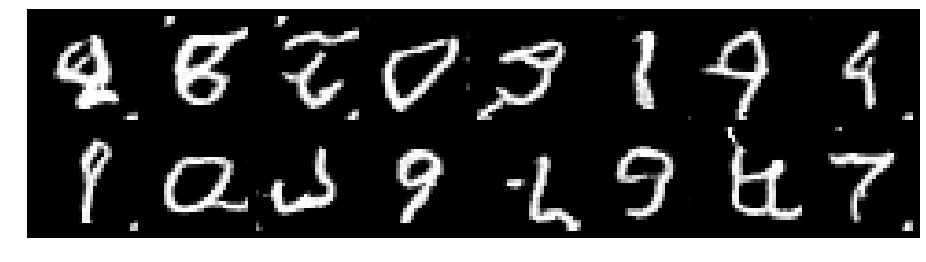

Epoch: [78/200], Batch Num: [100/600]
Discriminator Loss: 1.1024, Generator Loss: 1.0461
D(x): 0.6154, D(G(z)): 0.3764


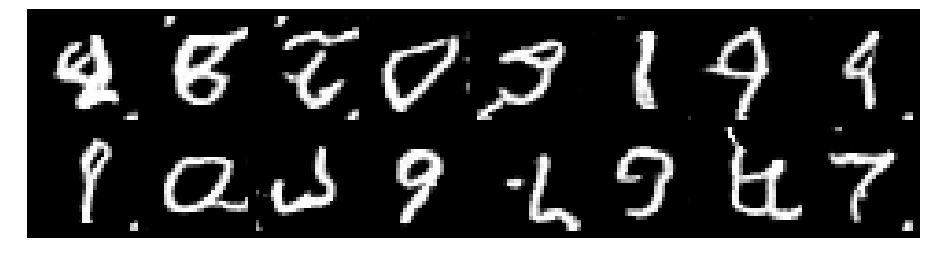

Epoch: [78/200], Batch Num: [200/600]
Discriminator Loss: 1.1538, Generator Loss: 1.1010
D(x): 0.6435, D(G(z)): 0.4281


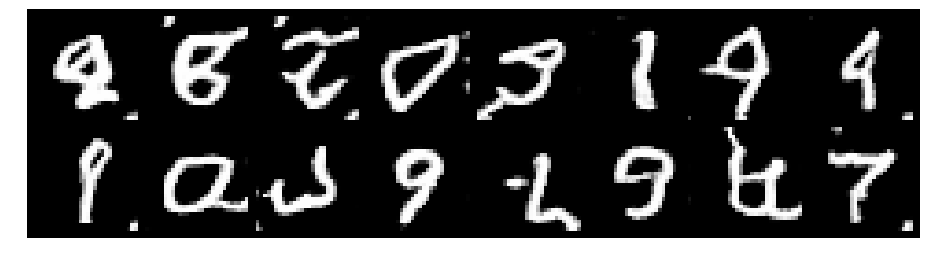

Epoch: [78/200], Batch Num: [300/600]
Discriminator Loss: 1.0786, Generator Loss: 1.0078
D(x): 0.6176, D(G(z)): 0.3666


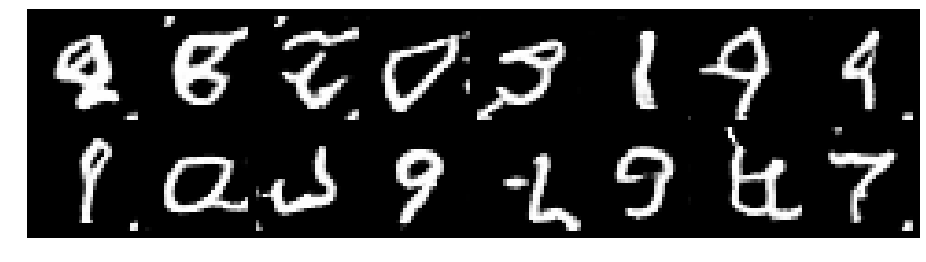

Epoch: [78/200], Batch Num: [400/600]
Discriminator Loss: 1.1139, Generator Loss: 0.9990
D(x): 0.6462, D(G(z)): 0.4026


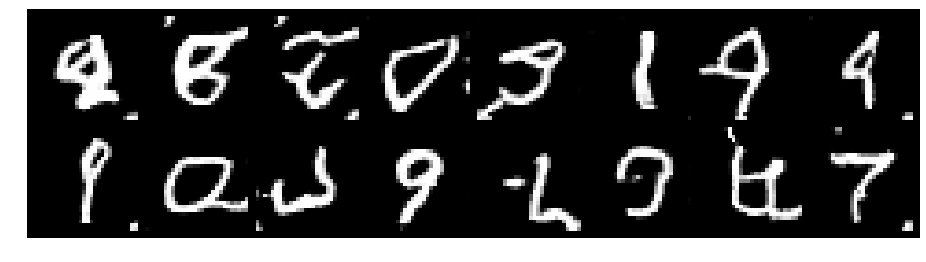

Epoch: [78/200], Batch Num: [500/600]
Discriminator Loss: 1.0838, Generator Loss: 1.1143
D(x): 0.5818, D(G(z)): 0.3470


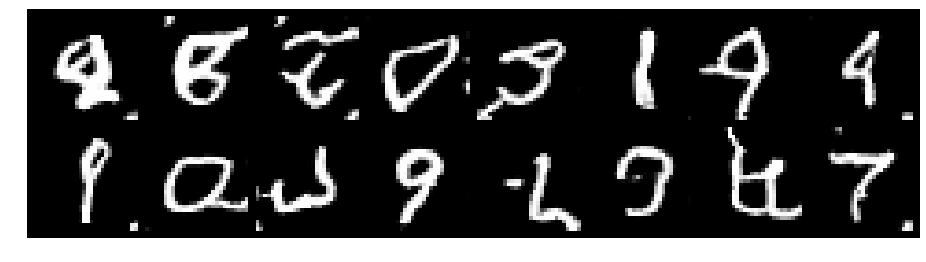

Epoch: [79/200], Batch Num: [0/600]
Discriminator Loss: 1.2237, Generator Loss: 1.1221
D(x): 0.6109, D(G(z)): 0.4382


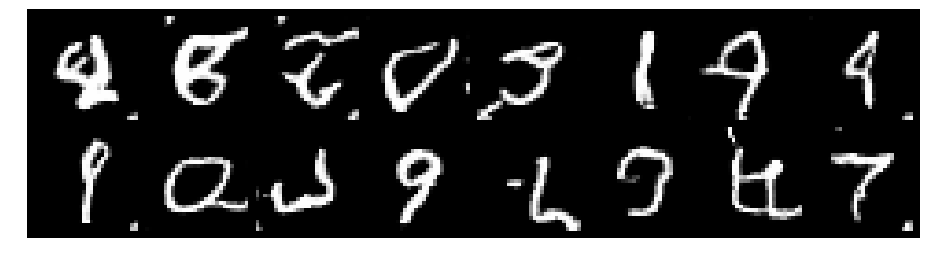

Epoch: [79/200], Batch Num: [100/600]
Discriminator Loss: 1.1990, Generator Loss: 0.9770
D(x): 0.5789, D(G(z)): 0.3897


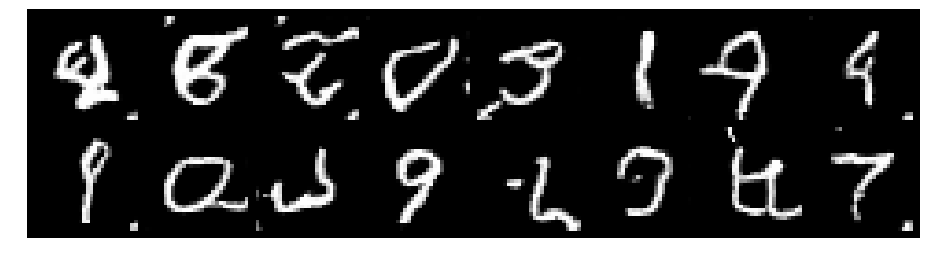

Epoch: [79/200], Batch Num: [200/600]
Discriminator Loss: 1.2139, Generator Loss: 1.0508
D(x): 0.6308, D(G(z)): 0.4496


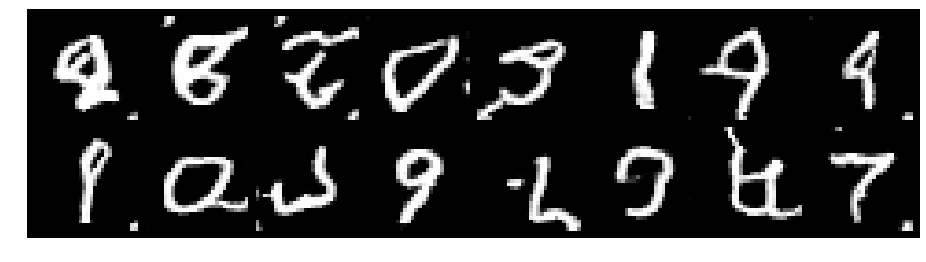

Epoch: [79/200], Batch Num: [300/600]
Discriminator Loss: 1.2276, Generator Loss: 1.1062
D(x): 0.5577, D(G(z)): 0.3760


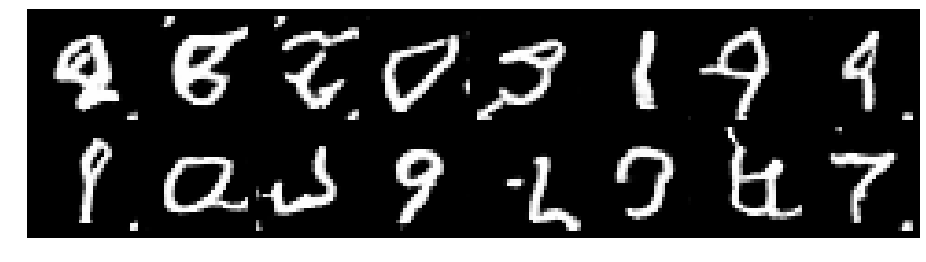

Epoch: [79/200], Batch Num: [400/600]
Discriminator Loss: 0.9157, Generator Loss: 1.0275
D(x): 0.6894, D(G(z)): 0.3578


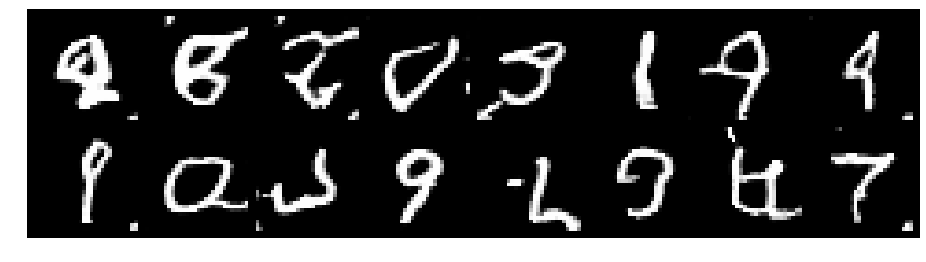

Epoch: [79/200], Batch Num: [500/600]
Discriminator Loss: 1.0889, Generator Loss: 1.2269
D(x): 0.5919, D(G(z)): 0.3236


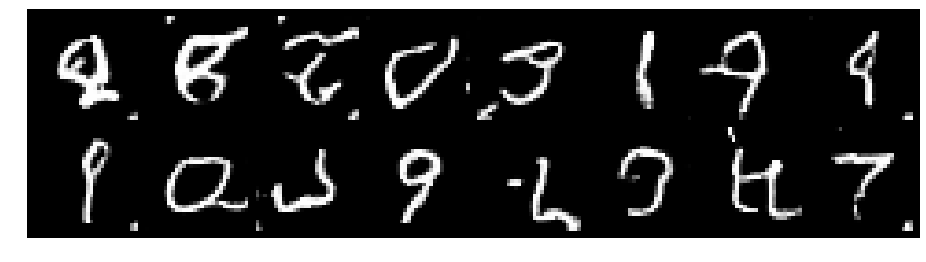

Epoch: [80/200], Batch Num: [0/600]
Discriminator Loss: 1.1048, Generator Loss: 1.2326
D(x): 0.5982, D(G(z)): 0.3639


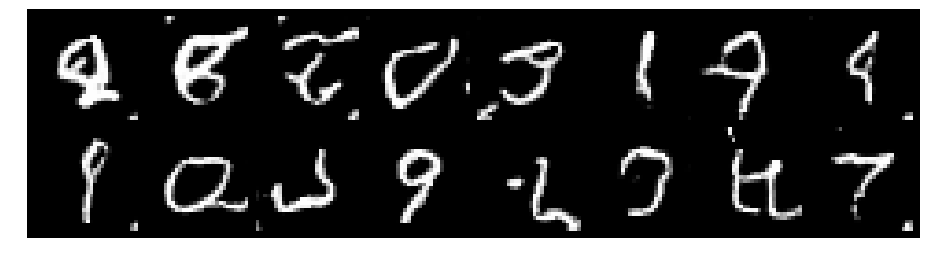

Epoch: [80/200], Batch Num: [100/600]
Discriminator Loss: 1.2914, Generator Loss: 1.0754
D(x): 0.5578, D(G(z)): 0.4081


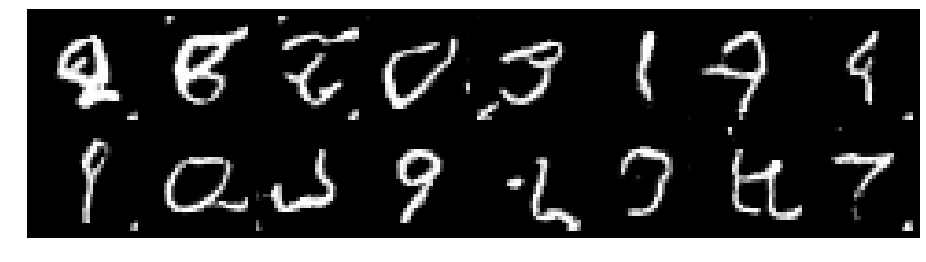

Epoch: [80/200], Batch Num: [200/600]
Discriminator Loss: 1.0511, Generator Loss: 1.0131
D(x): 0.6425, D(G(z)): 0.3824


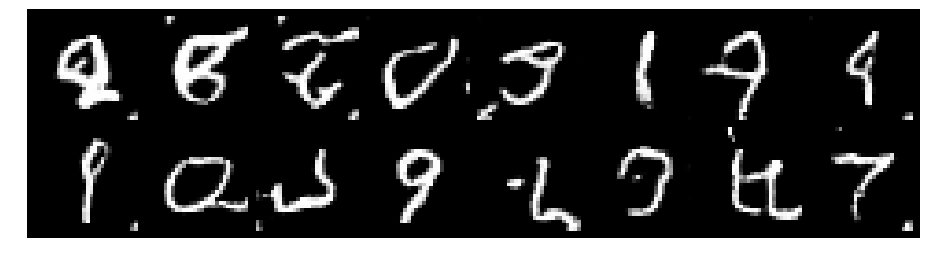

Epoch: [80/200], Batch Num: [300/600]
Discriminator Loss: 1.1775, Generator Loss: 1.2172
D(x): 0.5372, D(G(z)): 0.3353


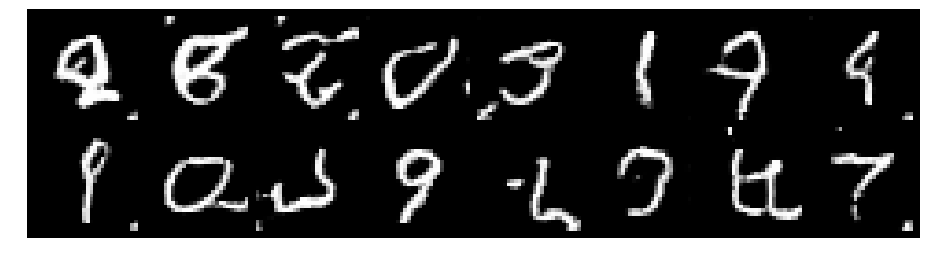

Epoch: [80/200], Batch Num: [400/600]
Discriminator Loss: 1.0631, Generator Loss: 1.0529
D(x): 0.6219, D(G(z)): 0.3560


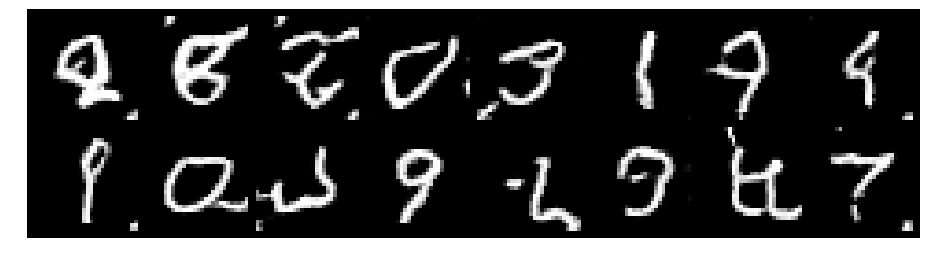

Epoch: [80/200], Batch Num: [500/600]
Discriminator Loss: 1.1246, Generator Loss: 1.0926
D(x): 0.5805, D(G(z)): 0.3595


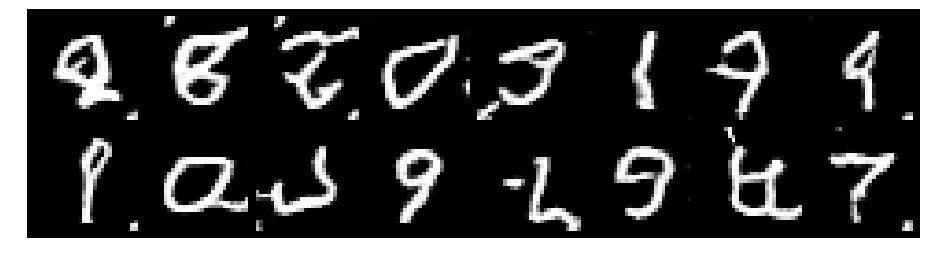

Epoch: [81/200], Batch Num: [0/600]
Discriminator Loss: 1.1264, Generator Loss: 1.1557
D(x): 0.5867, D(G(z)): 0.3475


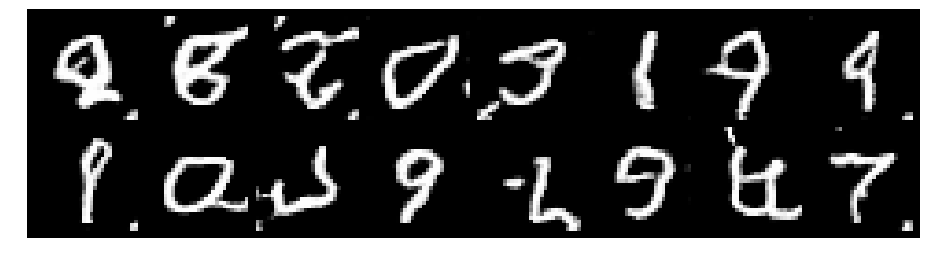

Epoch: [81/200], Batch Num: [100/600]
Discriminator Loss: 1.0891, Generator Loss: 1.0395
D(x): 0.6244, D(G(z)): 0.3834


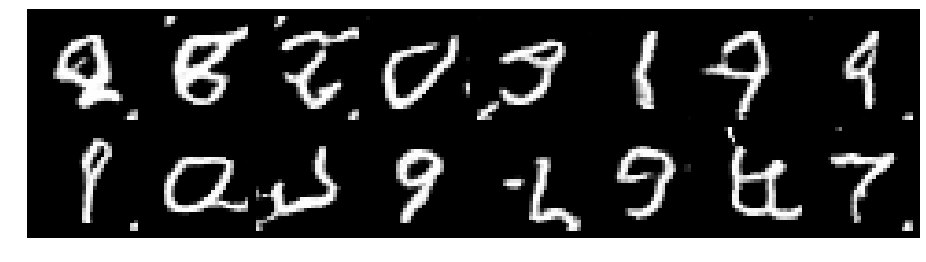

Epoch: [81/200], Batch Num: [200/600]
Discriminator Loss: 1.2315, Generator Loss: 1.0239
D(x): 0.6198, D(G(z)): 0.4357


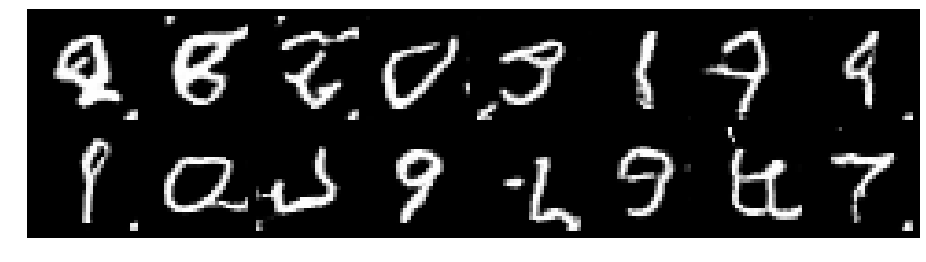

Epoch: [81/200], Batch Num: [300/600]
Discriminator Loss: 1.0435, Generator Loss: 1.0513
D(x): 0.6452, D(G(z)): 0.3906


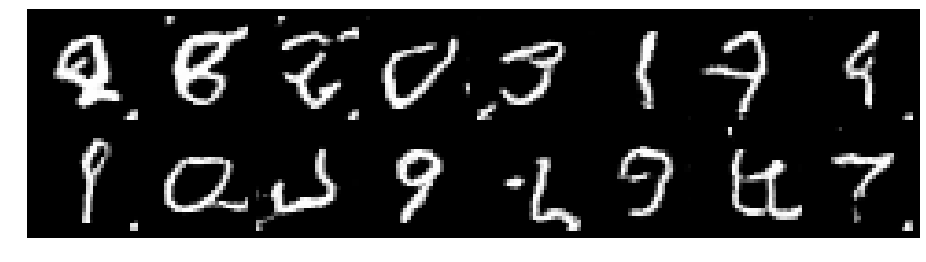

Epoch: [81/200], Batch Num: [400/600]
Discriminator Loss: 1.0833, Generator Loss: 1.0197
D(x): 0.6182, D(G(z)): 0.3710


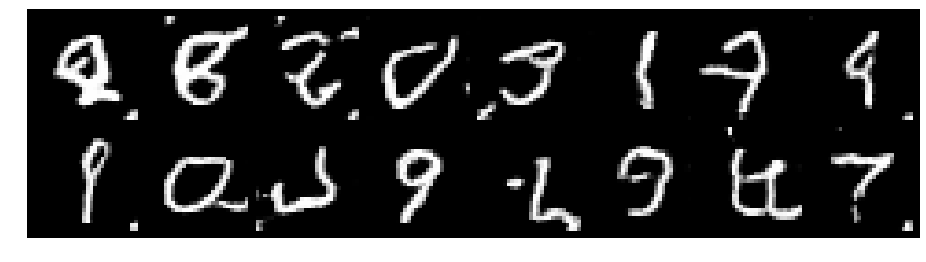

Epoch: [81/200], Batch Num: [500/600]
Discriminator Loss: 1.1764, Generator Loss: 1.2082
D(x): 0.6186, D(G(z)): 0.4146


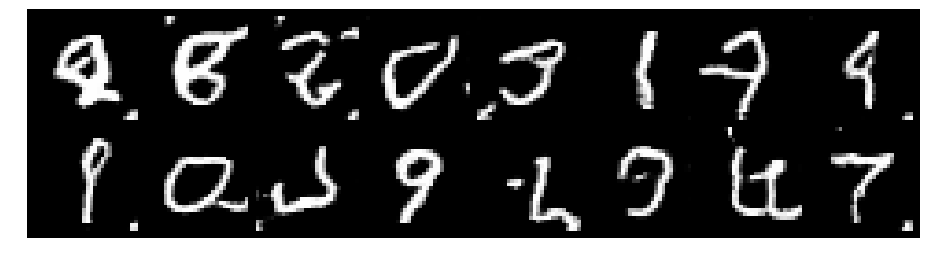

Epoch: [82/200], Batch Num: [0/600]
Discriminator Loss: 1.0746, Generator Loss: 1.0747
D(x): 0.6085, D(G(z)): 0.3595


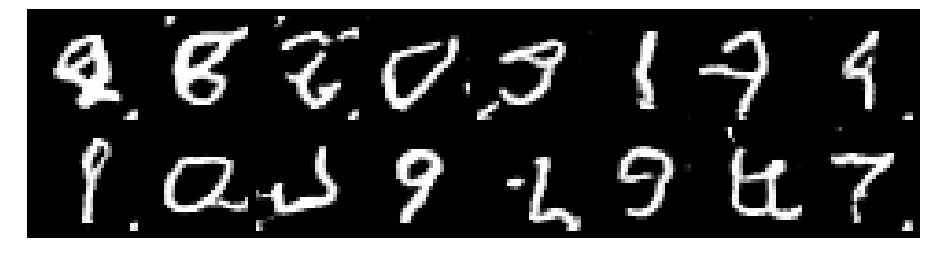

Epoch: [82/200], Batch Num: [100/600]
Discriminator Loss: 1.1303, Generator Loss: 1.0012
D(x): 0.6193, D(G(z)): 0.3989


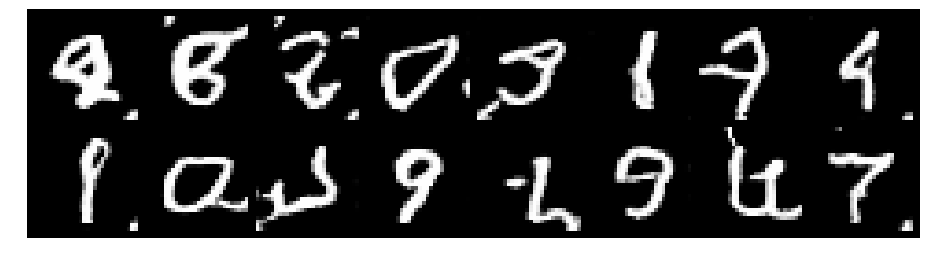

Epoch: [82/200], Batch Num: [200/600]
Discriminator Loss: 1.1238, Generator Loss: 0.9389
D(x): 0.6187, D(G(z)): 0.4023


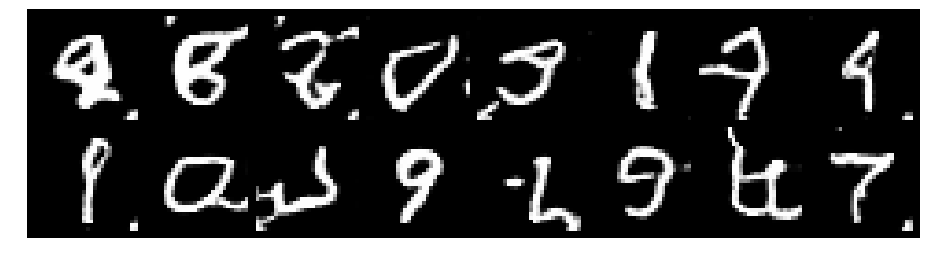

Epoch: [82/200], Batch Num: [300/600]
Discriminator Loss: 1.0717, Generator Loss: 1.1597
D(x): 0.5977, D(G(z)): 0.3308


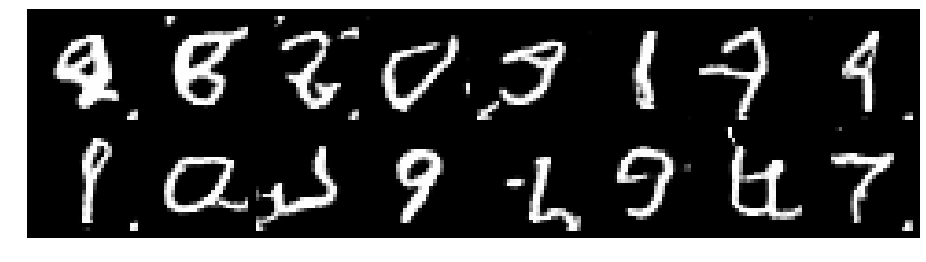

Epoch: [82/200], Batch Num: [400/600]
Discriminator Loss: 1.1784, Generator Loss: 1.1936
D(x): 0.5858, D(G(z)): 0.3907


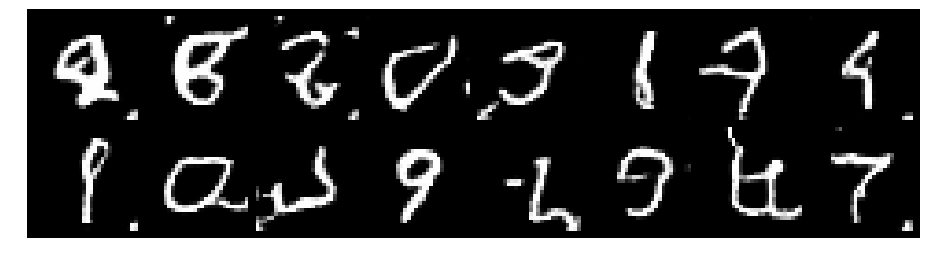

Epoch: [82/200], Batch Num: [500/600]
Discriminator Loss: 1.0996, Generator Loss: 1.1461
D(x): 0.6110, D(G(z)): 0.3509


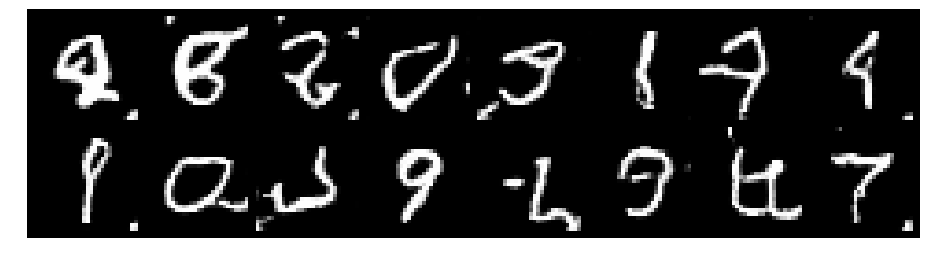

Epoch: [83/200], Batch Num: [0/600]
Discriminator Loss: 1.1847, Generator Loss: 0.9883
D(x): 0.6401, D(G(z)): 0.4330


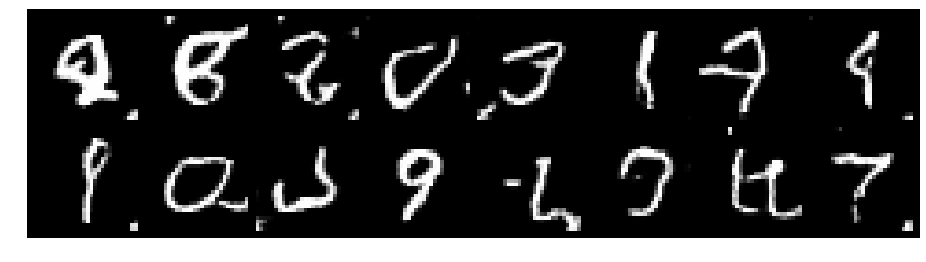

Epoch: [83/200], Batch Num: [100/600]
Discriminator Loss: 1.0378, Generator Loss: 1.0577
D(x): 0.5981, D(G(z)): 0.3331


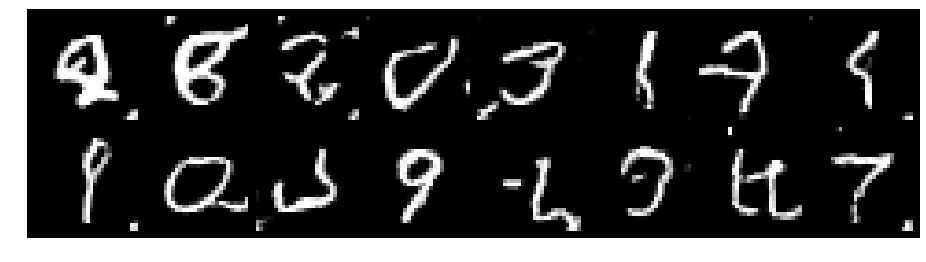

Epoch: [83/200], Batch Num: [200/600]
Discriminator Loss: 1.3475, Generator Loss: 1.0551
D(x): 0.5785, D(G(z)): 0.4592


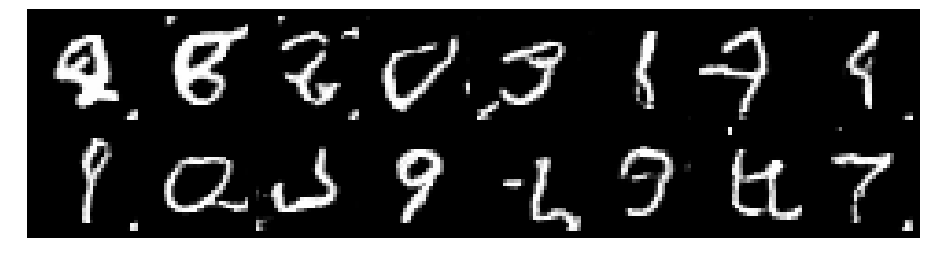

Epoch: [83/200], Batch Num: [300/600]
Discriminator Loss: 1.0769, Generator Loss: 1.0614
D(x): 0.6274, D(G(z)): 0.3676


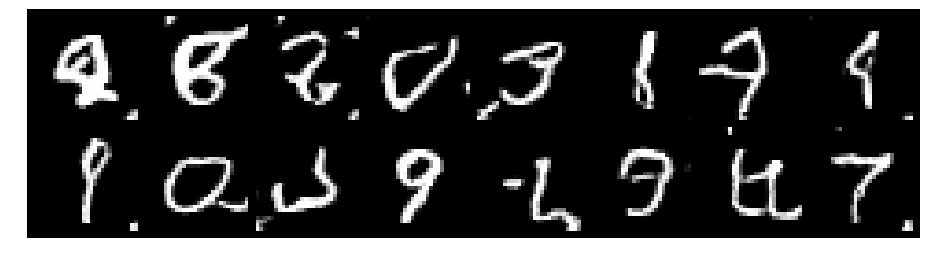

Epoch: [83/200], Batch Num: [400/600]
Discriminator Loss: 1.0931, Generator Loss: 1.0002
D(x): 0.6042, D(G(z)): 0.3657


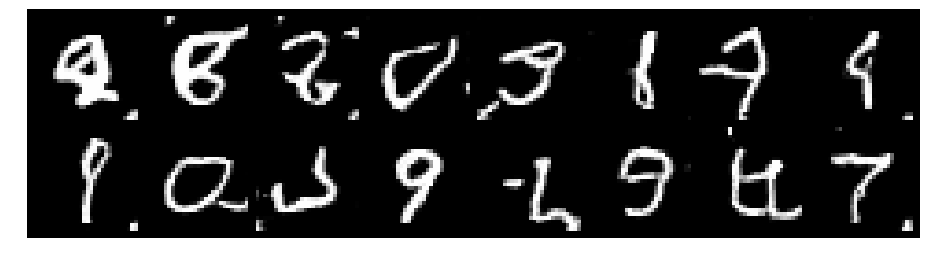

Epoch: [83/200], Batch Num: [500/600]
Discriminator Loss: 1.0839, Generator Loss: 1.1526
D(x): 0.6384, D(G(z)): 0.3975


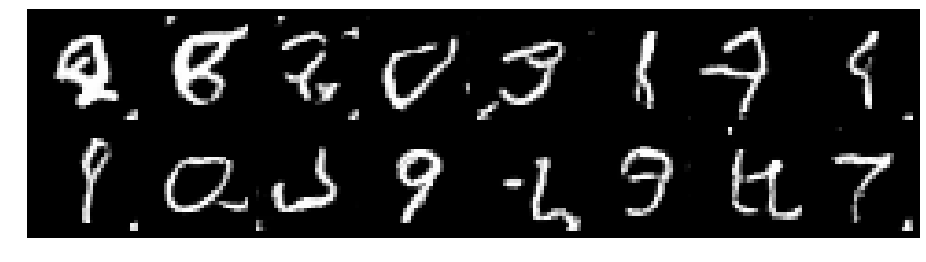

Epoch: [84/200], Batch Num: [0/600]
Discriminator Loss: 1.1288, Generator Loss: 1.0724
D(x): 0.6097, D(G(z)): 0.3992


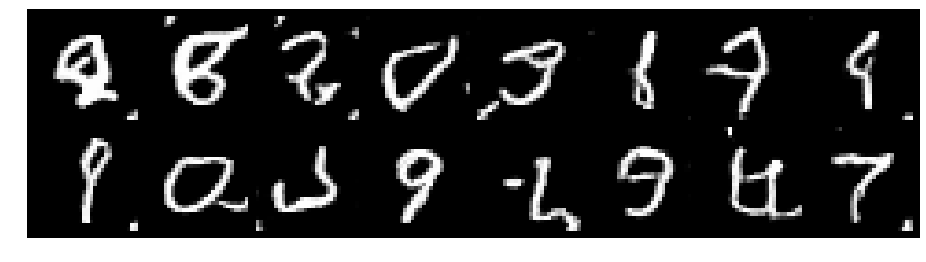

Epoch: [84/200], Batch Num: [100/600]
Discriminator Loss: 1.2486, Generator Loss: 1.0113
D(x): 0.5901, D(G(z)): 0.4251


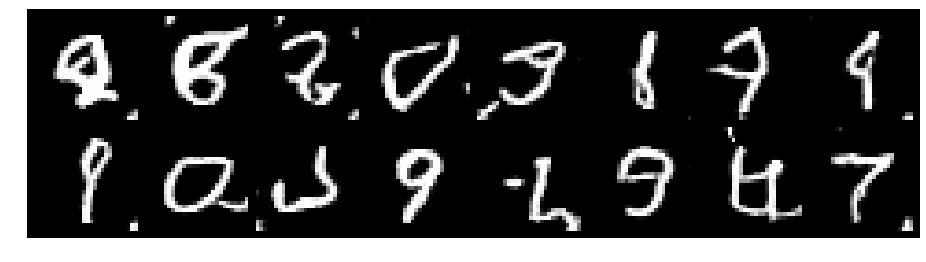

Epoch: [84/200], Batch Num: [200/600]
Discriminator Loss: 1.1223, Generator Loss: 1.1754
D(x): 0.5948, D(G(z)): 0.3522


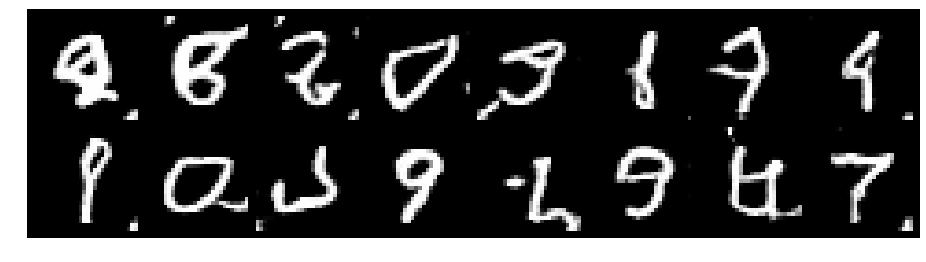

Epoch: [84/200], Batch Num: [300/600]
Discriminator Loss: 1.1698, Generator Loss: 1.0607
D(x): 0.6288, D(G(z)): 0.4210


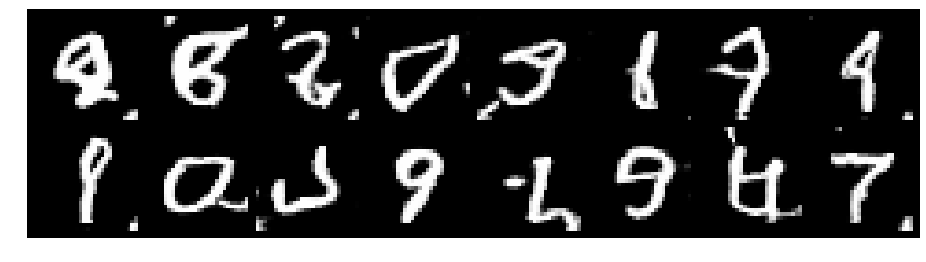

Epoch: [84/200], Batch Num: [400/600]
Discriminator Loss: 1.0855, Generator Loss: 1.0056
D(x): 0.6670, D(G(z)): 0.4093


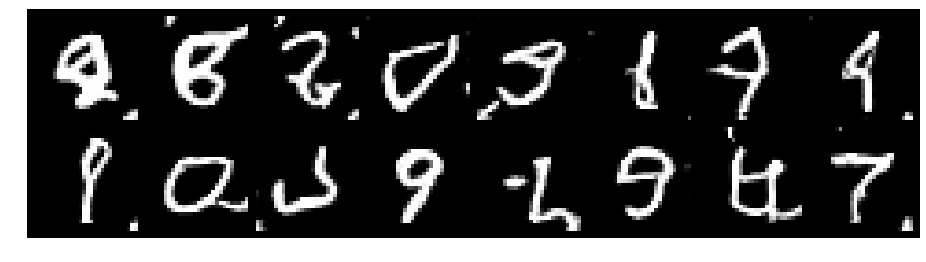

Epoch: [84/200], Batch Num: [500/600]
Discriminator Loss: 1.1256, Generator Loss: 1.0770
D(x): 0.6090, D(G(z)): 0.3823


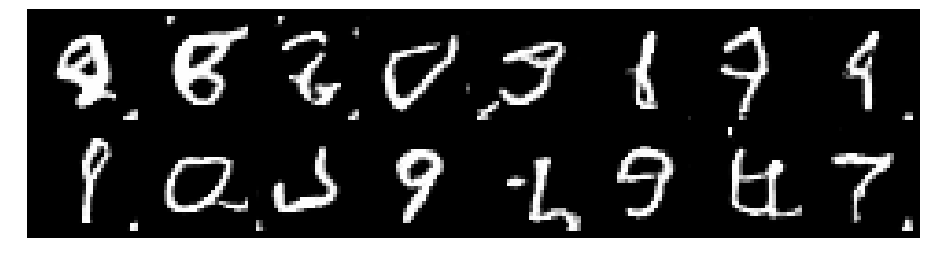

Epoch: [85/200], Batch Num: [0/600]
Discriminator Loss: 1.0933, Generator Loss: 1.0004
D(x): 0.6253, D(G(z)): 0.3852


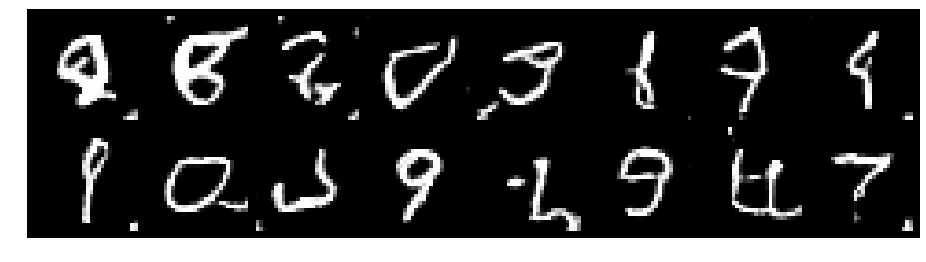

Epoch: [85/200], Batch Num: [100/600]
Discriminator Loss: 1.0838, Generator Loss: 1.1922
D(x): 0.5799, D(G(z)): 0.3244


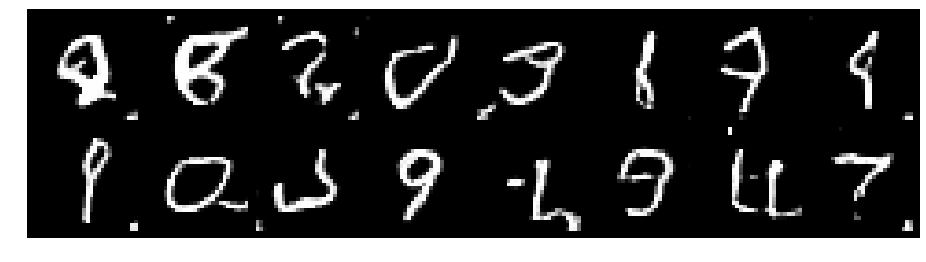

Epoch: [85/200], Batch Num: [200/600]
Discriminator Loss: 0.9865, Generator Loss: 1.1878
D(x): 0.6516, D(G(z)): 0.3473


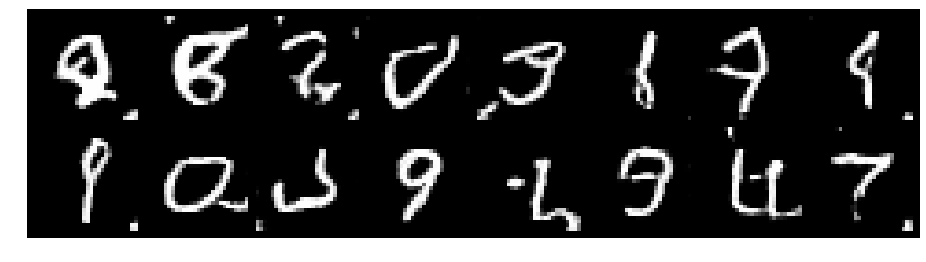

Epoch: [85/200], Batch Num: [300/600]
Discriminator Loss: 1.1836, Generator Loss: 1.0717
D(x): 0.5704, D(G(z)): 0.3640


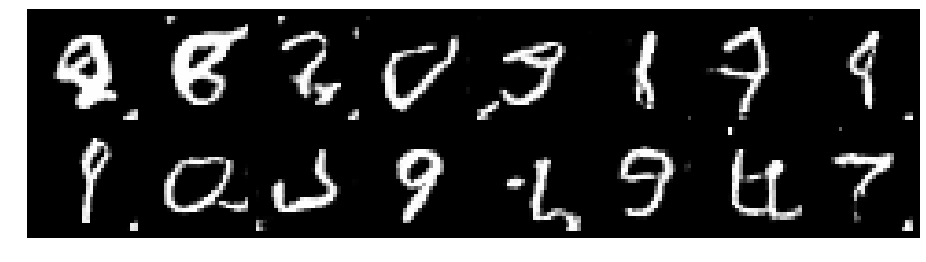

Epoch: [85/200], Batch Num: [400/600]
Discriminator Loss: 1.1252, Generator Loss: 1.2169
D(x): 0.5976, D(G(z)): 0.3780


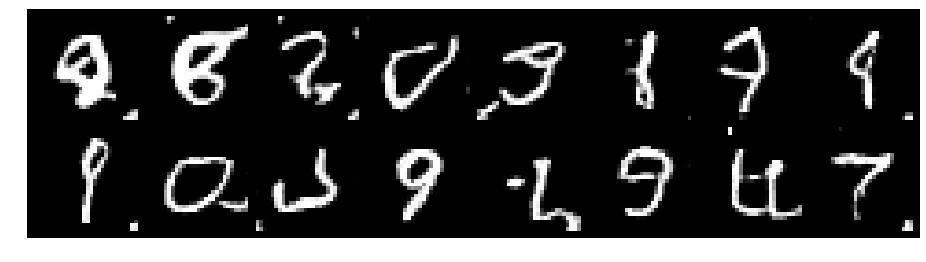

Epoch: [85/200], Batch Num: [500/600]
Discriminator Loss: 1.1283, Generator Loss: 1.0069
D(x): 0.6246, D(G(z)): 0.4037


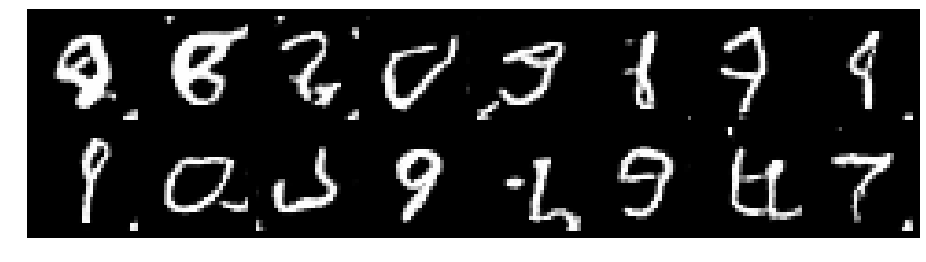

Epoch: [86/200], Batch Num: [0/600]
Discriminator Loss: 1.1365, Generator Loss: 1.0880
D(x): 0.5797, D(G(z)): 0.3568


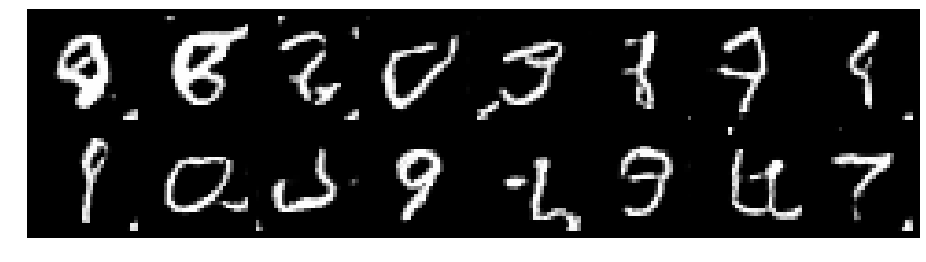

Epoch: [86/200], Batch Num: [100/600]
Discriminator Loss: 1.1282, Generator Loss: 0.9191
D(x): 0.6345, D(G(z)): 0.4189


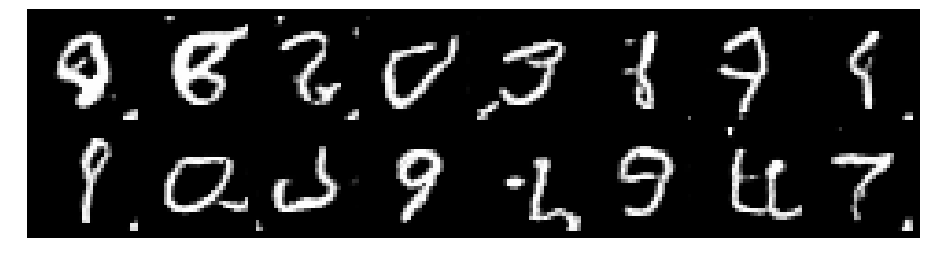

Epoch: [86/200], Batch Num: [200/600]
Discriminator Loss: 1.1383, Generator Loss: 1.1041
D(x): 0.6069, D(G(z)): 0.3820


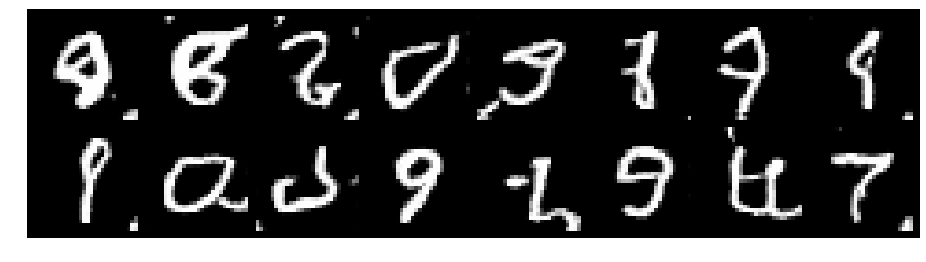

Epoch: [86/200], Batch Num: [300/600]
Discriminator Loss: 1.0830, Generator Loss: 1.0569
D(x): 0.6469, D(G(z)): 0.4046


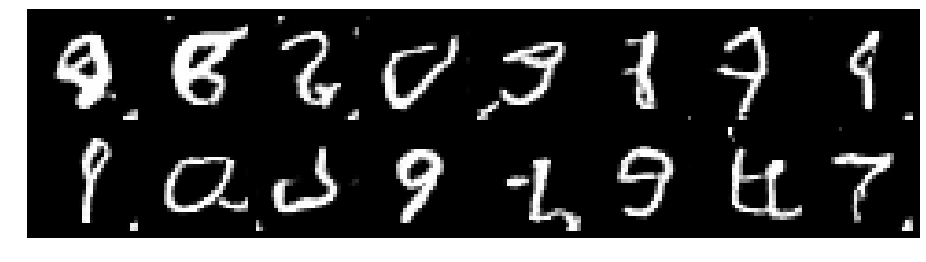

Epoch: [86/200], Batch Num: [400/600]
Discriminator Loss: 1.0997, Generator Loss: 1.0699
D(x): 0.6205, D(G(z)): 0.3906


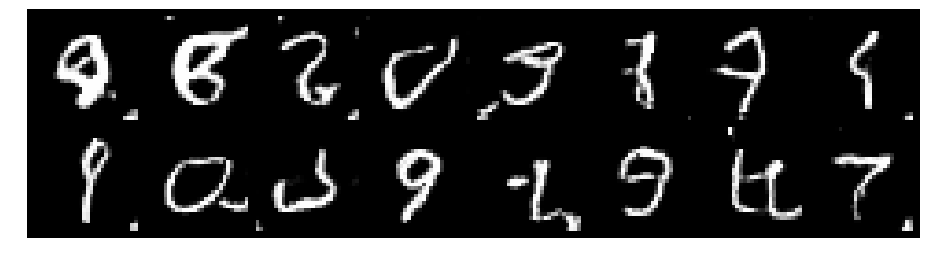

Epoch: [86/200], Batch Num: [500/600]
Discriminator Loss: 1.3324, Generator Loss: 1.0893
D(x): 0.5865, D(G(z)): 0.4511


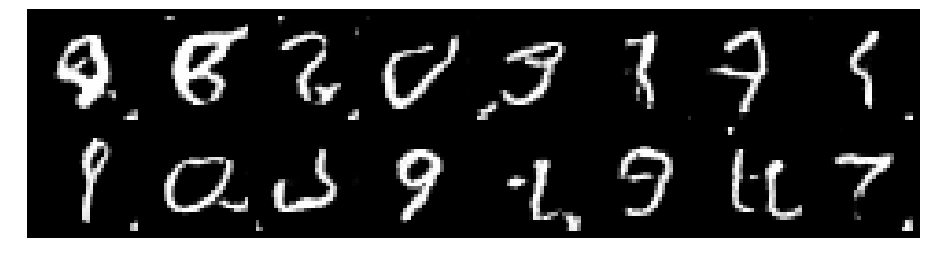

Epoch: [87/200], Batch Num: [0/600]
Discriminator Loss: 1.1301, Generator Loss: 1.1272
D(x): 0.6038, D(G(z)): 0.3858


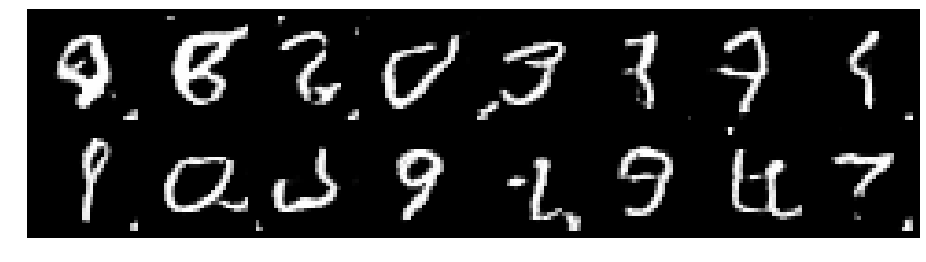

Epoch: [87/200], Batch Num: [100/600]
Discriminator Loss: 1.2915, Generator Loss: 1.2043
D(x): 0.5461, D(G(z)): 0.4061


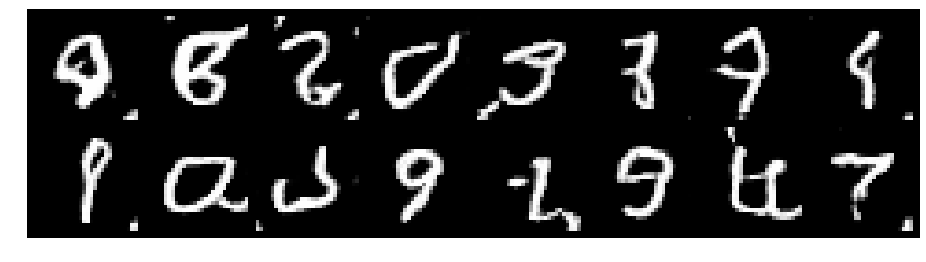

Epoch: [87/200], Batch Num: [200/600]
Discriminator Loss: 1.1548, Generator Loss: 0.9941
D(x): 0.6140, D(G(z)): 0.3928


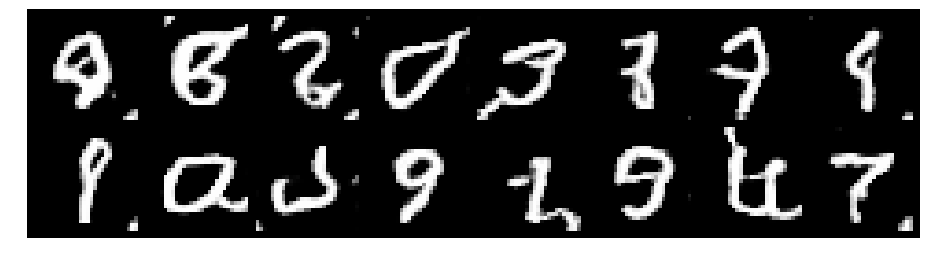

Epoch: [87/200], Batch Num: [300/600]
Discriminator Loss: 1.2230, Generator Loss: 1.0593
D(x): 0.6124, D(G(z)): 0.4309


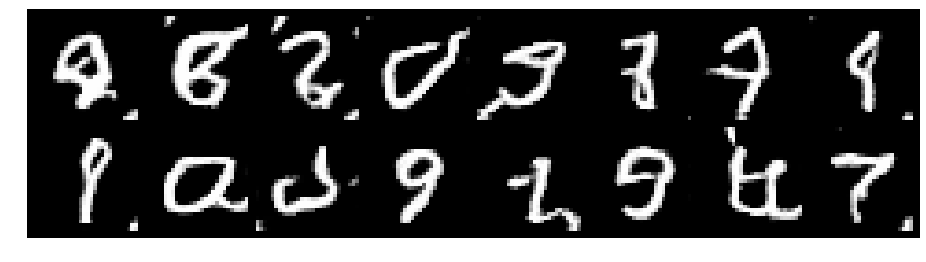

Epoch: [87/200], Batch Num: [400/600]
Discriminator Loss: 1.0435, Generator Loss: 0.9973
D(x): 0.6313, D(G(z)): 0.3518


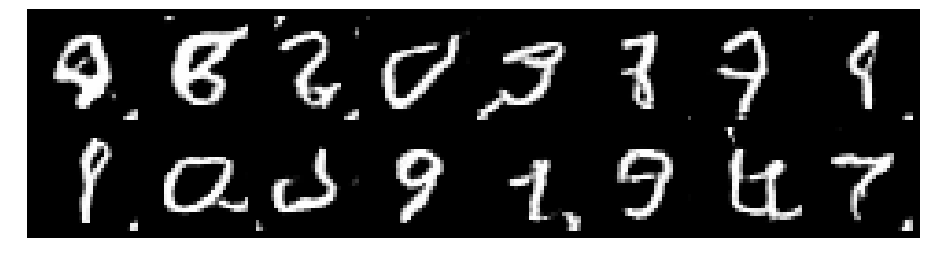

Epoch: [87/200], Batch Num: [500/600]
Discriminator Loss: 1.2061, Generator Loss: 1.0293
D(x): 0.5996, D(G(z)): 0.4104


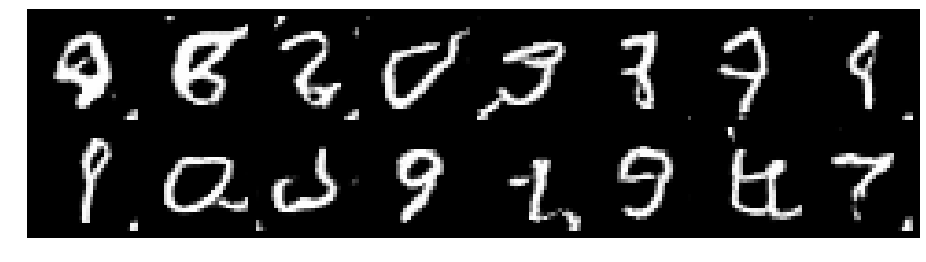

Epoch: [88/200], Batch Num: [0/600]
Discriminator Loss: 1.1398, Generator Loss: 1.0473
D(x): 0.6347, D(G(z)): 0.4147


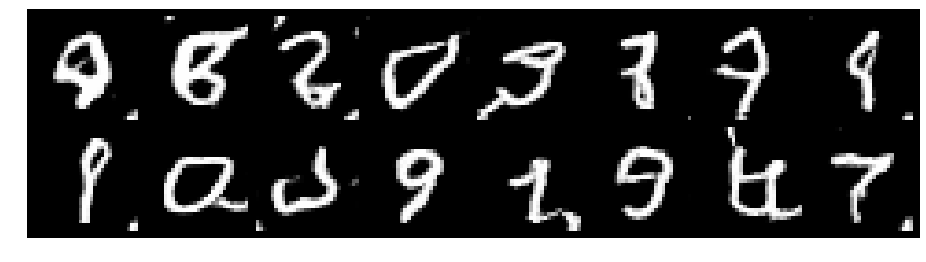

Epoch: [88/200], Batch Num: [100/600]
Discriminator Loss: 1.2520, Generator Loss: 1.0992
D(x): 0.5612, D(G(z)): 0.4086


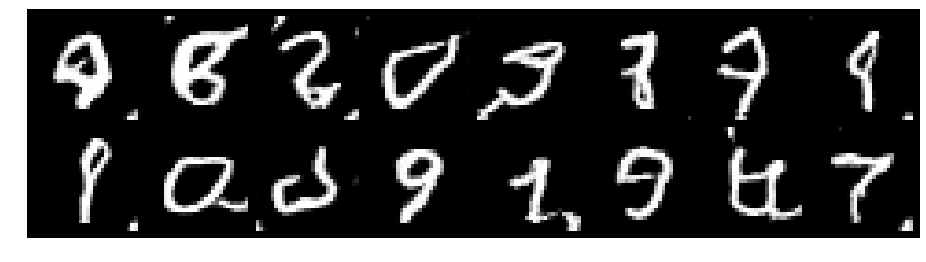

Epoch: [88/200], Batch Num: [200/600]
Discriminator Loss: 1.0655, Generator Loss: 1.0187
D(x): 0.6208, D(G(z)): 0.3671


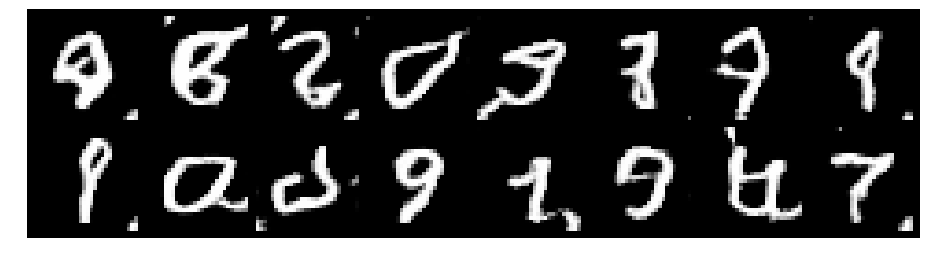

Epoch: [88/200], Batch Num: [300/600]
Discriminator Loss: 1.0328, Generator Loss: 1.0683
D(x): 0.6363, D(G(z)): 0.3685


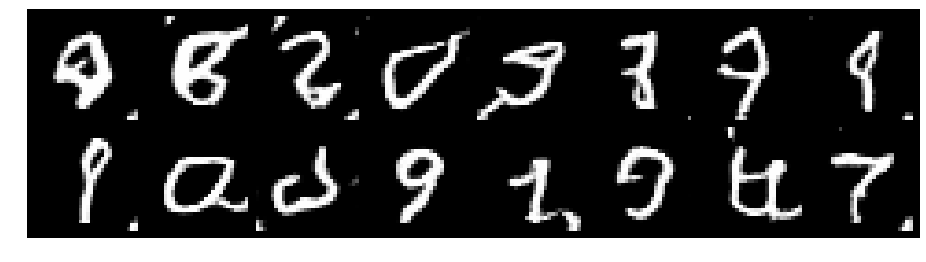

Epoch: [88/200], Batch Num: [400/600]
Discriminator Loss: 1.1617, Generator Loss: 1.0103
D(x): 0.6129, D(G(z)): 0.3890


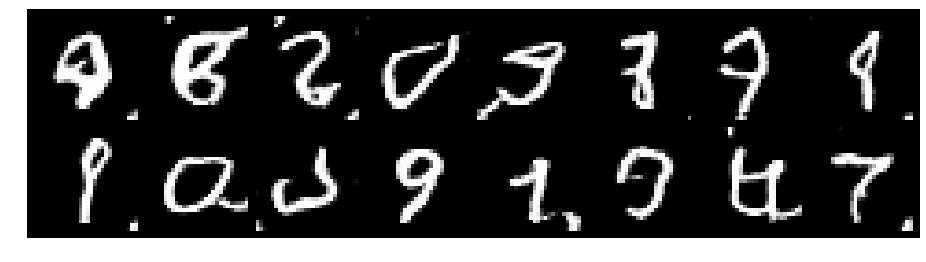

Epoch: [88/200], Batch Num: [500/600]
Discriminator Loss: 1.1709, Generator Loss: 1.0914
D(x): 0.6115, D(G(z)): 0.3805


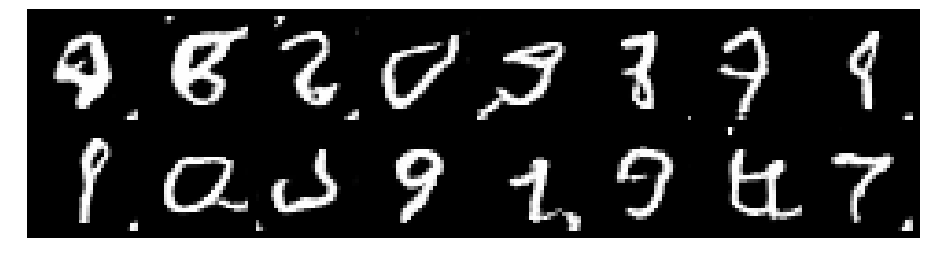

Epoch: [89/200], Batch Num: [0/600]
Discriminator Loss: 1.0178, Generator Loss: 1.1007
D(x): 0.6678, D(G(z)): 0.3884


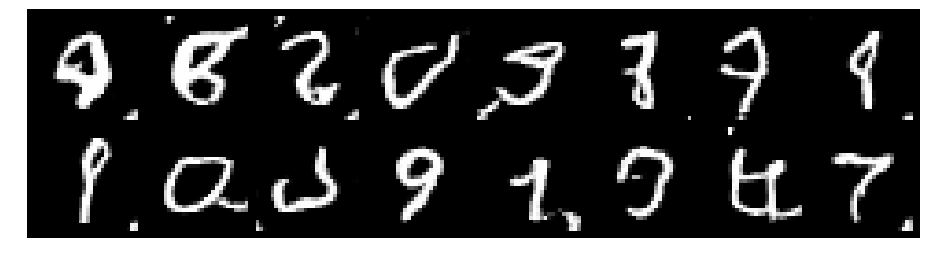

Epoch: [89/200], Batch Num: [100/600]
Discriminator Loss: 1.1062, Generator Loss: 1.0413
D(x): 0.6671, D(G(z)): 0.4332


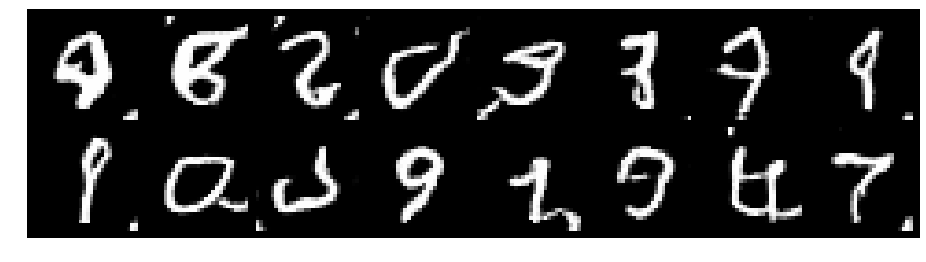

Epoch: [89/200], Batch Num: [200/600]
Discriminator Loss: 1.2298, Generator Loss: 1.0658
D(x): 0.5865, D(G(z)): 0.4112


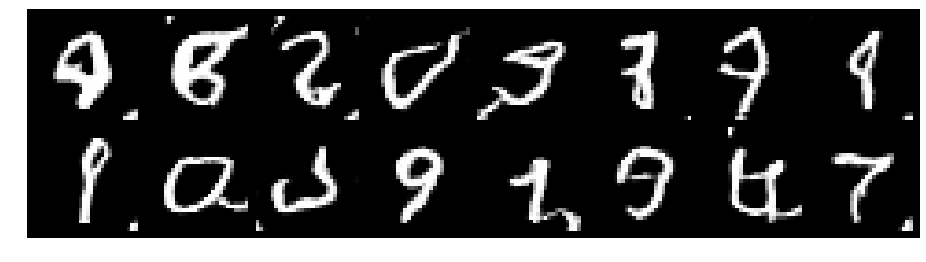

Epoch: [89/200], Batch Num: [300/600]
Discriminator Loss: 1.0746, Generator Loss: 1.1199
D(x): 0.6364, D(G(z)): 0.3765


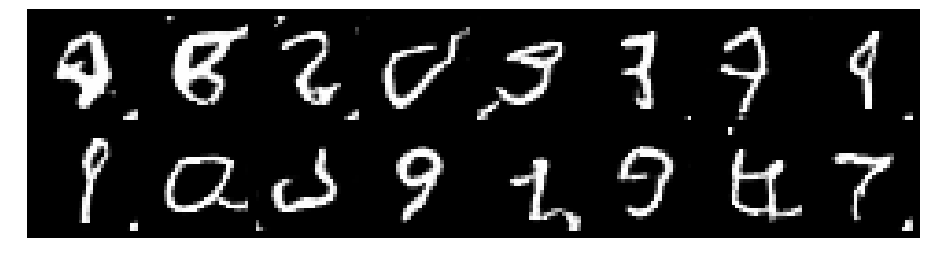

Epoch: [89/200], Batch Num: [400/600]
Discriminator Loss: 1.1505, Generator Loss: 1.1438
D(x): 0.5865, D(G(z)): 0.3708


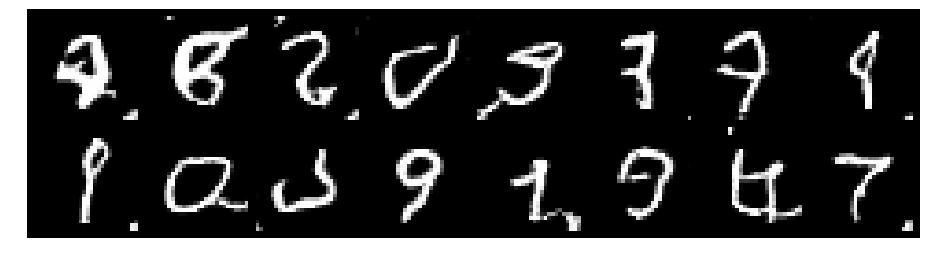

Epoch: [89/200], Batch Num: [500/600]
Discriminator Loss: 1.1524, Generator Loss: 1.1538
D(x): 0.5847, D(G(z)): 0.3539


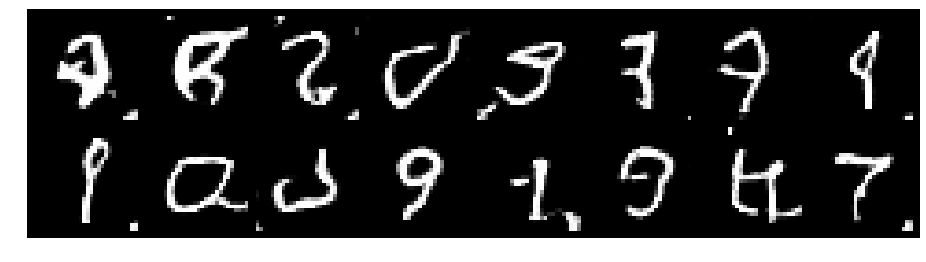

Epoch: [90/200], Batch Num: [0/600]
Discriminator Loss: 1.0572, Generator Loss: 1.1056
D(x): 0.6275, D(G(z)): 0.3769


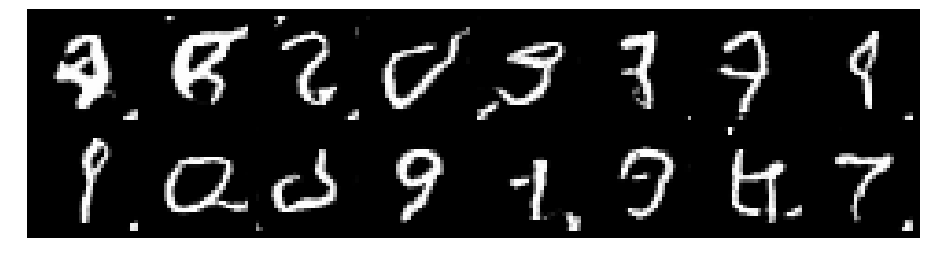

Epoch: [90/200], Batch Num: [100/600]
Discriminator Loss: 1.0490, Generator Loss: 1.1593
D(x): 0.6037, D(G(z)): 0.3396


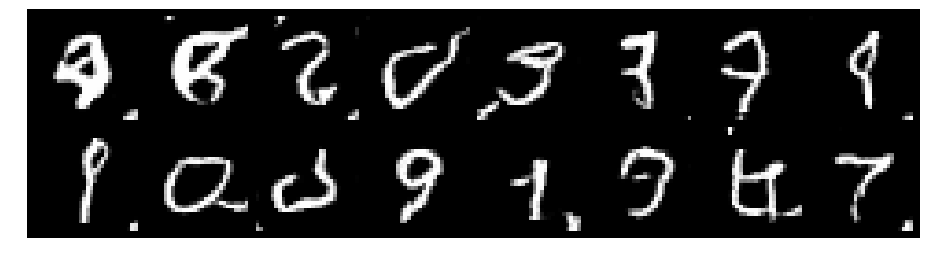

Epoch: [90/200], Batch Num: [200/600]
Discriminator Loss: 1.0475, Generator Loss: 0.9854
D(x): 0.6734, D(G(z)): 0.3998


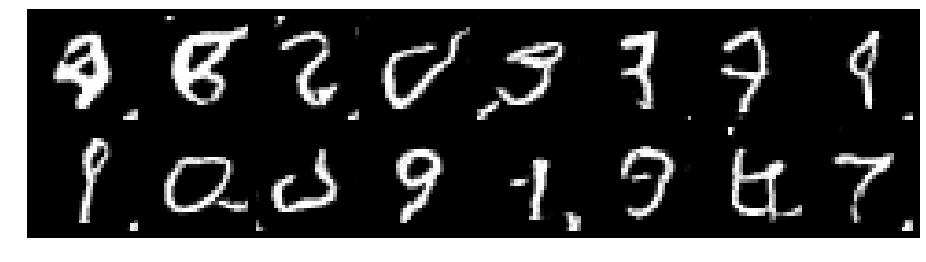

Epoch: [90/200], Batch Num: [300/600]
Discriminator Loss: 1.2267, Generator Loss: 1.1807
D(x): 0.5280, D(G(z)): 0.3506


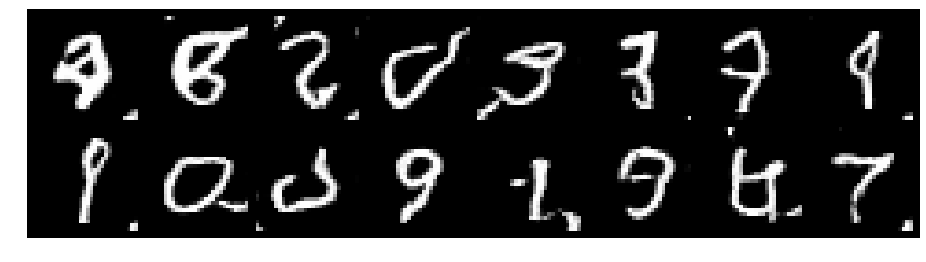

Epoch: [90/200], Batch Num: [400/600]
Discriminator Loss: 1.0191, Generator Loss: 1.0135
D(x): 0.6537, D(G(z)): 0.3685


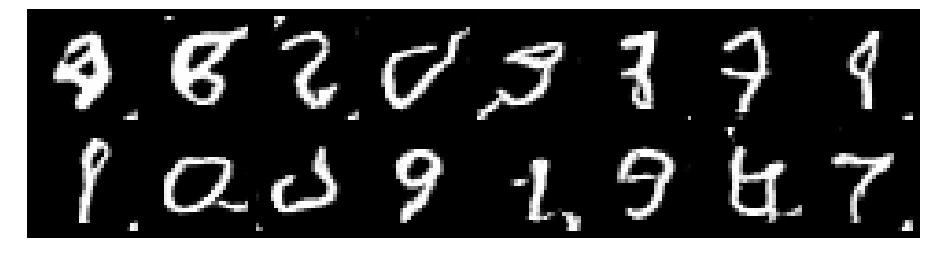

Epoch: [90/200], Batch Num: [500/600]
Discriminator Loss: 1.1474, Generator Loss: 1.0715
D(x): 0.6046, D(G(z)): 0.3755


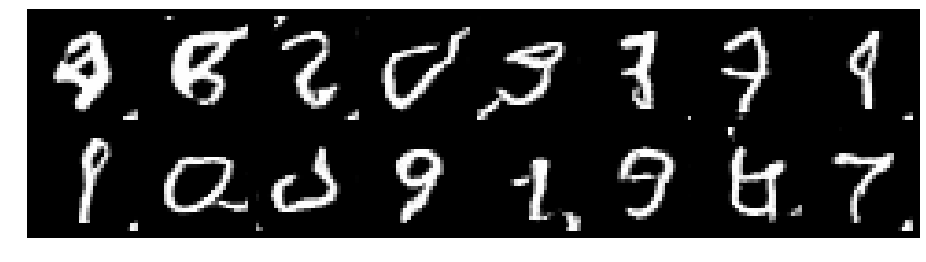

Epoch: [91/200], Batch Num: [0/600]
Discriminator Loss: 1.1261, Generator Loss: 1.0393
D(x): 0.6319, D(G(z)): 0.3990


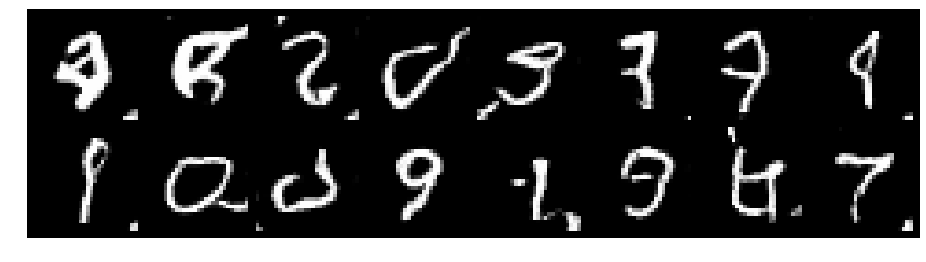

Epoch: [91/200], Batch Num: [100/600]
Discriminator Loss: 1.0892, Generator Loss: 1.0637
D(x): 0.6172, D(G(z)): 0.3761


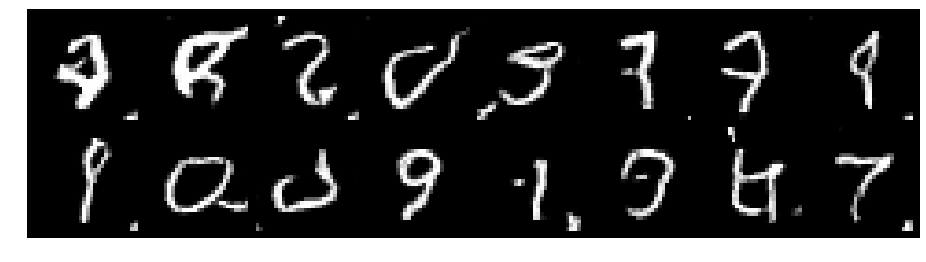

Epoch: [91/200], Batch Num: [200/600]
Discriminator Loss: 1.1833, Generator Loss: 1.0185
D(x): 0.6157, D(G(z)): 0.4114


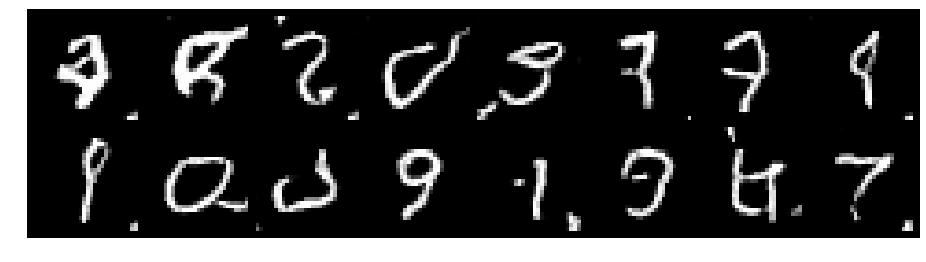

Epoch: [91/200], Batch Num: [300/600]
Discriminator Loss: 1.1770, Generator Loss: 1.1939
D(x): 0.5469, D(G(z)): 0.3385


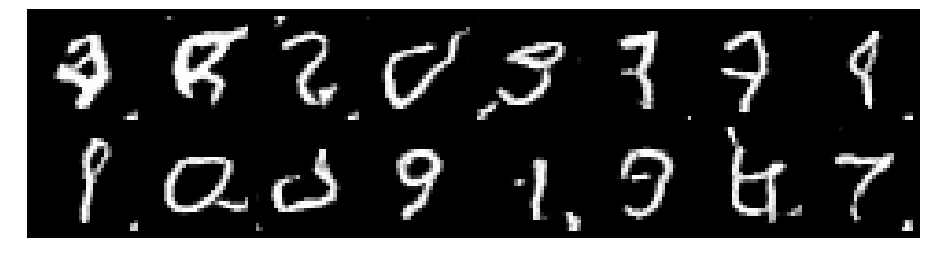

Epoch: [91/200], Batch Num: [400/600]
Discriminator Loss: 1.1295, Generator Loss: 1.0702
D(x): 0.5977, D(G(z)): 0.3816


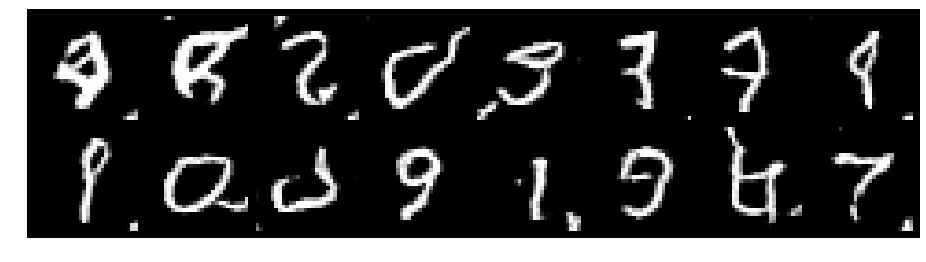

Epoch: [91/200], Batch Num: [500/600]
Discriminator Loss: 1.1385, Generator Loss: 1.1510
D(x): 0.5974, D(G(z)): 0.3739


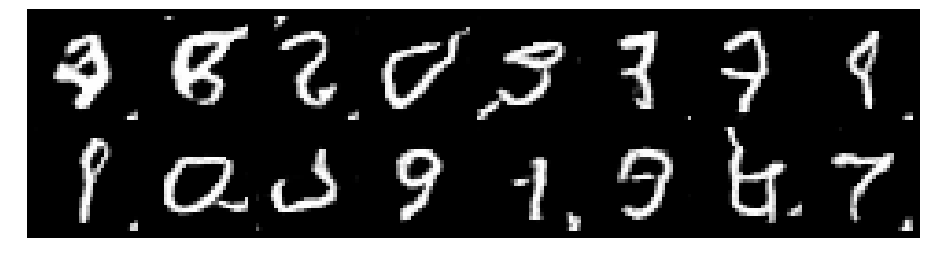

Epoch: [92/200], Batch Num: [0/600]
Discriminator Loss: 1.1314, Generator Loss: 1.1177
D(x): 0.6381, D(G(z)): 0.4204


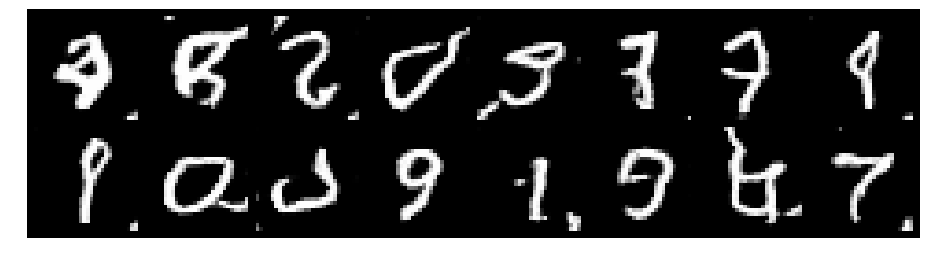

Epoch: [92/200], Batch Num: [100/600]
Discriminator Loss: 1.1458, Generator Loss: 0.9986
D(x): 0.6346, D(G(z)): 0.4097


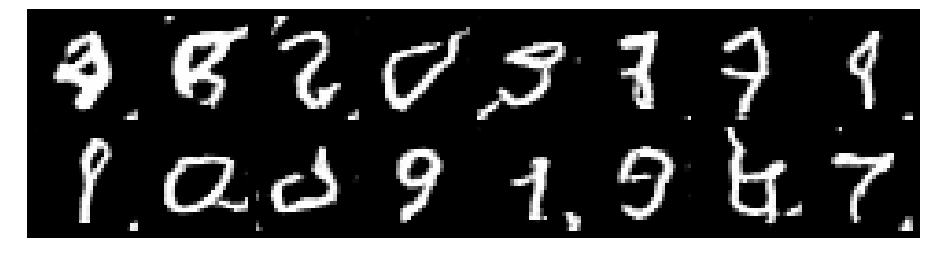

Epoch: [92/200], Batch Num: [200/600]
Discriminator Loss: 1.2115, Generator Loss: 1.0203
D(x): 0.5998, D(G(z)): 0.3948


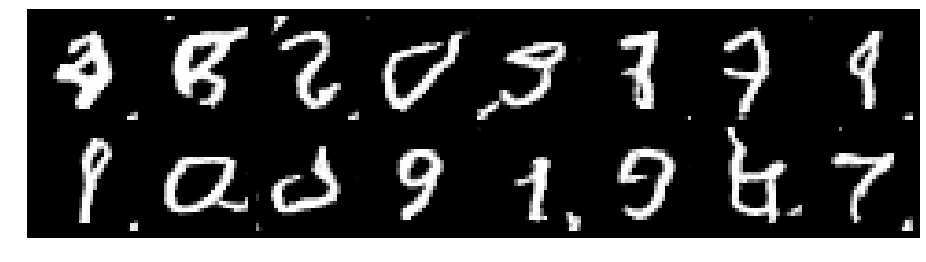

Epoch: [92/200], Batch Num: [300/600]
Discriminator Loss: 1.1466, Generator Loss: 1.0553
D(x): 0.6058, D(G(z)): 0.4035


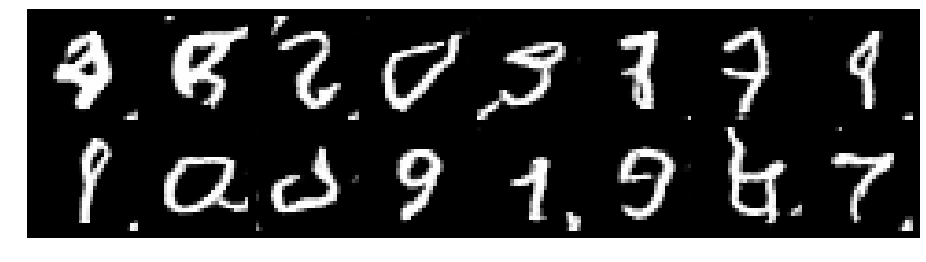

Epoch: [92/200], Batch Num: [400/600]
Discriminator Loss: 1.2298, Generator Loss: 1.0011
D(x): 0.5805, D(G(z)): 0.3980


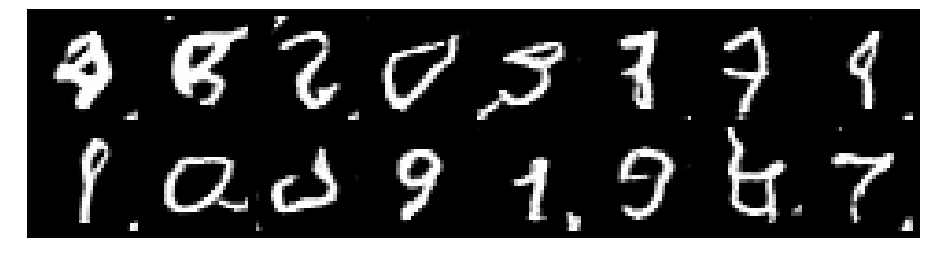

Epoch: [92/200], Batch Num: [500/600]
Discriminator Loss: 1.1032, Generator Loss: 1.0439
D(x): 0.6113, D(G(z)): 0.3713


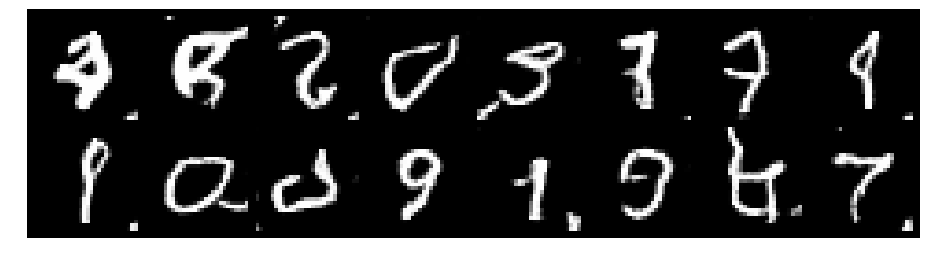

Epoch: [93/200], Batch Num: [0/600]
Discriminator Loss: 1.2036, Generator Loss: 1.0410
D(x): 0.6367, D(G(z)): 0.4349


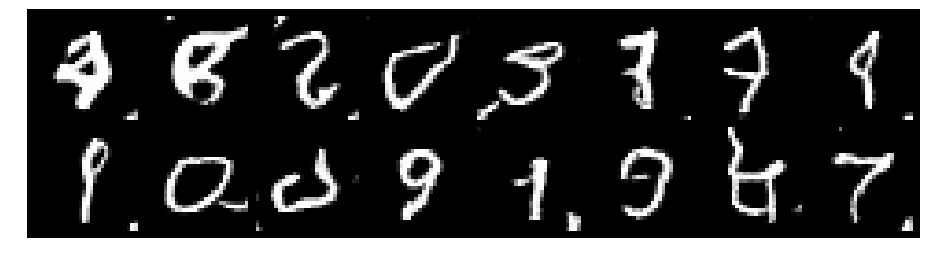

Epoch: [93/200], Batch Num: [100/600]
Discriminator Loss: 1.2412, Generator Loss: 1.0682
D(x): 0.6052, D(G(z)): 0.4115


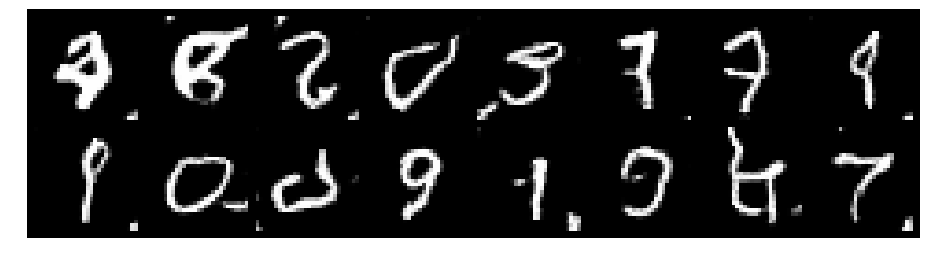

Epoch: [93/200], Batch Num: [200/600]
Discriminator Loss: 1.1785, Generator Loss: 1.1089
D(x): 0.6255, D(G(z)): 0.4258


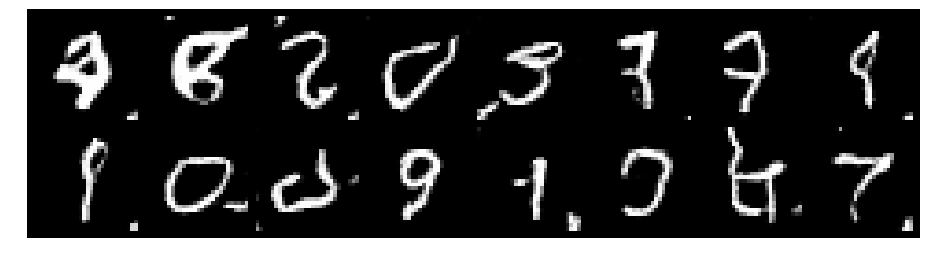

Epoch: [93/200], Batch Num: [300/600]
Discriminator Loss: 1.1153, Generator Loss: 1.1145
D(x): 0.6389, D(G(z)): 0.4131


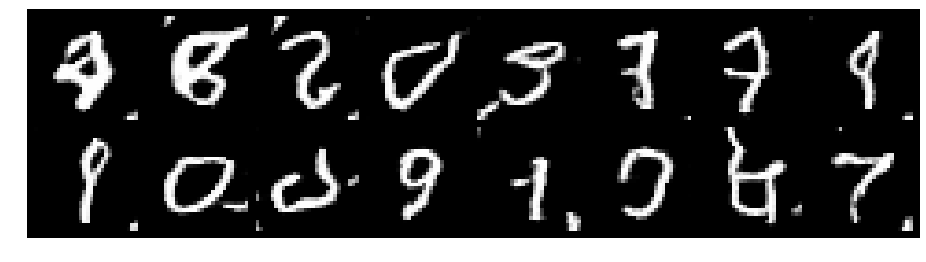

Epoch: [93/200], Batch Num: [400/600]
Discriminator Loss: 1.1537, Generator Loss: 1.0523
D(x): 0.5848, D(G(z)): 0.3820


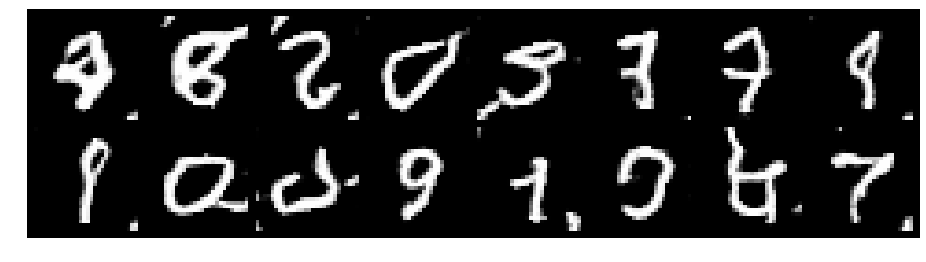

Epoch: [93/200], Batch Num: [500/600]
Discriminator Loss: 1.1577, Generator Loss: 0.9639
D(x): 0.6109, D(G(z)): 0.3988


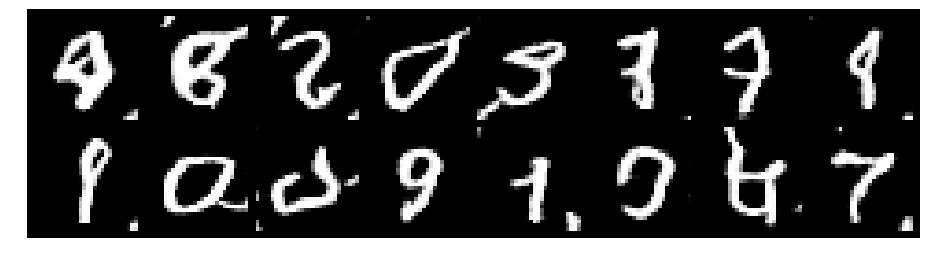

Epoch: [94/200], Batch Num: [0/600]
Discriminator Loss: 1.0136, Generator Loss: 1.0740
D(x): 0.6786, D(G(z)): 0.3886


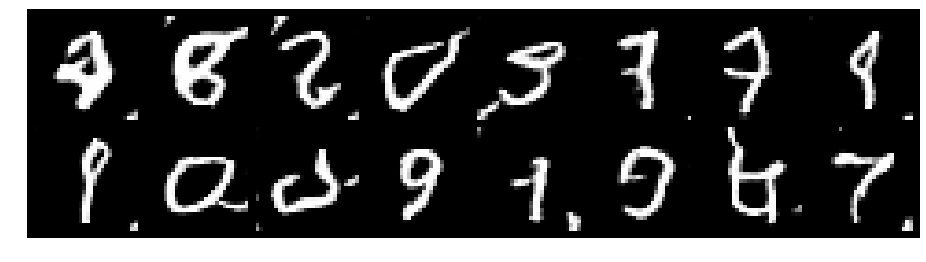

Epoch: [94/200], Batch Num: [100/600]
Discriminator Loss: 1.1124, Generator Loss: 1.0761
D(x): 0.6068, D(G(z)): 0.3730


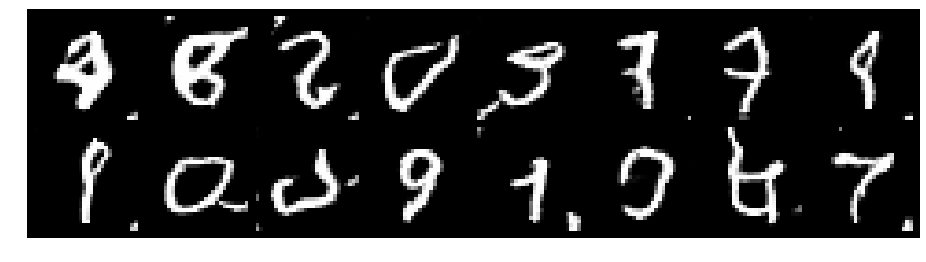

Epoch: [94/200], Batch Num: [200/600]
Discriminator Loss: 1.1398, Generator Loss: 1.1080
D(x): 0.5896, D(G(z)): 0.3655


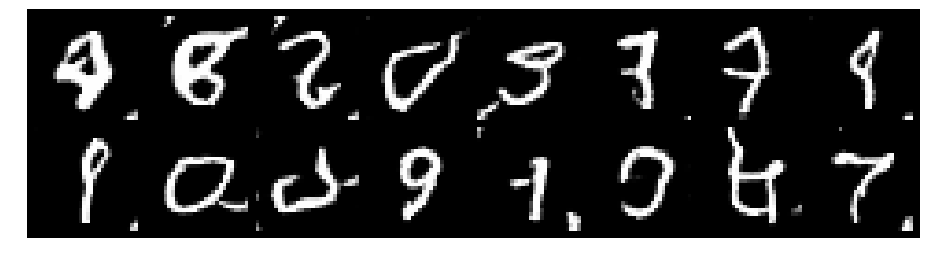

Epoch: [94/200], Batch Num: [300/600]
Discriminator Loss: 1.1134, Generator Loss: 1.1601
D(x): 0.6190, D(G(z)): 0.3871


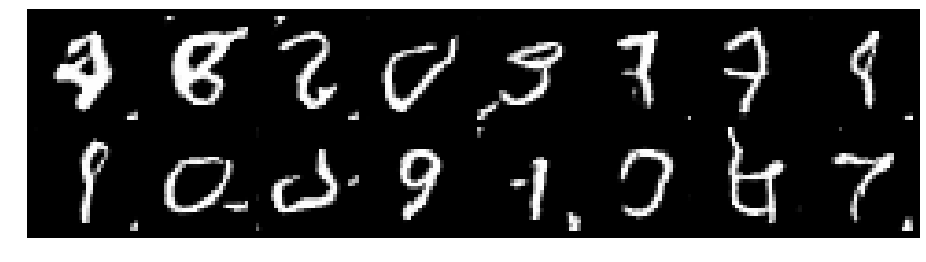

Epoch: [94/200], Batch Num: [400/600]
Discriminator Loss: 1.1879, Generator Loss: 1.0738
D(x): 0.6341, D(G(z)): 0.4319


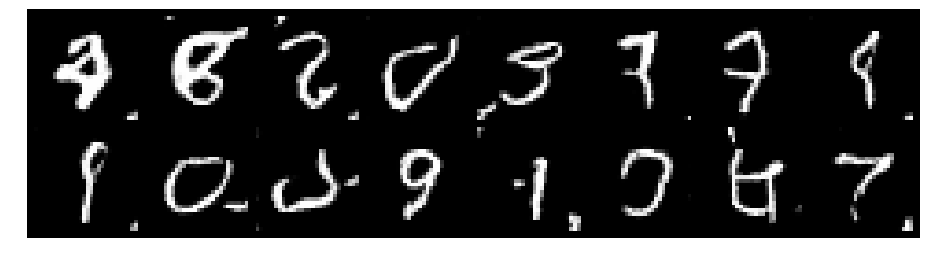

Epoch: [94/200], Batch Num: [500/600]
Discriminator Loss: 1.2582, Generator Loss: 1.0421
D(x): 0.5985, D(G(z)): 0.4233


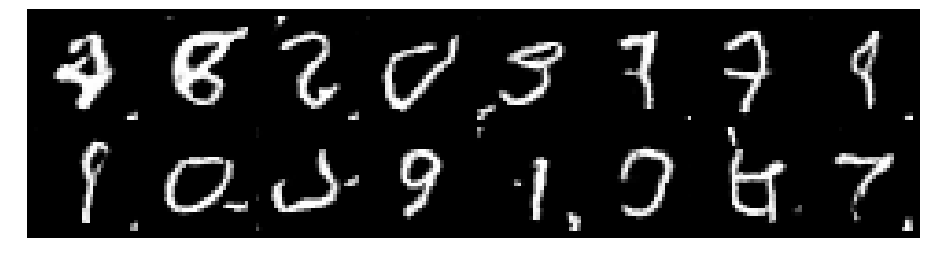

Epoch: [95/200], Batch Num: [0/600]
Discriminator Loss: 1.1071, Generator Loss: 1.2280
D(x): 0.6205, D(G(z)): 0.3706


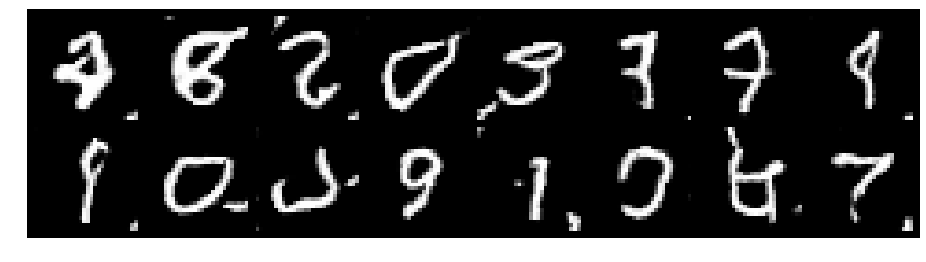

Epoch: [95/200], Batch Num: [100/600]
Discriminator Loss: 1.1816, Generator Loss: 1.0017
D(x): 0.5918, D(G(z)): 0.3901


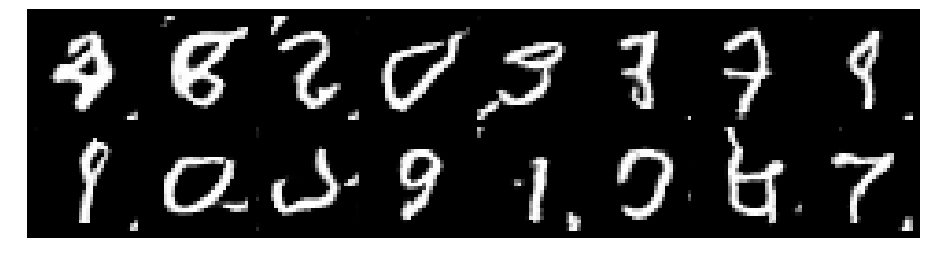

Epoch: [95/200], Batch Num: [200/600]
Discriminator Loss: 1.1029, Generator Loss: 1.0358
D(x): 0.6445, D(G(z)): 0.4139


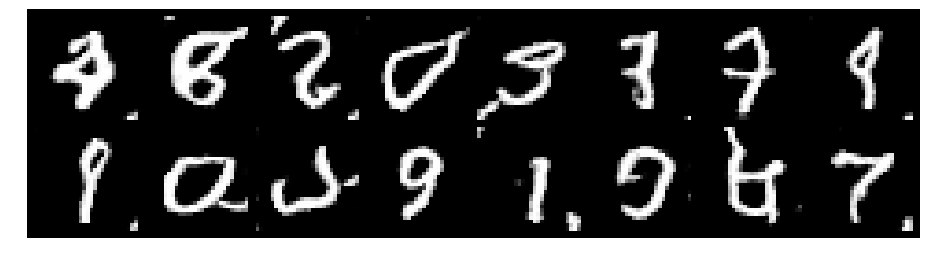

Epoch: [95/200], Batch Num: [300/600]
Discriminator Loss: 1.1670, Generator Loss: 1.0628
D(x): 0.6073, D(G(z)): 0.4052


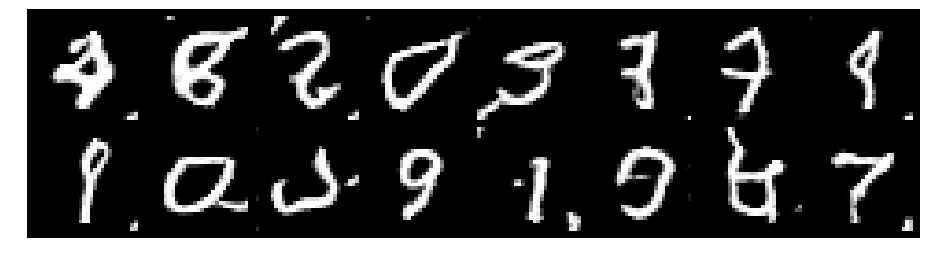

Epoch: [95/200], Batch Num: [400/600]
Discriminator Loss: 1.1118, Generator Loss: 1.0537
D(x): 0.6262, D(G(z)): 0.3897


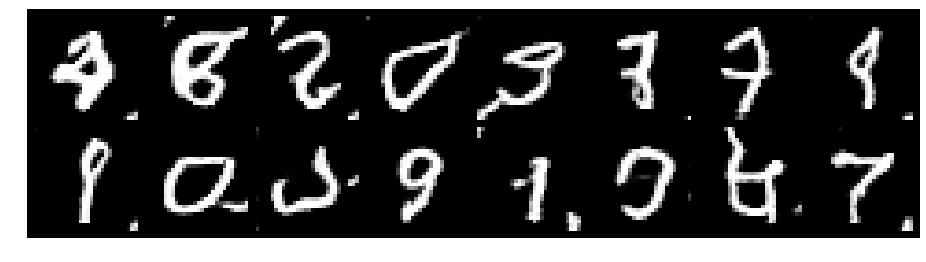

Epoch: [95/200], Batch Num: [500/600]
Discriminator Loss: 1.2698, Generator Loss: 0.9980
D(x): 0.5879, D(G(z)): 0.4425


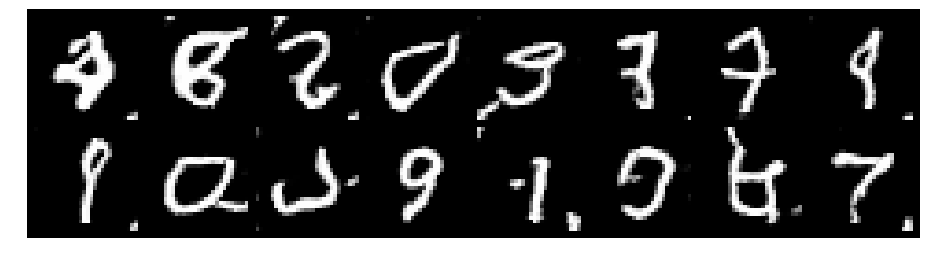

Epoch: [96/200], Batch Num: [0/600]
Discriminator Loss: 1.1764, Generator Loss: 0.9111
D(x): 0.6064, D(G(z)): 0.4171


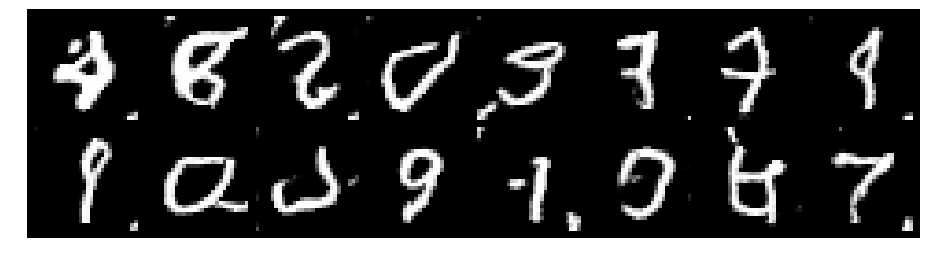

Epoch: [96/200], Batch Num: [100/600]
Discriminator Loss: 1.0731, Generator Loss: 1.1582
D(x): 0.6358, D(G(z)): 0.3981


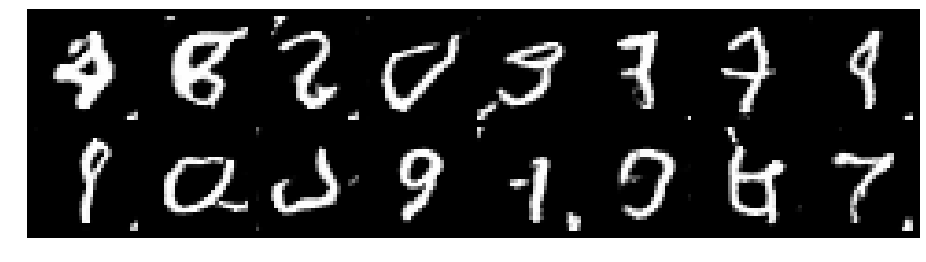

Epoch: [96/200], Batch Num: [200/600]
Discriminator Loss: 1.0599, Generator Loss: 0.9738
D(x): 0.6539, D(G(z)): 0.4055


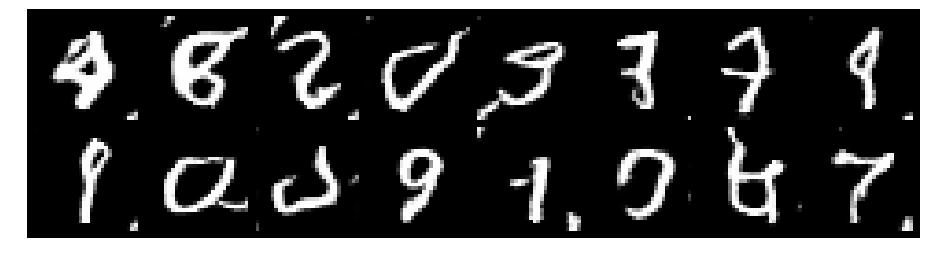

Epoch: [96/200], Batch Num: [300/600]
Discriminator Loss: 1.1592, Generator Loss: 0.9520
D(x): 0.6105, D(G(z)): 0.3973


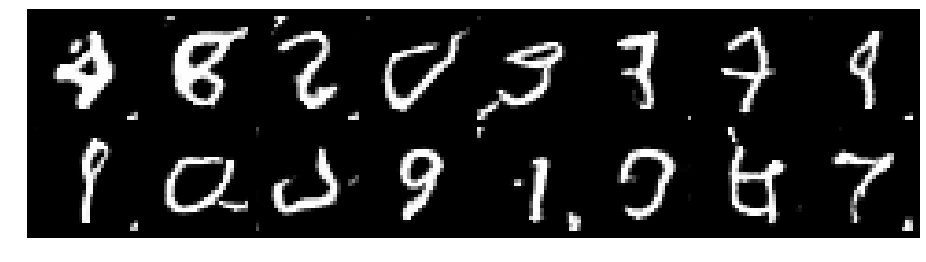

Epoch: [96/200], Batch Num: [400/600]
Discriminator Loss: 1.1547, Generator Loss: 1.0134
D(x): 0.6004, D(G(z)): 0.4005


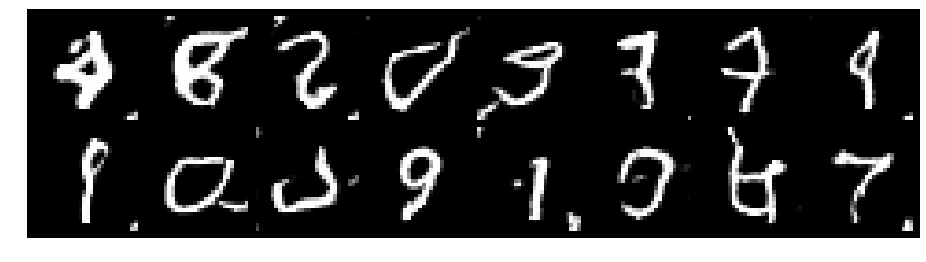

Epoch: [96/200], Batch Num: [500/600]
Discriminator Loss: 1.0663, Generator Loss: 1.1443
D(x): 0.6551, D(G(z)): 0.3828


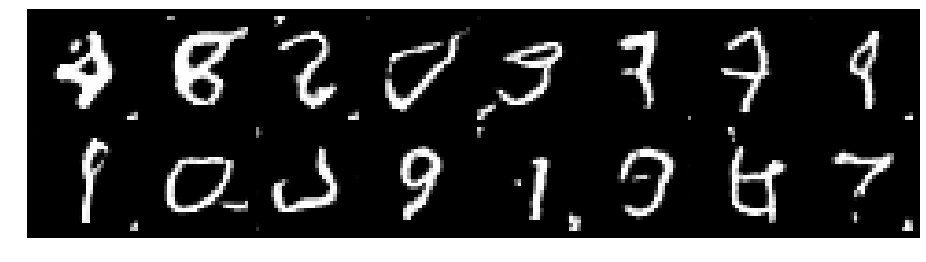

Epoch: [97/200], Batch Num: [0/600]
Discriminator Loss: 1.0576, Generator Loss: 1.0701
D(x): 0.6254, D(G(z)): 0.3644


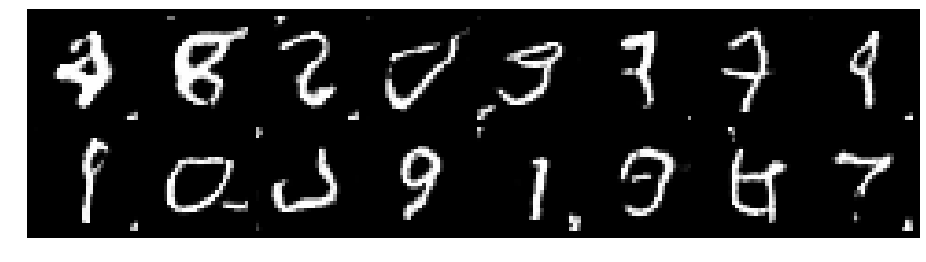

Epoch: [97/200], Batch Num: [100/600]
Discriminator Loss: 1.2447, Generator Loss: 1.1801
D(x): 0.6328, D(G(z)): 0.4591


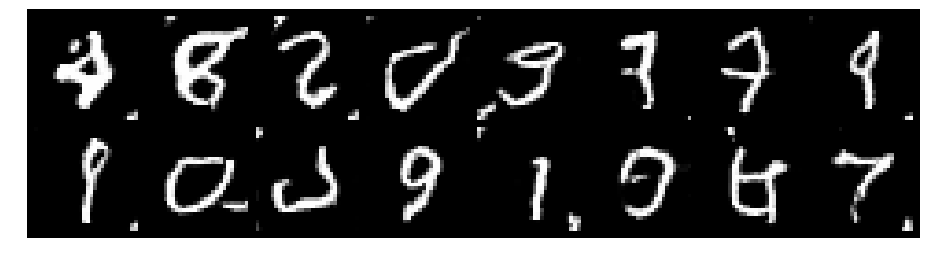

Epoch: [97/200], Batch Num: [200/600]
Discriminator Loss: 1.1885, Generator Loss: 1.0614
D(x): 0.5964, D(G(z)): 0.4019


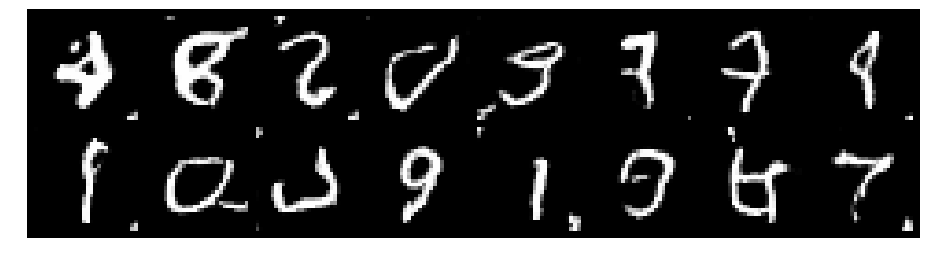

Epoch: [97/200], Batch Num: [300/600]
Discriminator Loss: 1.1966, Generator Loss: 1.1581
D(x): 0.5722, D(G(z)): 0.3653


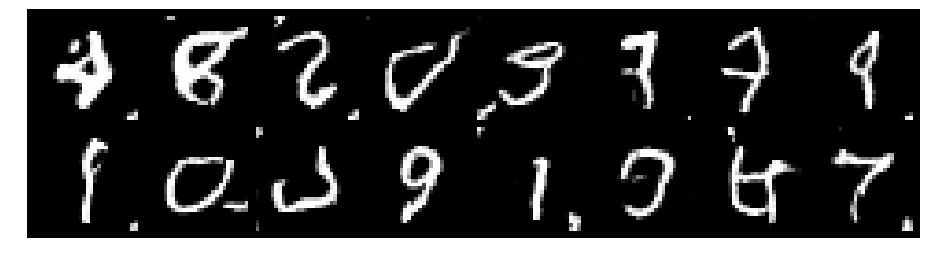

Epoch: [97/200], Batch Num: [400/600]
Discriminator Loss: 1.1323, Generator Loss: 1.1197
D(x): 0.6070, D(G(z)): 0.3736


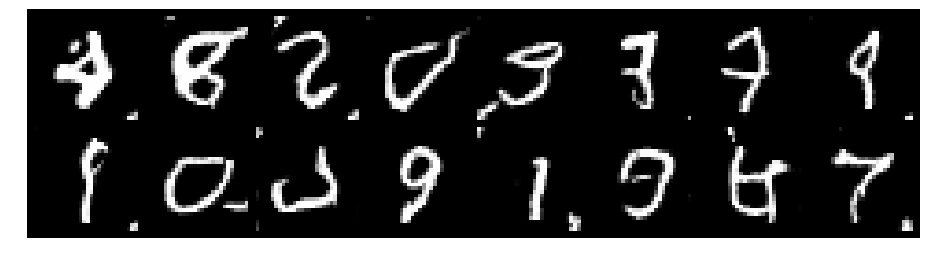

Epoch: [97/200], Batch Num: [500/600]
Discriminator Loss: 1.0997, Generator Loss: 0.9687
D(x): 0.6425, D(G(z)): 0.3986


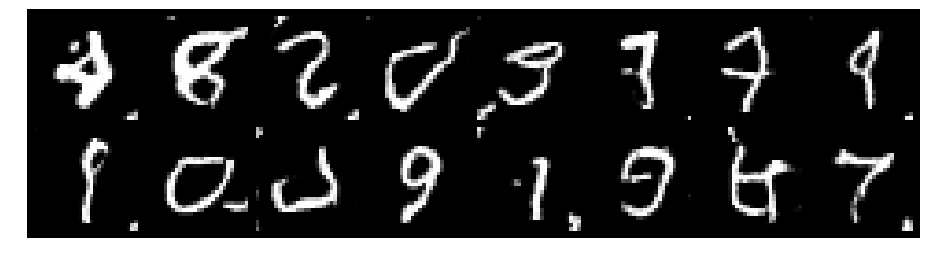

Epoch: [98/200], Batch Num: [0/600]
Discriminator Loss: 1.1424, Generator Loss: 1.0156
D(x): 0.6050, D(G(z)): 0.3686


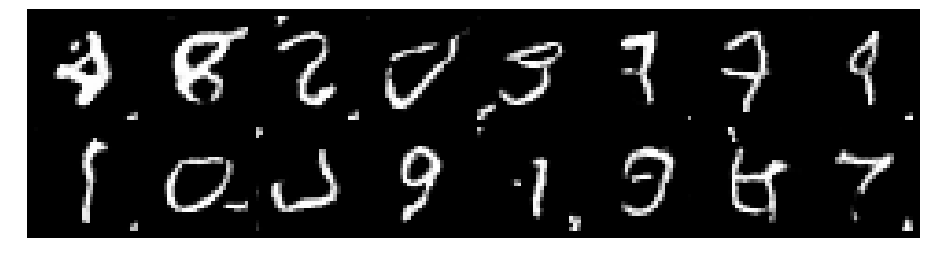

Epoch: [98/200], Batch Num: [100/600]
Discriminator Loss: 1.0271, Generator Loss: 1.0945
D(x): 0.6224, D(G(z)): 0.3624


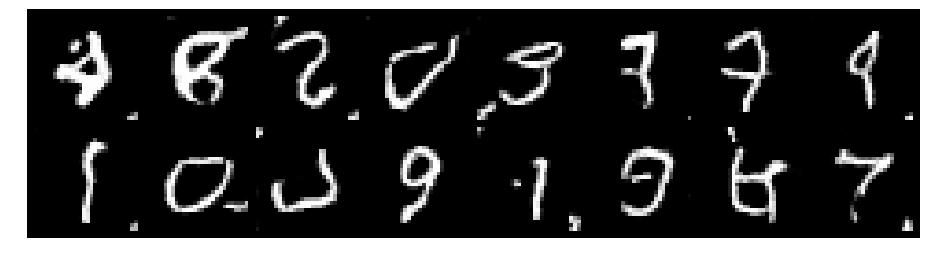

Epoch: [98/200], Batch Num: [200/600]
Discriminator Loss: 1.0974, Generator Loss: 1.0177
D(x): 0.6740, D(G(z)): 0.4198


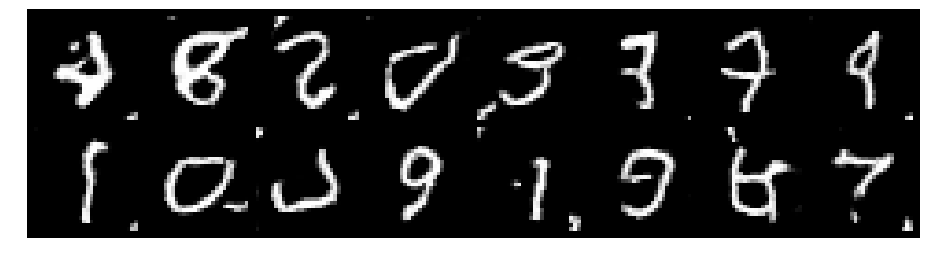

Epoch: [98/200], Batch Num: [300/600]
Discriminator Loss: 1.1400, Generator Loss: 1.0241
D(x): 0.5981, D(G(z)): 0.3882


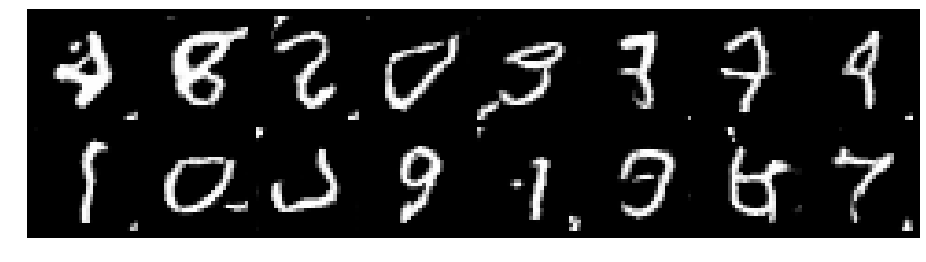

Epoch: [98/200], Batch Num: [400/600]
Discriminator Loss: 1.1804, Generator Loss: 1.1719
D(x): 0.6079, D(G(z)): 0.3912


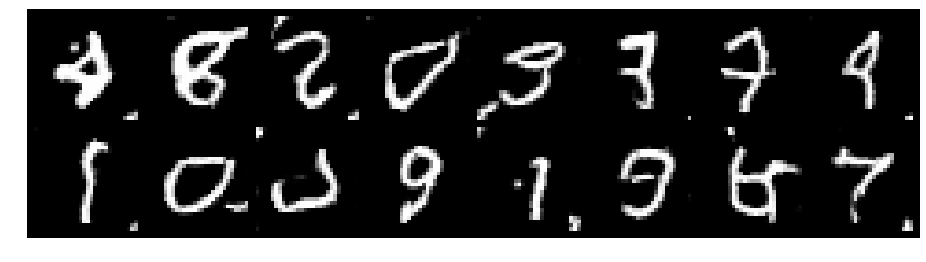

Epoch: [98/200], Batch Num: [500/600]
Discriminator Loss: 1.0766, Generator Loss: 1.0528
D(x): 0.6389, D(G(z)): 0.3915


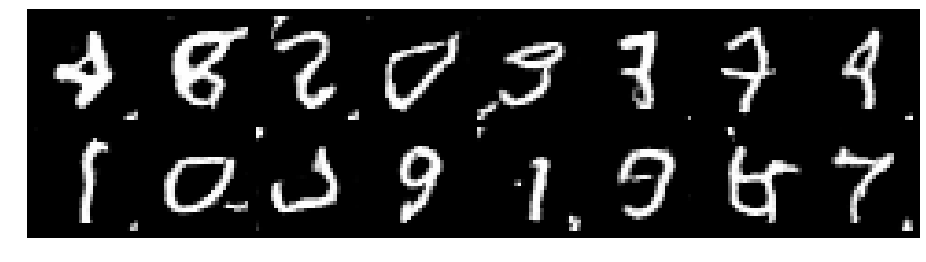

Epoch: [99/200], Batch Num: [0/600]
Discriminator Loss: 1.0927, Generator Loss: 1.0551
D(x): 0.6378, D(G(z)): 0.3925


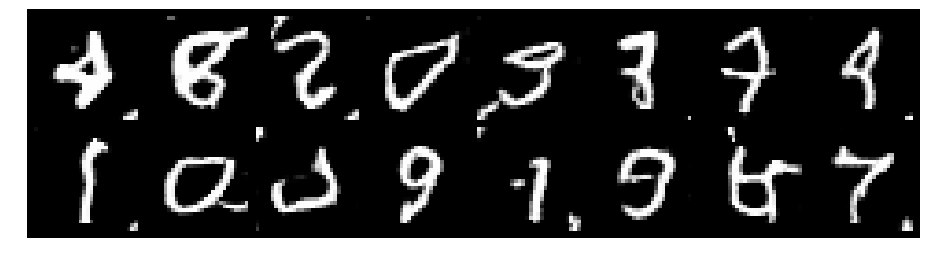

Epoch: [99/200], Batch Num: [100/600]
Discriminator Loss: 1.1953, Generator Loss: 1.1318
D(x): 0.5793, D(G(z)): 0.3925


In [ ]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='FashionMNIST')

# Total number of epochs to train
num_epochs = 200

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        # this will be 100 since batch_size is 100 as defined earlier
        N = real_batch.size(0)

        # 1. Train Discriminator
        # real_data = Variable(images_to_vectors(real_batch))
        real_data = Variable(real_batch) # don't switch this time

        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()

        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator

        # Generate fake data
        fake_data = generator(noise(N)) 

        # Train G
        g_error = train_generator(g_optimizer, fake_data)

        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)

        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data

            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )